In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch

from generators import TopNGenerator
from modules import MLPEncoder, MLPDecoder, TransformerEncoder, TransformerDecoder, GeneratorMLP
from orbit_dataset import get_datasets

from model import AutoEncoderModel
from utils import ChamferLoss, HungarianLoss, HungarianLossCustom, ChamferLossWeighted, HungarianLossDimensionMatching

from torch.optim import Adam

from torch.nn import CrossEntropyLoss, MSELoss

In [2]:
dataset_train, dataset_test, dataloader_train, dataloader_test, n_max = get_datasets(1000, 64, 3500, 1500)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


  0%|          | 0/5000 [00:00<?, ?it/s]

In [5]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

n_epochs = 60
lr = 0.001
dim_input = 3

#criterion_chamfer = ChamferLossWeighted()
criterion_hungarian = HungarianLoss()
#criterion_hungarian = HungarianLossCustom(use_weight=True, distance_penalty=5)
#criterion_hungarian = HungarianLossDimensionMatching()
#sinkhorn = SinkhornDistance(eps=0.1, max_iter=100, reduction=None)

# model init
encoder = MLPEncoder(n_in=dim_input, n_hidden=16, n_out=8, num_layers=2)
decoder = MLPDecoder(n_in=8, n_hidden=16, n_out=3*n_max, num_layers=2, set_channels=3)

#encoder = TransformerEncoder(n_in=dim_input, embed_dim=32, fc_dim=64, num_heads=2, num_layers=3, n_out_enc=8)

#generator = TopNGenerator(set_channels=4, cosine_channels=4, max_n=n_max + 20, latent_dim=8)

#decoder = GeneratorMLP(n_in=4, n_hidden=16, n_out=4, num_layers=2, generator=generator)

#decoder = TransformerDecoder(n_in=3, latent_dim=8, fc_dim=64, num_heads=2, num_layers=3, n_out=3, generator=generator,
#                            n_out_lin=16, n_hidden=32, num_layers_lin=2)

model = AutoEncoderModel(encoder, decoder).to(device)
optimizer = Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, min_lr=1e-6)

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 7.2074861526 6.8899908066


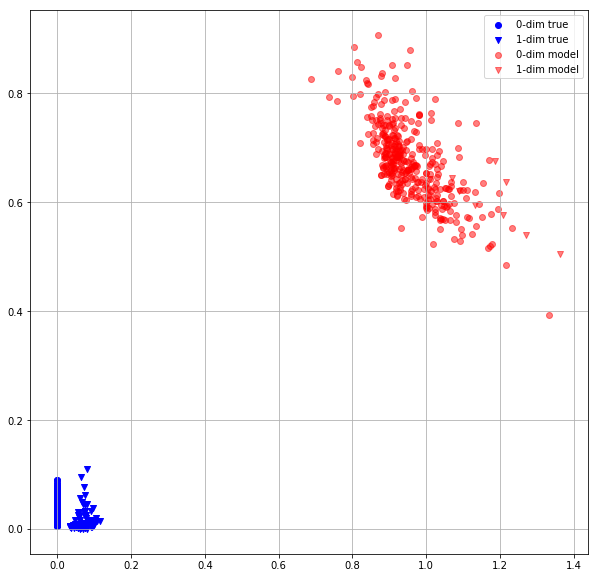

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 6.6912631989 6.5015110970


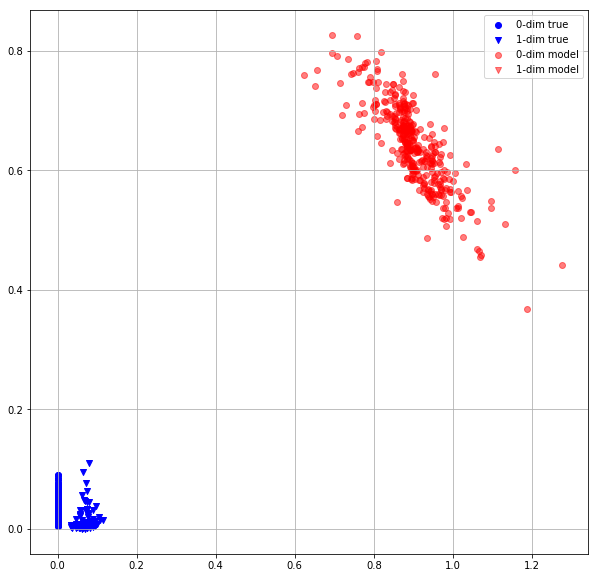

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 6.3046607971 6.0291304588


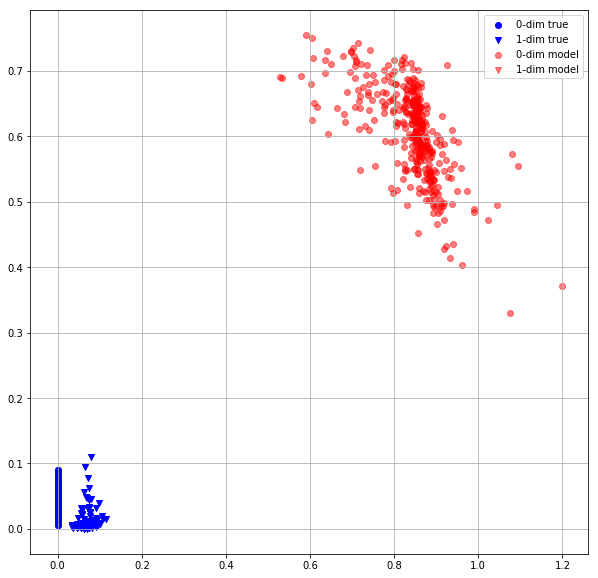

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 5.8285350800 5.5590038300


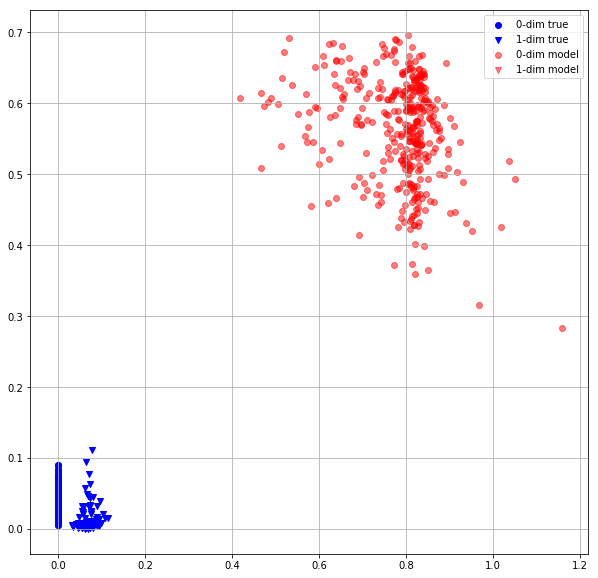

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 5.3518171310 5.1101655960


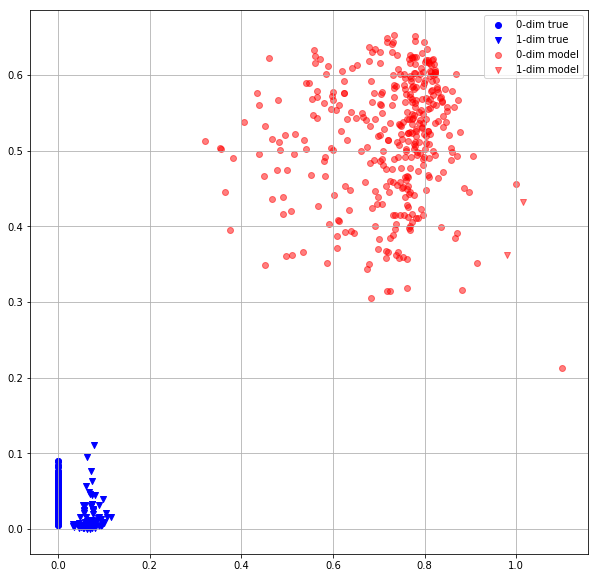

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 4.9423632622 4.7401051521


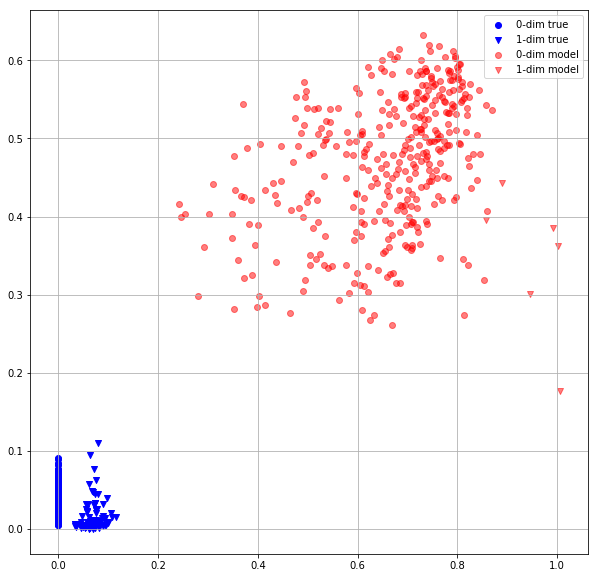

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 4.5920805931 4.4080491066


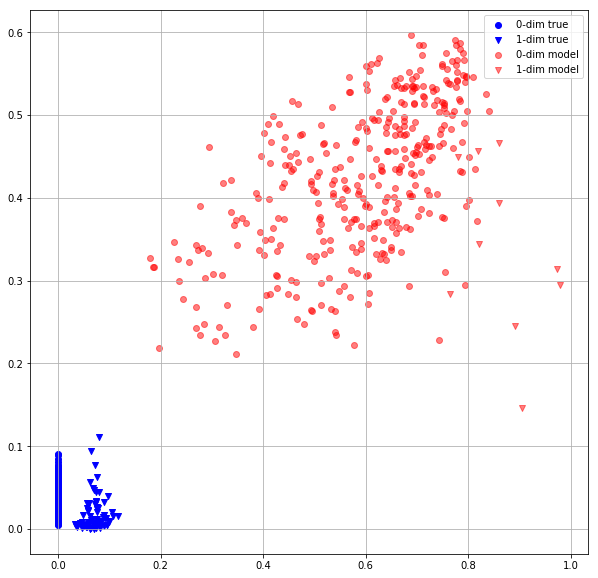

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 4.2554359436 4.0710725784


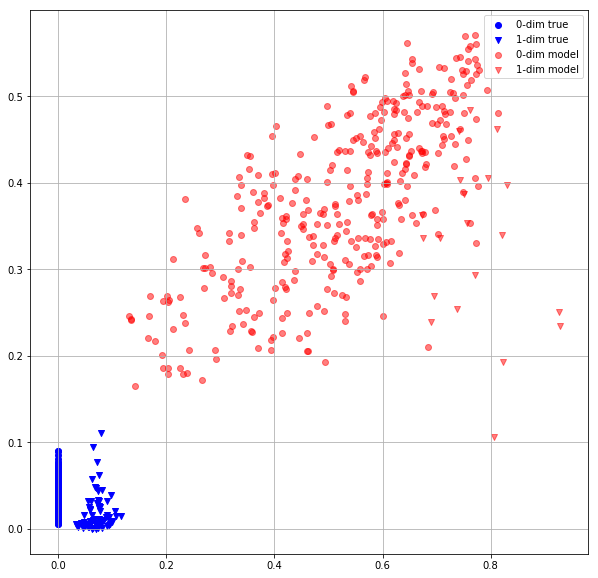

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 3.9204039574 3.7377965450


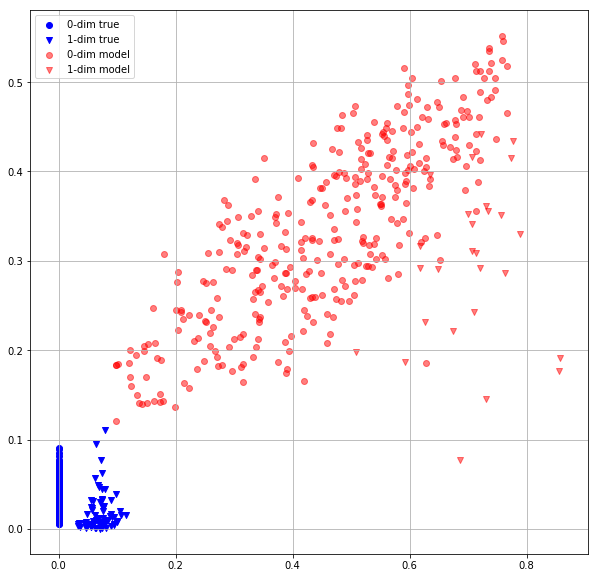

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 3.5922033787 3.4318301678


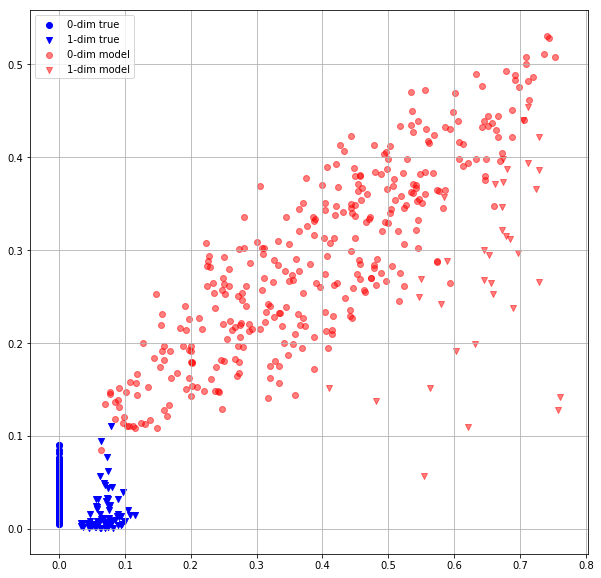

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 3.2942650318 3.1510732174


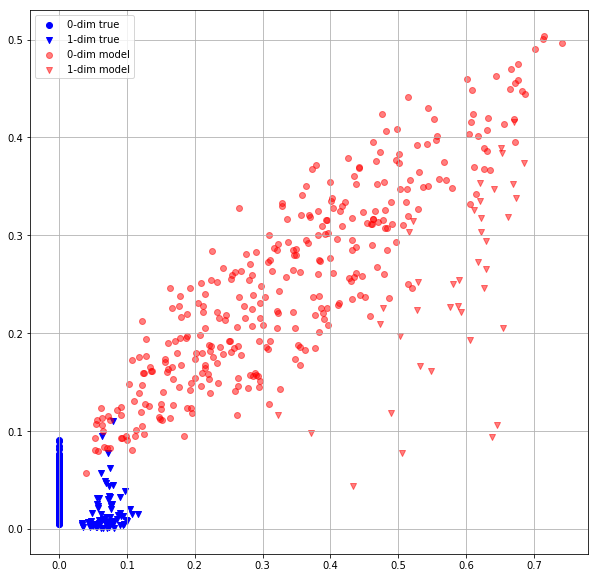

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 3.0398769379 2.8936724663


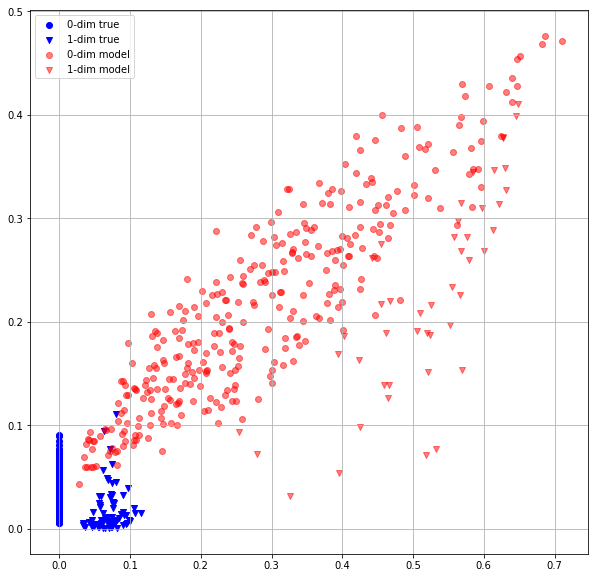

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 2.7920639515 2.6563928127


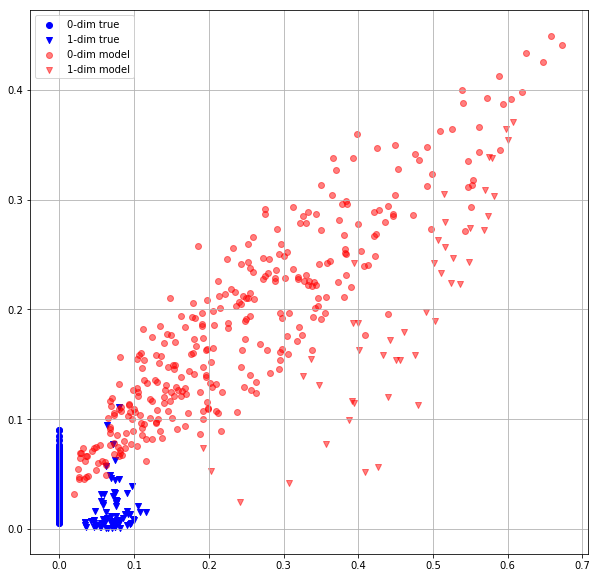

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 2.5570085049 2.4449055195


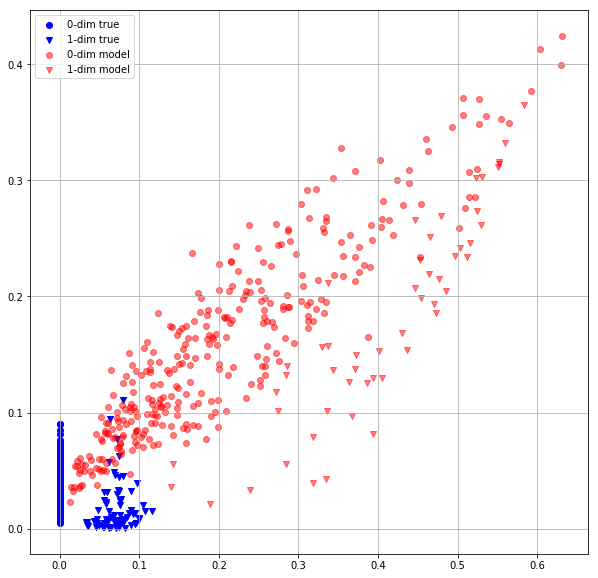

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 2.3840994835 2.3056795597


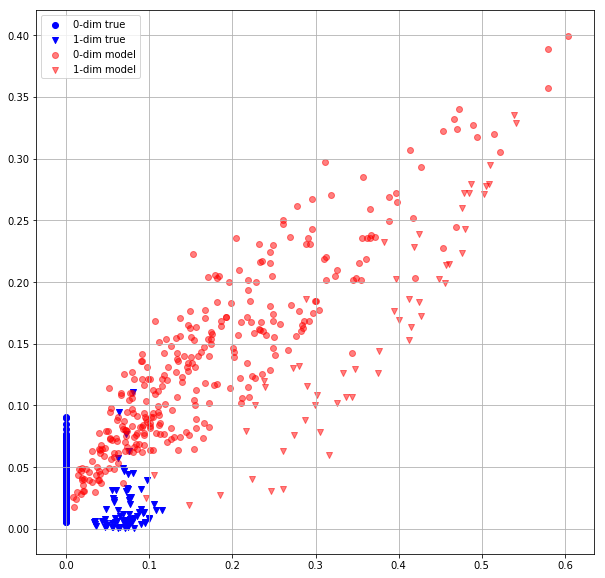

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 2.2383966446 2.1646370888


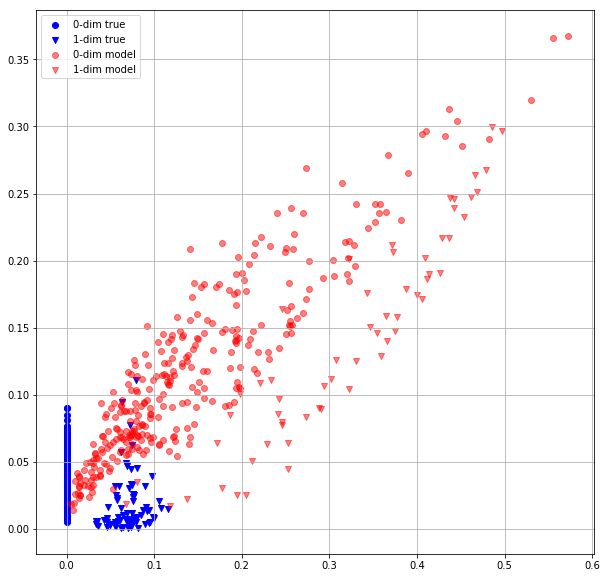

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 2.1190056801 2.0771381855


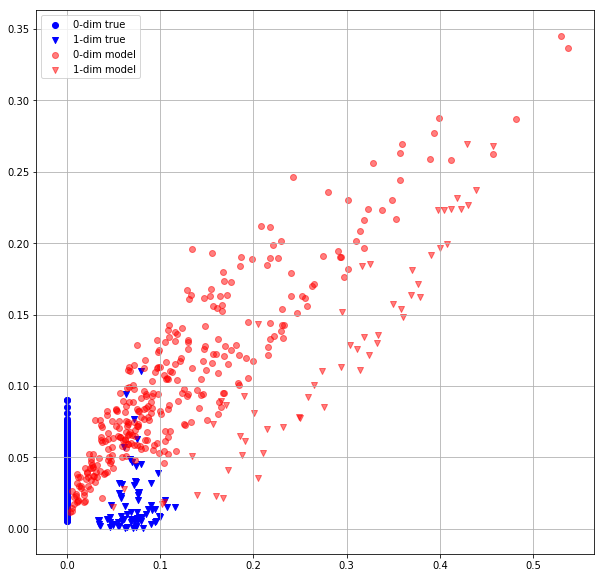

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 2.0418334007 1.9711378813


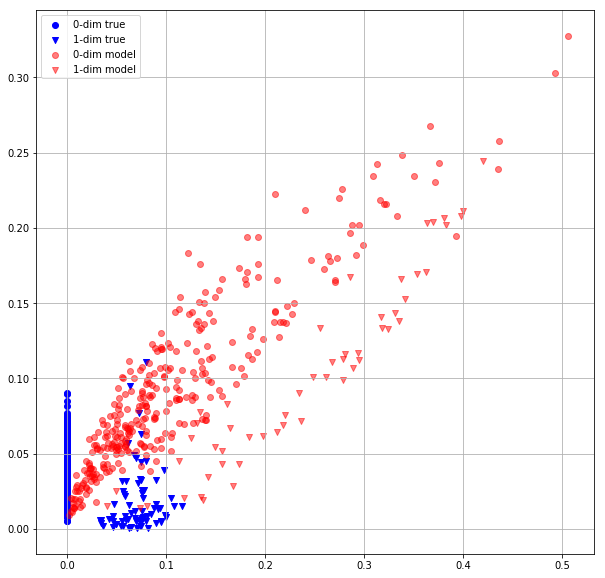

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 1.9196712971 1.8450263739


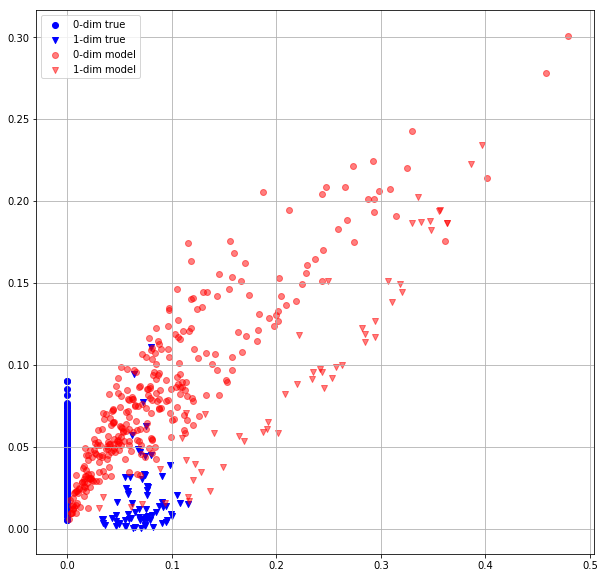

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 1.8026711941 1.7560952902


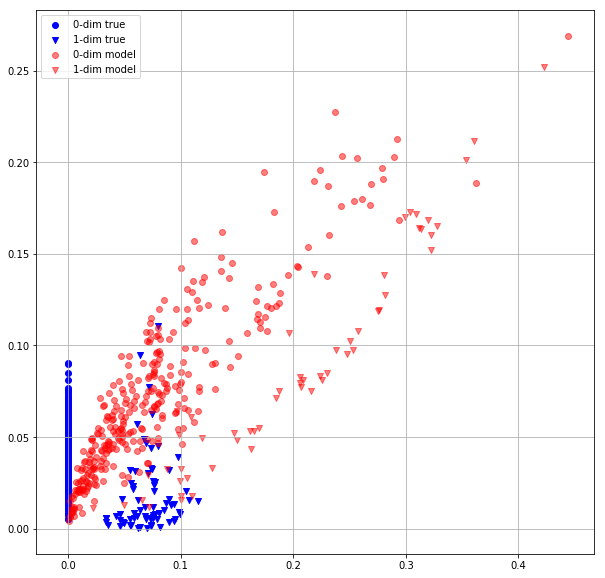

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 1.7230900526 1.7428567410


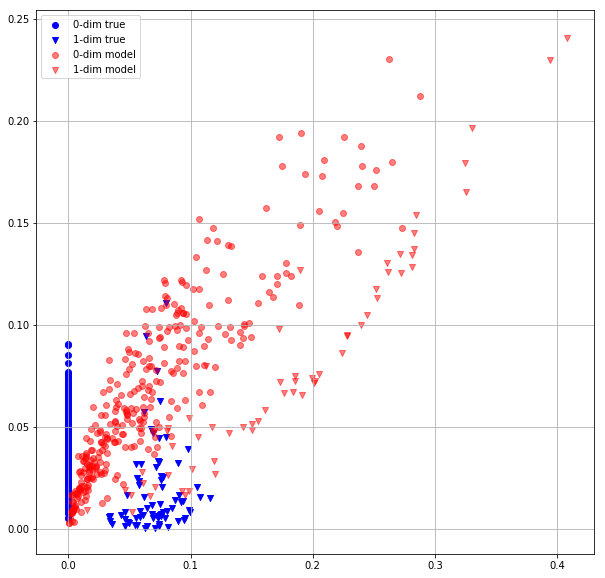

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 1.7751717567 1.8012187481


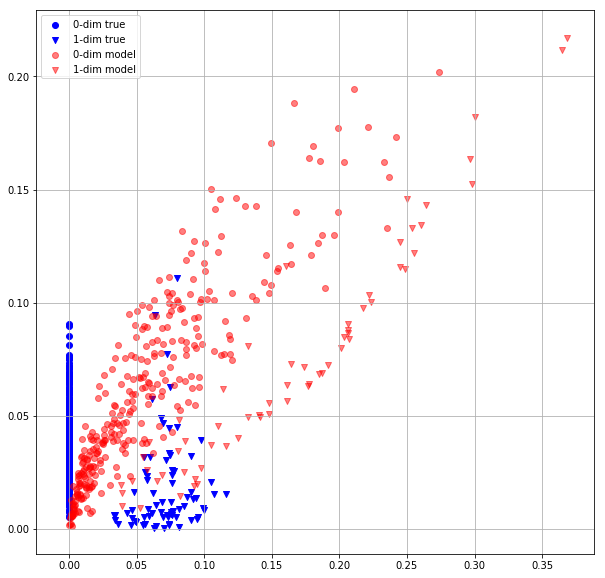

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 1.7607940435 1.7125920057


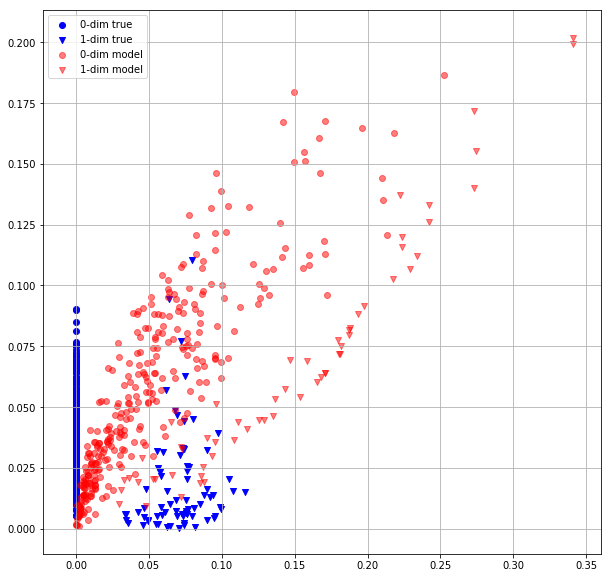

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 1.6761993170 1.6523815393


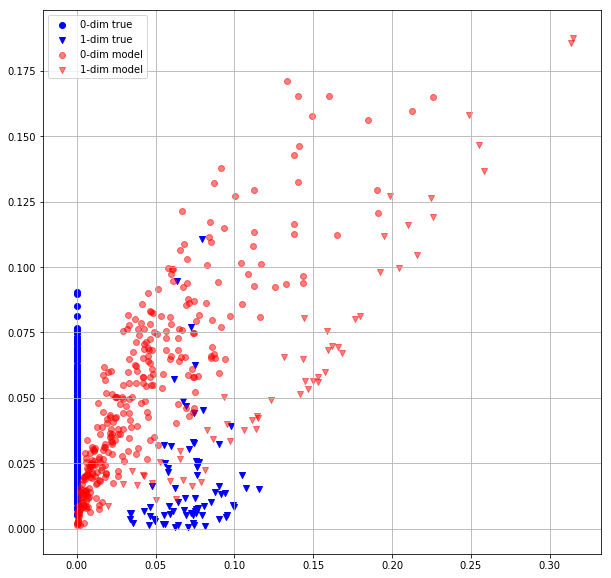

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 1.5992474556 1.5706292391


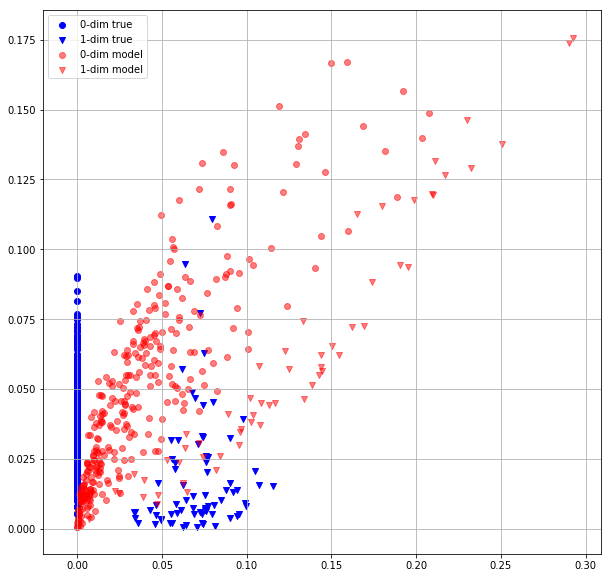

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 1.5200717449 1.4728909731


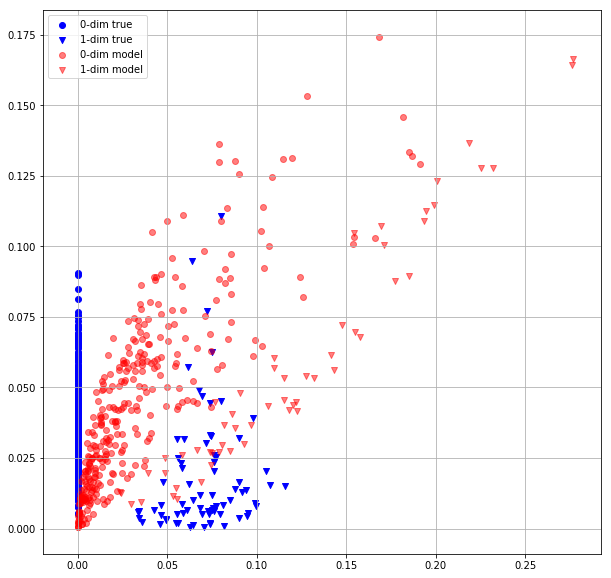

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 1.4203594923 1.3852032423


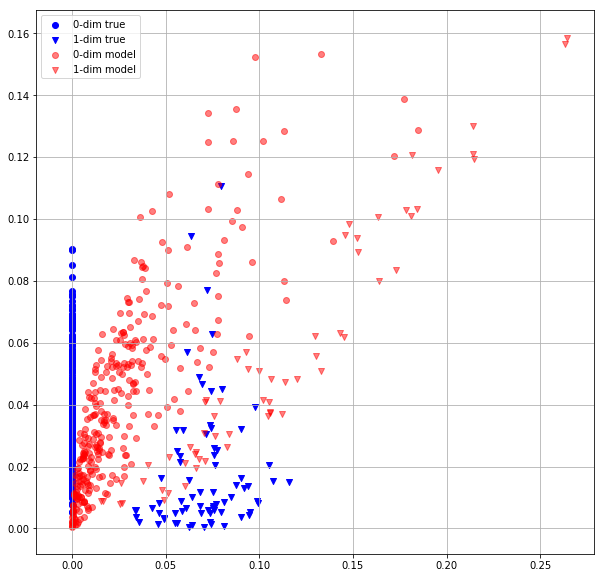

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 1.3742431402 1.3595404625


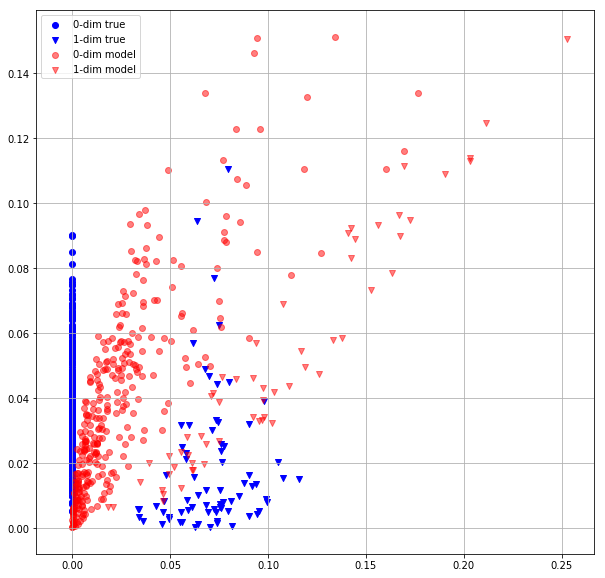

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 1.3506250381 1.3365945816


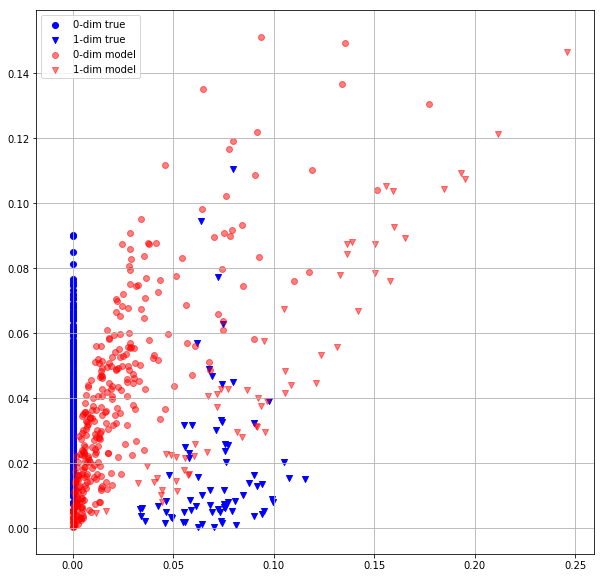

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 1.3339587450 1.3302694559


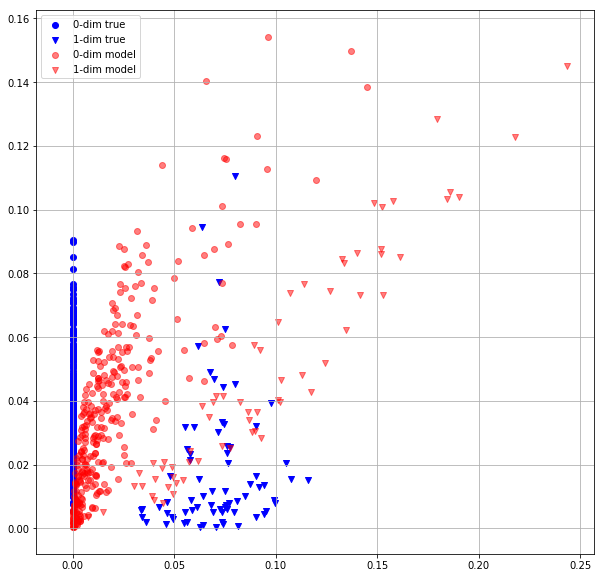

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  30 1.3334023952 1.3177264929


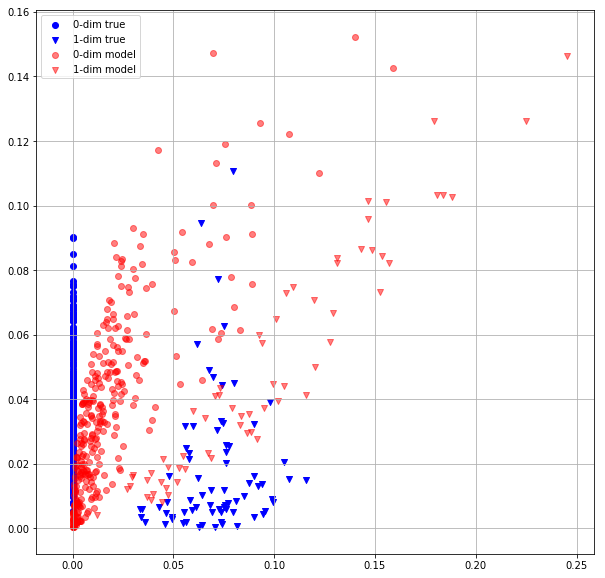

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  31 1.3085774183 1.2746466398


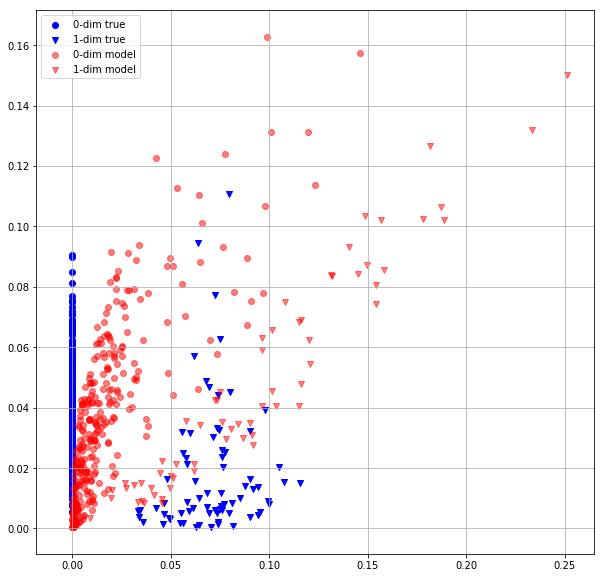

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  32 1.2626706362 1.2182639837


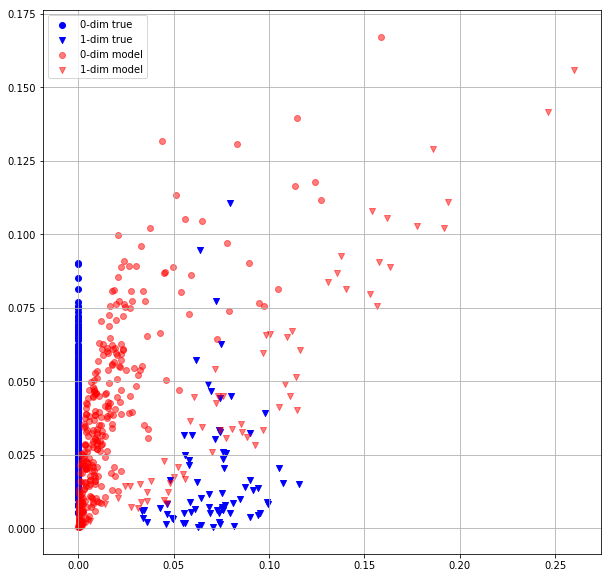

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  33 1.1985715628 1.1555132866


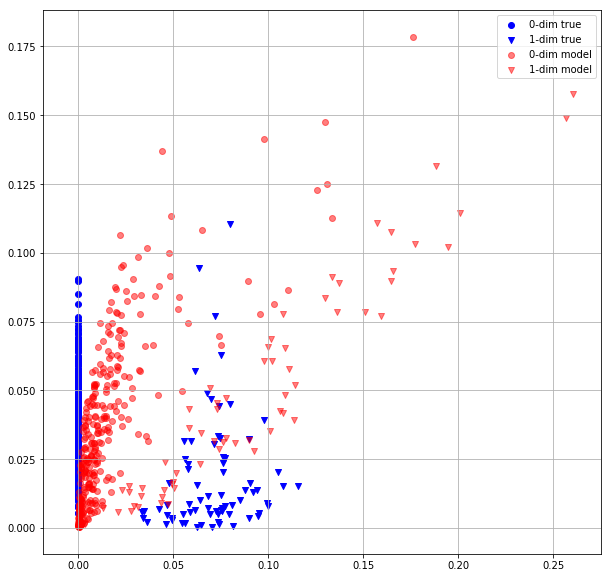

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  34 1.1277905703 1.0751825571


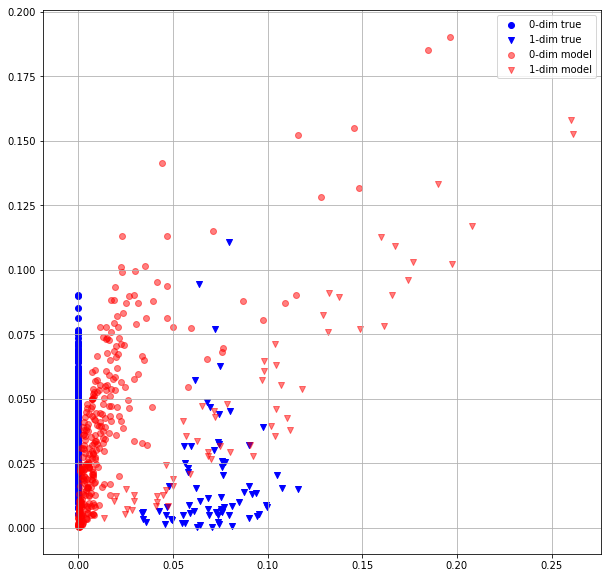

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  35 1.0440076590 1.0060142279


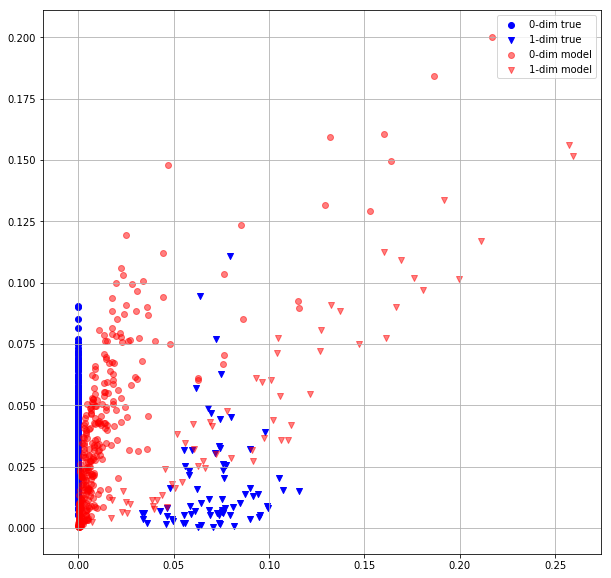

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  36 0.9887163043 0.9480489492


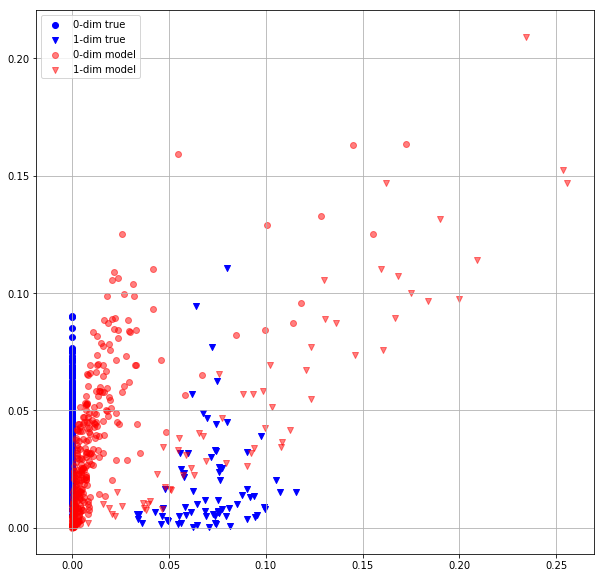

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  37 0.9328680634 0.9021747112


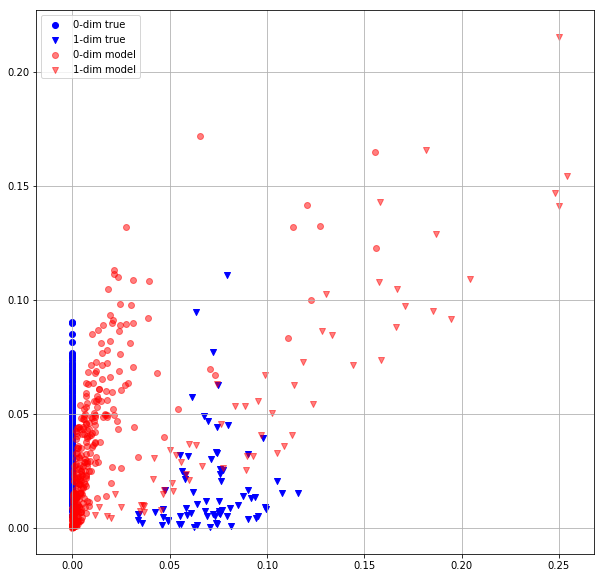

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  38 0.8473452926 0.8051133752


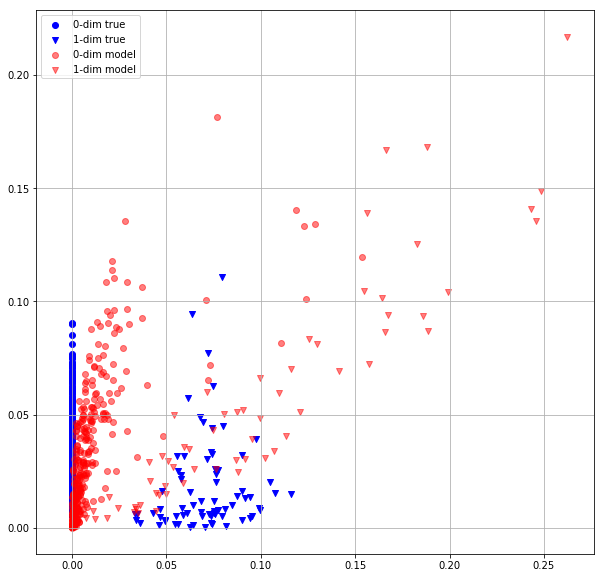

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  39 0.7587270141 0.7115548849


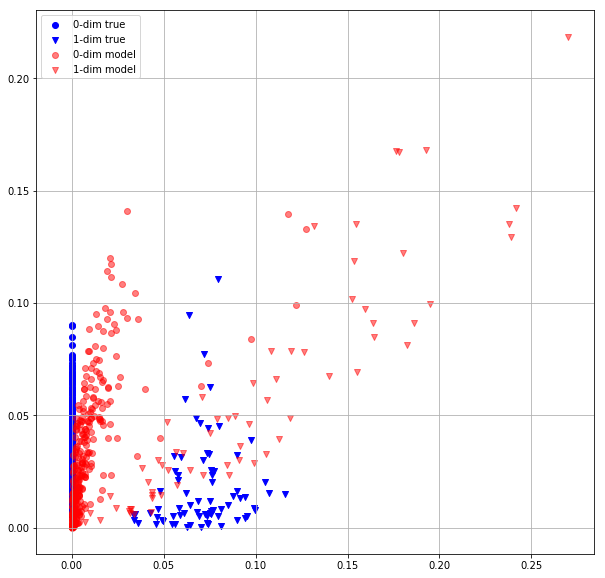

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  40 0.6967541575 0.6957656145


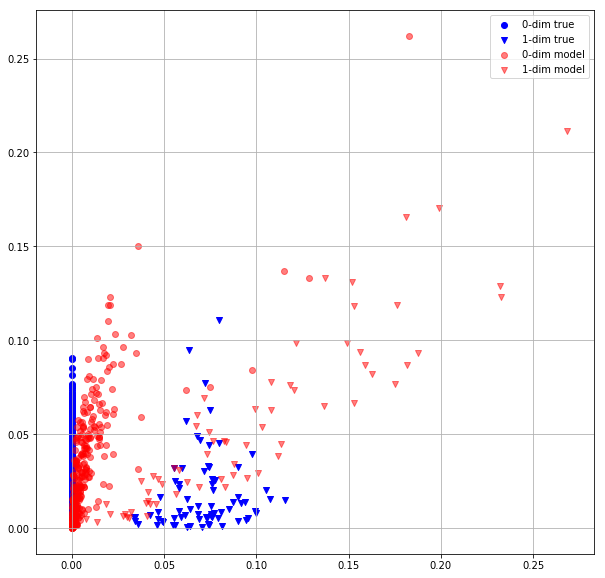

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  41 0.6678563952 0.6757112145


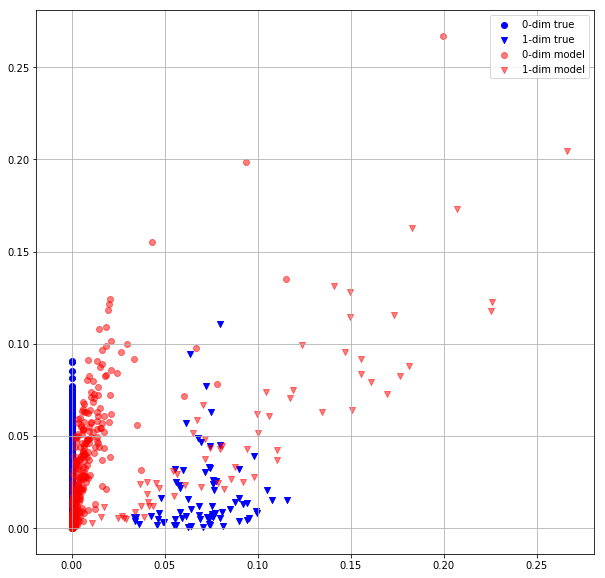

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  42 0.6310751438 0.6327378154


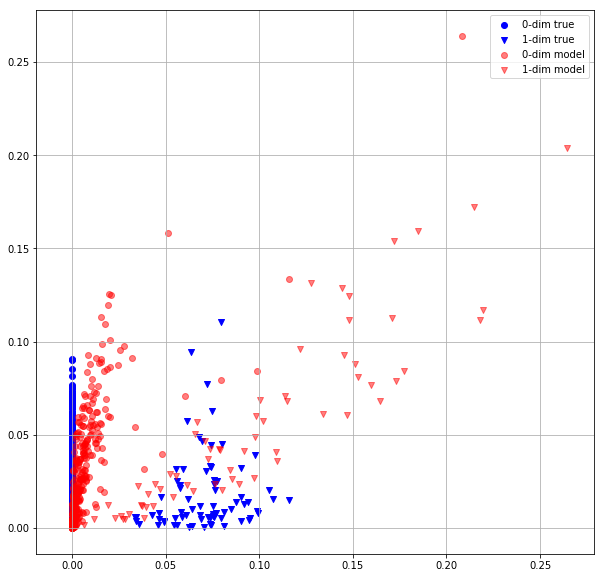

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  43 0.5933187008 0.5835151076


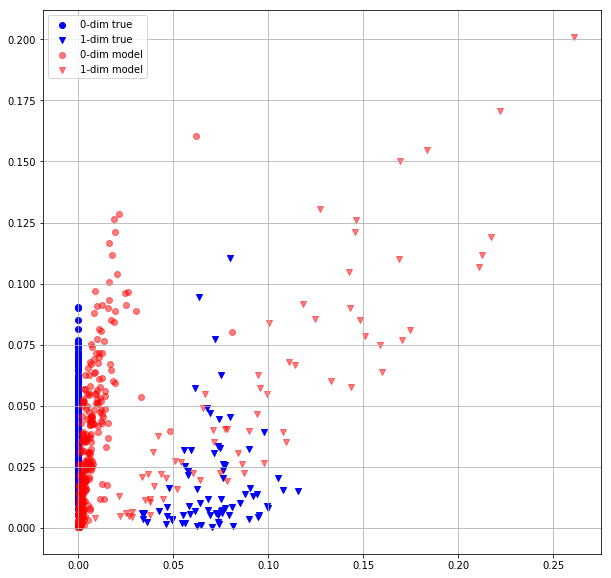

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  44 0.5383817554 0.5208339095


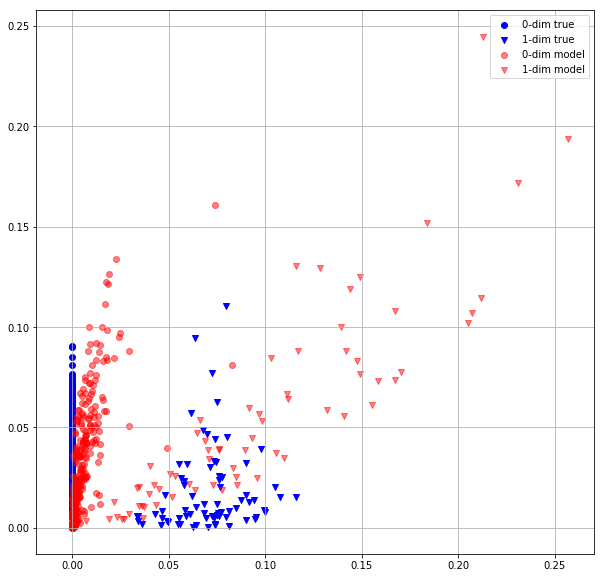

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  45 0.5357815027 0.5809084177


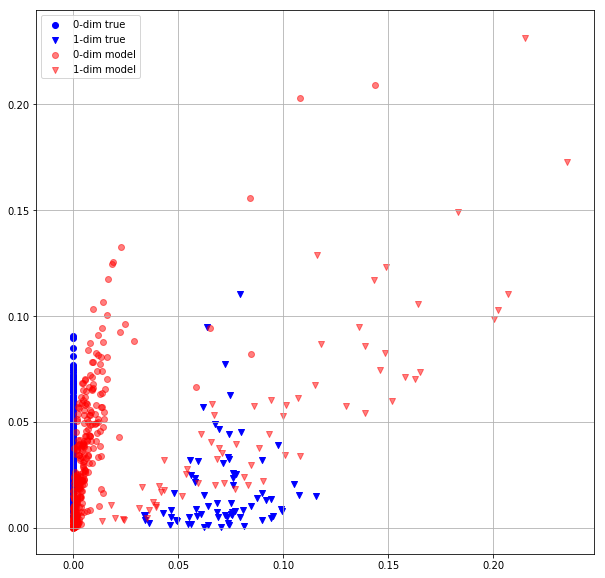

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  46 0.4805013239 0.4261321723


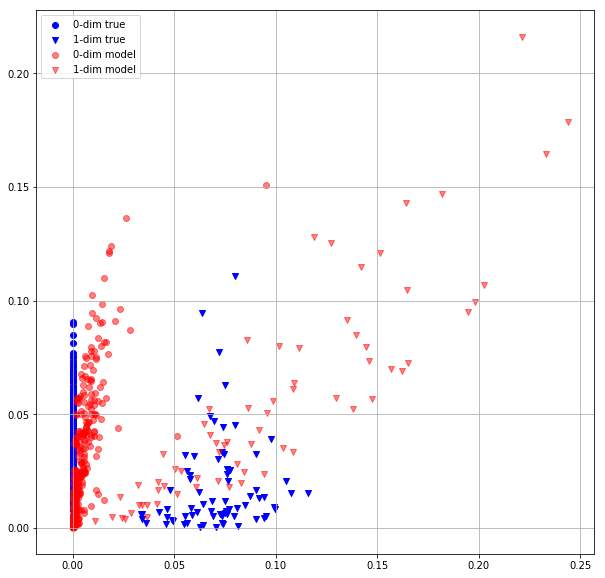

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  47 0.4241694212 0.4354586303


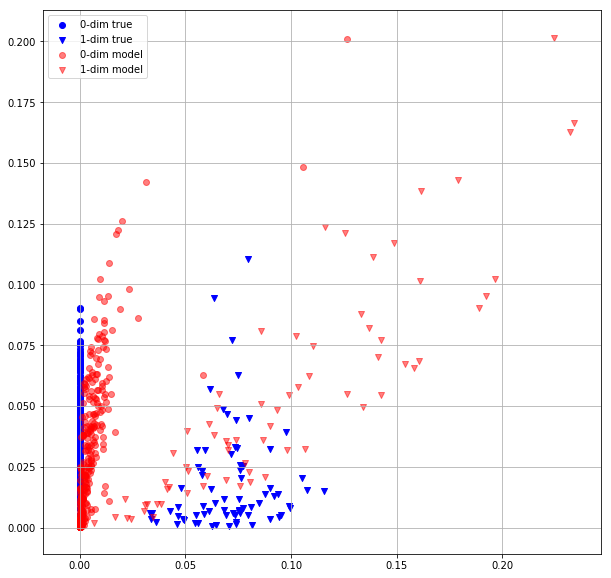

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  48 0.4160882235 0.4375812411


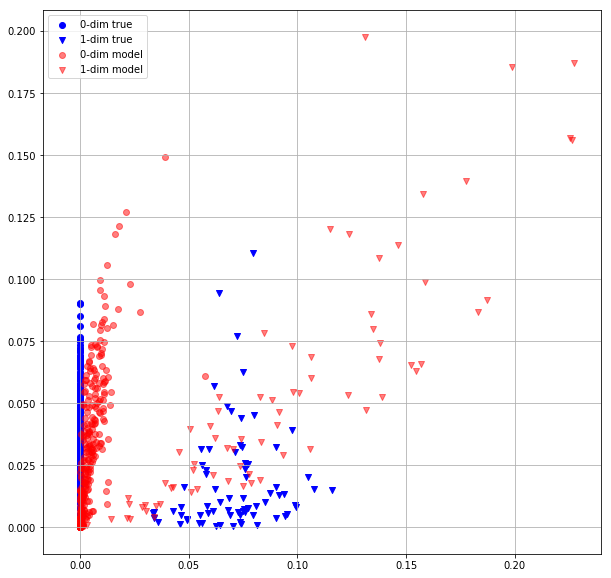

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  49 0.4029603302 0.3774517179


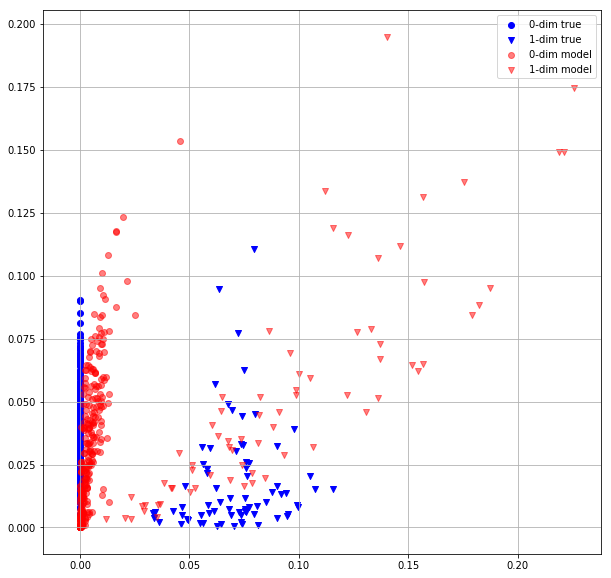

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  50 0.3495915234 0.3490695059


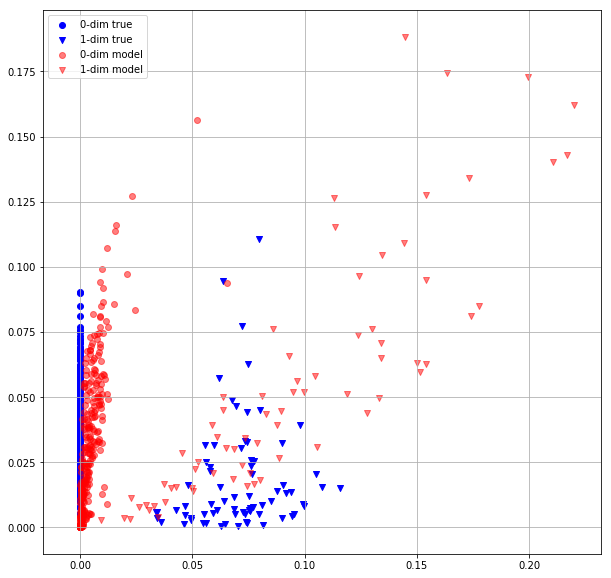

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  51 0.3313111067 0.3322747052


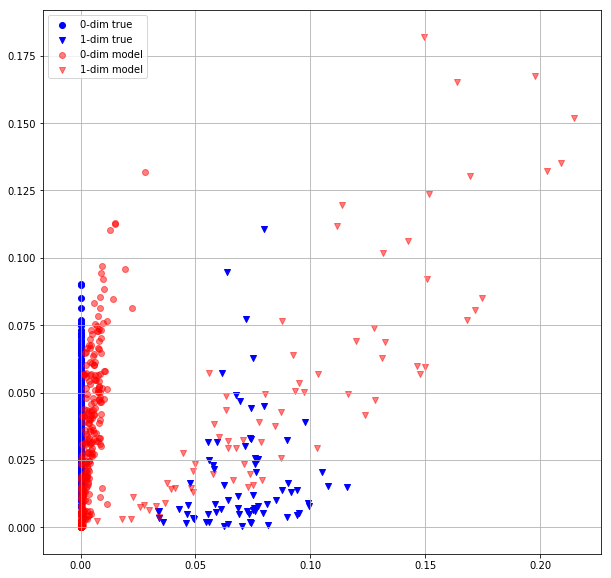

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  52 0.3237608075 0.3696025908


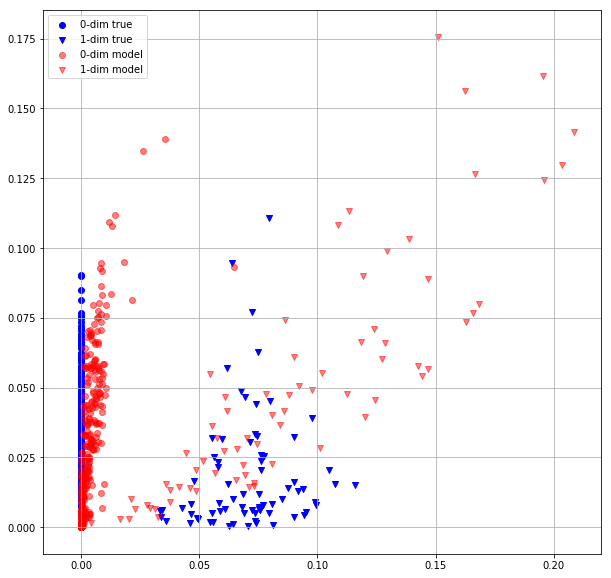

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  53 0.4032381773 0.4376422763


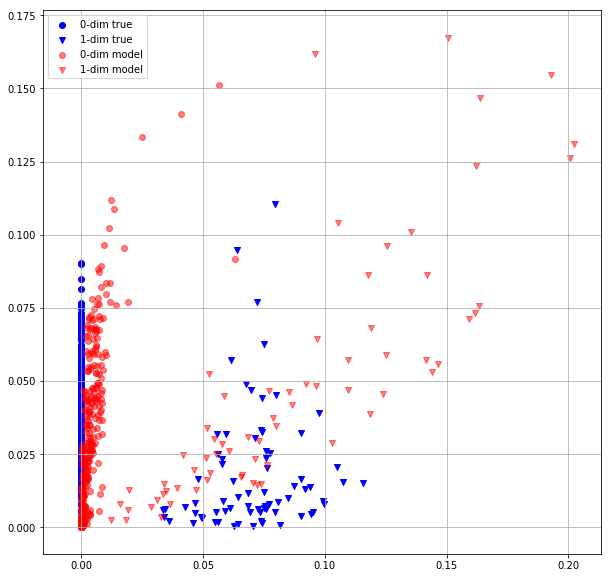

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  54 0.3992581964 0.4021701813


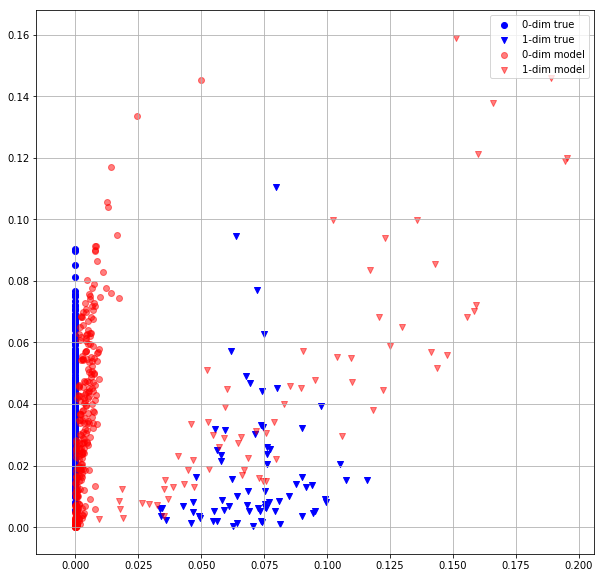

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  55 0.3788335919 0.3554416597


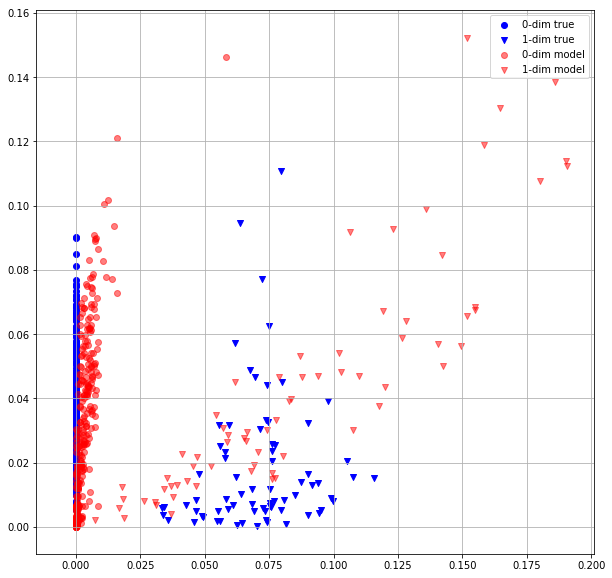

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  56 0.3302564323 0.3876182139


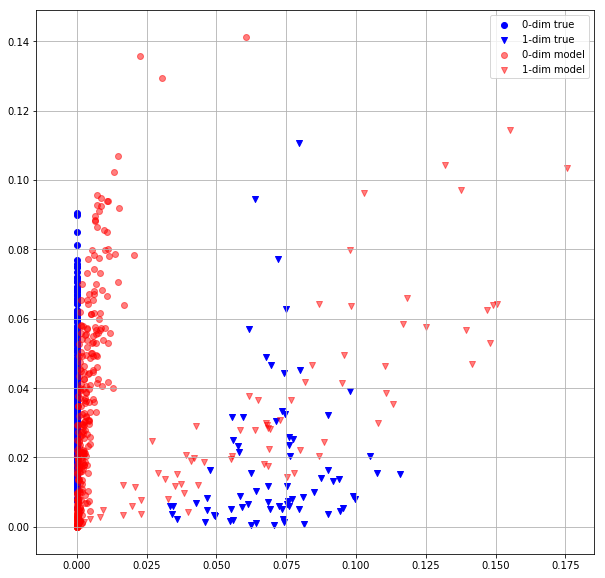

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  57 0.4169680476 0.4594796002


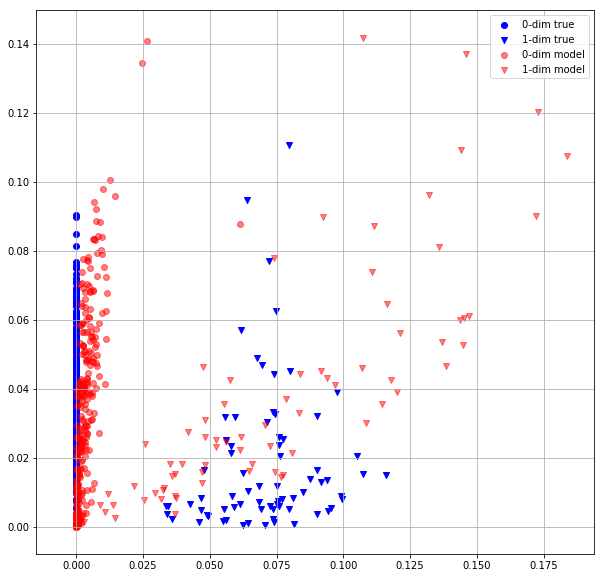

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  58 0.4500093758 0.4597611725


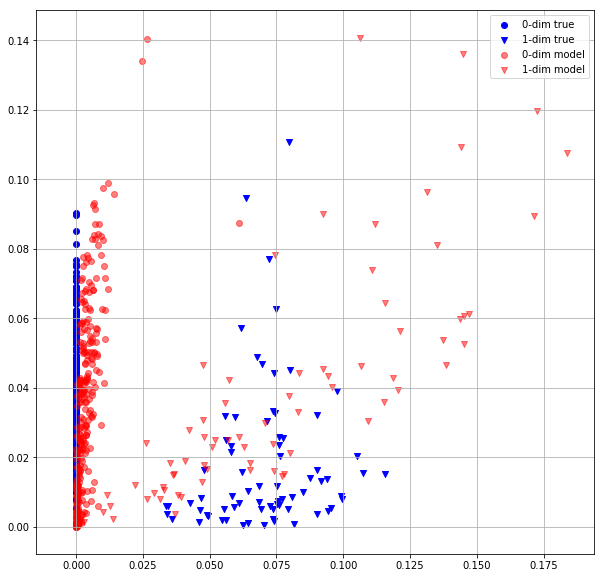

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  59 0.4473620355 0.4415615201


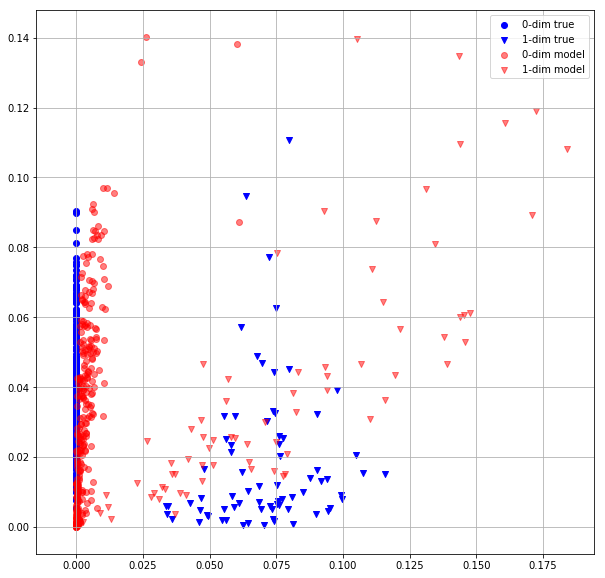

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  60 0.4293832779 0.4377006590


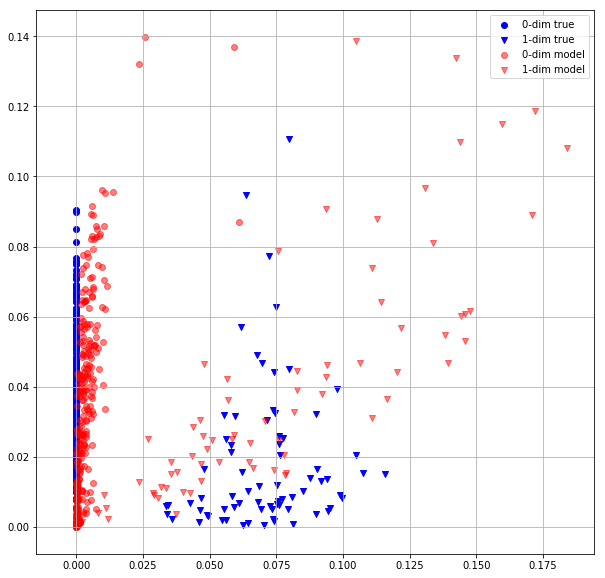

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  61 0.4385610521 0.4523440599


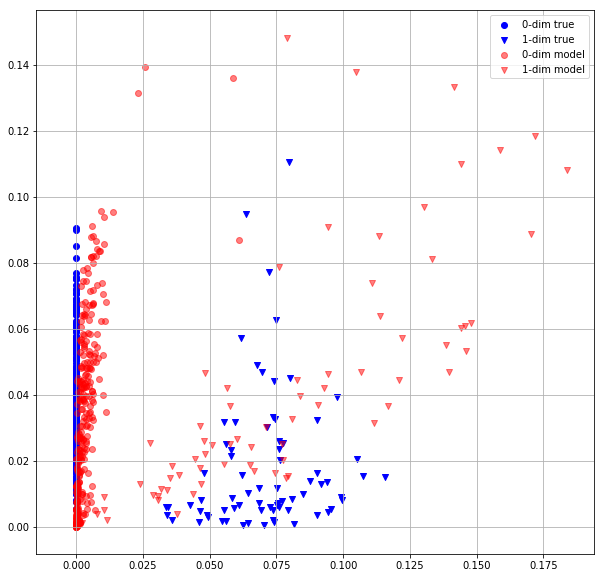

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  62 0.4371467233 0.4452903867


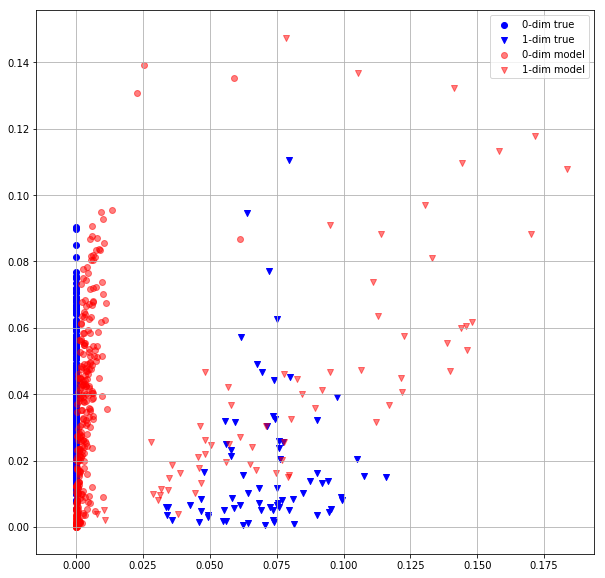

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  63 0.4276714623 0.4368361235


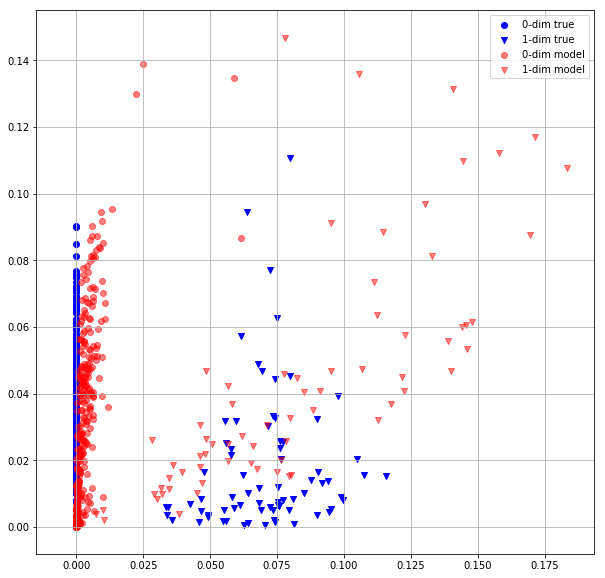

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  64 0.4241474867 0.4366614819


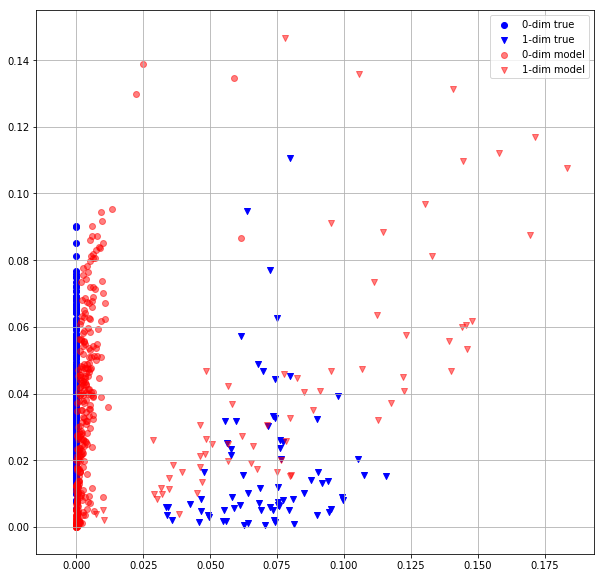

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  65 0.4238021076 0.4363214970


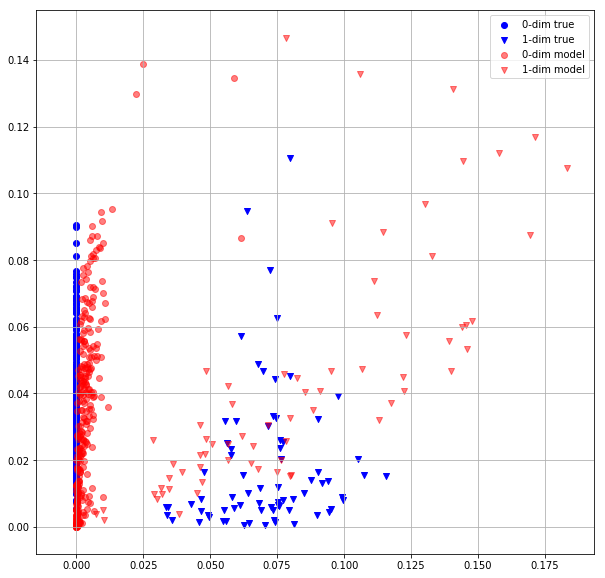

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  66 0.4234244823 0.4361304045


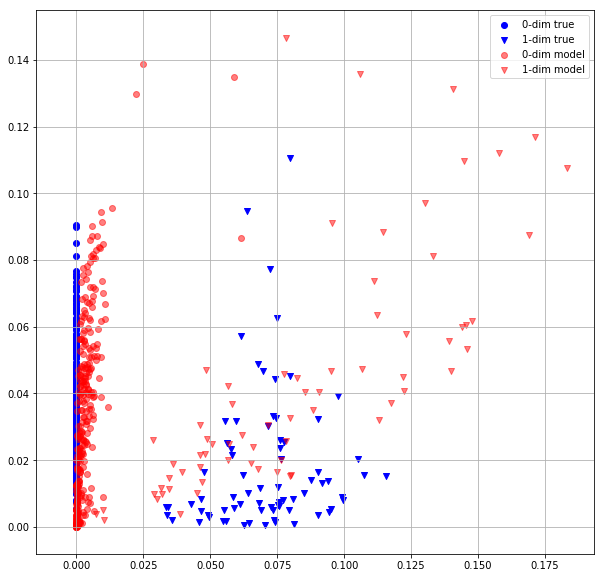

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  67 0.4224018455 0.4351857305


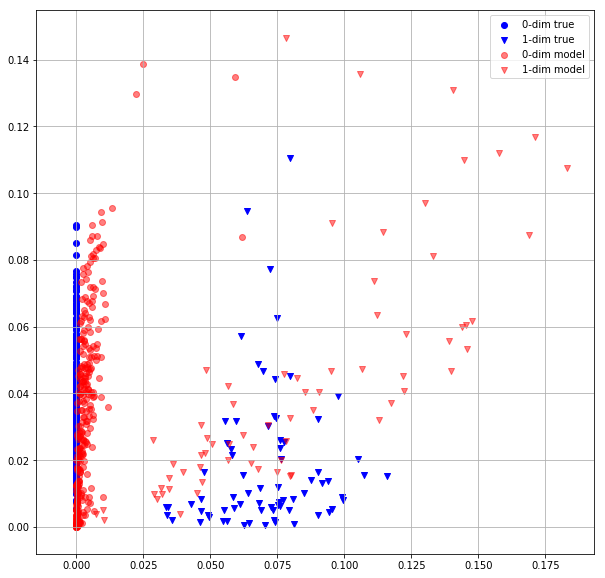

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  68 0.4219551384 0.4347491562


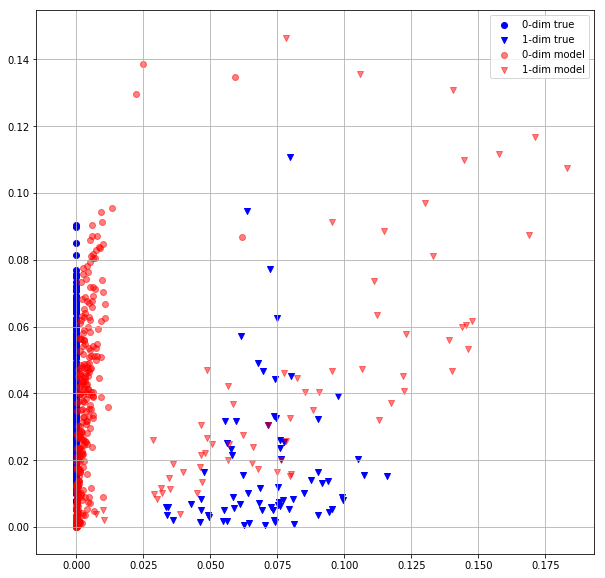

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  69 0.4225201309 0.4342580438


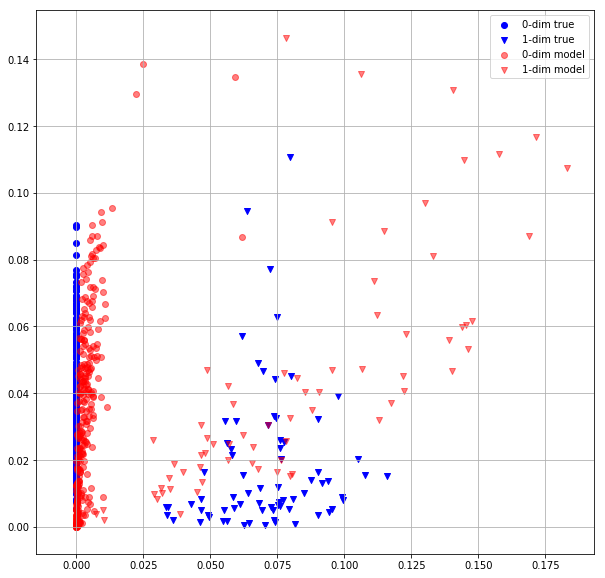

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  70 0.4217920005 0.4342175722


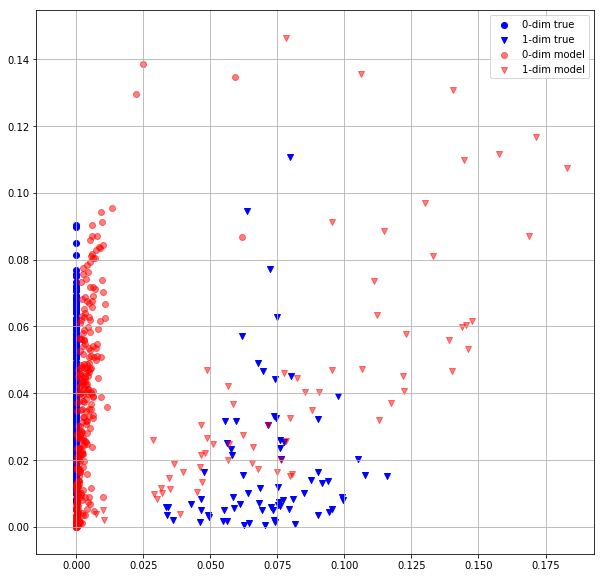

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  71 0.4218632579 0.4341771305


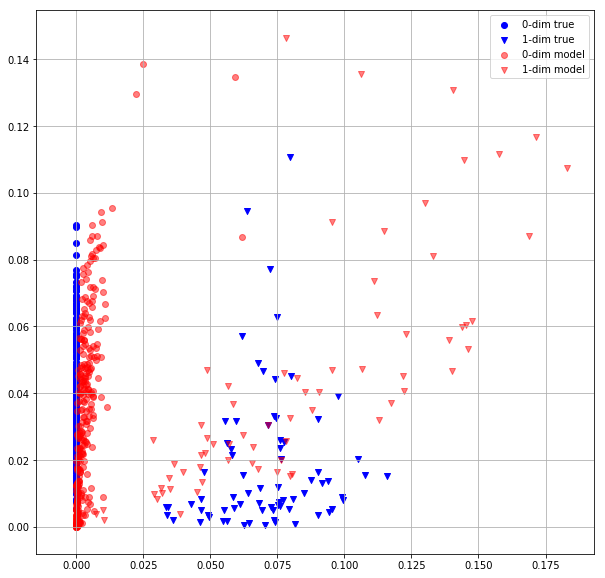

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  72 0.4221463501 0.4341372252


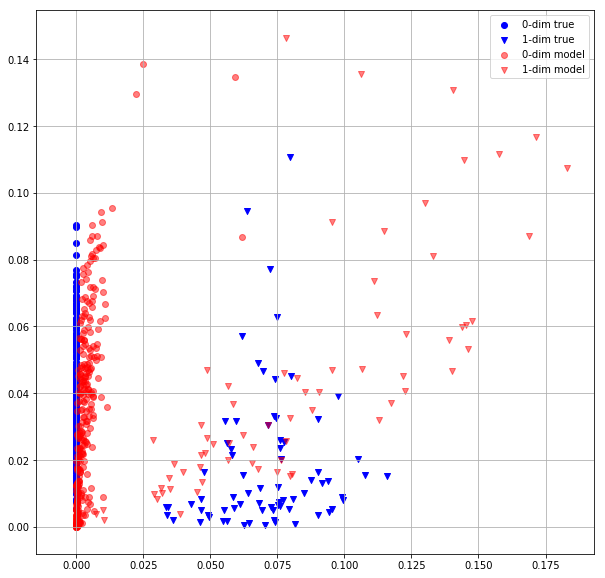

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  73 0.4220491350 0.4340971708


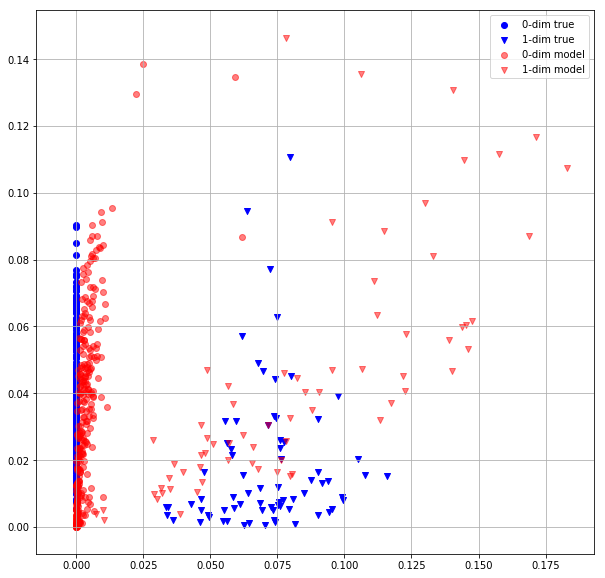

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  74 0.4220820665 0.4340571463


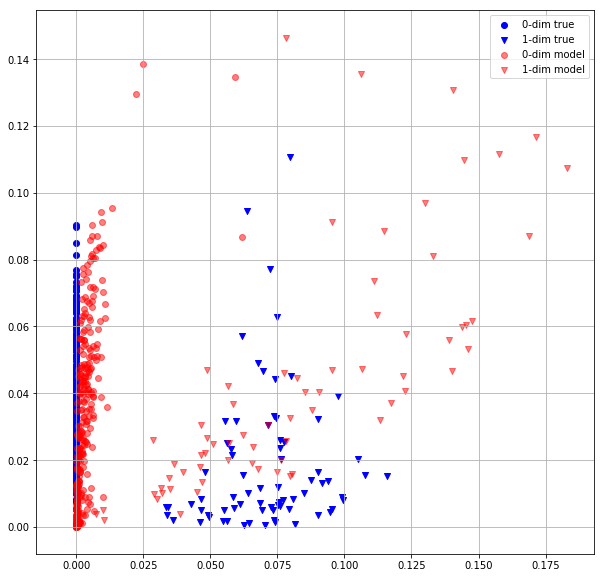

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  75 0.4214748740 0.4340178967


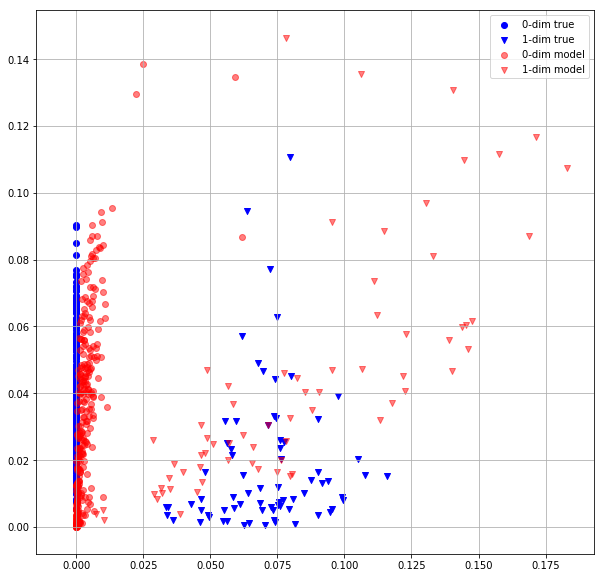

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  76 0.4214575589 0.4339786172


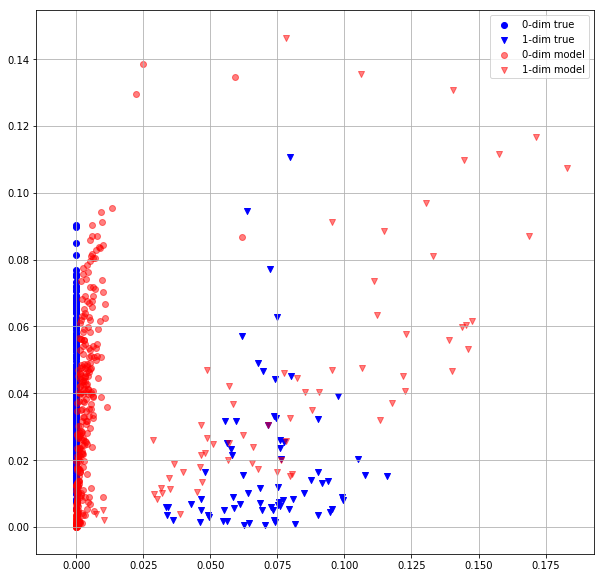

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  77 0.4216456115 0.4339390695


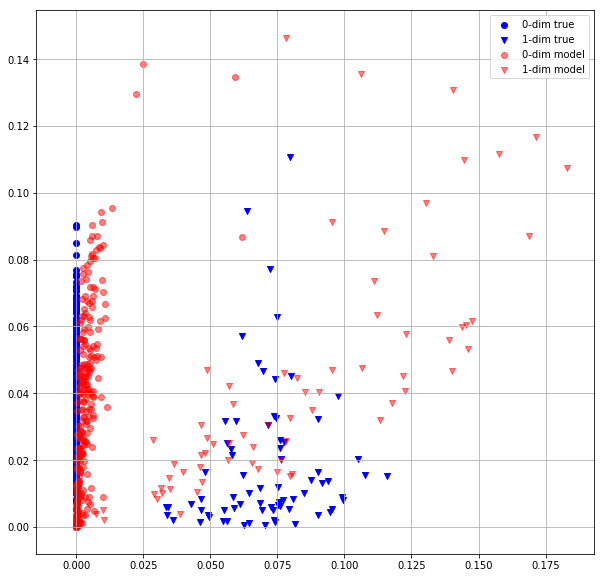

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  78 0.4219177663 0.4338994920


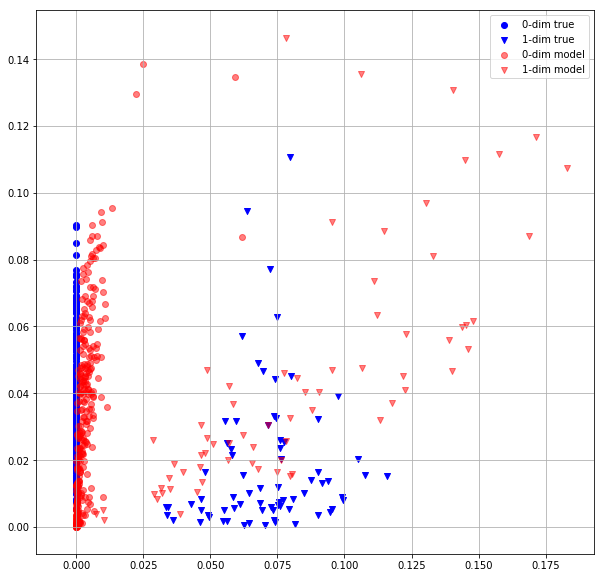

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  79 0.4217859507 0.4333776832


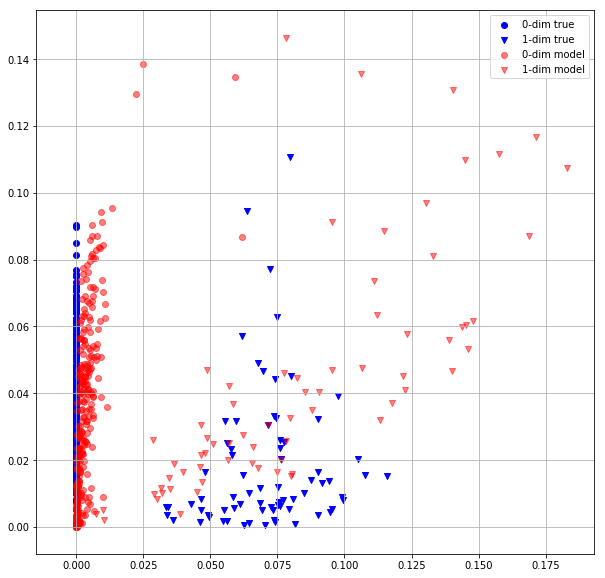

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  80 0.4219499826 0.4333288670


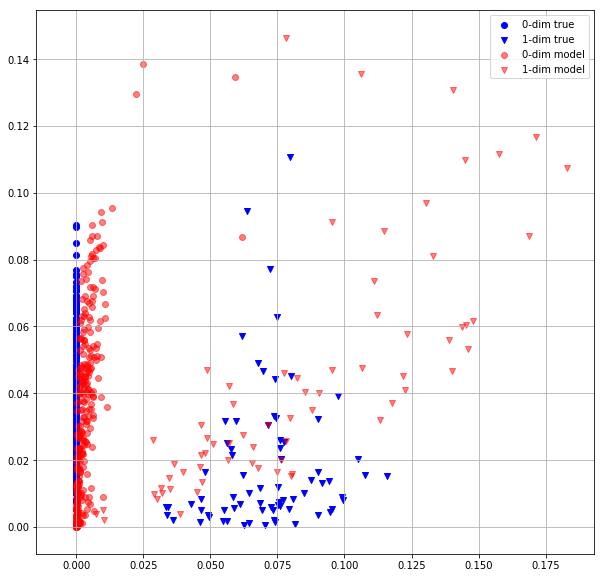

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  81 0.4212062061 0.4332896471


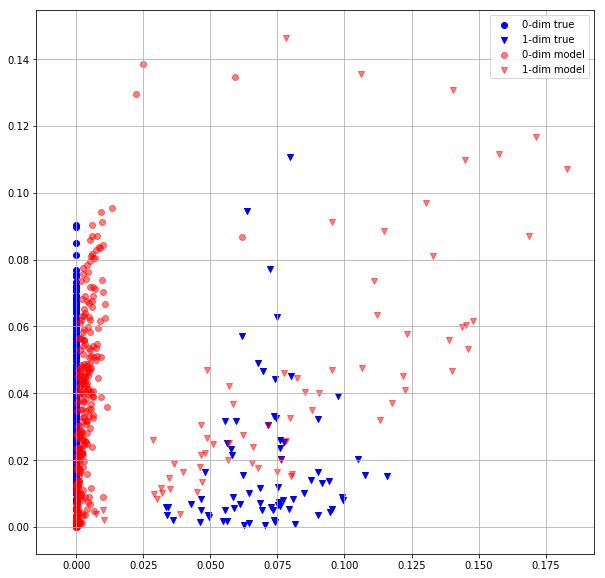

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  82 0.4215810001 0.4332506657


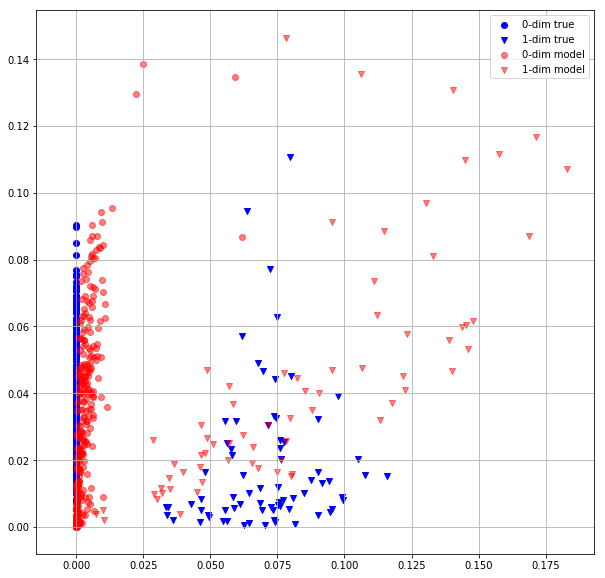

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  83 0.4213719666 0.4332115650


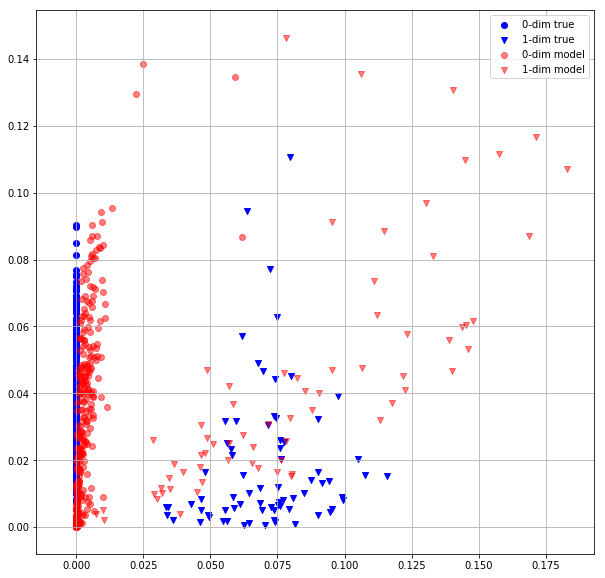

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  84 0.4210867584 0.4331724048


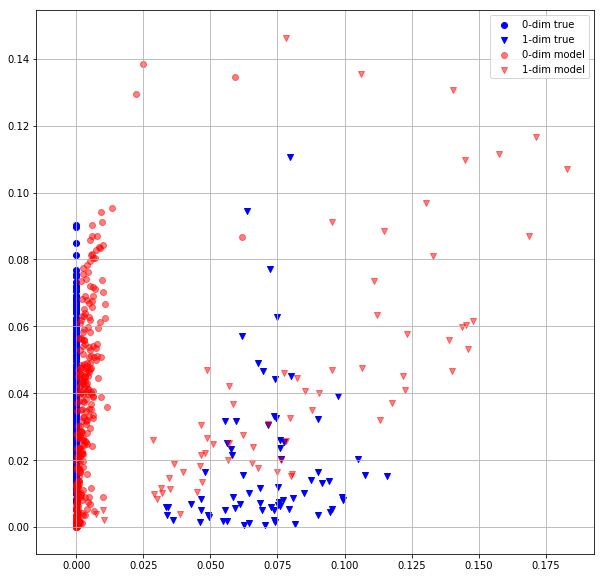

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  85 0.4213841259 0.4331332147


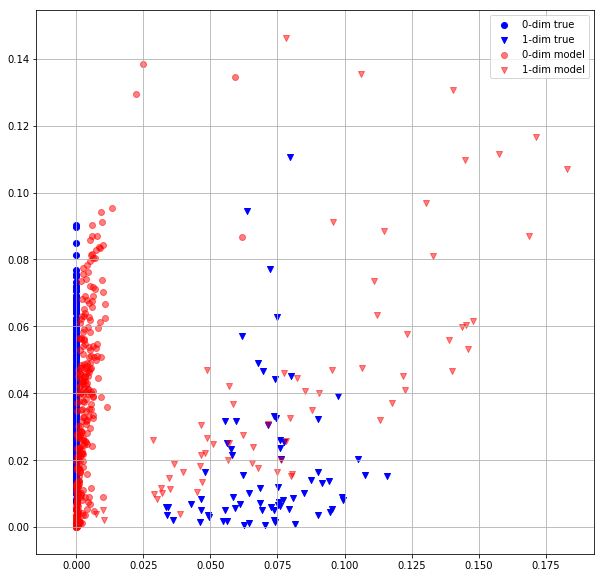

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  86 0.4208581448 0.4330944419


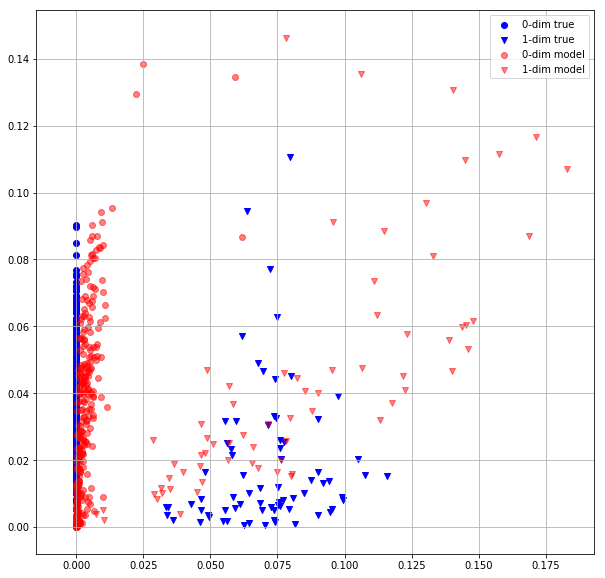

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  87 0.4208169281 0.4330554605


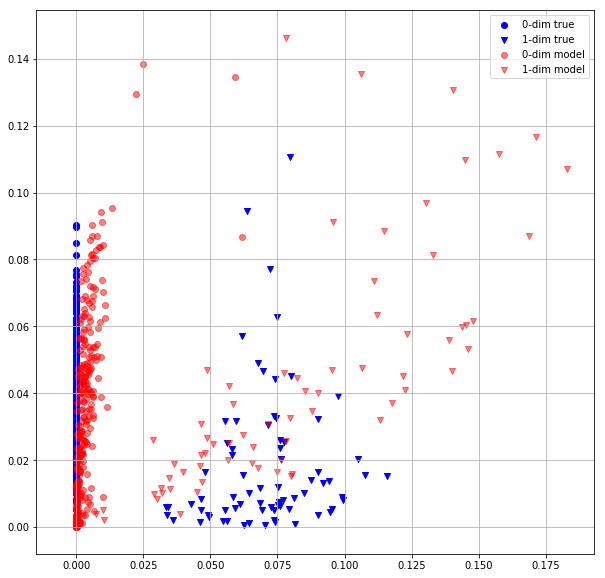

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  88 0.4207661450 0.4308207035


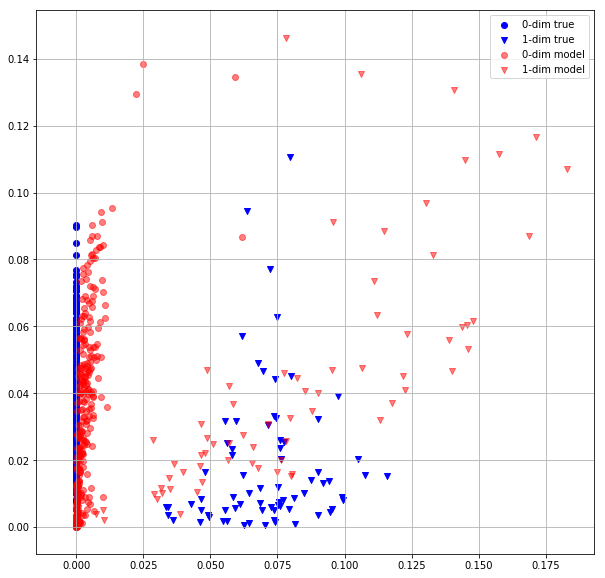

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  89 0.4193851948 0.4303303063


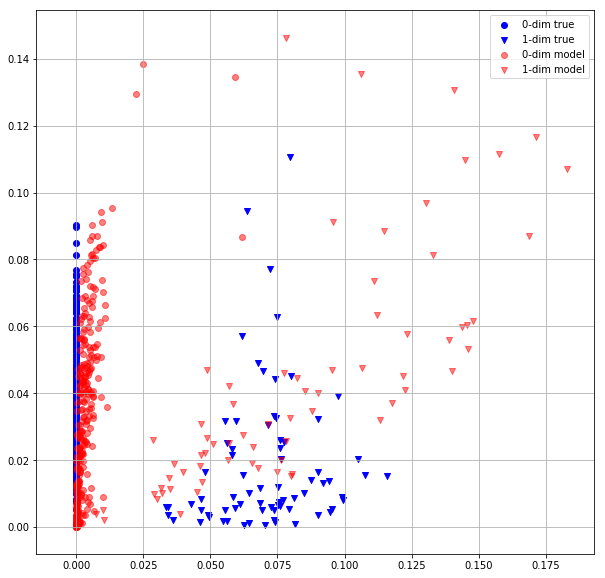

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  90 0.4193396866 0.4295428991


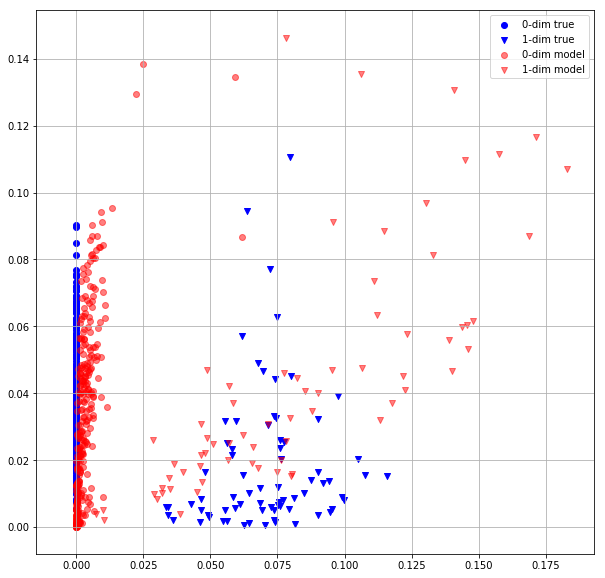

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  91 0.4190315008 0.4307873547


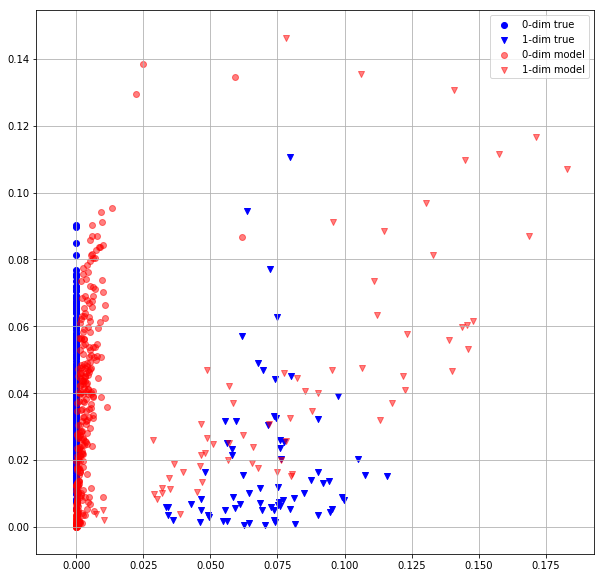

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  92 0.4209766686 0.4321137965


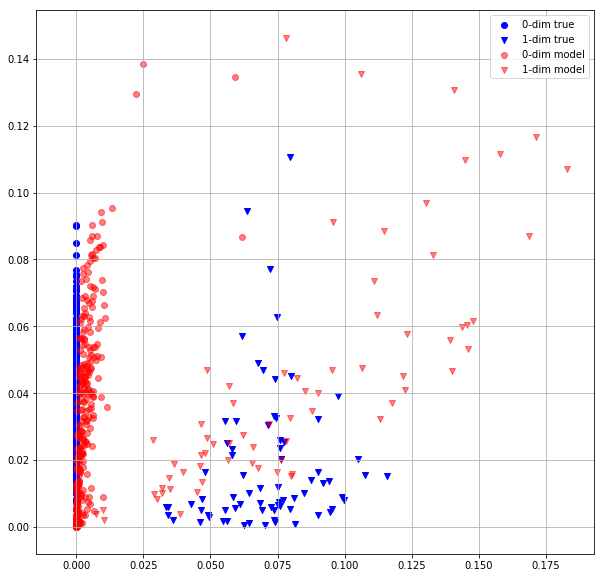

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  93 0.4196688533 0.4320756793


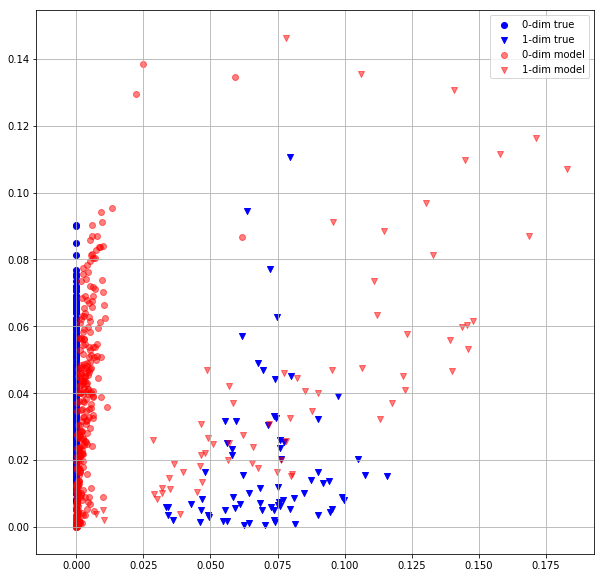

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  94 0.4203929603 0.4320377111


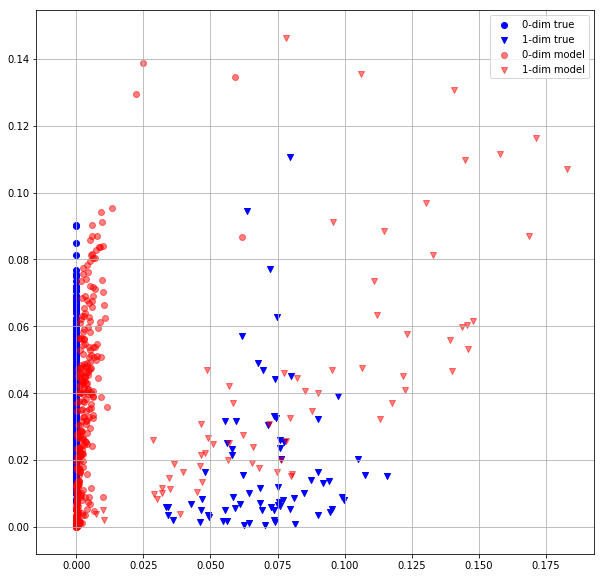

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  95 0.4192040265 0.4319596887


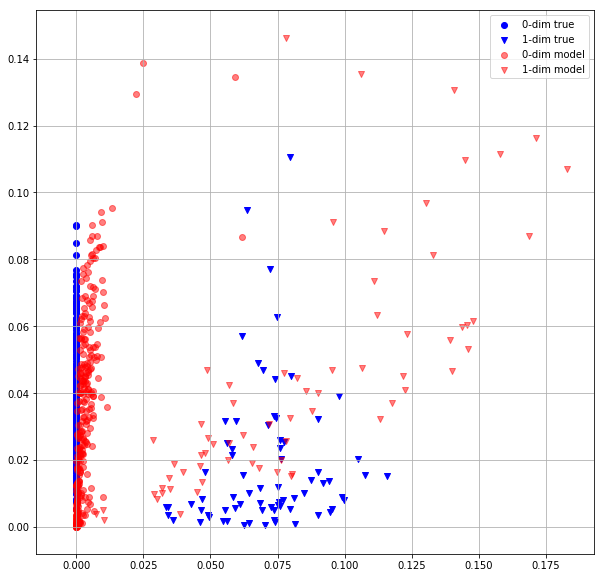

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  96 0.4203058183 0.4319214523


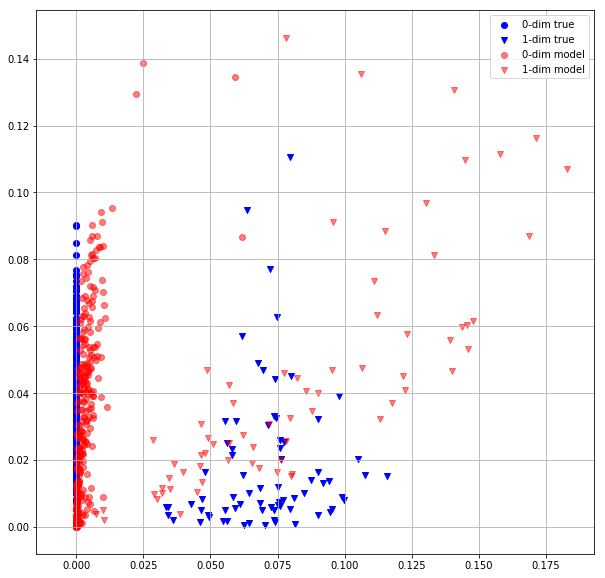

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  97 0.4197810292 0.4324209988


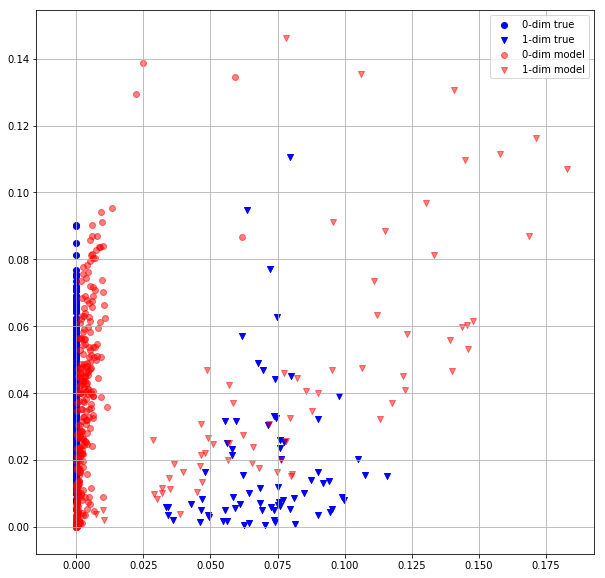

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  98 0.4190433025 0.4323951602


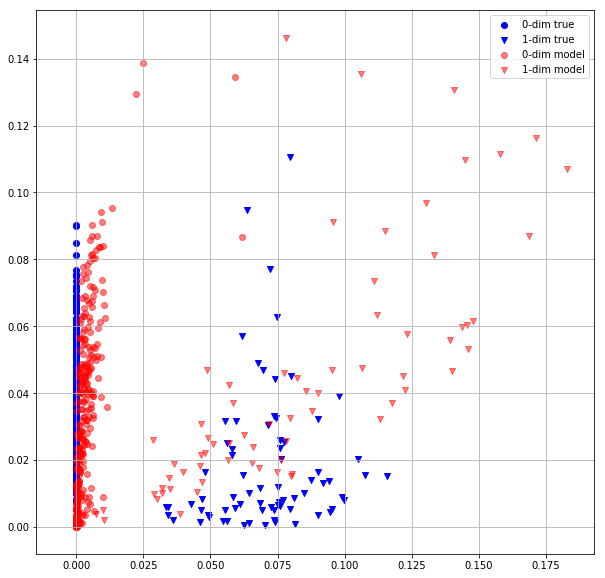

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  99 0.4195734262 0.4323569238


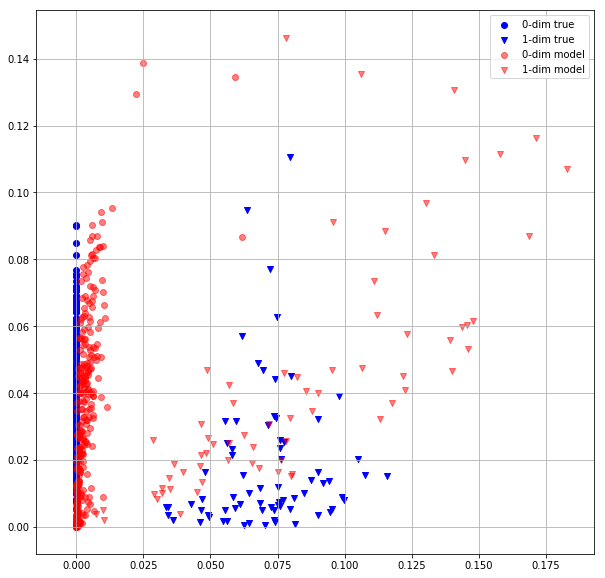

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 100 0.4201026261 0.4330125749


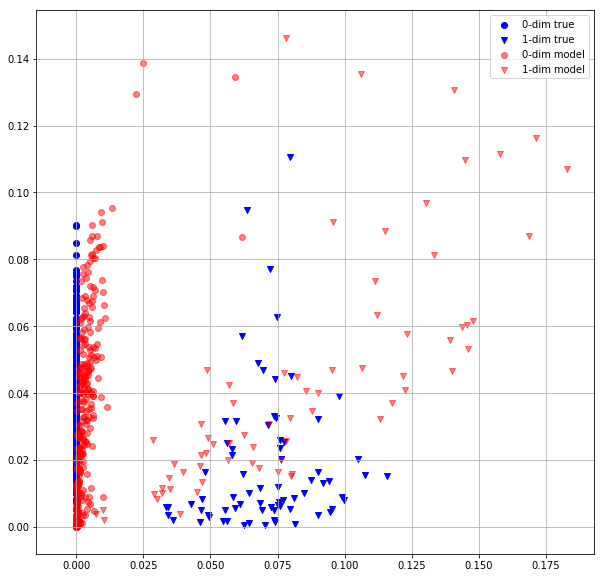

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 101 0.4206475914 0.4329742491


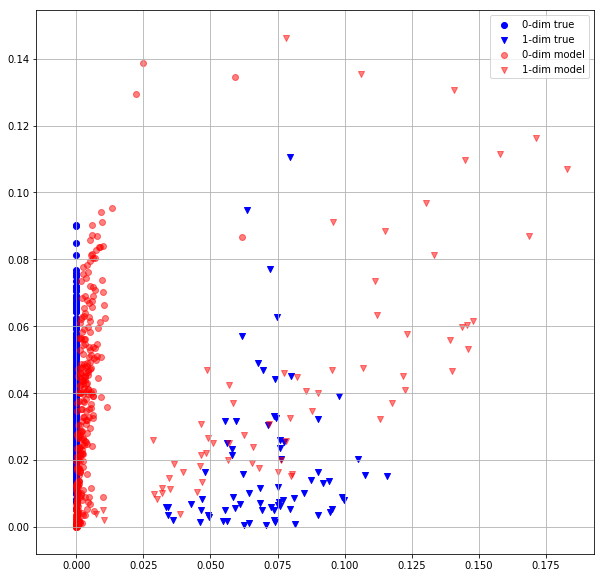

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 102 0.4200822115 0.4328866601


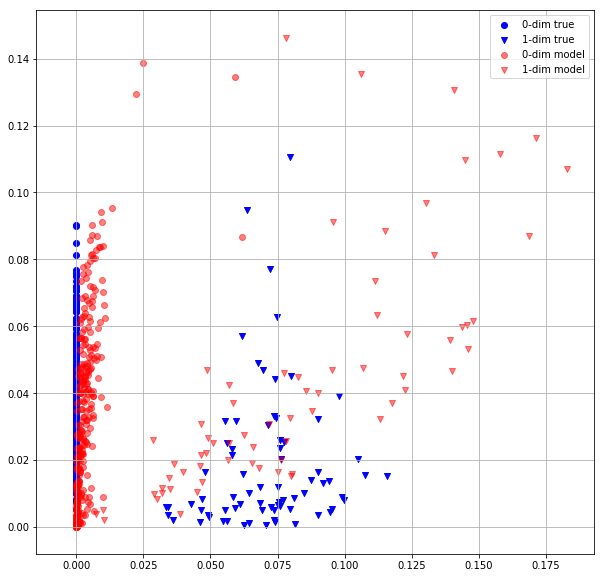

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 103 0.4199104011 0.4328486919


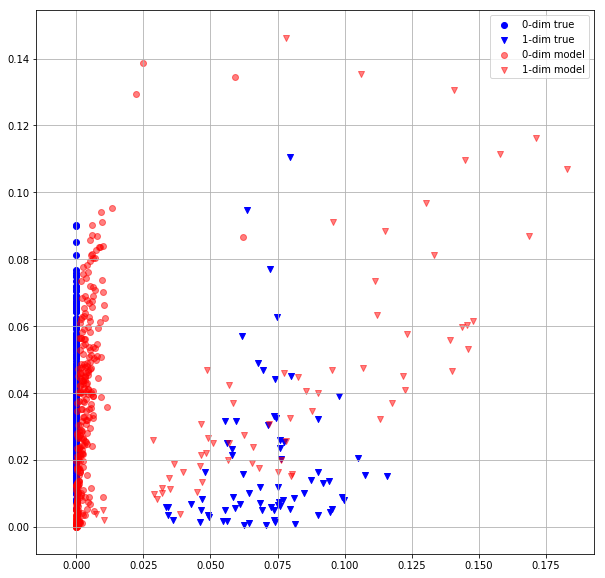

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 104 0.4204222560 0.4329080284


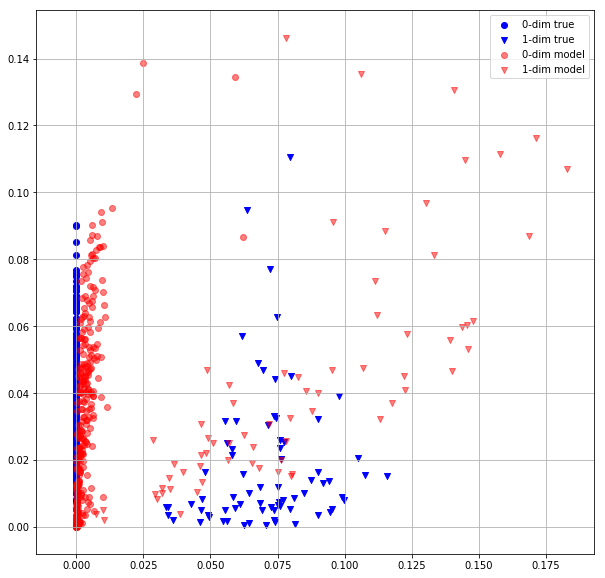

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 105 0.4212204814 0.4330647290


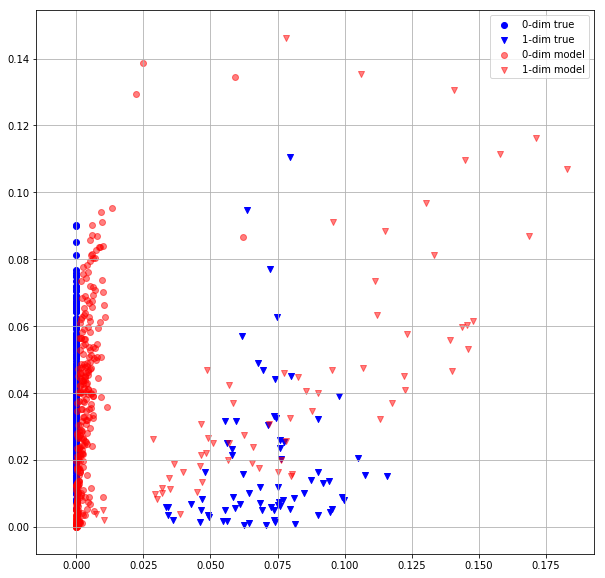

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 106 0.4205360413 0.4333712459


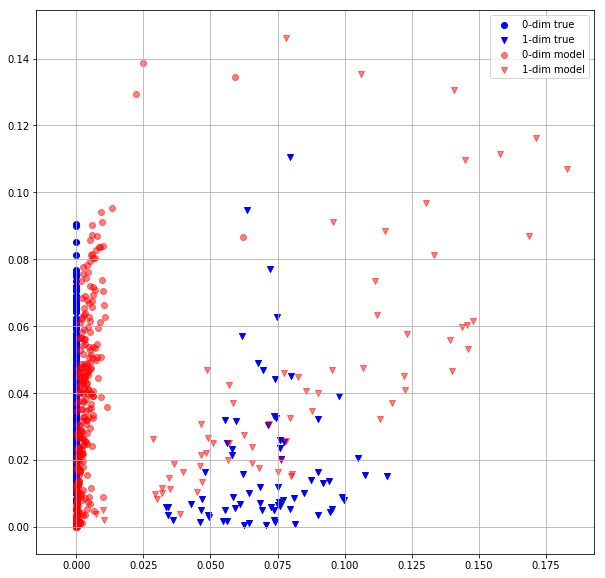

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 107 0.4203491211 0.4333328009


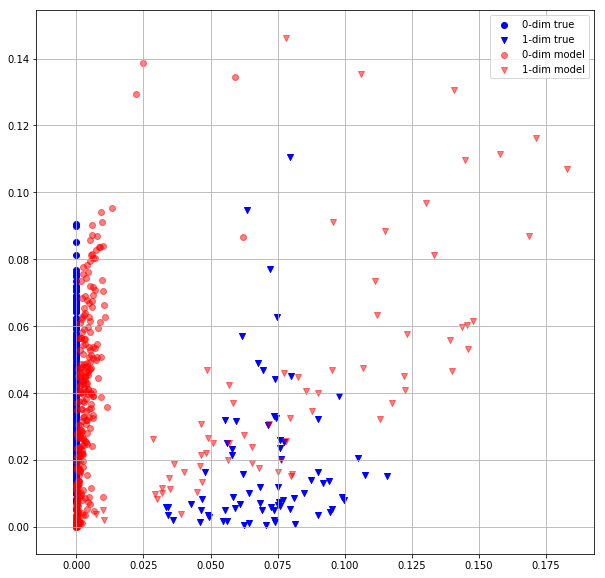

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 108 0.4198649228 0.4305950105


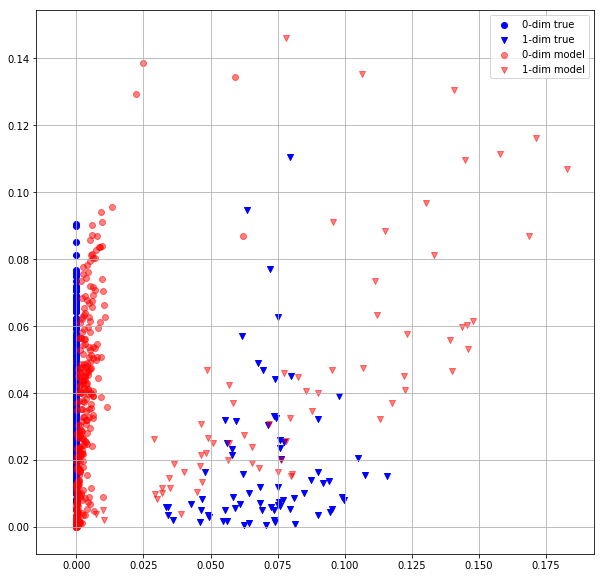

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 109 0.4188193977 0.4305567145


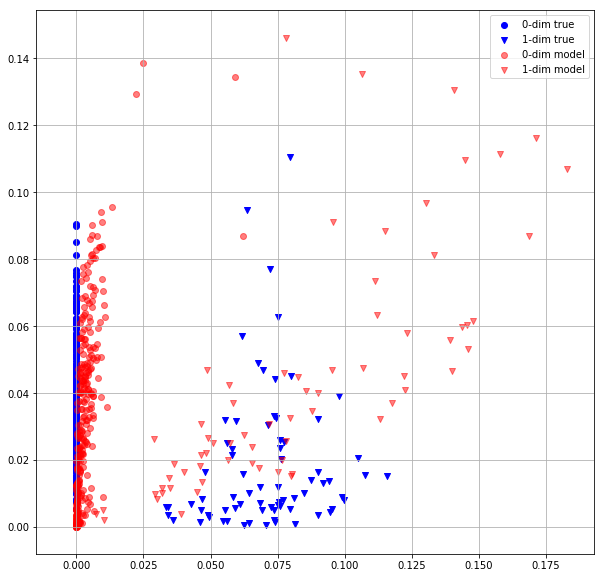

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 110 0.4198472500 0.4305184186


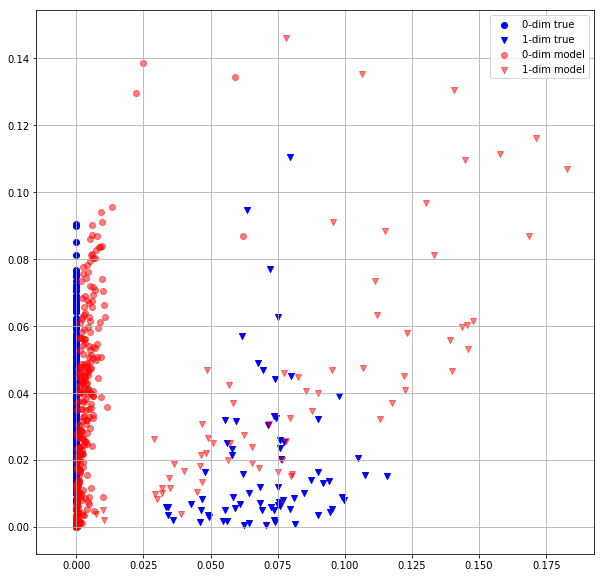

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 111 0.4197993577 0.4304675162


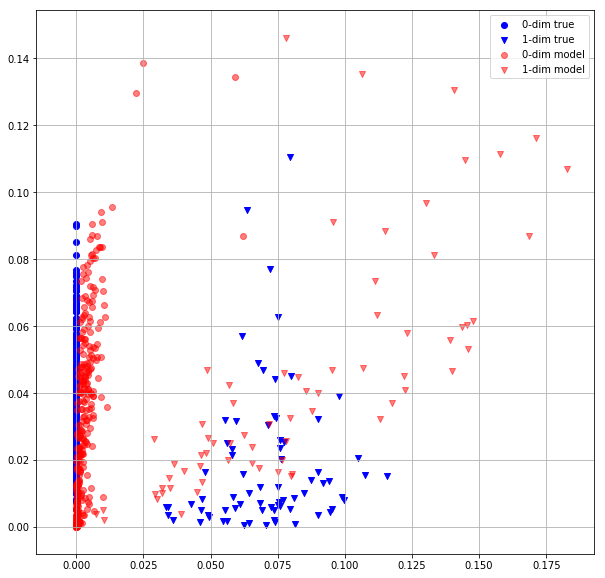

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 112 0.4202615023 0.4309638739


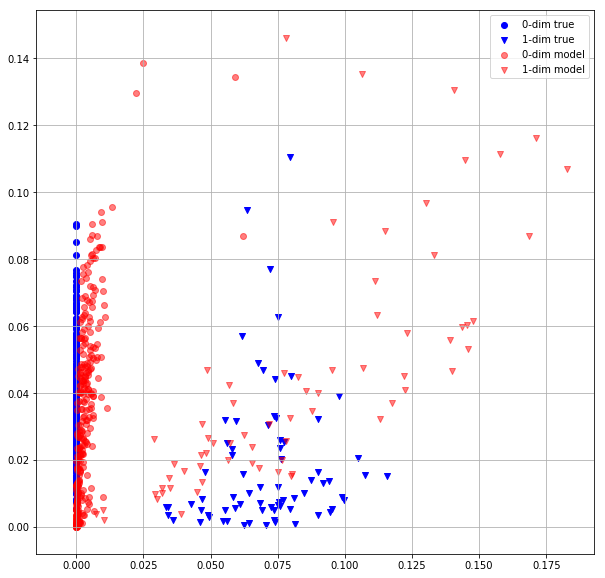

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 113 0.4206247330 0.4311966002


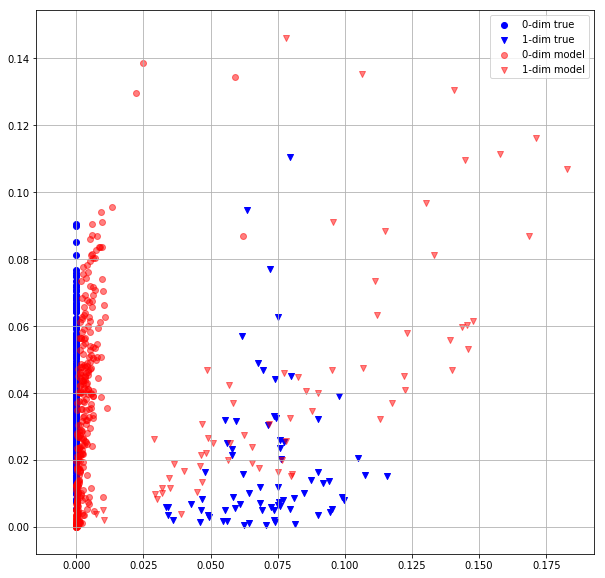

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 114 0.4197559655 0.4311574996


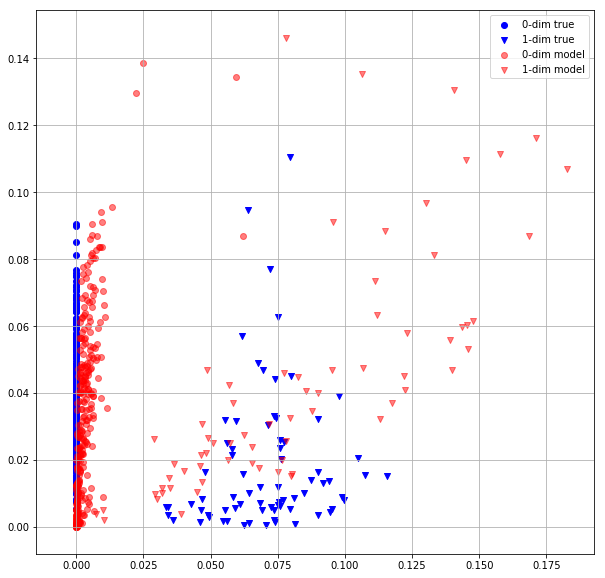

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 115 0.4193784297 0.4305833876


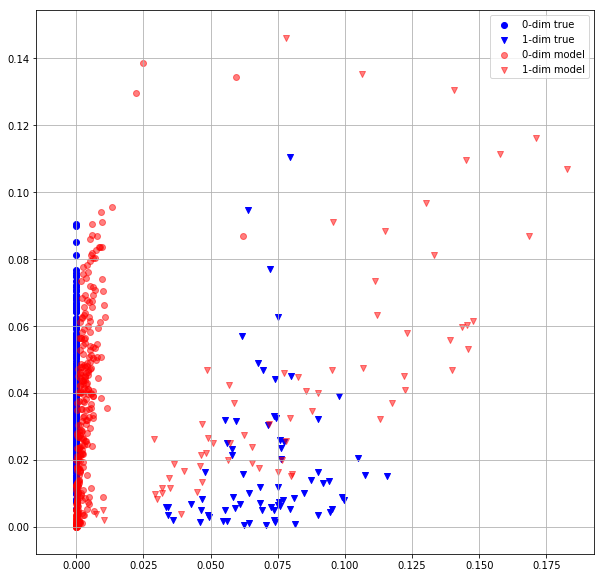

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 116 0.4182326496 0.4305440187


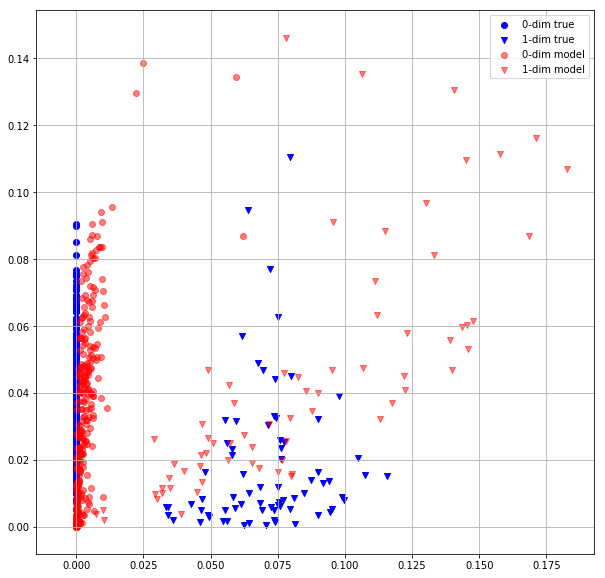

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 117 0.4193820655 0.4297707081


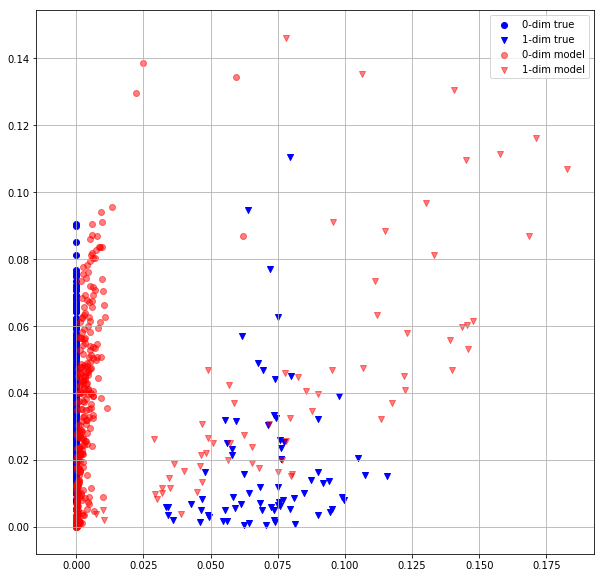

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 118 0.4174448848 0.4297312200


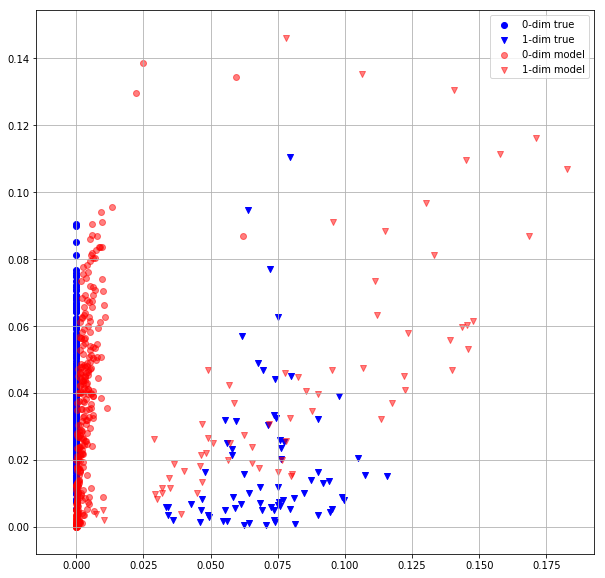

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 119 0.4180644155 0.4296948612


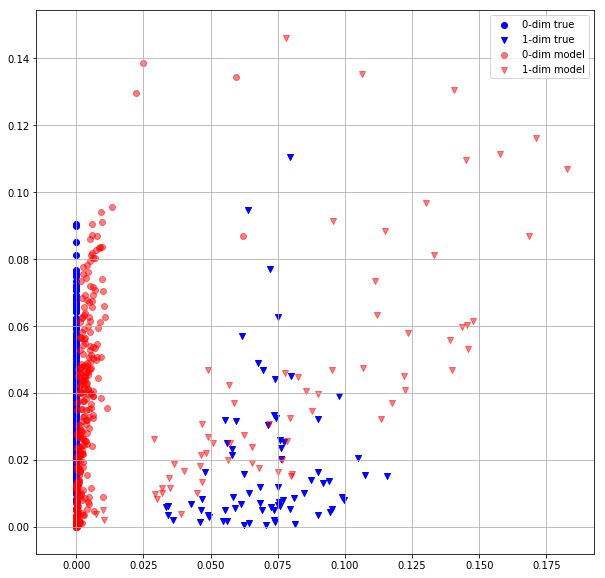

In [11]:
#Transformer enc + Top-N + MLP + non-neg + weighted matching + scheduler
for epoch_idx in range(2 * n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
    scheduler.step(loss_test)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    #mask0 = (m == 0)
    #mask1 = (m == 1)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.6044267416 0.6421912313


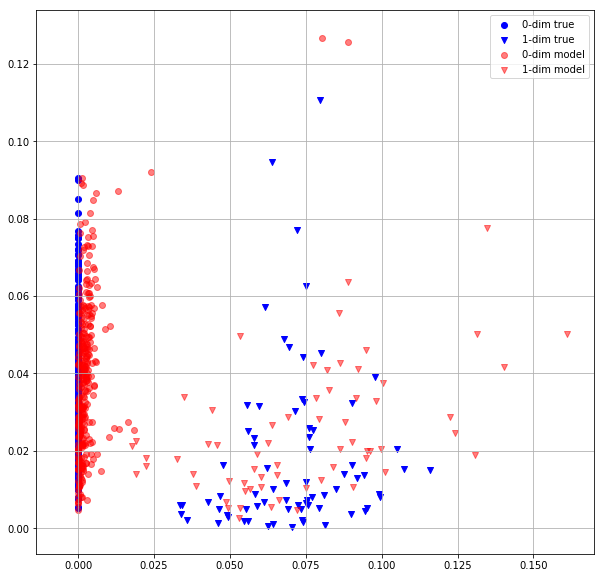

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.6051912904 0.6424253583


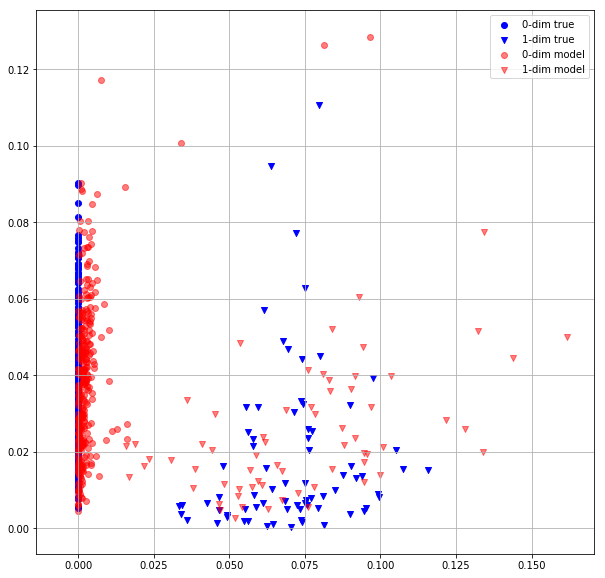

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.5952995420 0.6387883425


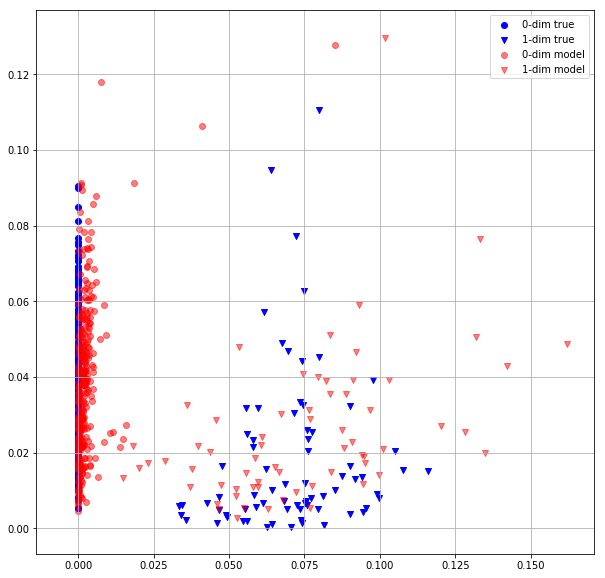

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.5880174637 0.6212211847


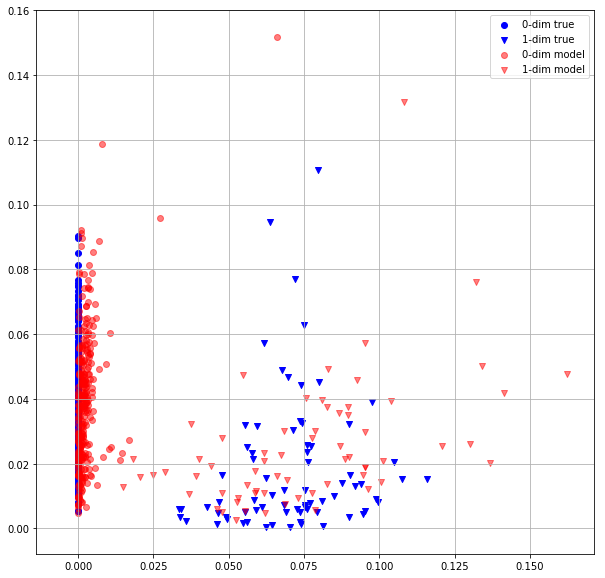

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.5836097598 0.6111382842


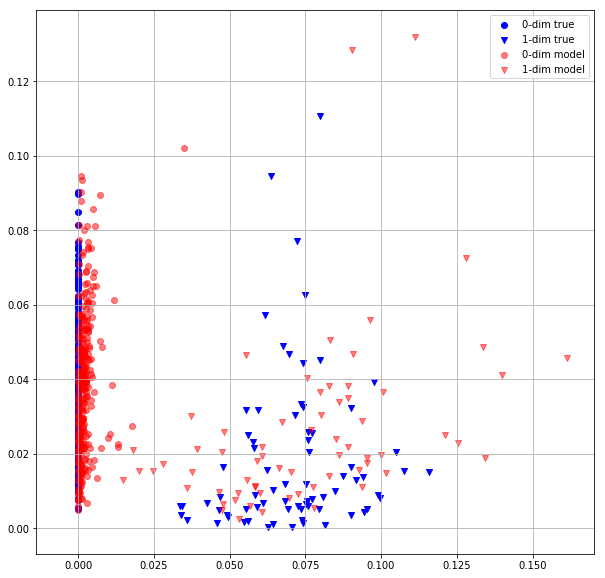

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.5756408572 0.6032258272


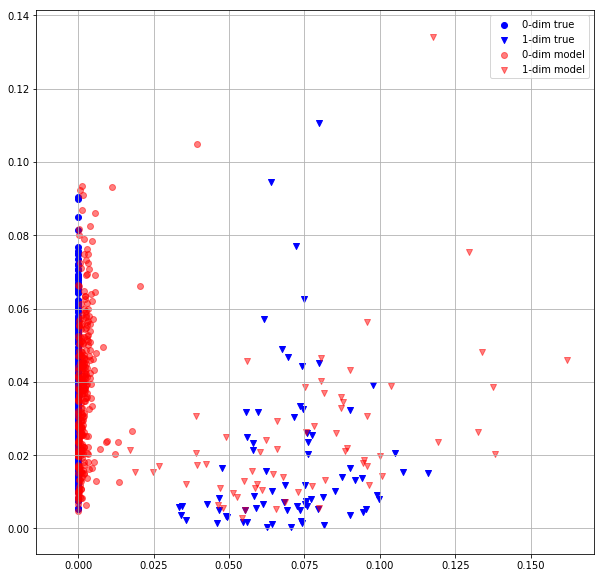

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.5689014196 0.6027636528


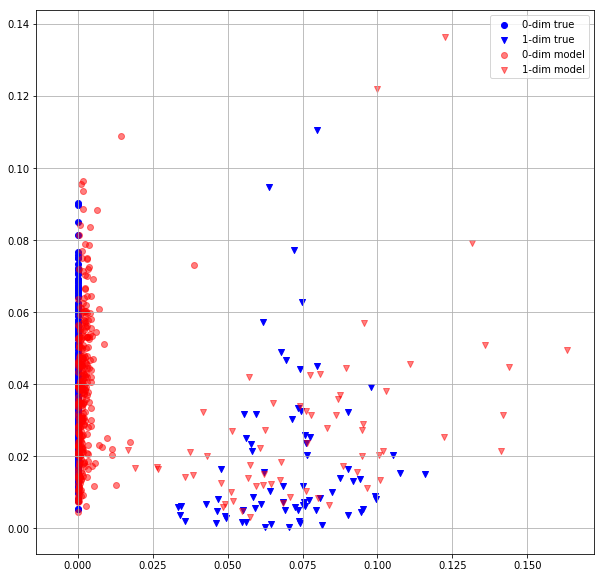

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.5782980323 0.5914831161


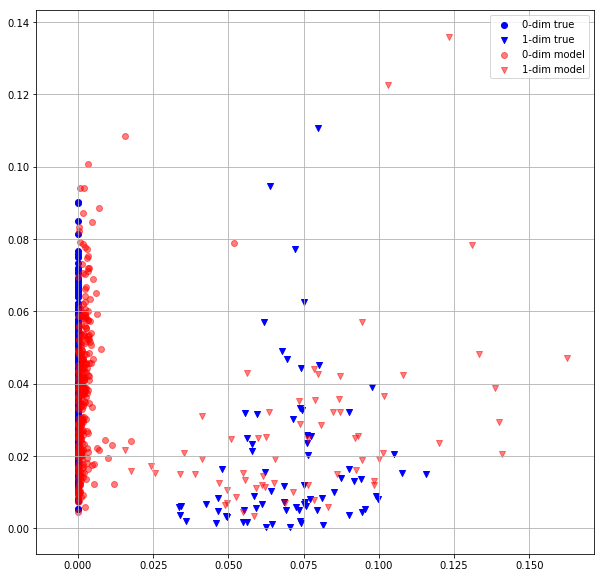

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.5626355410 0.5745508671


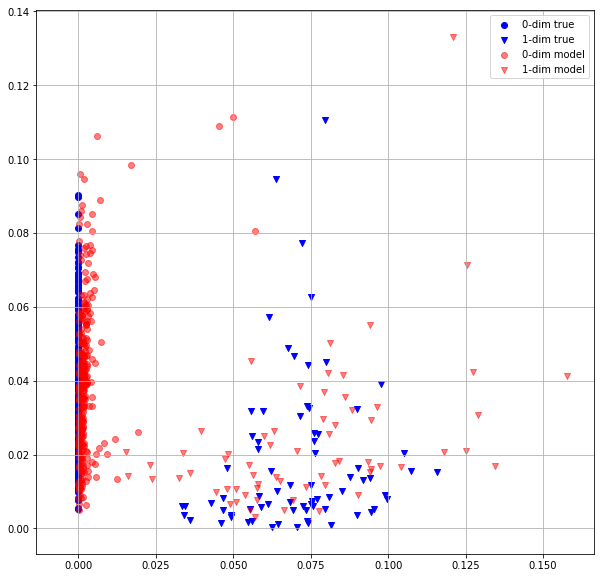

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.5492654443 0.5580943823


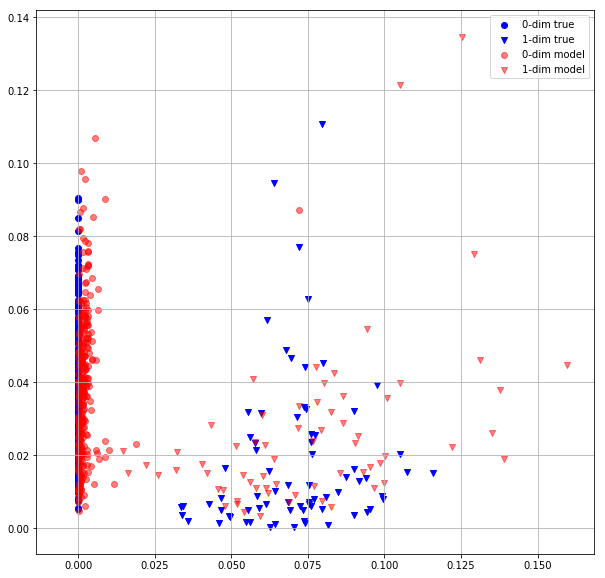

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.5592923164 0.6175320745


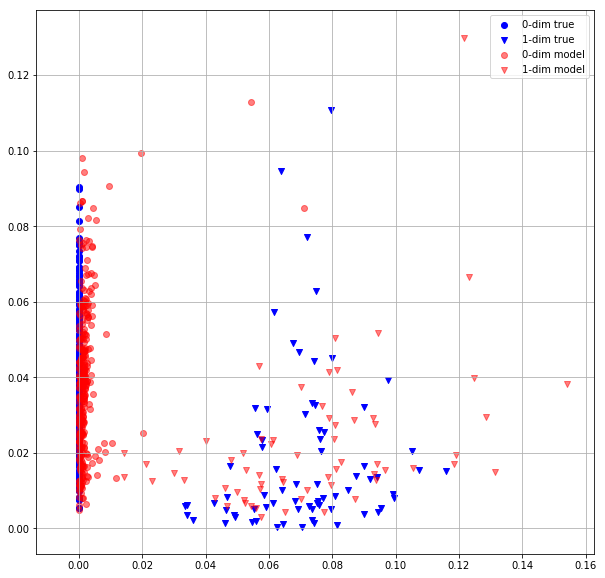

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.5754973888 0.6033411622


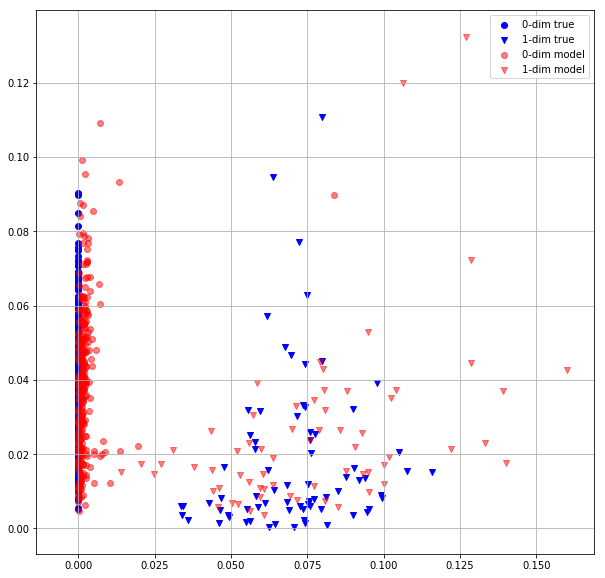

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.5531845689 0.5653175116


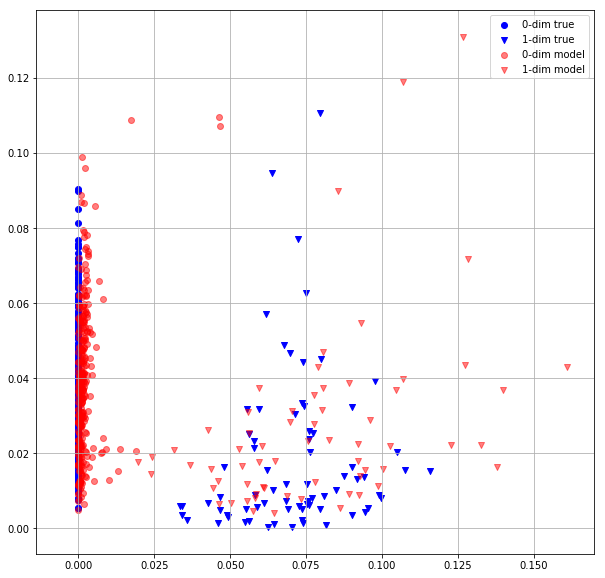

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.5463277698 0.5864957571


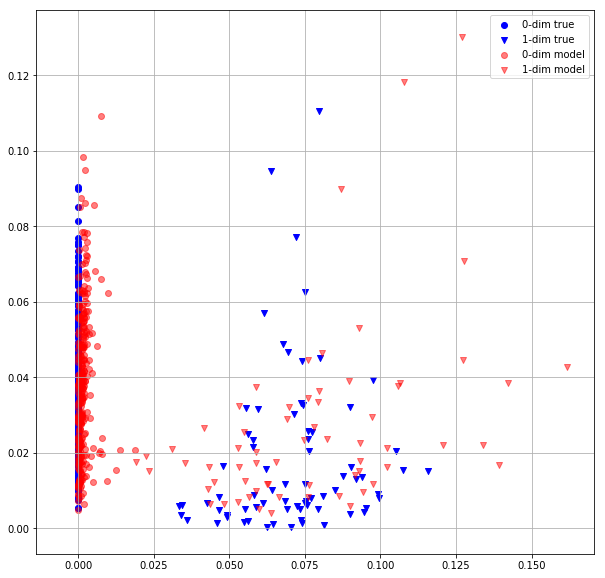

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.5575625300 0.5869785547


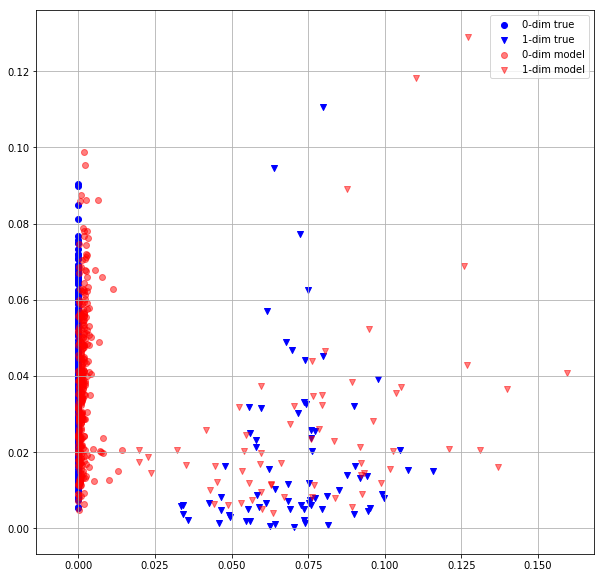

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.5551128387 0.5837733746


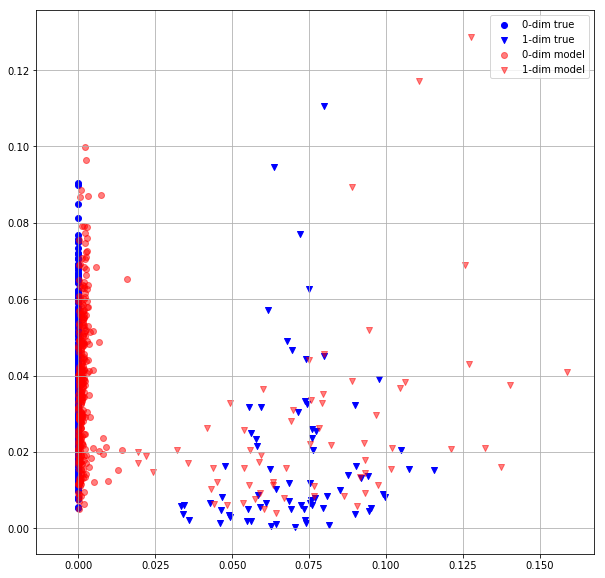

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.5459408760 0.5756972432


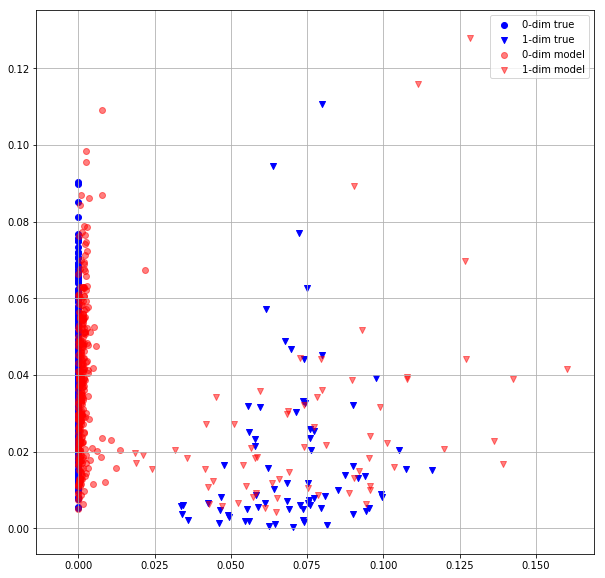

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.5439460278 0.5633049607


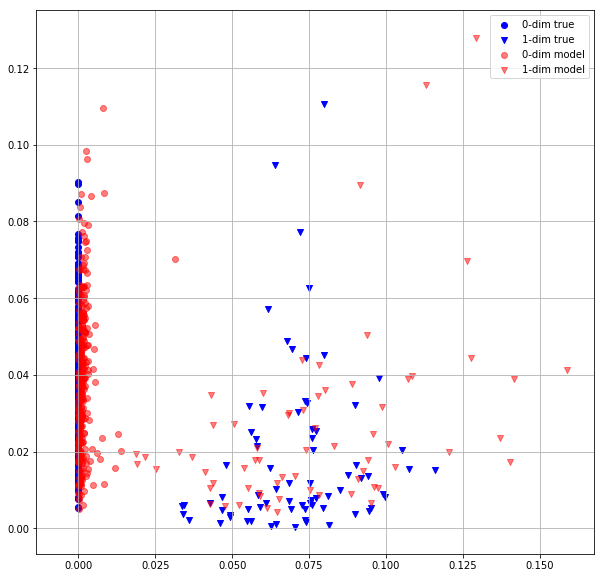

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.5248593688 0.5679101944


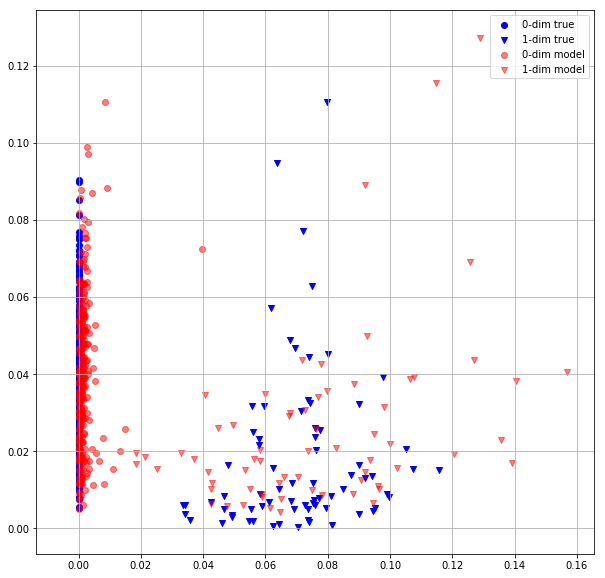

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.5314288735 0.5510801673


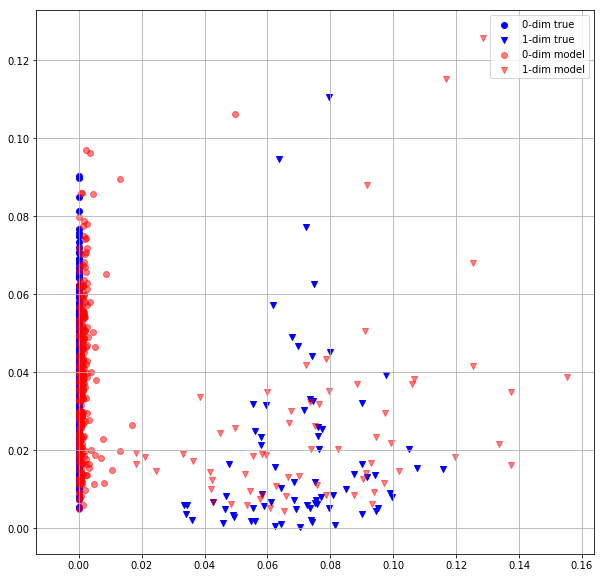

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.5241791606 0.5597835183


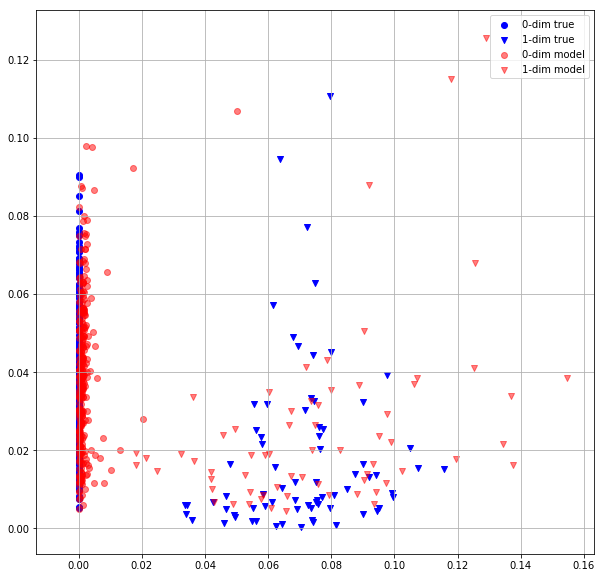

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.5216878653 0.5524517298


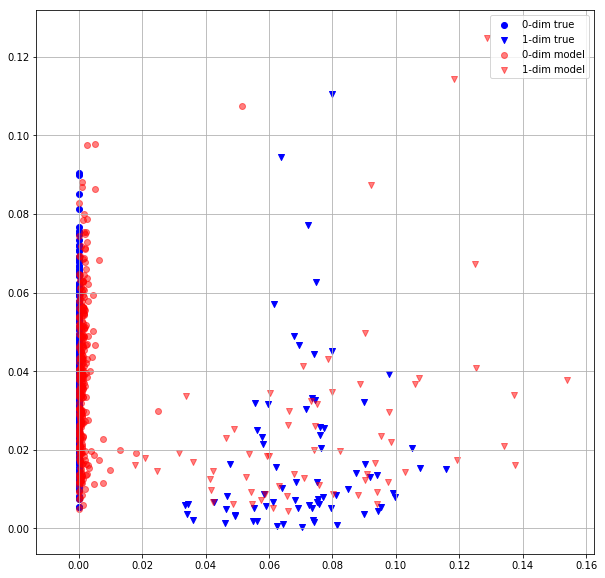

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.5127813220 0.5451709628


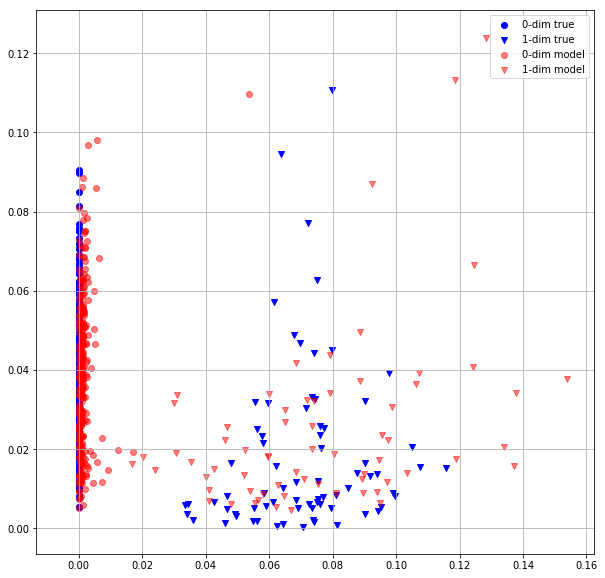

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.5082674623 0.5601879358


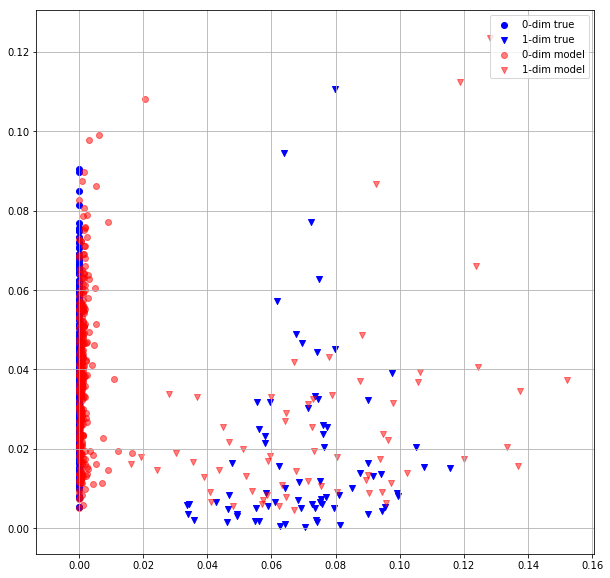

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.5215645432 0.5533828139


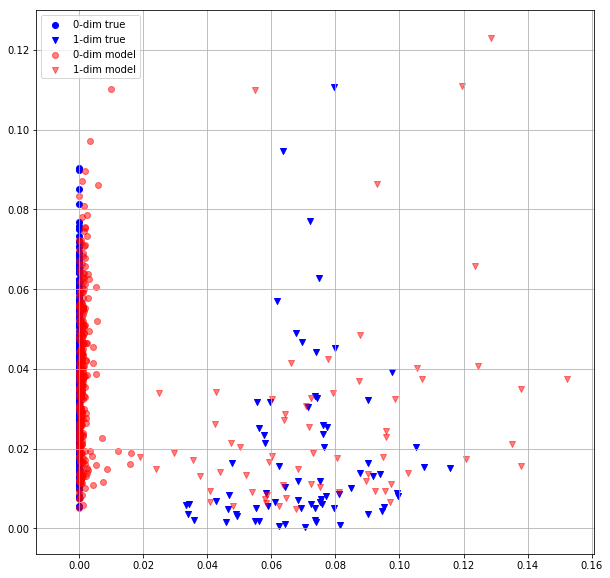

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.5196384192 0.5503346920


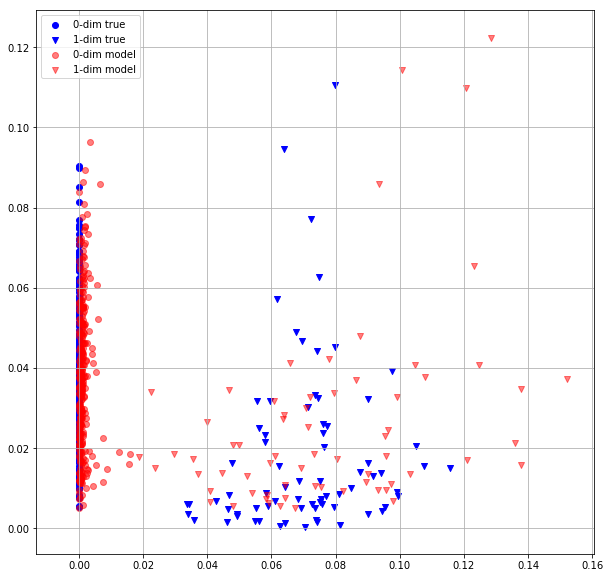

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.5157222152 0.5557224154


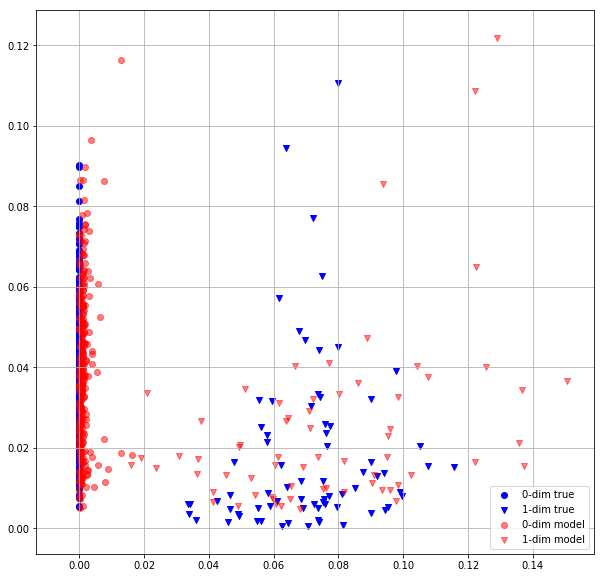

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.5172252059 0.5500074029


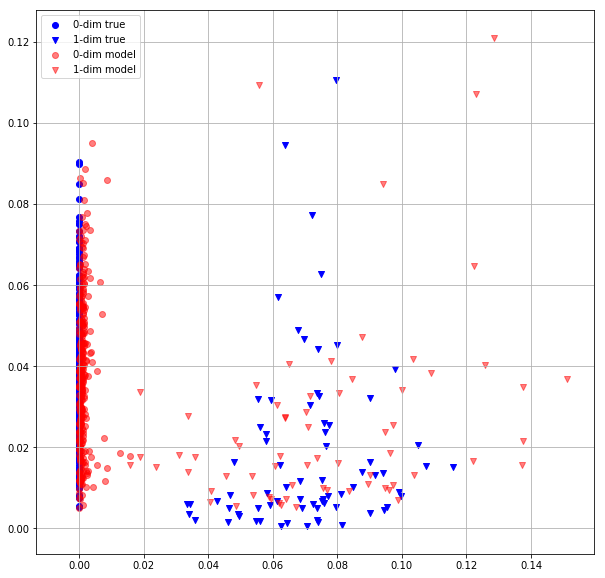

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.5113793015 0.5332952142


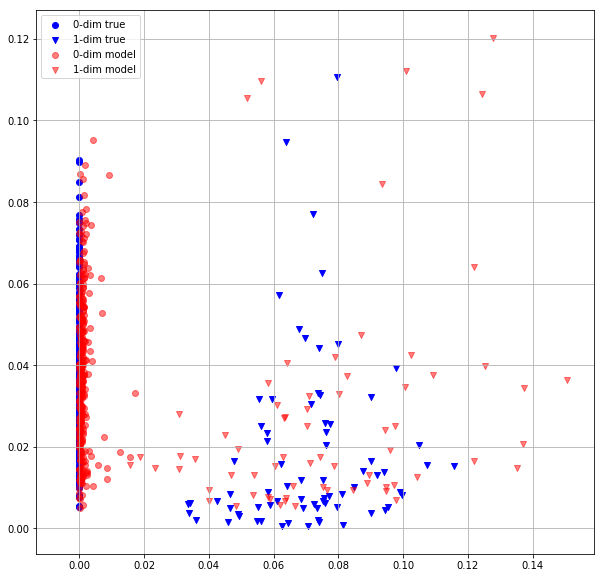

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.5103313923 0.5430591702


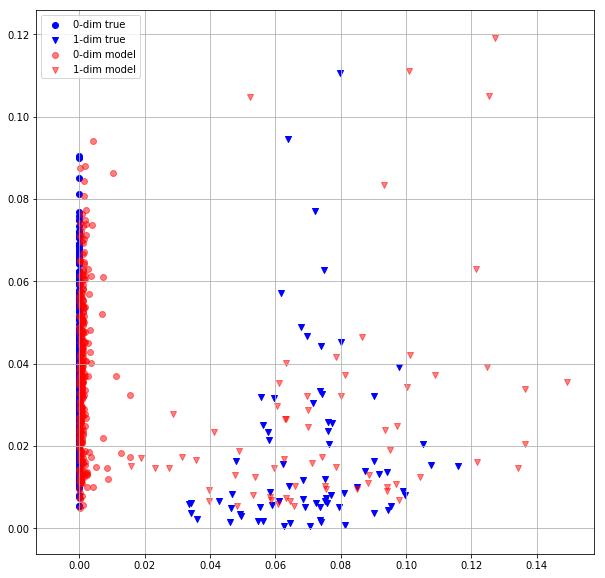

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  30 0.5115163922 0.5505339503


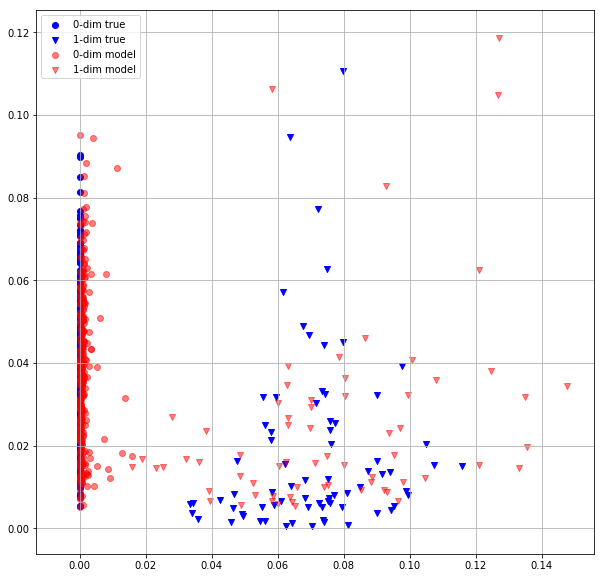

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  31 0.5186654925 0.5609908104


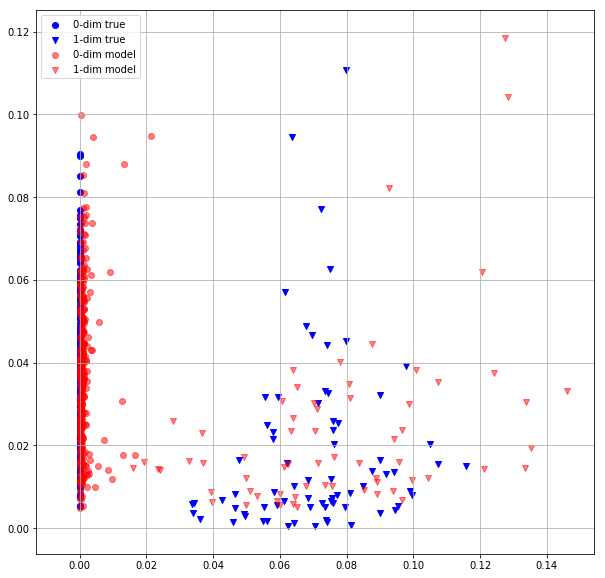

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  32 0.5200791955 0.5371826291


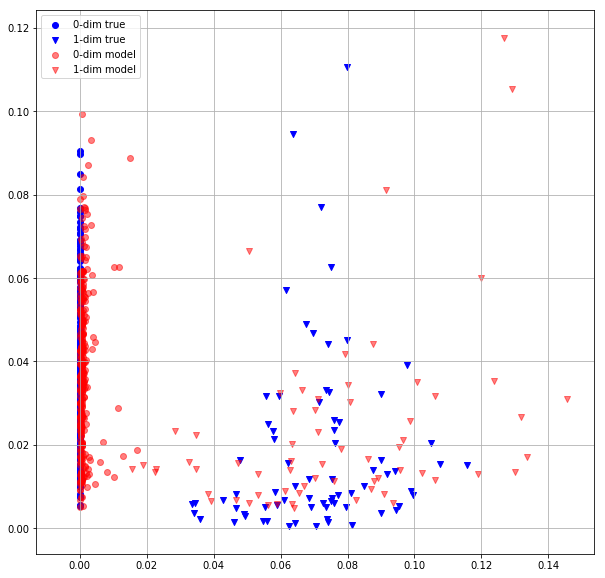

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  33 0.5167605281 0.5776219964


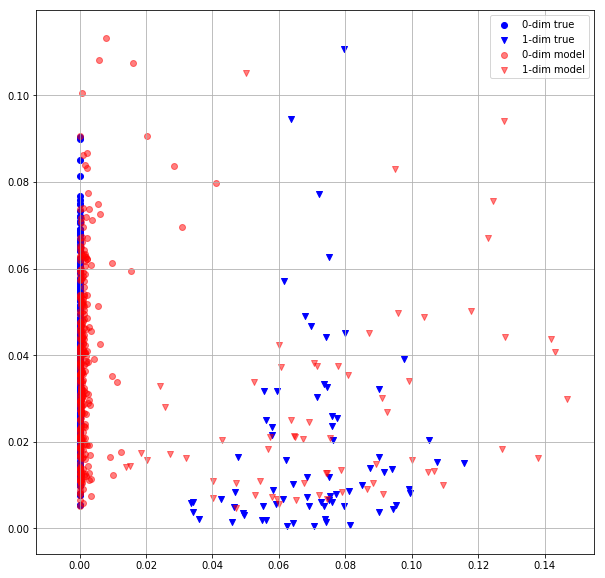

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  34 0.5212190747 0.5556289554


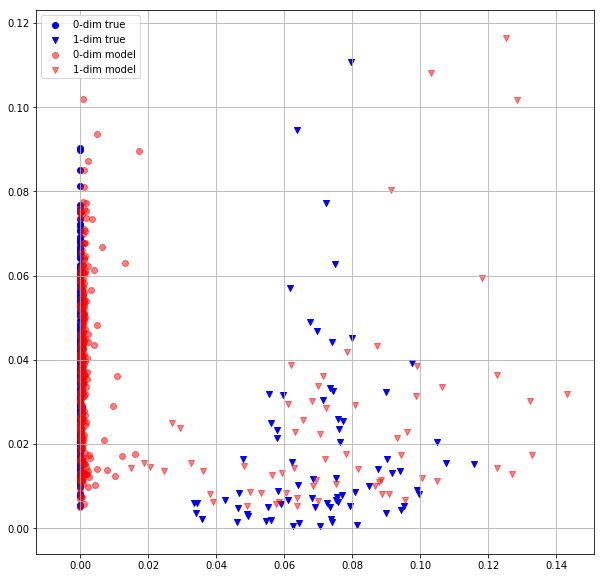

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  35 0.5259658694 0.5761762857


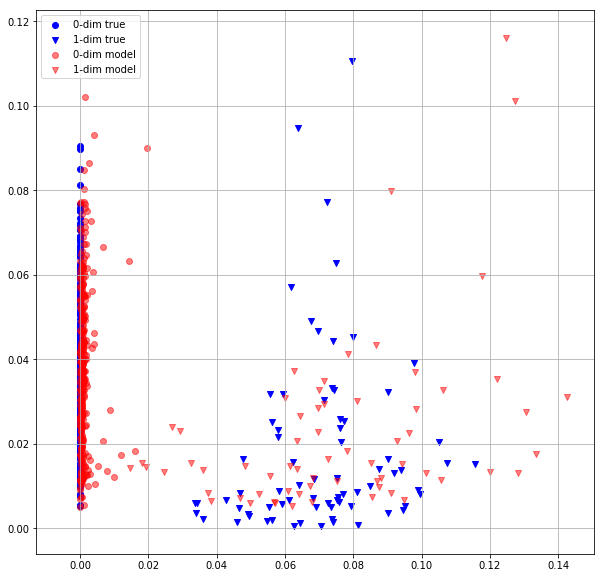

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  36 0.5383555889 0.5685934424


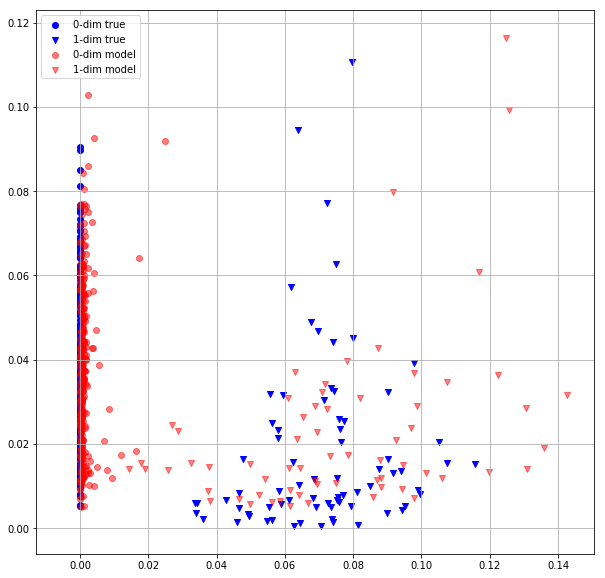

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  37 0.5291754007 0.5525571108


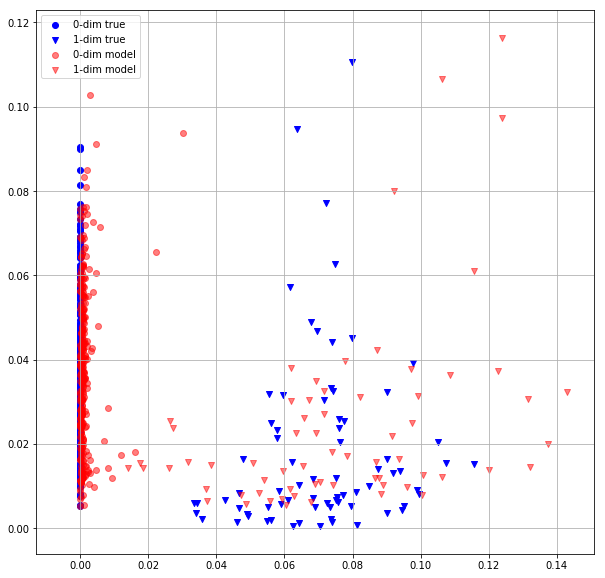

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  38 0.5143201351 0.5307897329


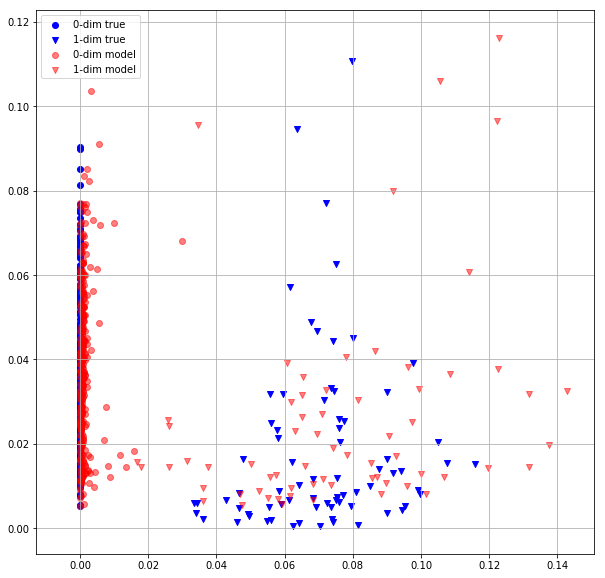

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  39 0.4910575151 0.5215330720


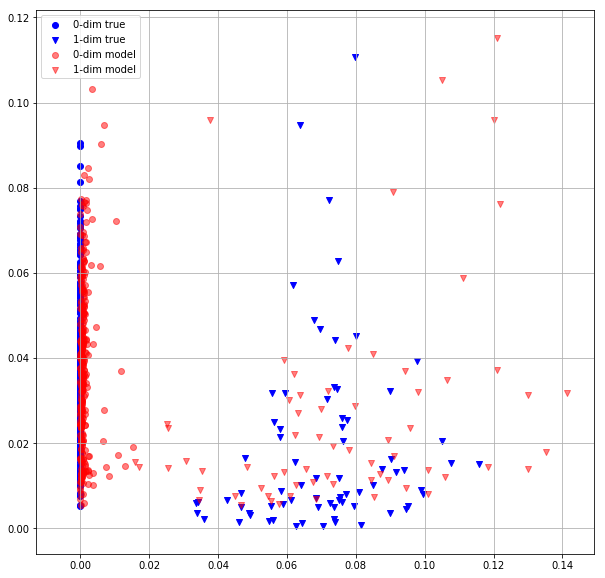

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  40 0.4903306067 0.5237089396


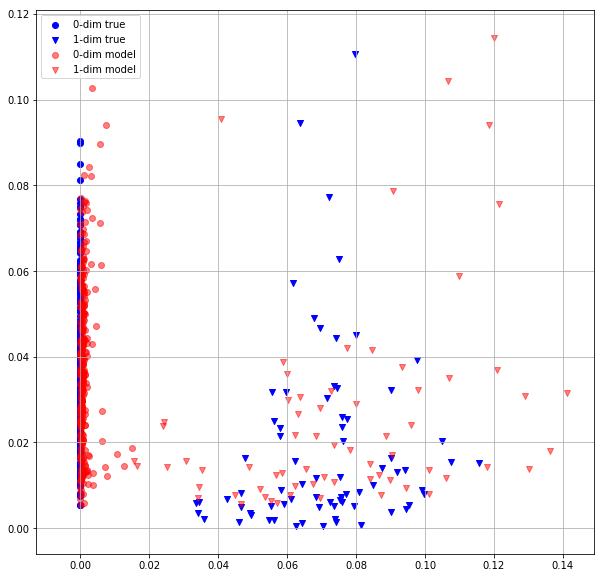

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  41 0.4777852595 0.4860472381


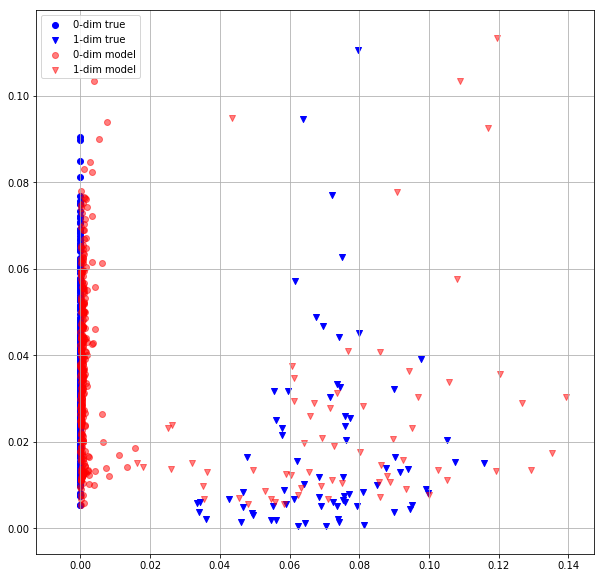

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  42 0.4699170589 0.4935140610


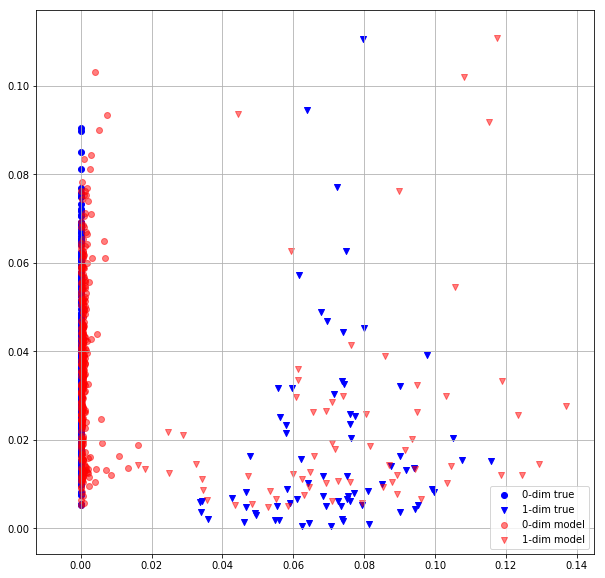

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  43 0.4635263681 0.5018833280


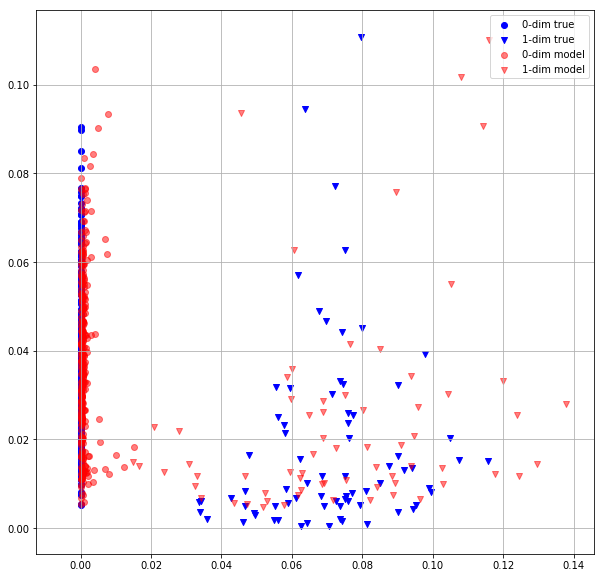

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  44 0.4683019221 0.4938386679


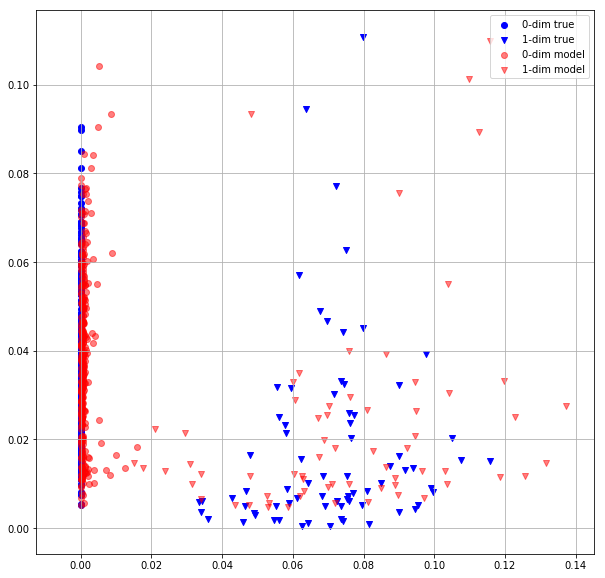

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  45 0.4689463377 0.4861320257


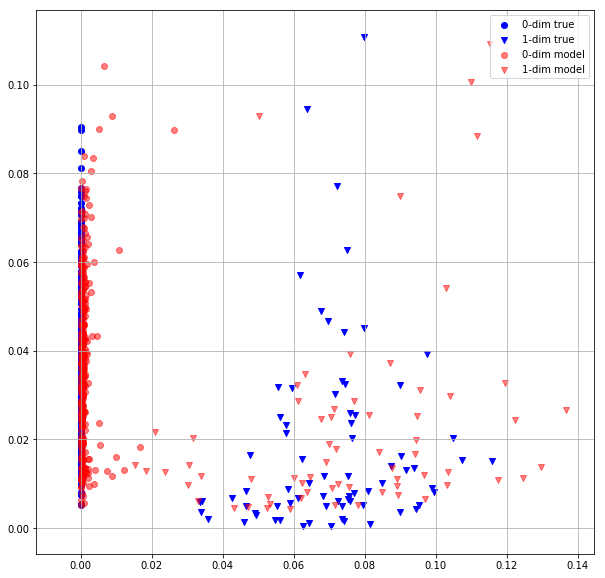

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  46 0.4733718932 0.5005244613


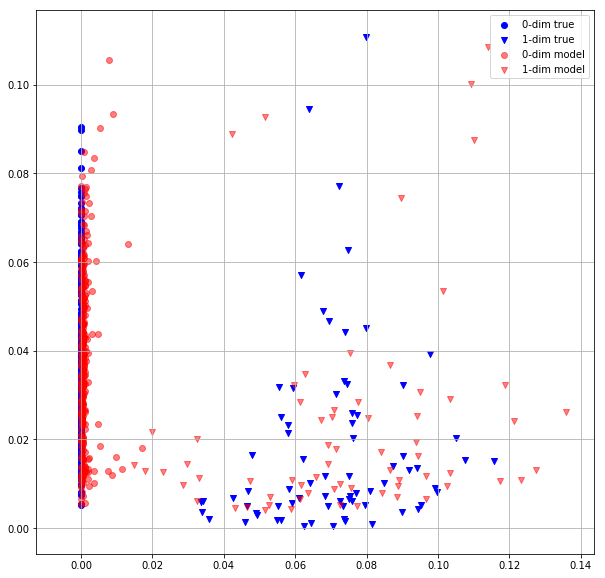

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  47 0.4570597112 0.4740727544


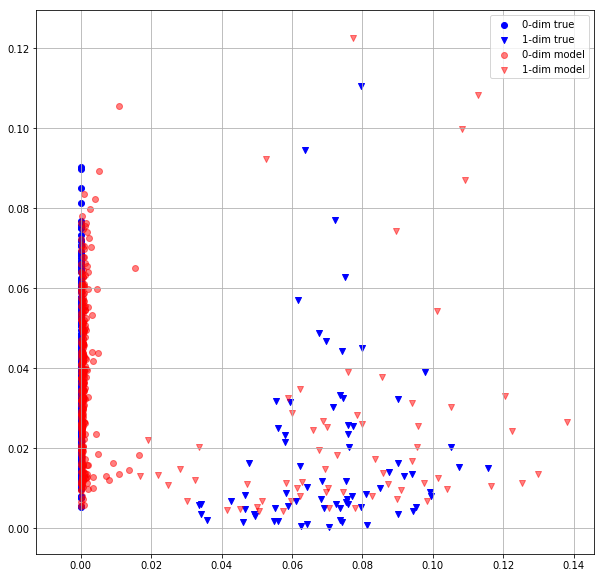

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  48 0.4401124120 0.4535337090


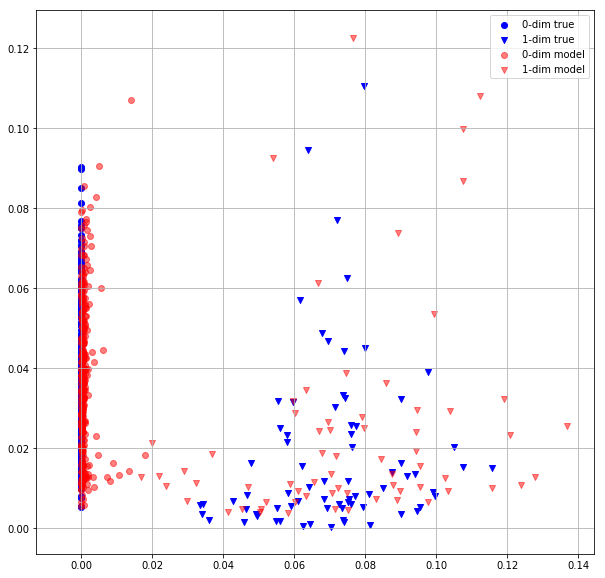

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  49 0.4332250953 0.4451999664


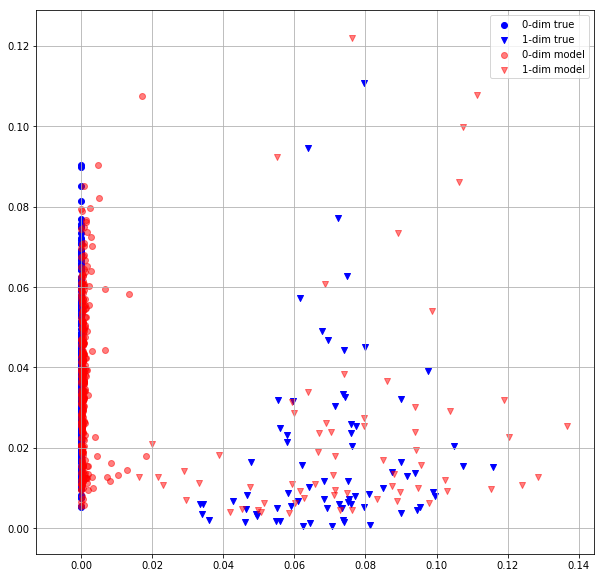

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  50 0.7526025176 0.7287772298


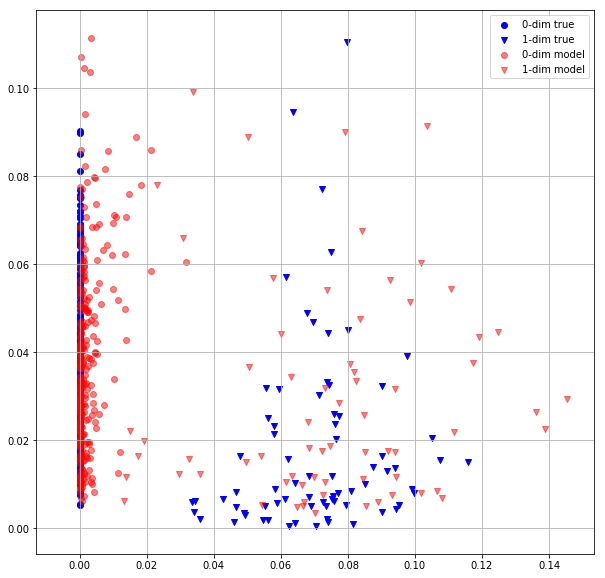

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  51 0.6955870986 0.6344497800


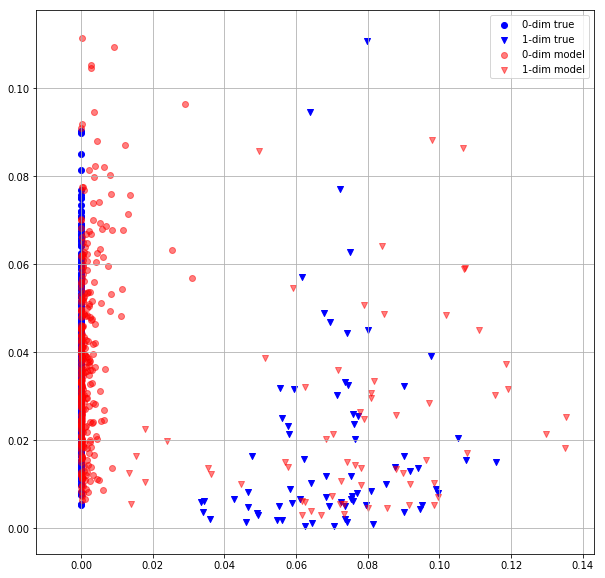

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  52 0.5941398144 0.6066313386


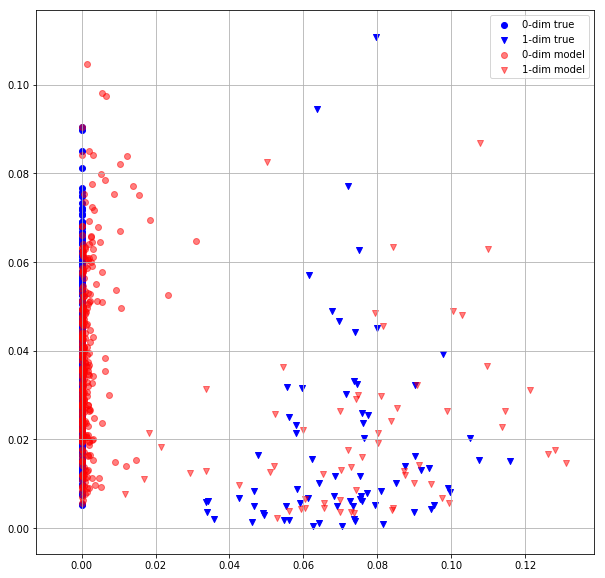

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  53 0.5696478486 0.5723734498


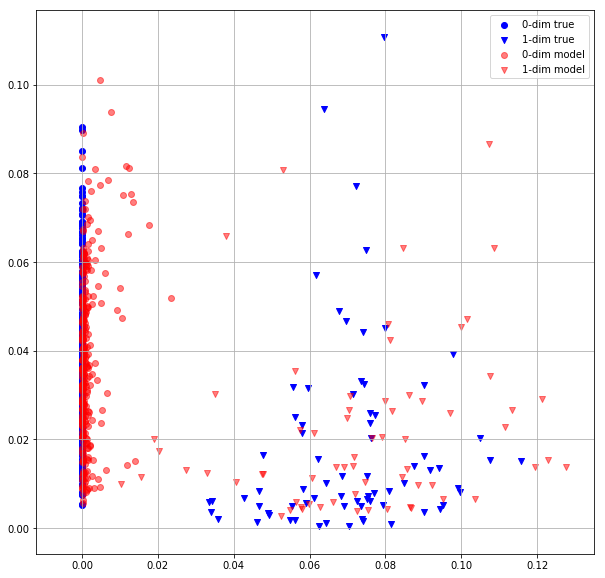

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  54 0.5323598385 0.5474163294


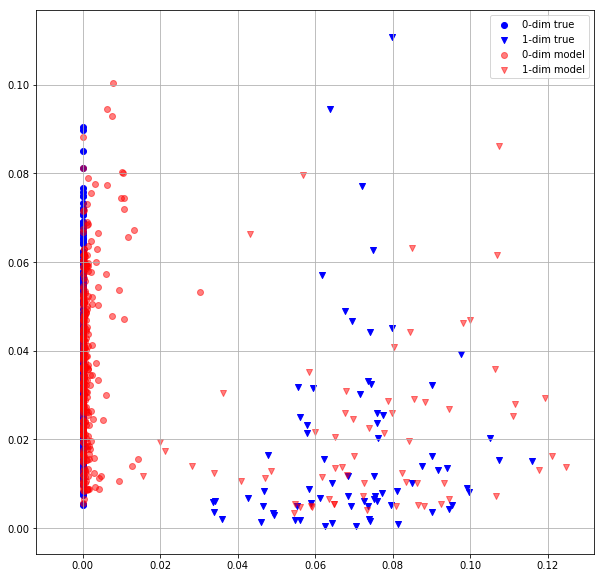

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  55 0.4951230884 0.4726530313


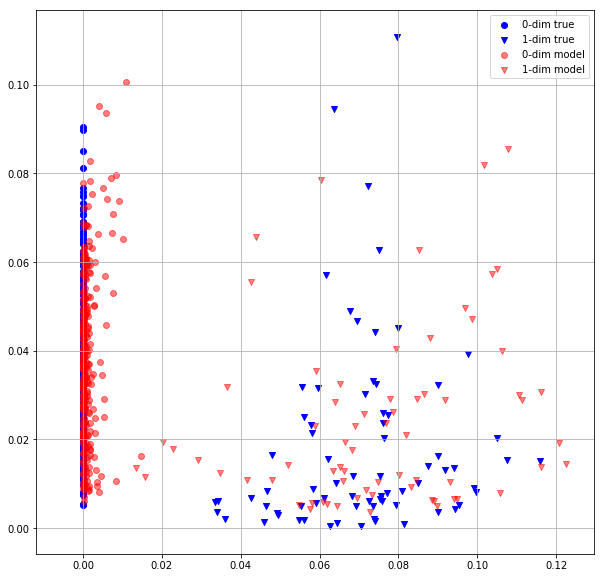

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  56 0.4558893442 0.4881395996


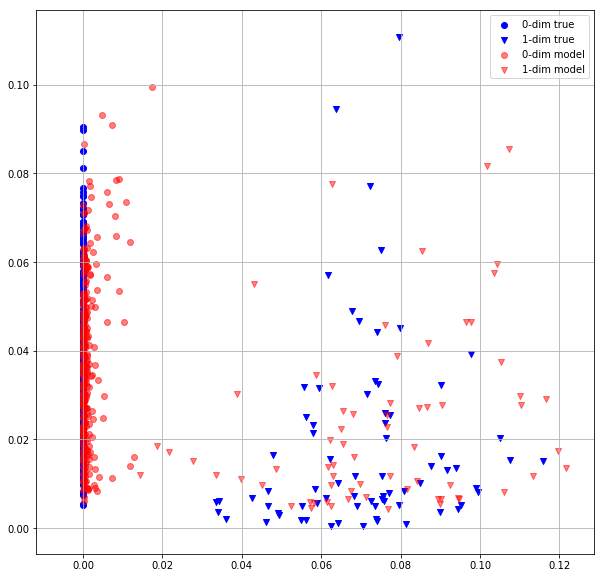

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  57 0.4647508860 0.4699572325


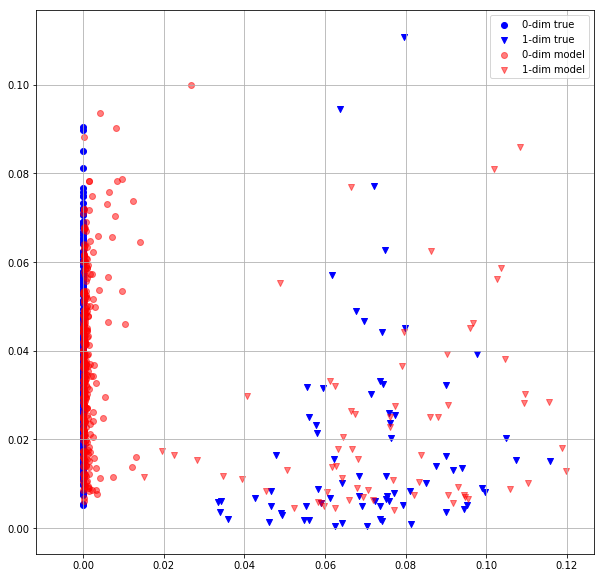

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  58 0.4765370190 0.5095275640


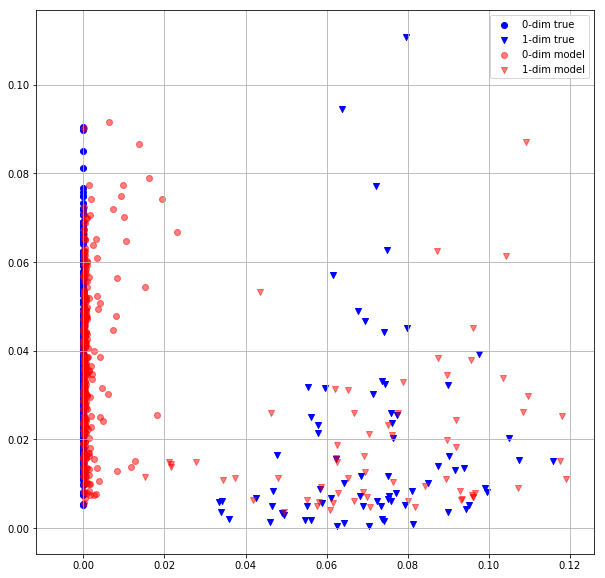

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  59 0.4673725069 0.4798055589


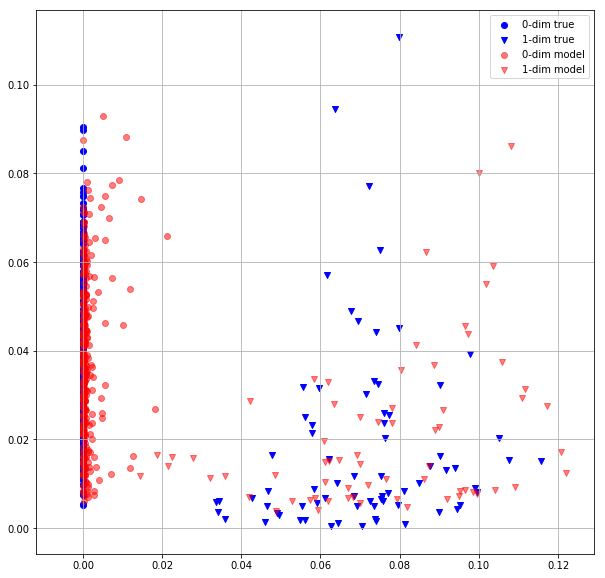

In [8]:
#Transformer enc + Top-N + MLP + non-neg + weighted matching + reg = 5
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    #mask0 = (m == 0)
    #mask1 = (m == 1)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

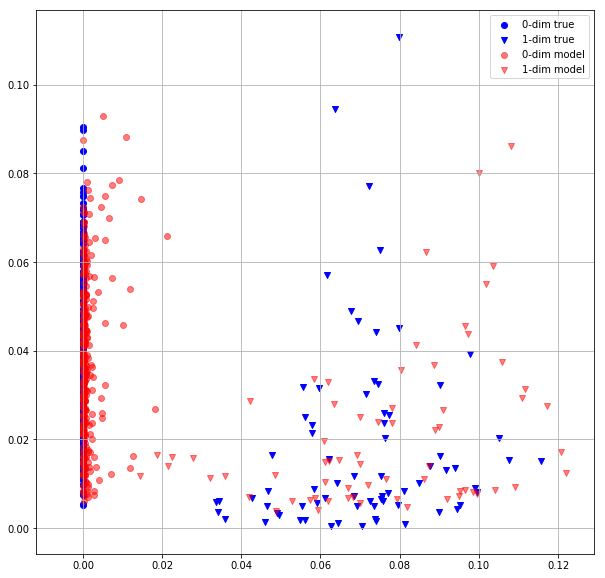

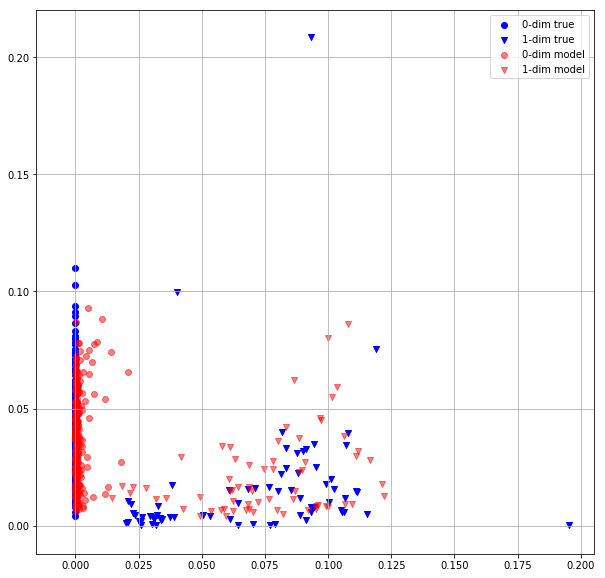

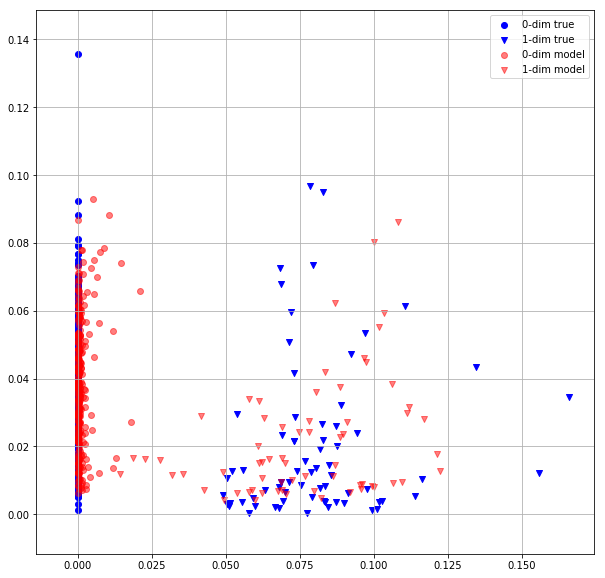

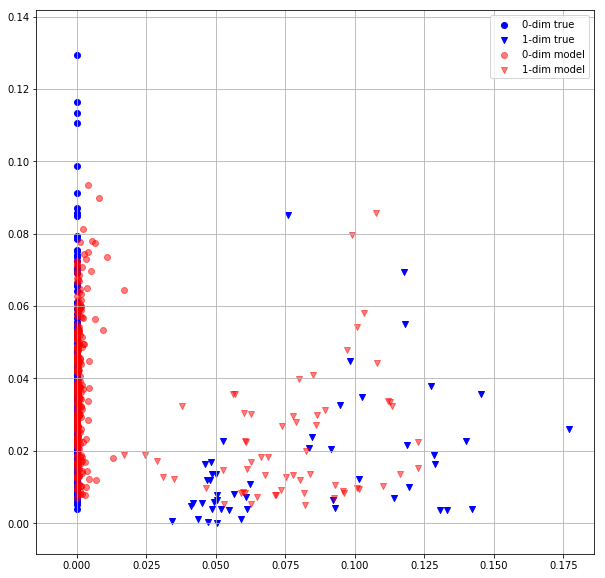

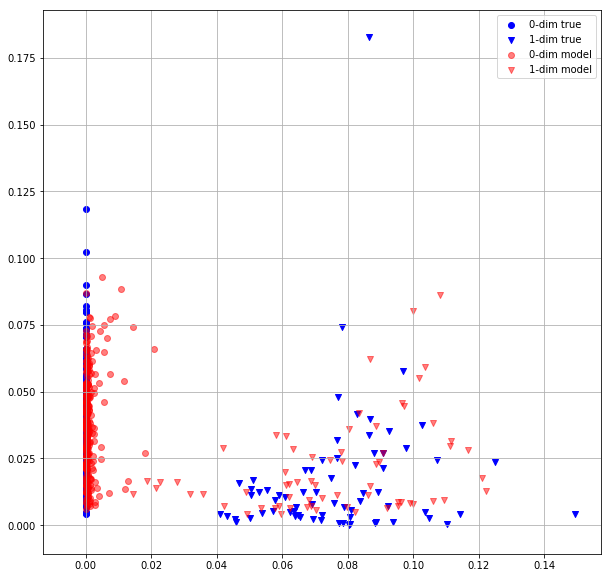

...

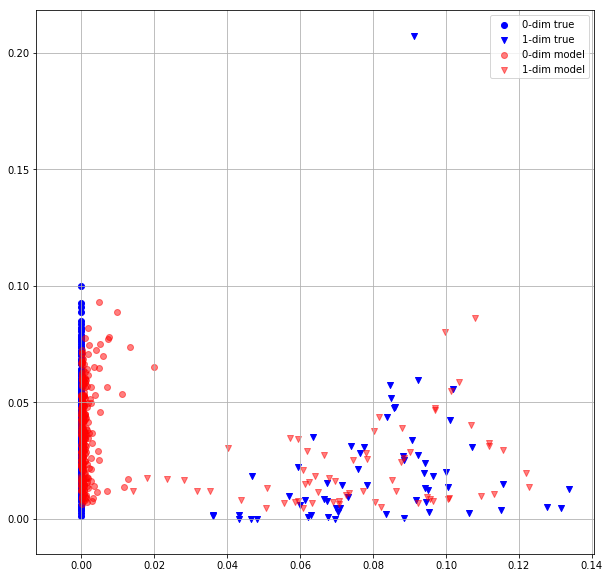

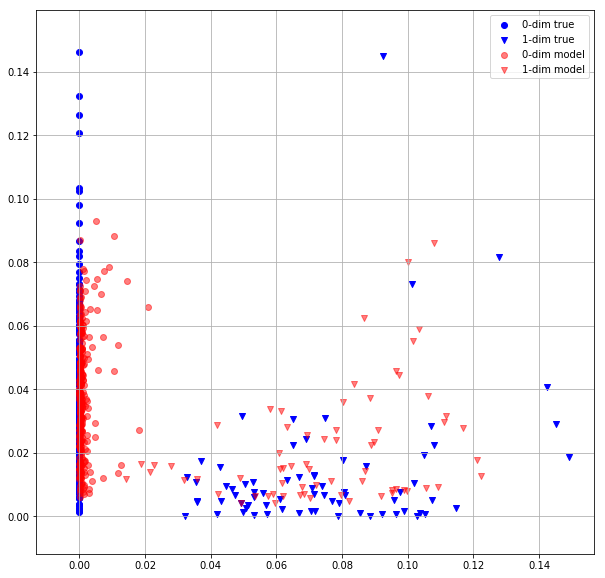

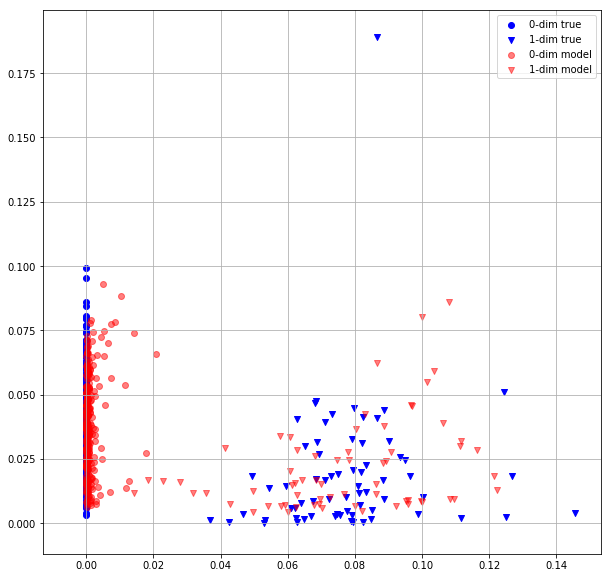

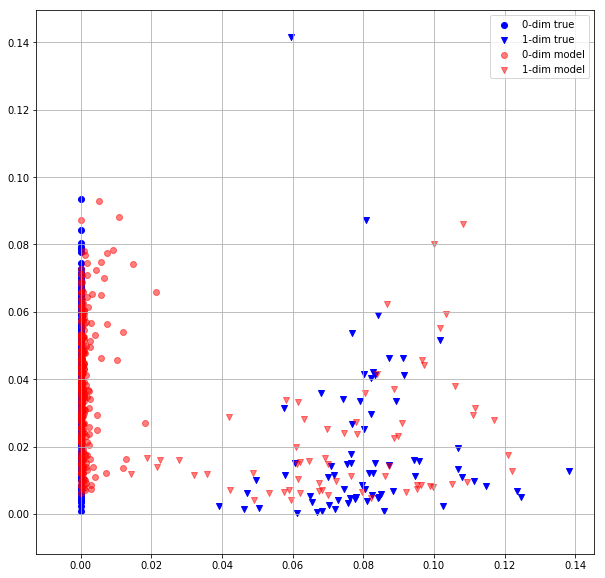

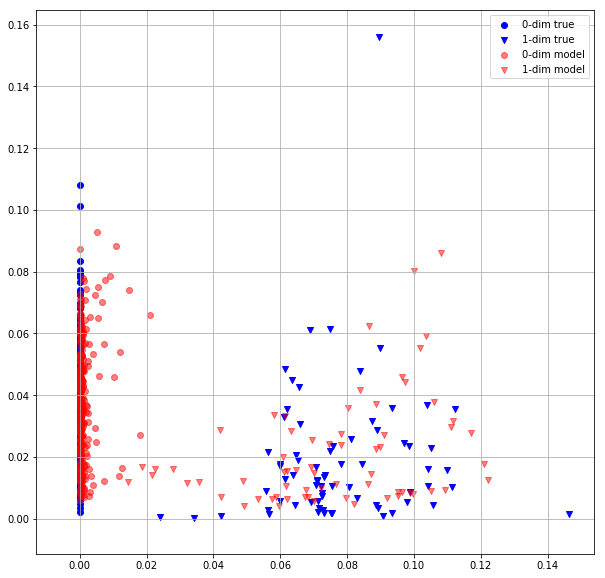

In [9]:
for i in range(15):
    item = dataset_test[i].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 6.1414241791 3.1766803265


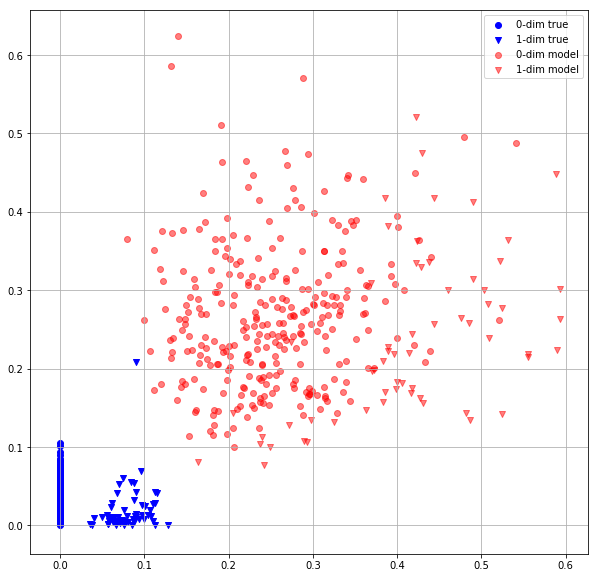

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 2.8943121433 1.7540696859


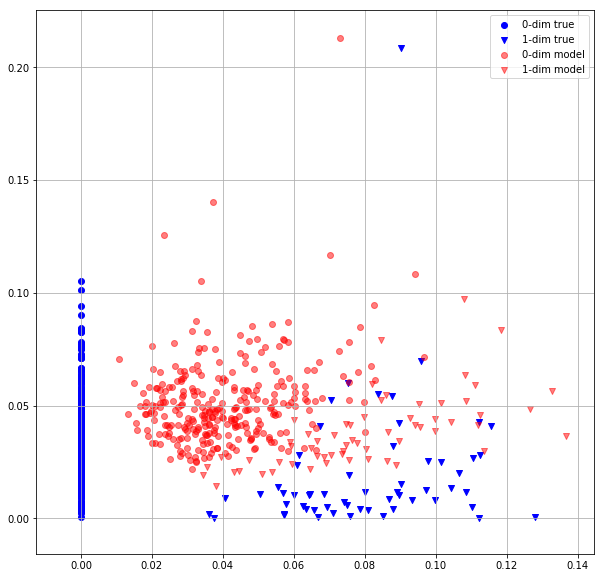

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 1.4278204441 1.2784537077


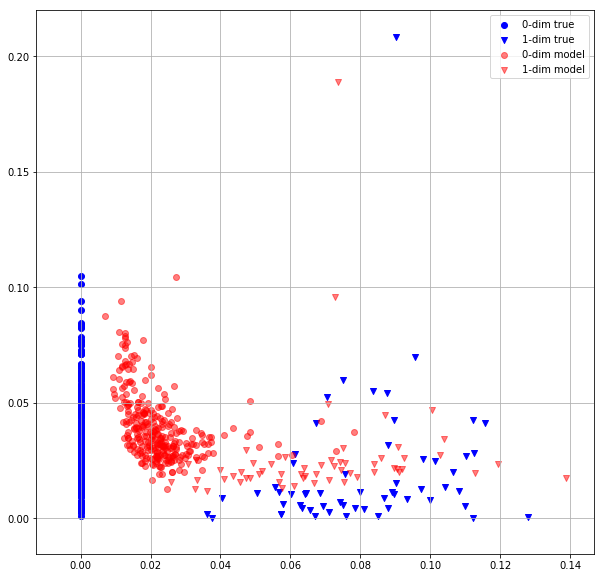

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.8966152072 0.7218336463


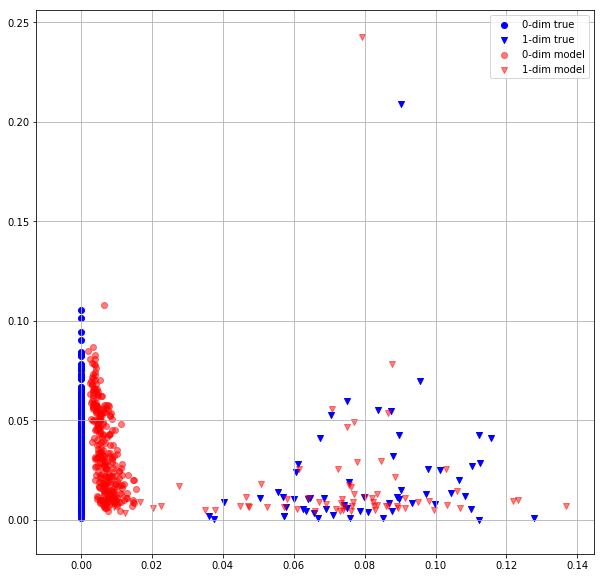

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.5498198867 0.6618324518


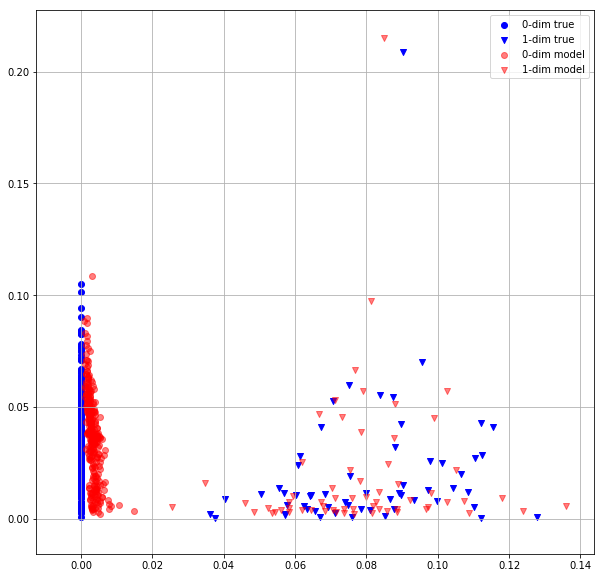

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.5479795933 0.6736467481


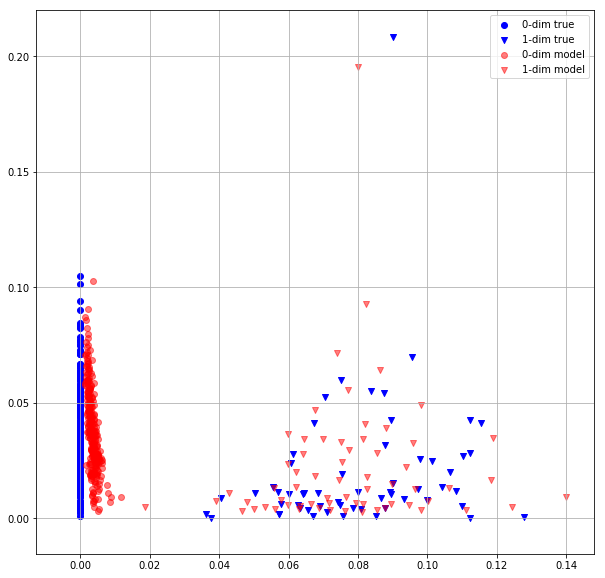

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.5248589516 0.6342987418


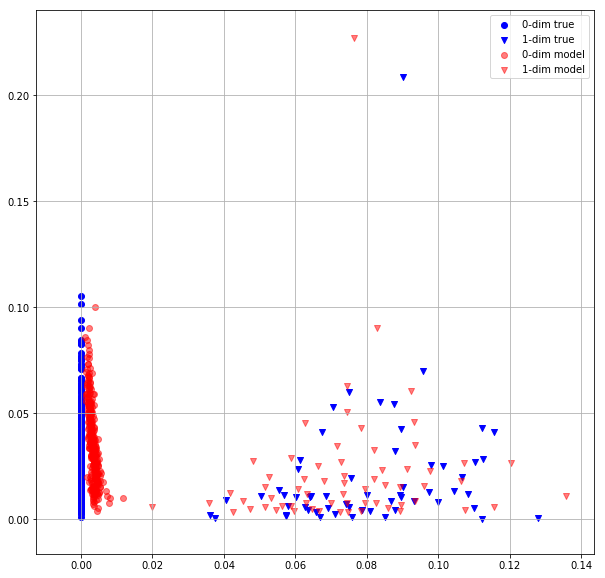

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.5048685074 0.6524368525


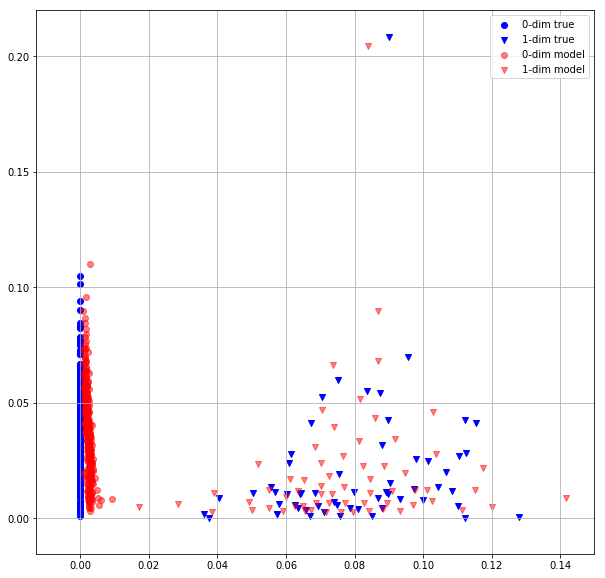

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.5160578489 0.6609352827


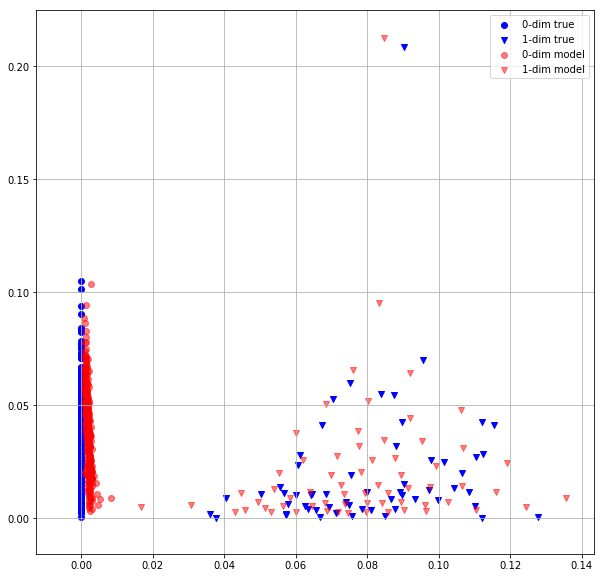

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.5453903079 0.6431519985


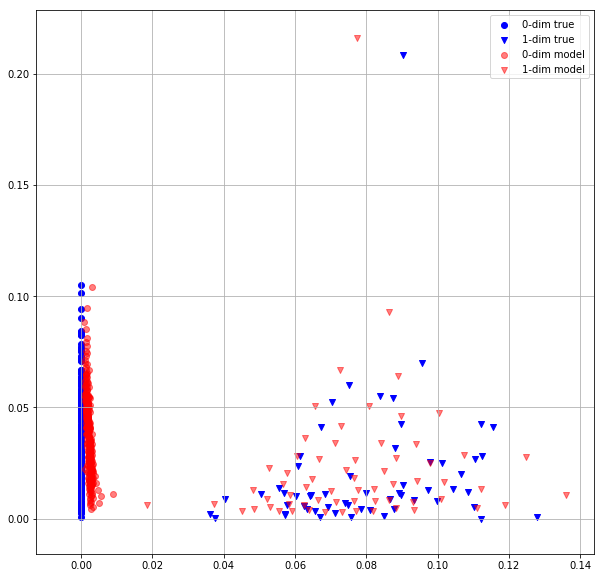

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.5094568133 0.6152082682


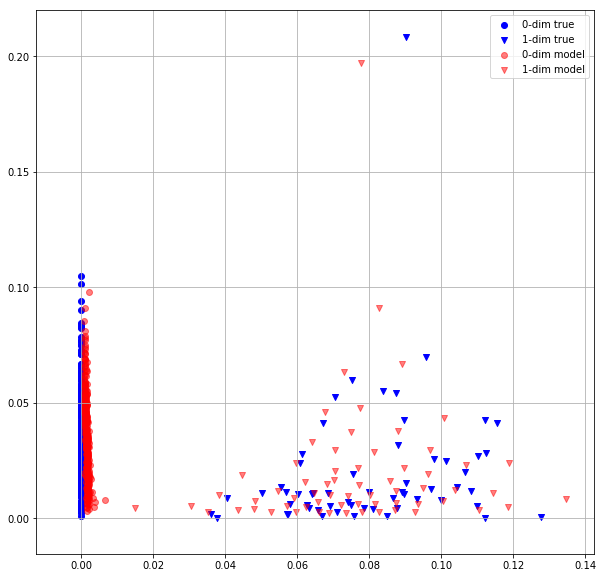

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.5198780894 0.6930980682


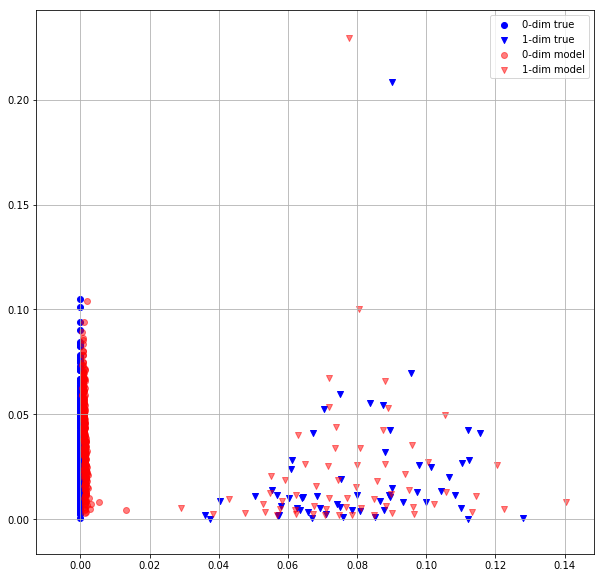

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.5879728198 0.6838300824


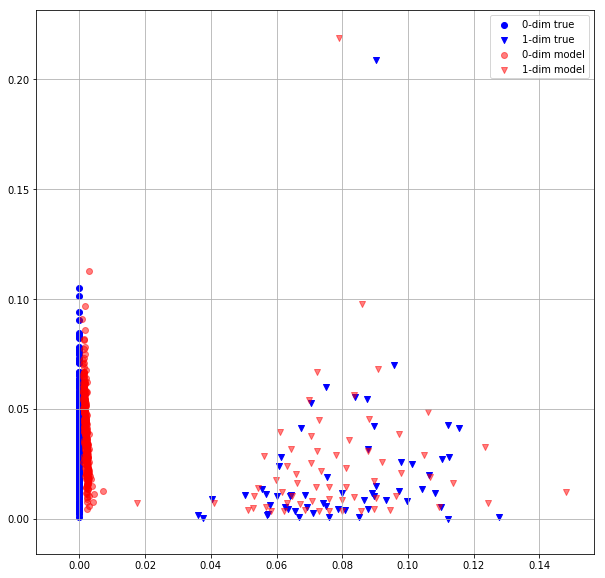

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.5419601202 0.6395276785


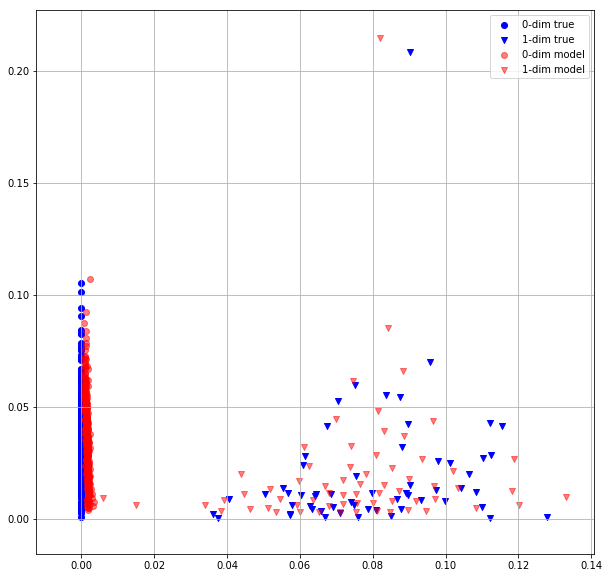

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.5205910802 0.6618312597


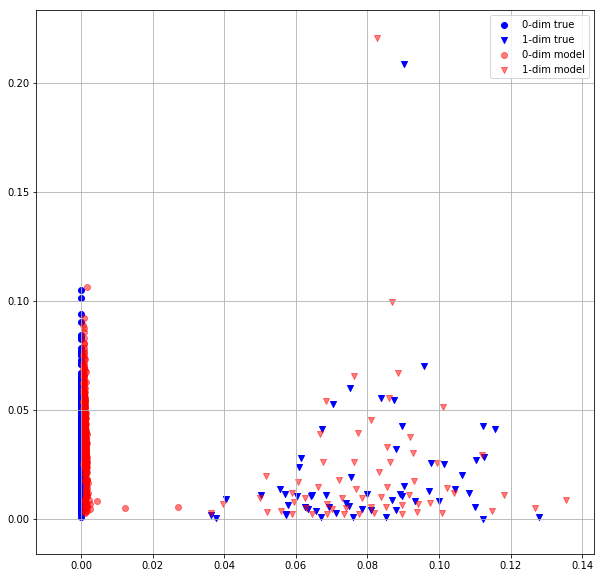

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.5797546506 0.6713414788


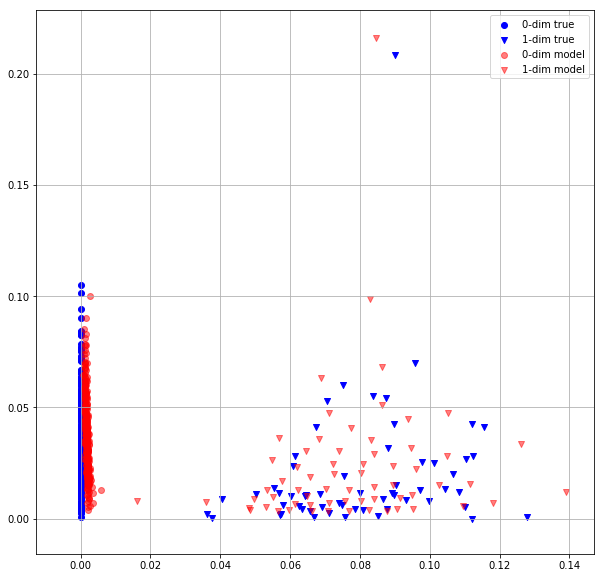

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.5369845033 0.6511777639


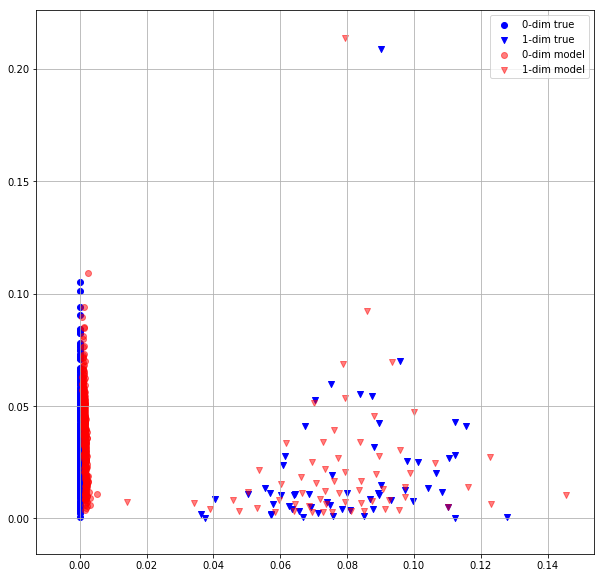

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.5300860405 0.6083691716


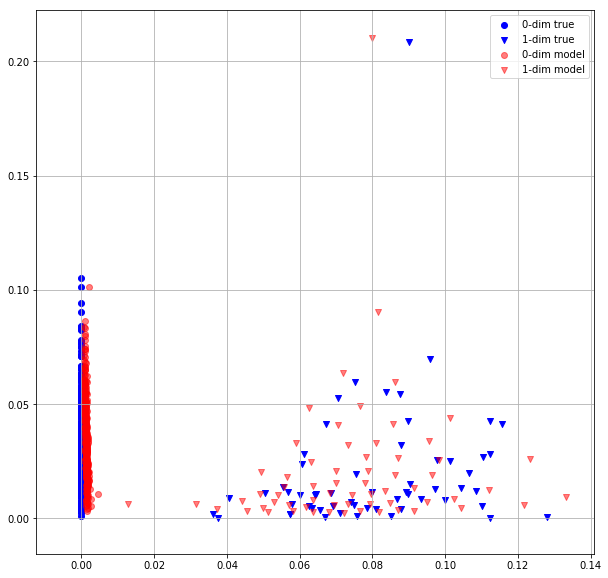

  0%|          | 0/13 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [4]:
#MLP enc + MLP dec + non-neg + weighted matching
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    #mask0 = (m == 0)
    #mask1 = (m == 1)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

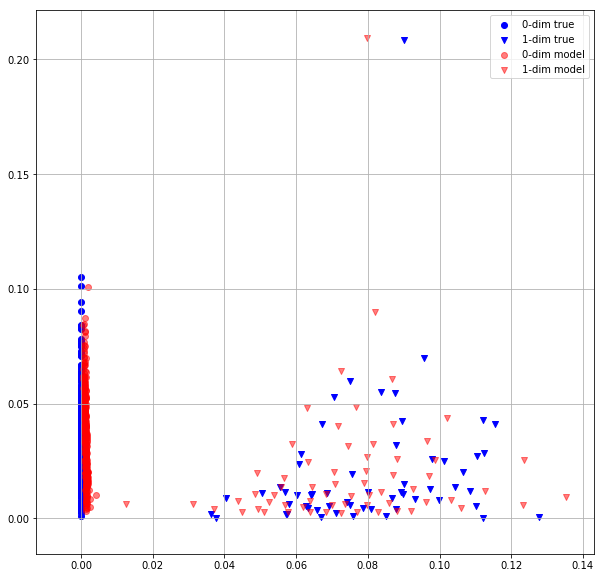

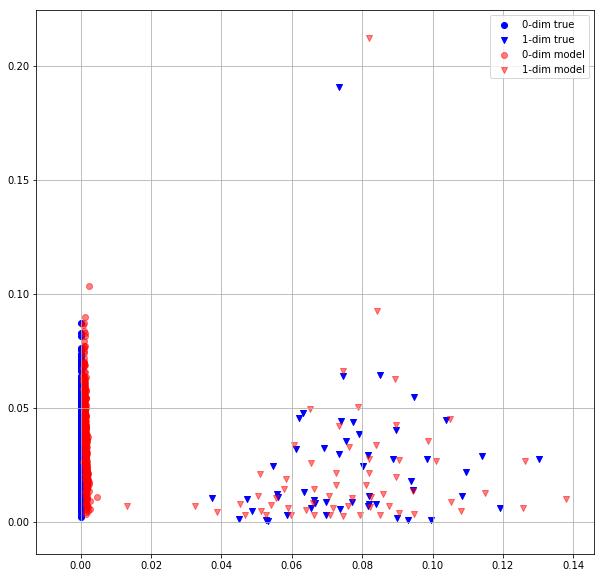

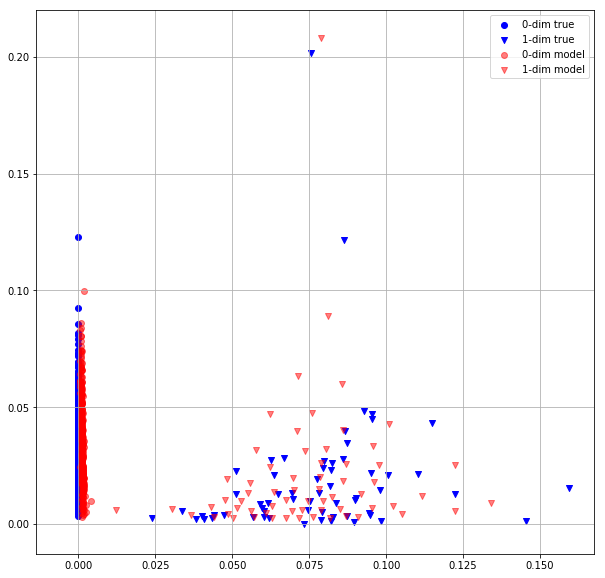

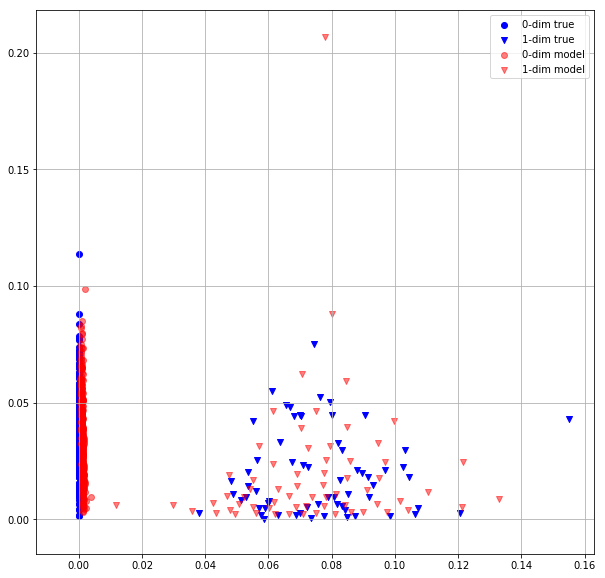

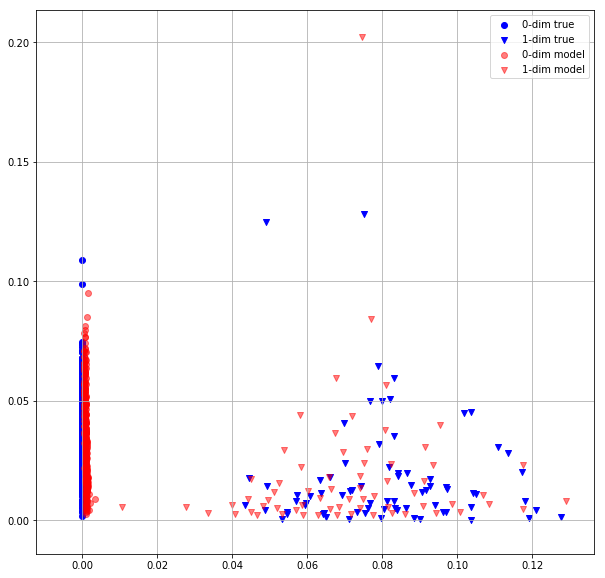

...

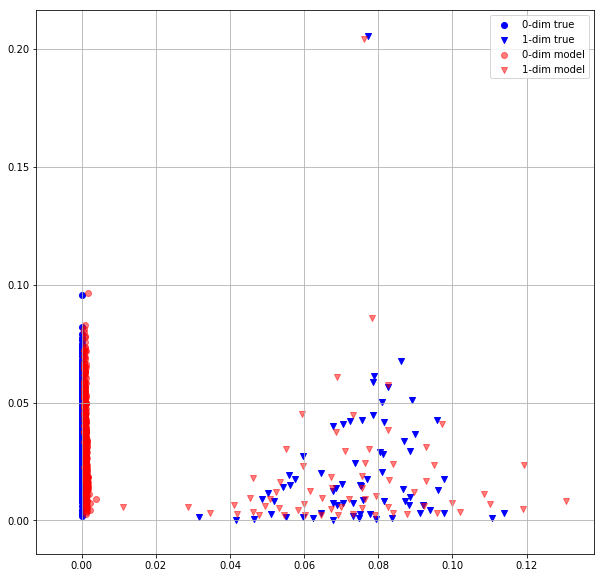

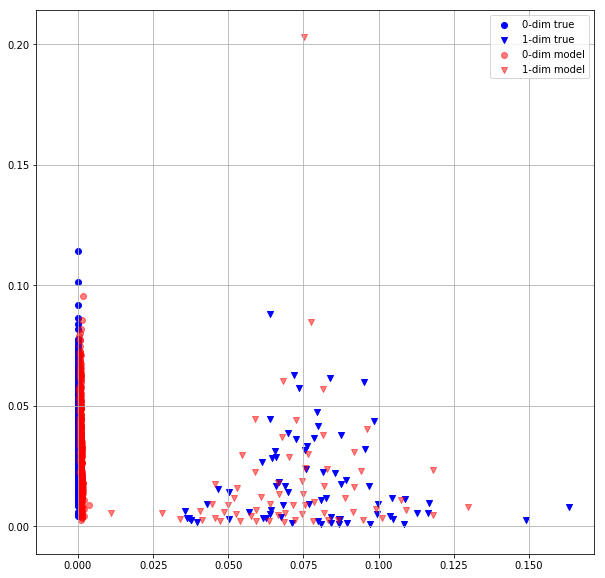

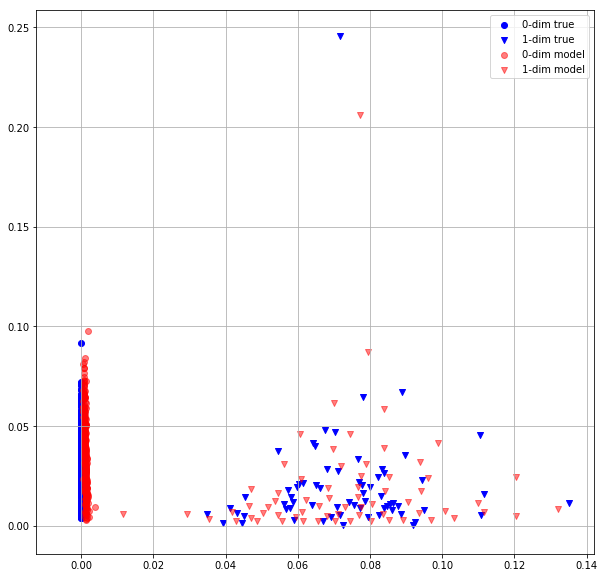

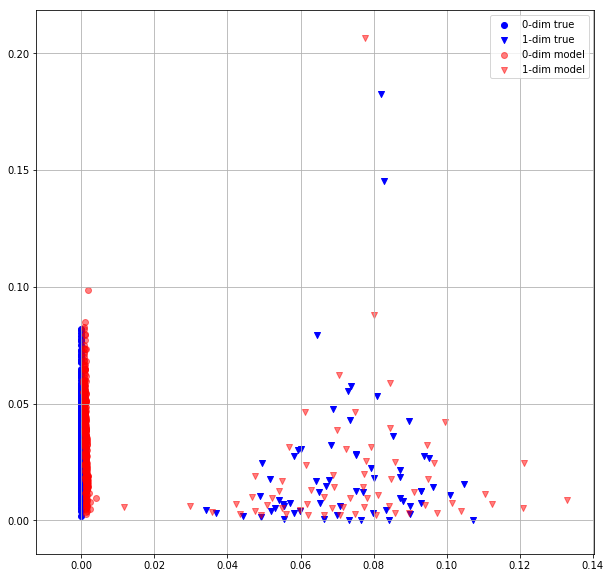

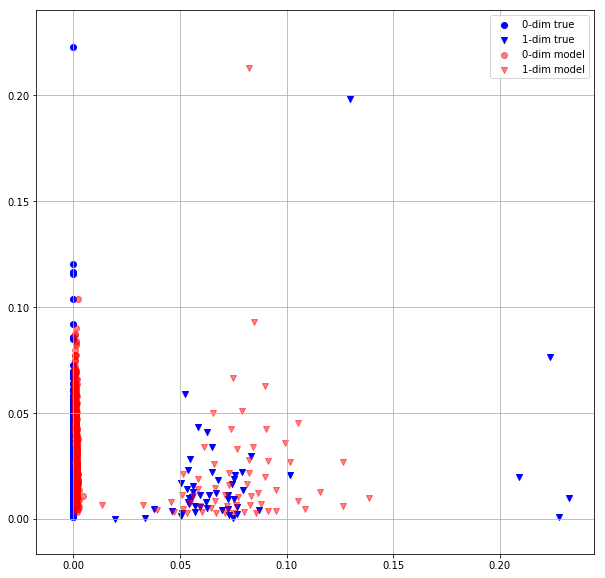

In [6]:
for i in range(15):
    item = dataset_test[i].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 5.5556402206 3.1896188259


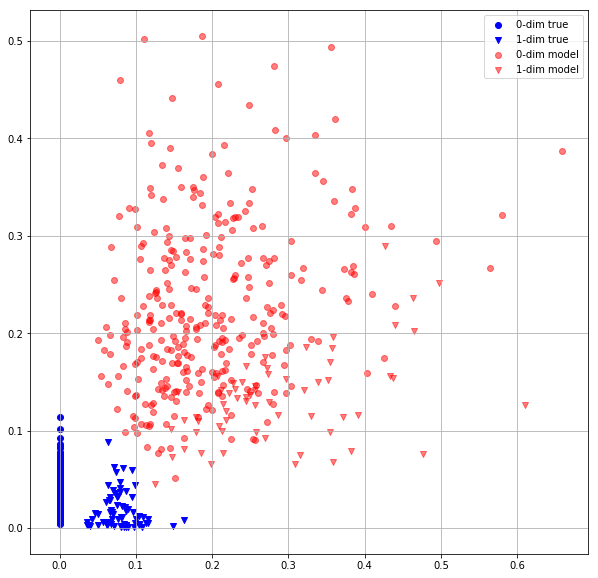

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 3.0817847252 2.0734484196


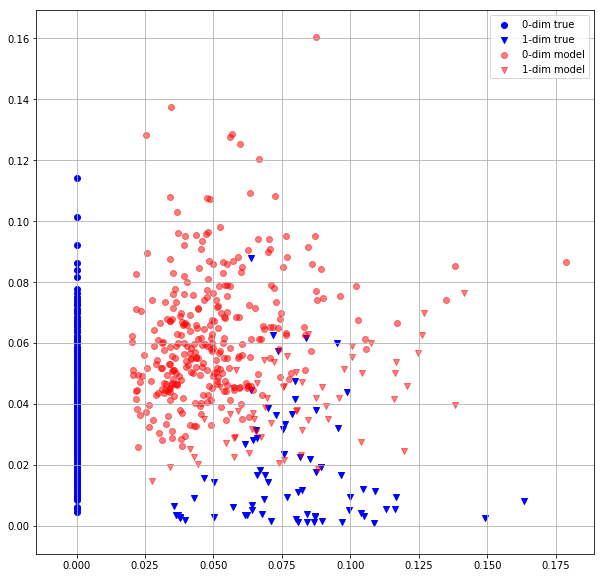

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 1.5883009434 1.2373554707


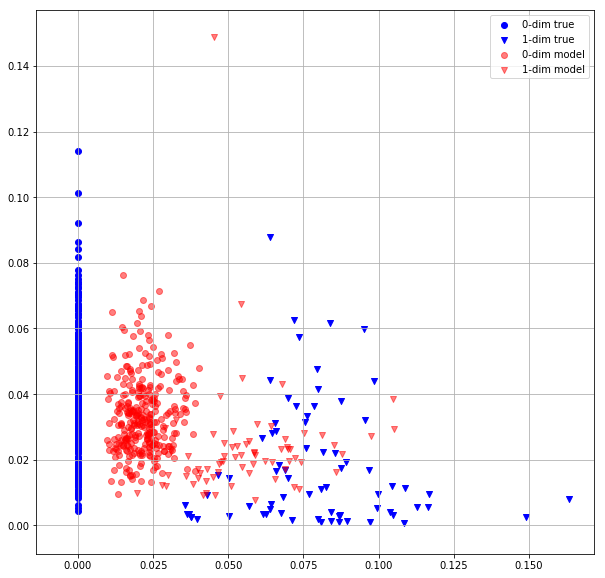

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.8222015500 0.6462505460


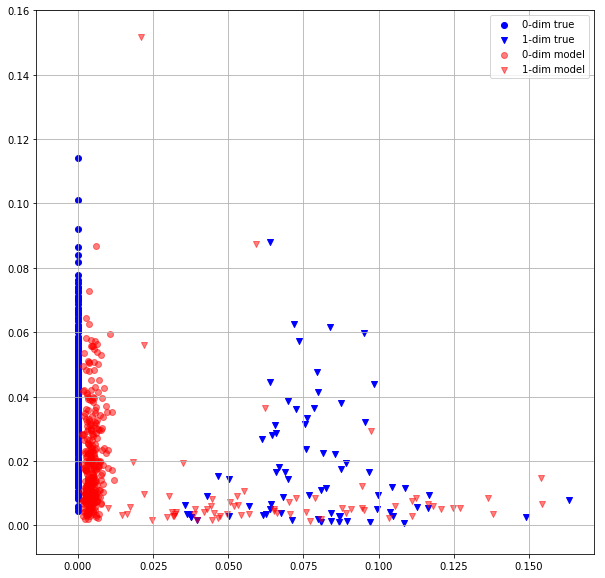

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.5412138104 0.6195945740


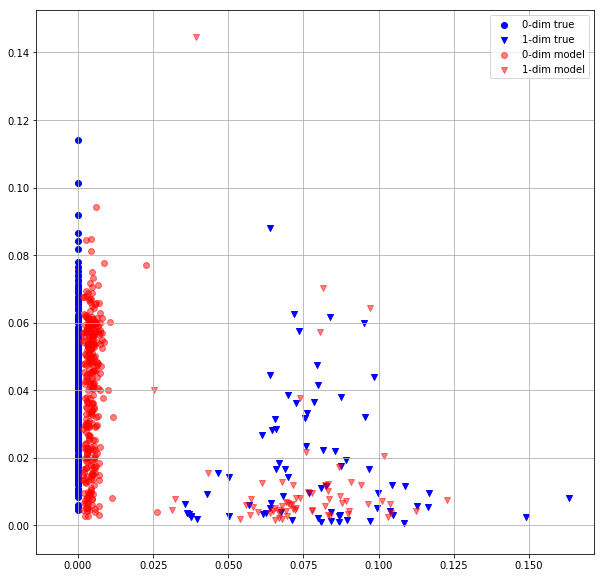

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.5463085771 0.5856110454


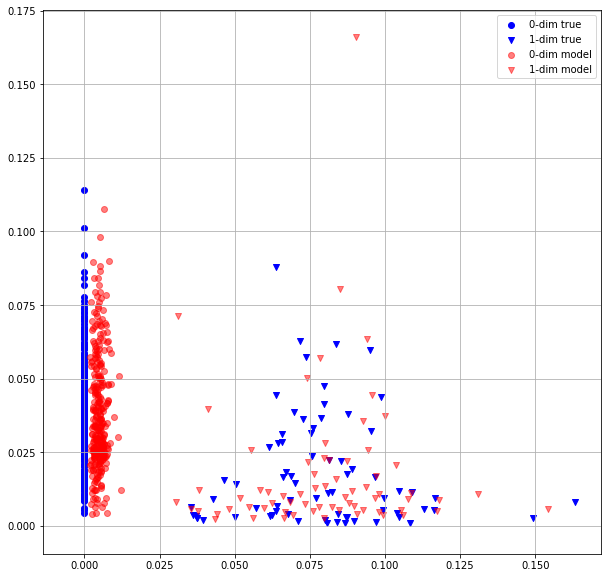

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.4908092916 0.5444785357


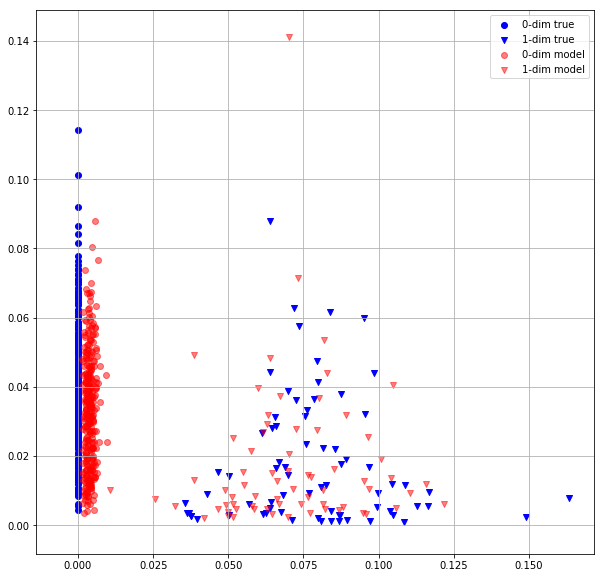

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.4683715701 0.5143928528


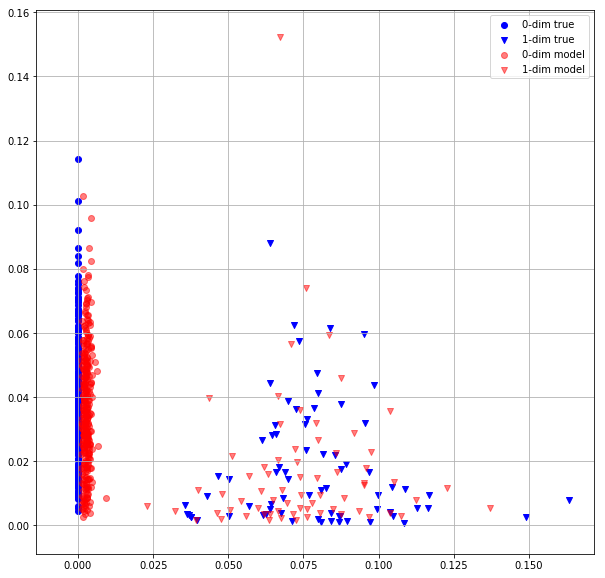

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.4654433429 0.5339368582


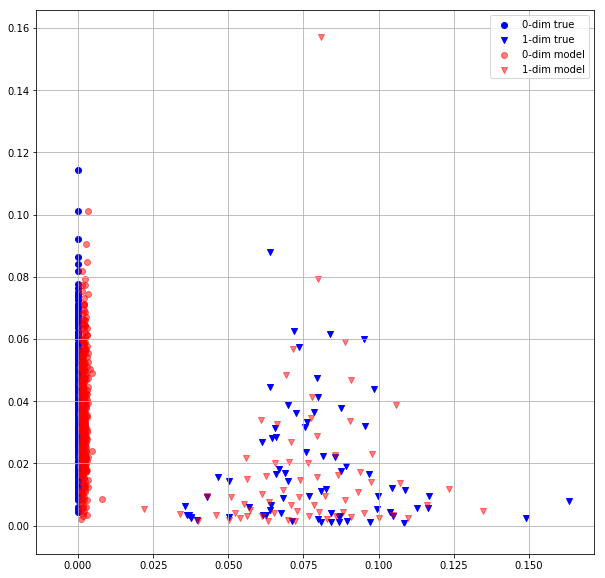

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.4727661908 0.5256757140


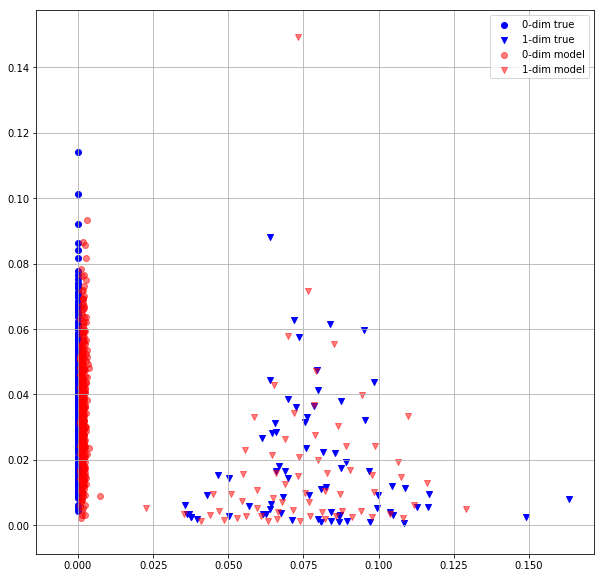

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.4603806436 0.5145619512


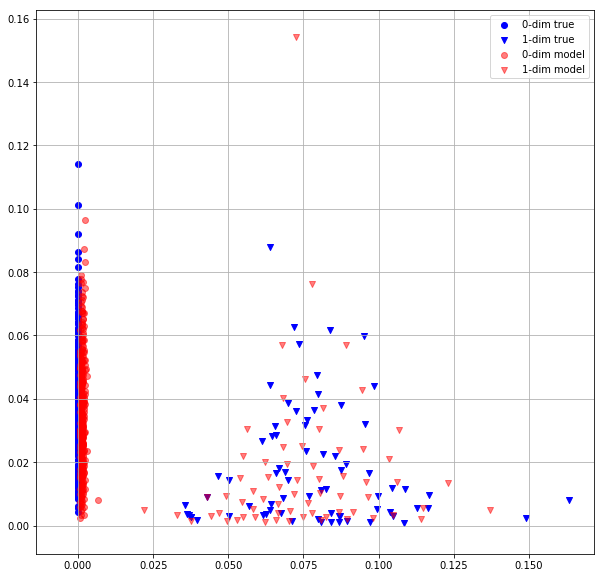

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.4557332695 0.5107706785


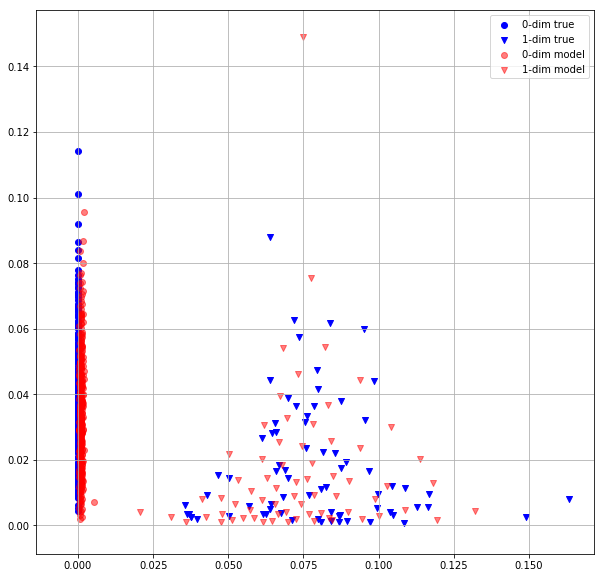

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.4613466561 0.5070638657


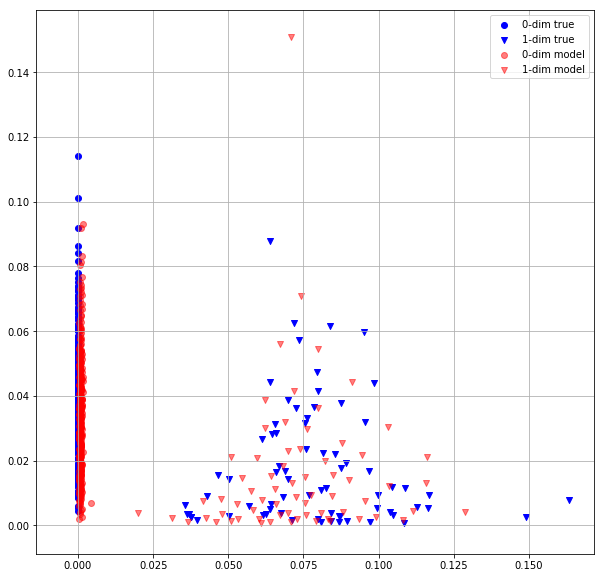

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.4634338617 0.4934442043


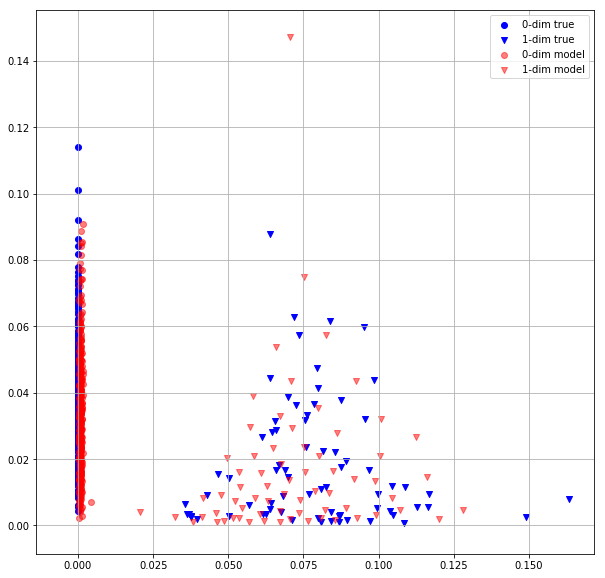

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.4390648305 0.4646713734


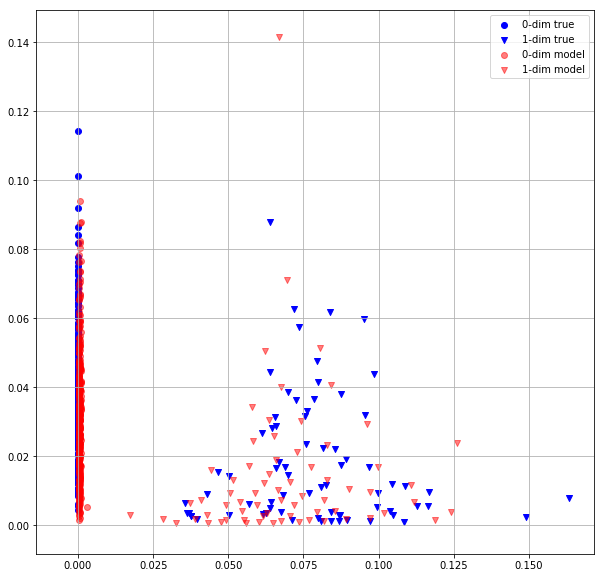

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.4517775774 0.4936701953


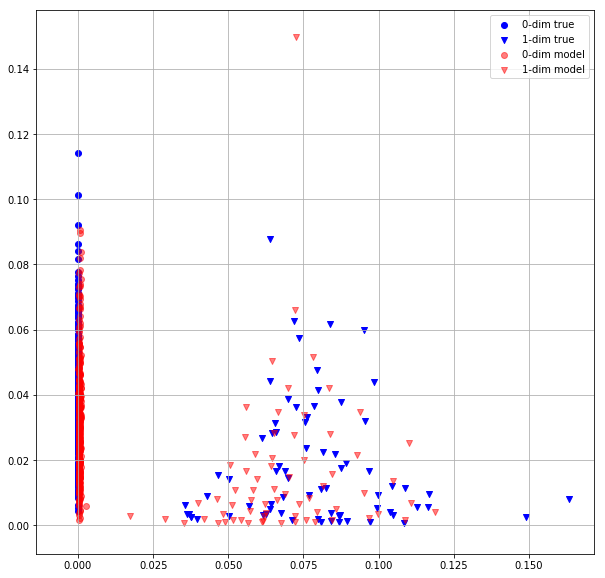

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.4306503236 0.4833974540


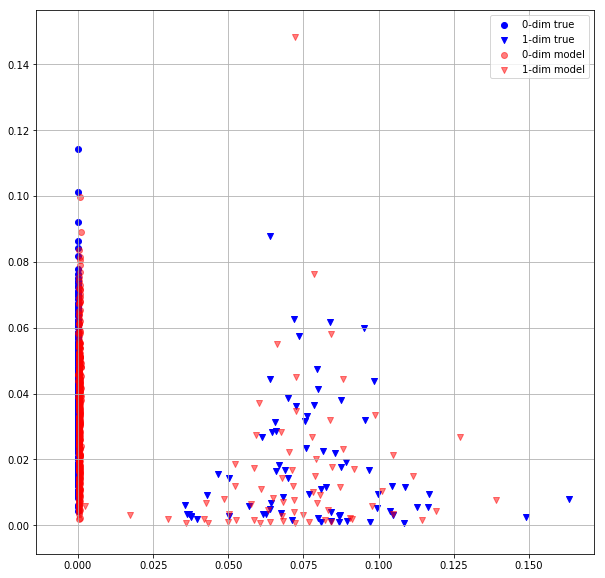

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.4270319343 0.4396002889


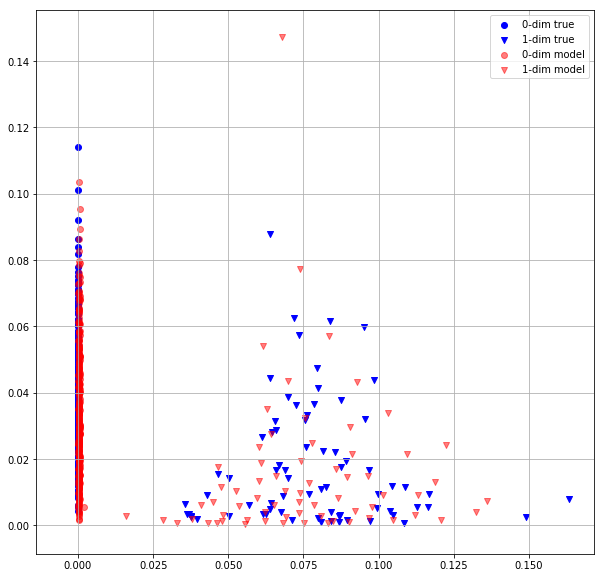

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.4301303029 0.4373316467


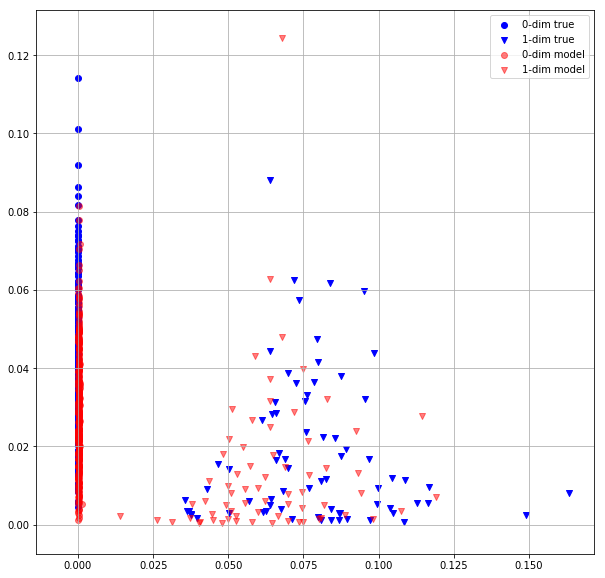

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.3965860307 0.4018973410


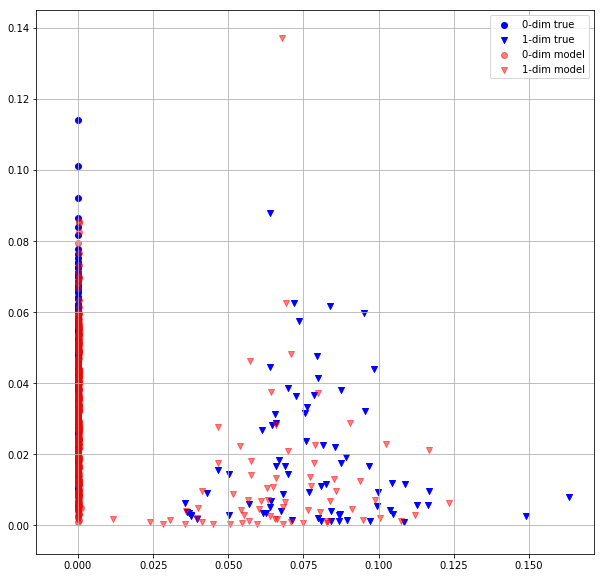

  0%|          | 0/13 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [6]:
#MLP enc + MLP dec + non-neg + custom loss
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    #mask0 = (m == 0)
    #mask1 = (m == 1)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 1.8078976870 1.2612385750


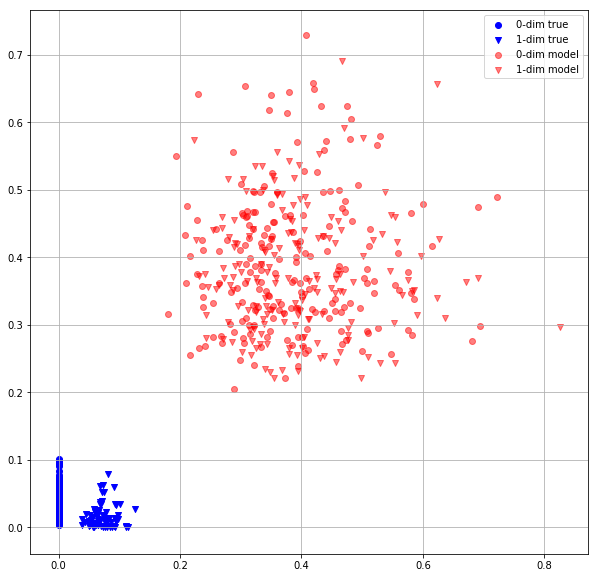

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.5584239960 0.1819239110


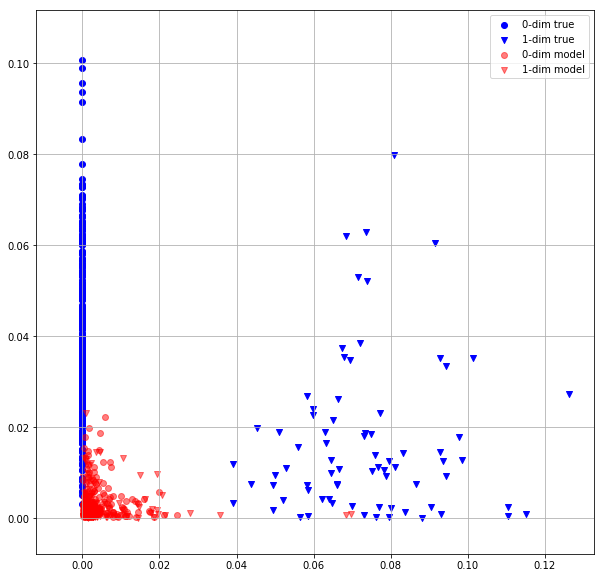

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.2003145814 0.2051929981


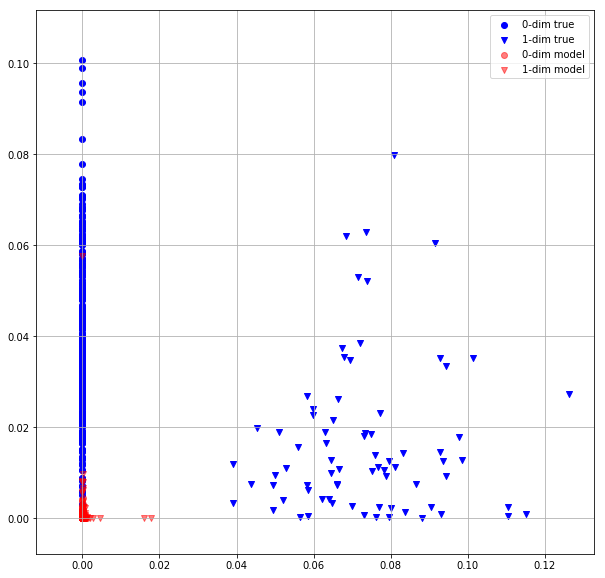

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.1983527243 0.1789642572


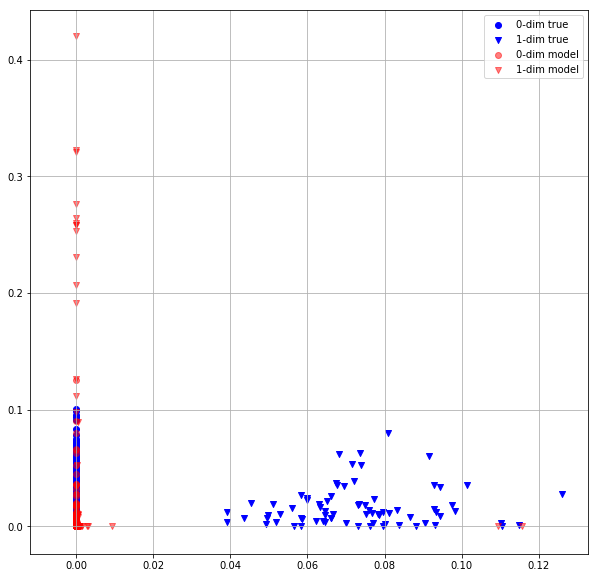

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.1569051445 0.1313067377


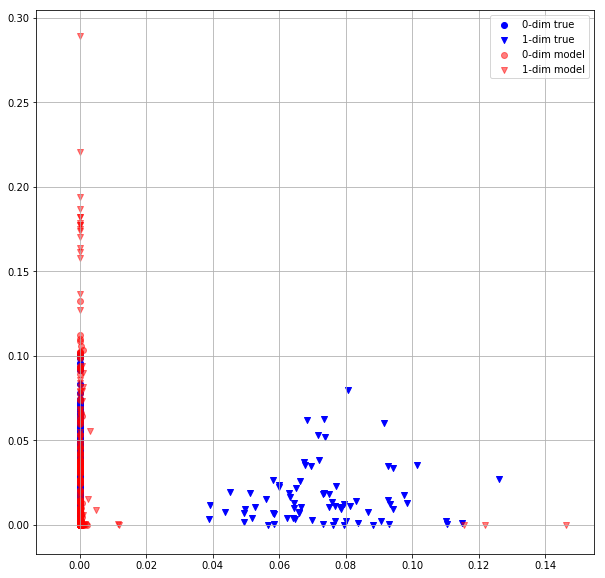

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.1132014841 0.0999592990


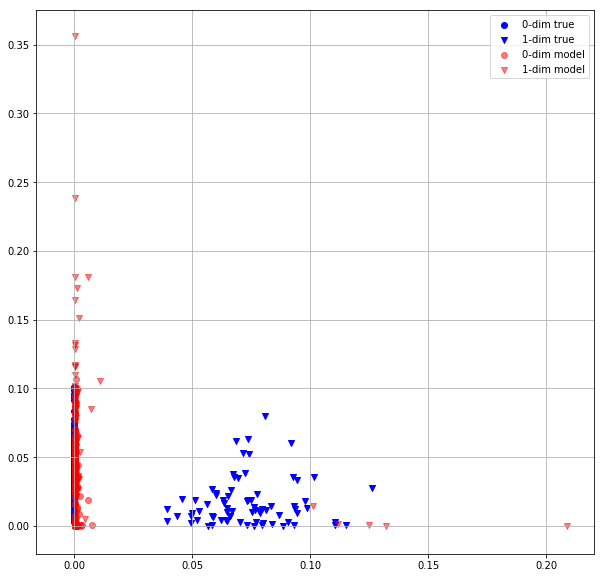

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0946541056 0.0869934633


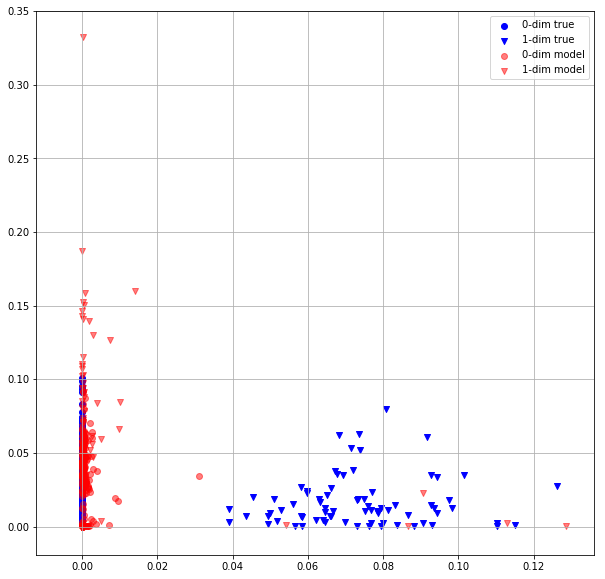

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0869558230 0.0828965828


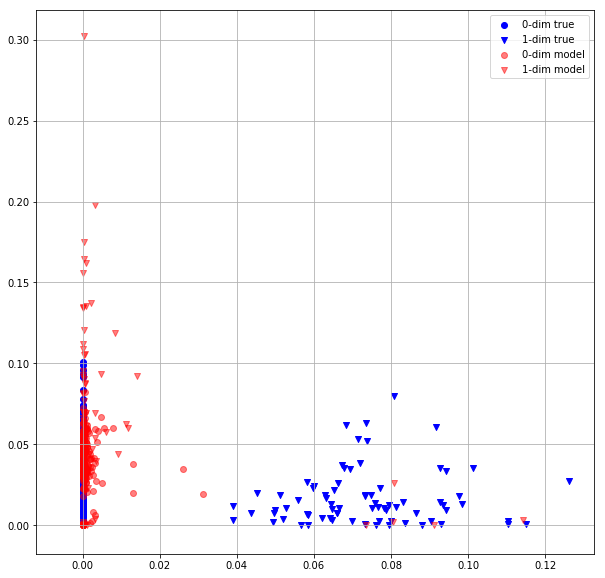

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0834773928 0.0820499137


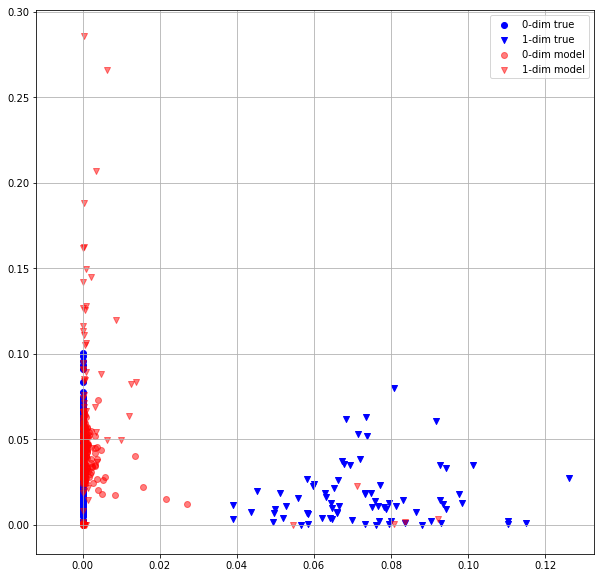

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0834712759 0.0808969140


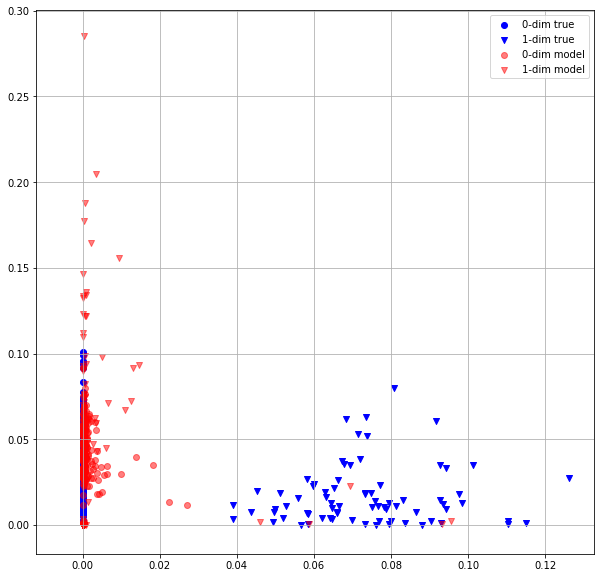

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0806910023 0.0804788843


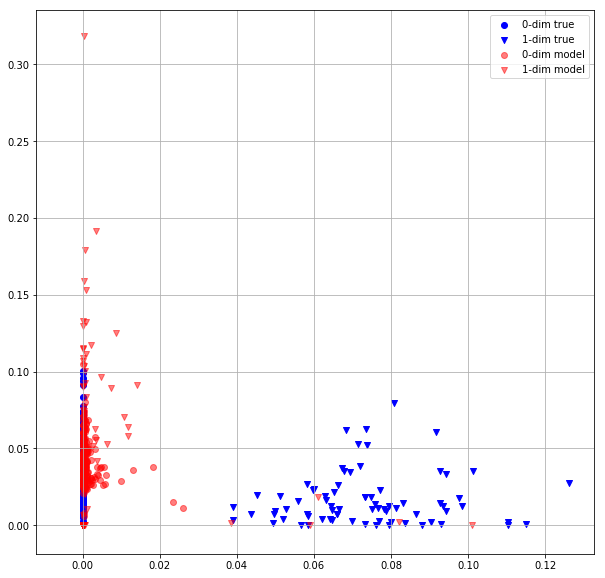

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0811640099 0.0799965411


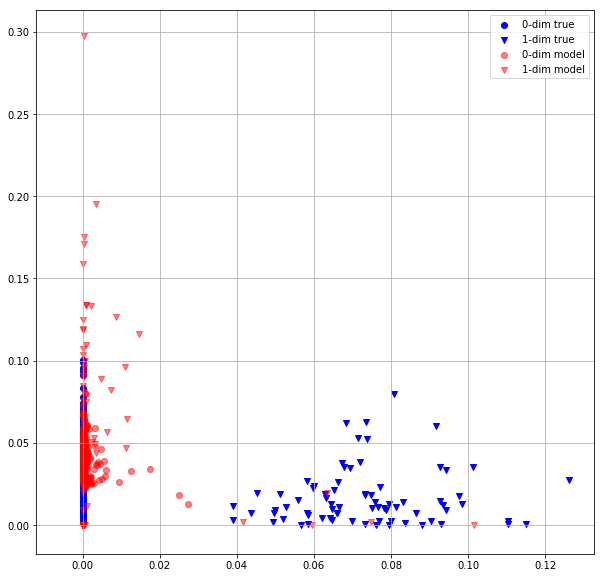

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0798757076 0.0793493688


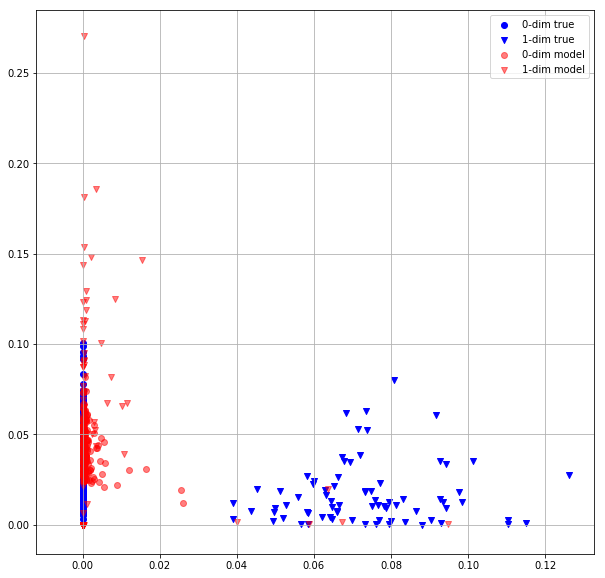

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0809169561 0.0803973600


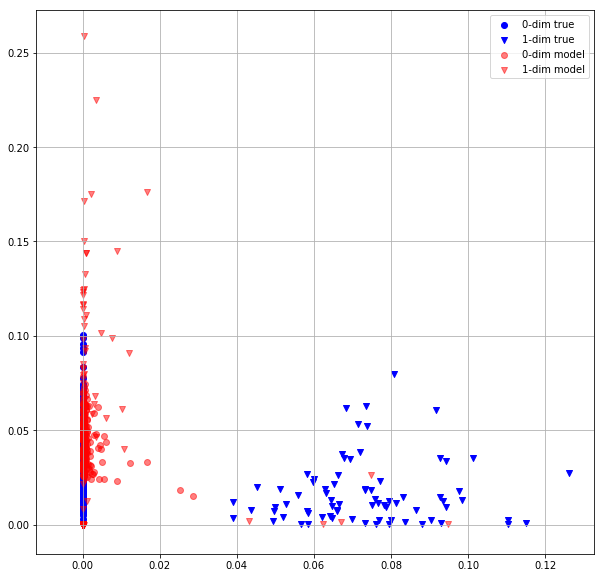

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0810983852 0.0806471854


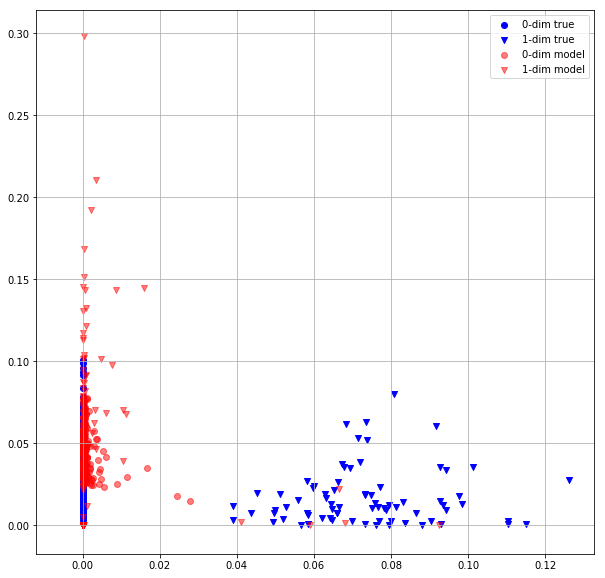

  0%|          | 0/13 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [6]:
# MLP + dim-matching
torch.autograd.set_detect_anomaly(True)
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        
        #weights = batch[0].detach().clone()
        #weights[:, :, :2] *= (weights[:, :, 1]**2).unsqueeze(2)
        
        #full_mask = mask.unsqueeze(2).repeat(1, 1, 3)
        #weights = weights * full_mask + (-1) * (1 - full_mask)
        #kek = weights.detach().clone()
        
        loss_batch = criterion_hungarian(src.to(torch.float).to(device), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            #weights = batch[0]
            #weights[:, :, :2] *= (weights[:, :, 1]**2).unsqueeze(2)

            #full_mask = mask.unsqueeze(2).repeat(1, 1, 3)
            
            #weights = weights * full_mask + (-1) * (1 - full_mask)

            loss_batch = criterion_hungarian(src.to(torch.float).to(device), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   0 0.8982790709 0.7884388566


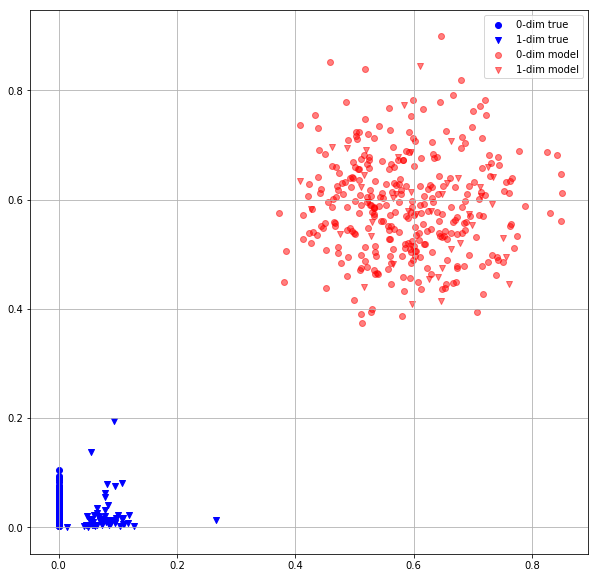

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   1 0.5678068399 0.2941272855


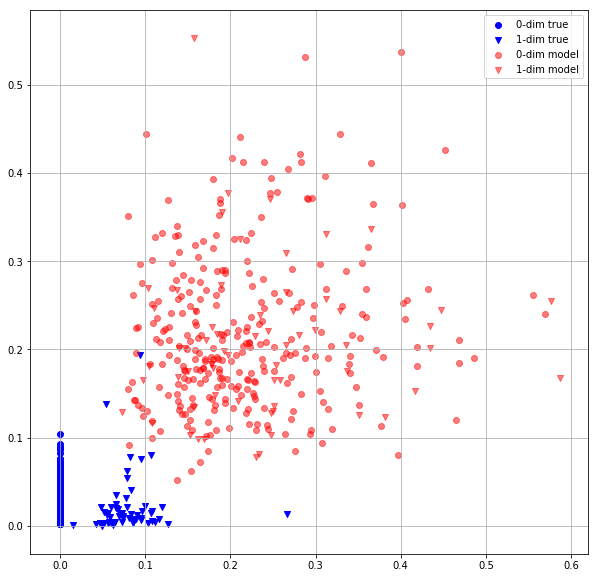

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   2 0.1161928922 0.0395257659


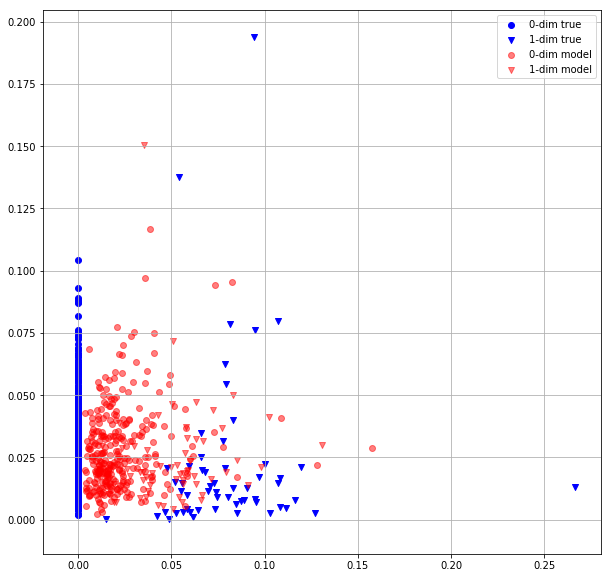

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   3 0.0322749466 0.0274552833


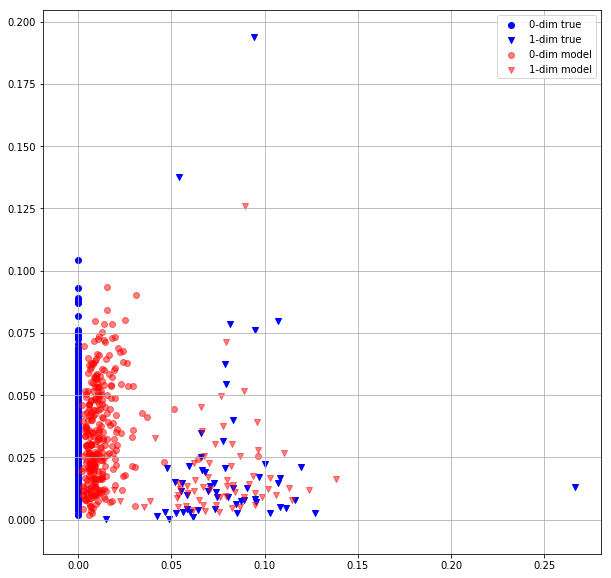

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   4 0.0252011921 0.0229175333


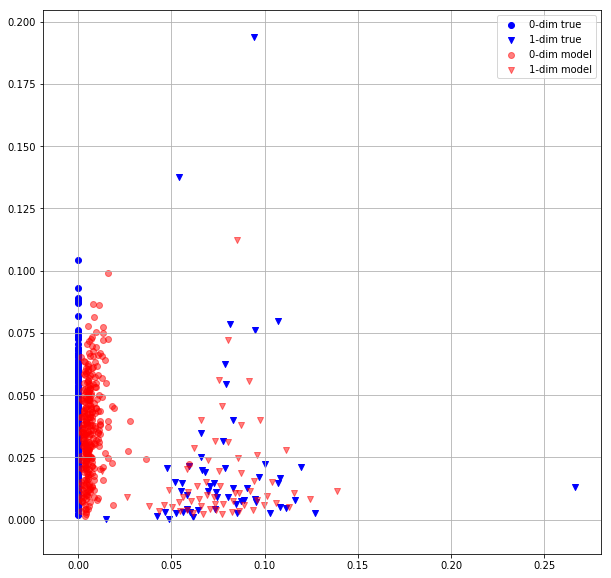

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   5 0.0220260732 0.0214897376


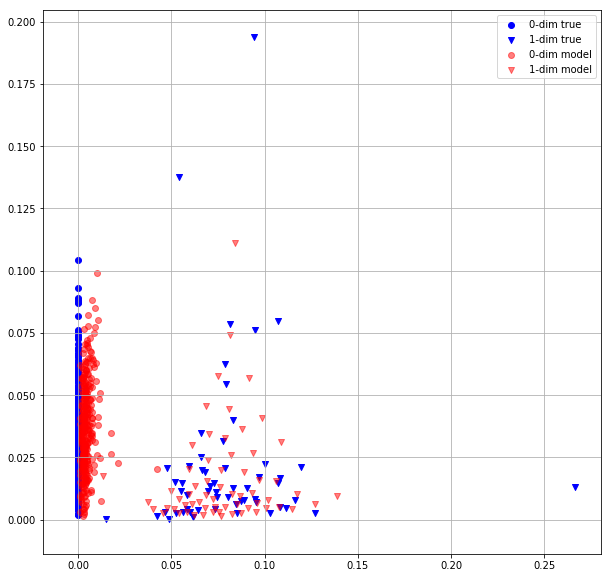

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   6 0.0210210737 0.0208519325


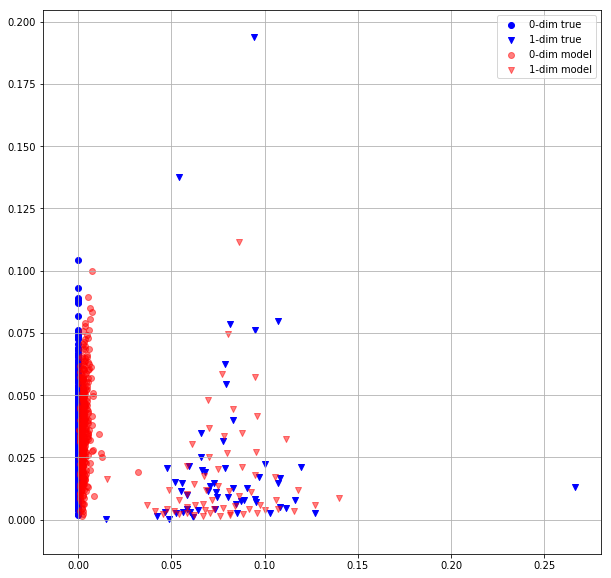

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   7 0.0205028486 0.0202853195


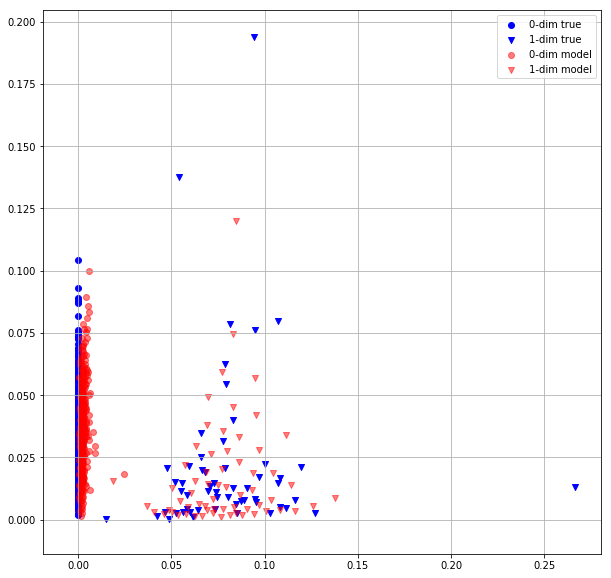

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   8 0.0202658456 0.0202126354


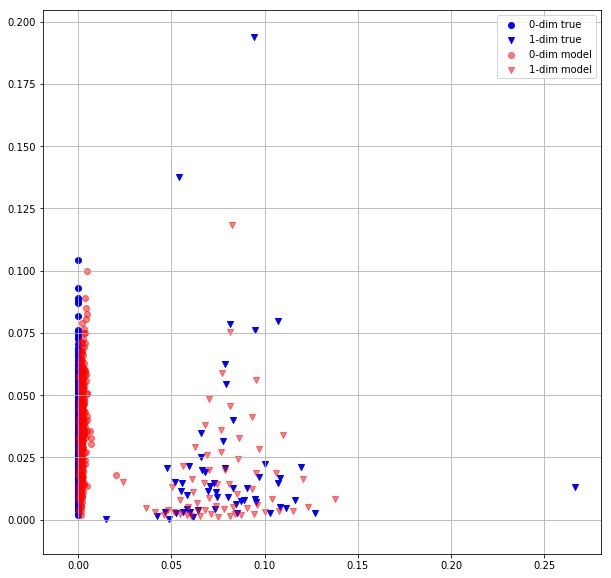

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:   9 0.0197078064 0.0189522263


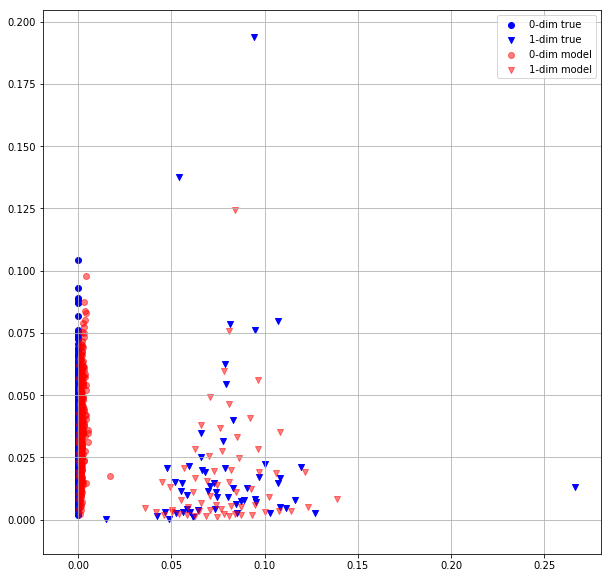

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  10 0.0187406354 0.0189407282


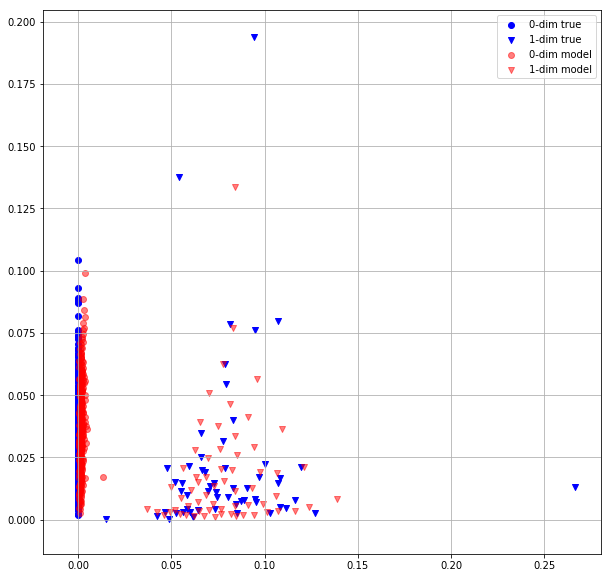

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  11 0.0187708996 0.0190366916


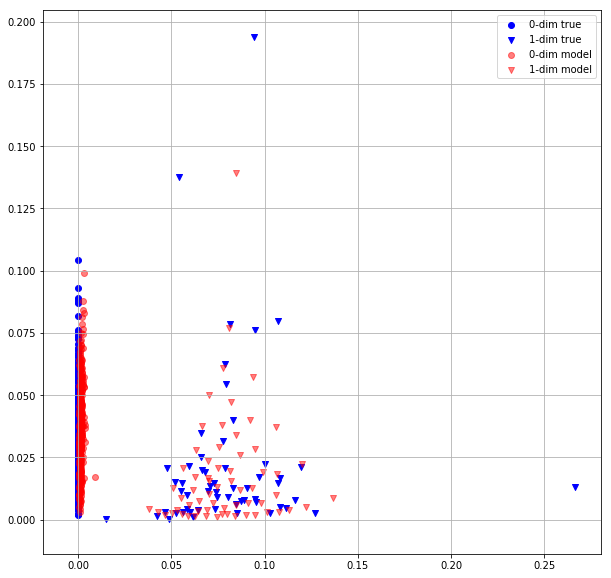

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  12 0.0187400375 0.0188993867


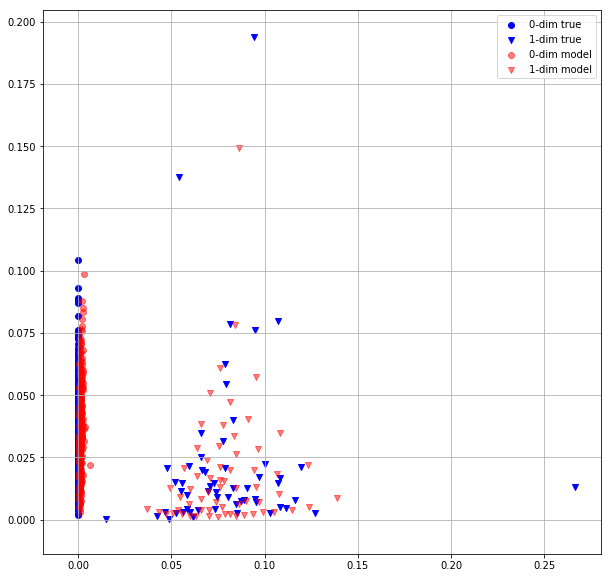

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  13 0.0184856933 0.0186533798


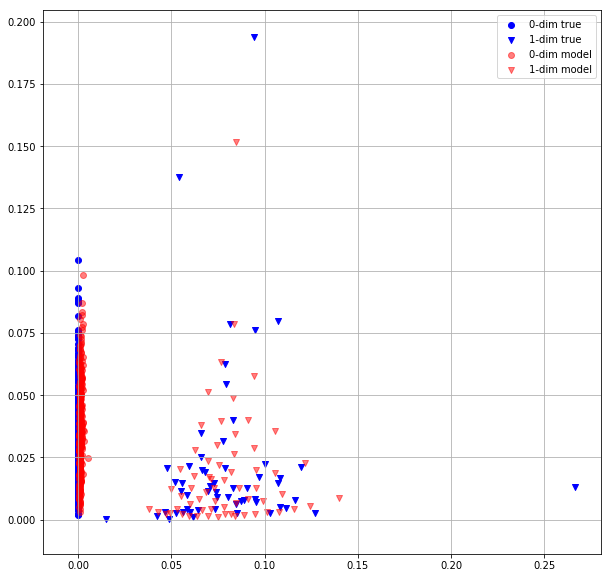

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  14 0.0181369632 0.0180298761


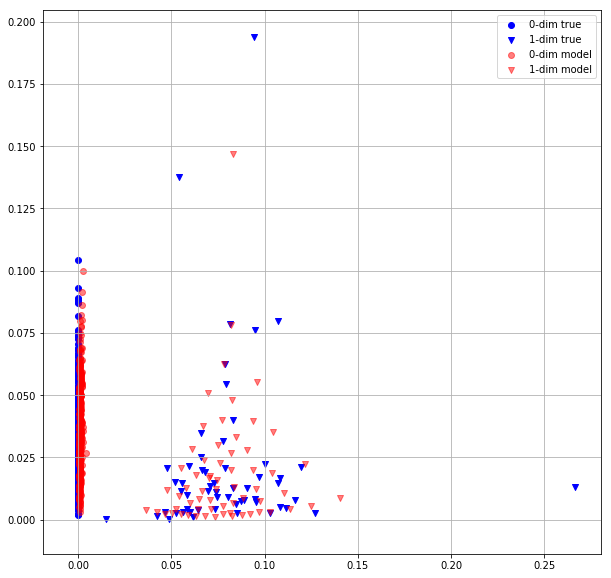

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  15 0.0179244839 0.0181004405


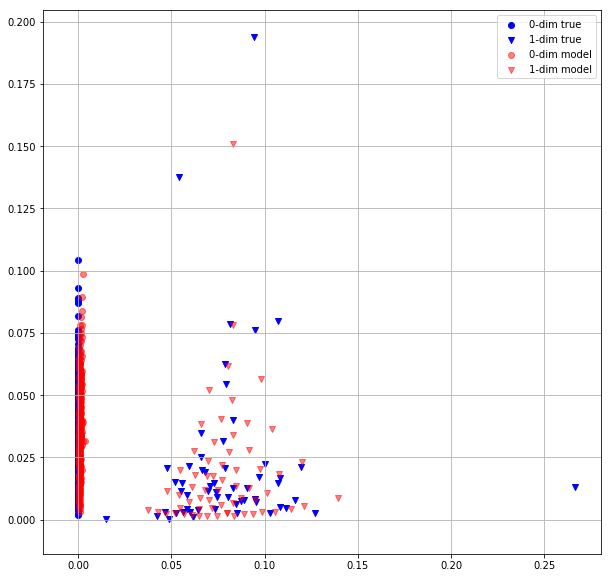

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  16 0.0179381073 0.0180839319


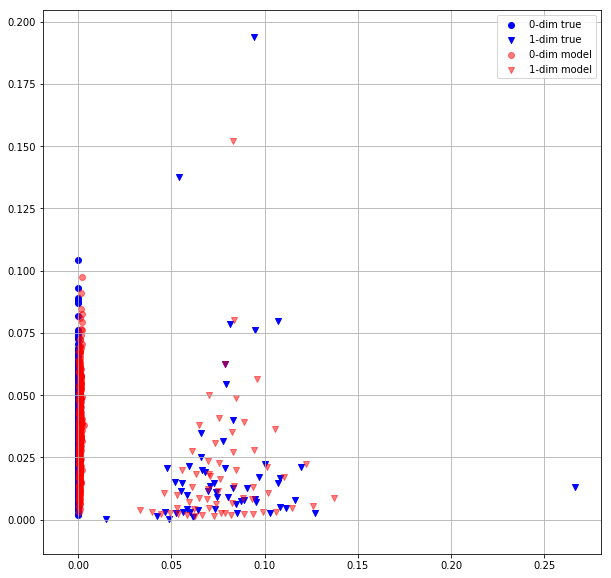

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  17 0.0178872254 0.0182258207


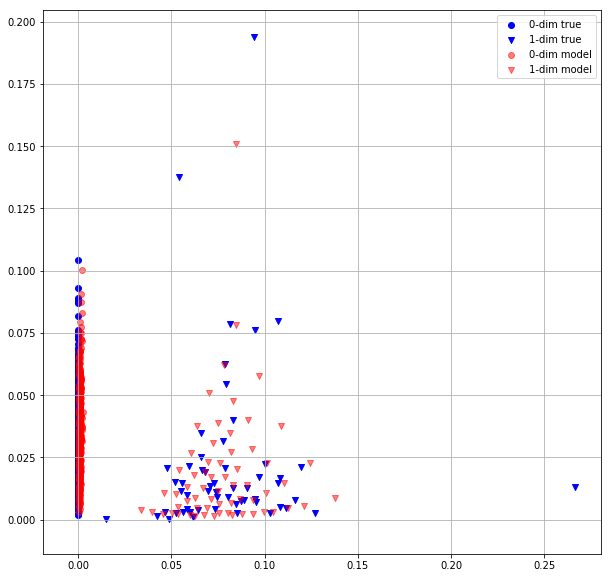

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  18 0.0179053806 0.0180646330


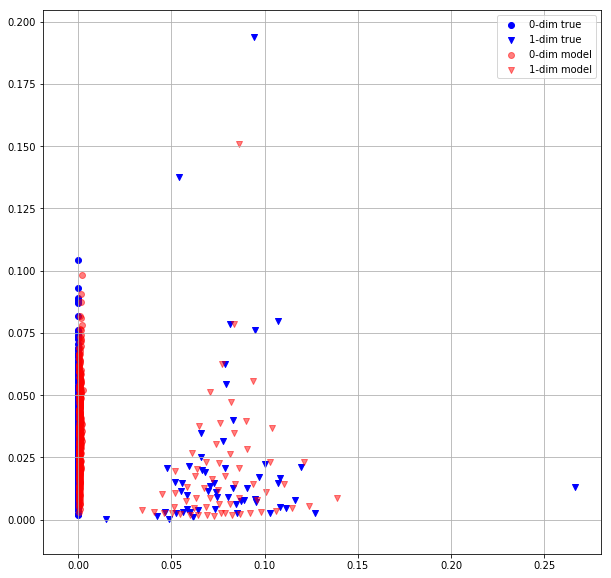

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  19 0.0176935792 0.0178406294


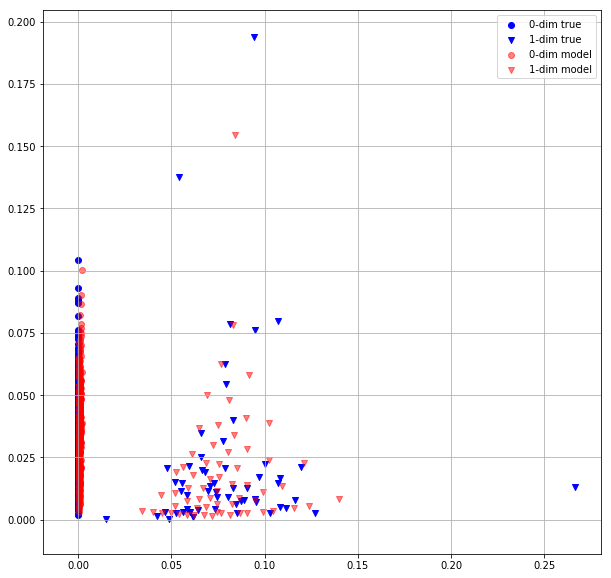

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  20 0.0176686719 0.0179073848


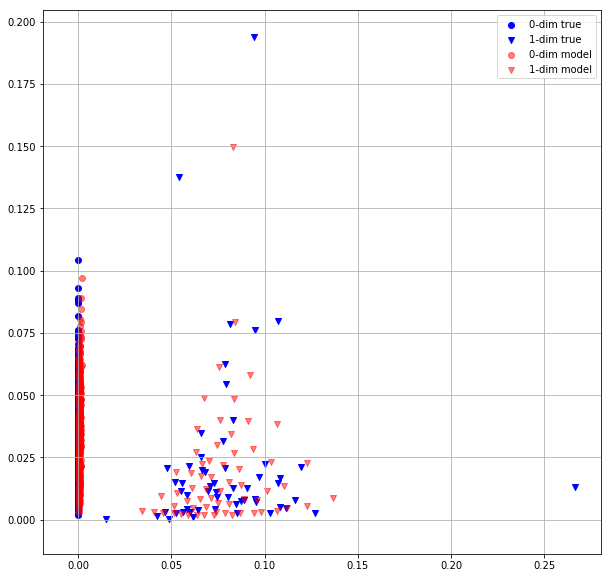

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  21 0.0176995546 0.0178787112


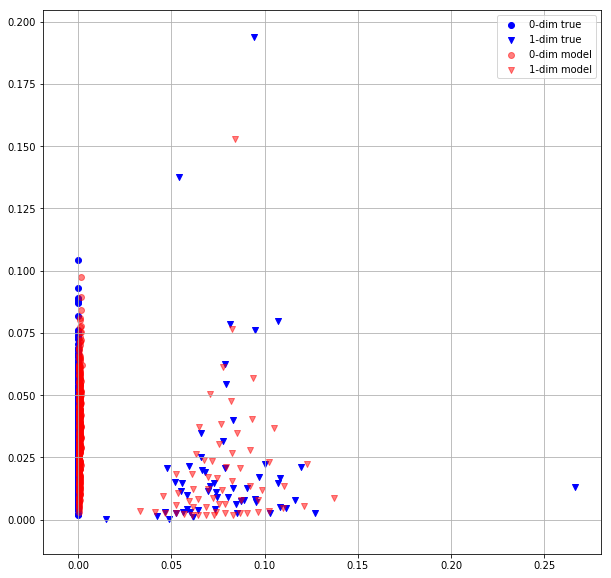

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  22 0.0175798945 0.0179823432


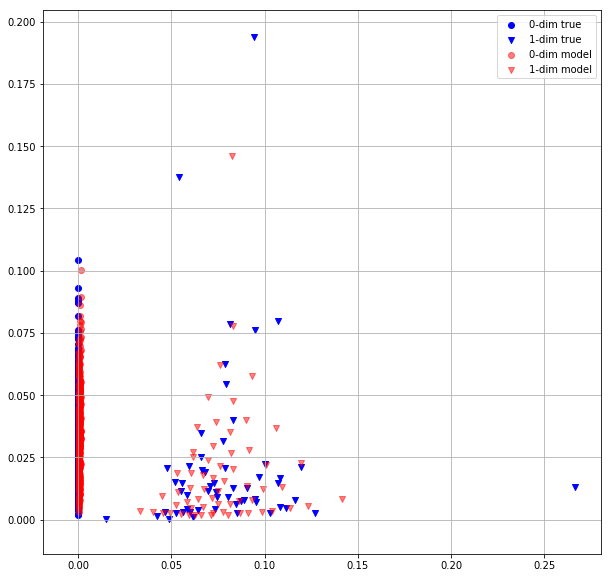

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  23 0.0176074095 0.0177265797


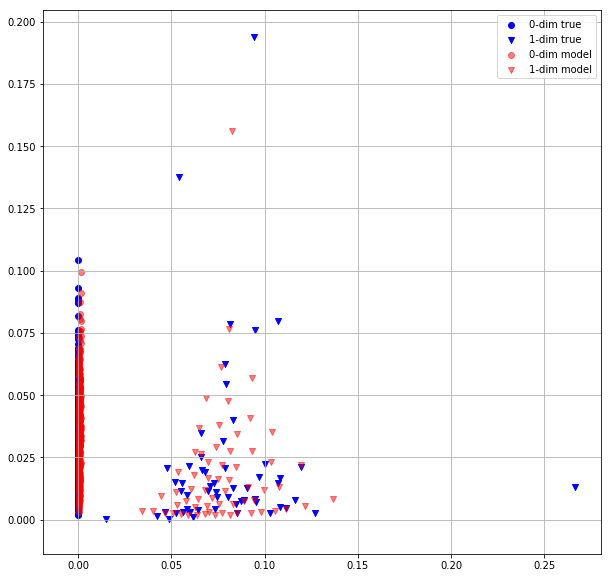

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  24 0.0173156299 0.0173699148


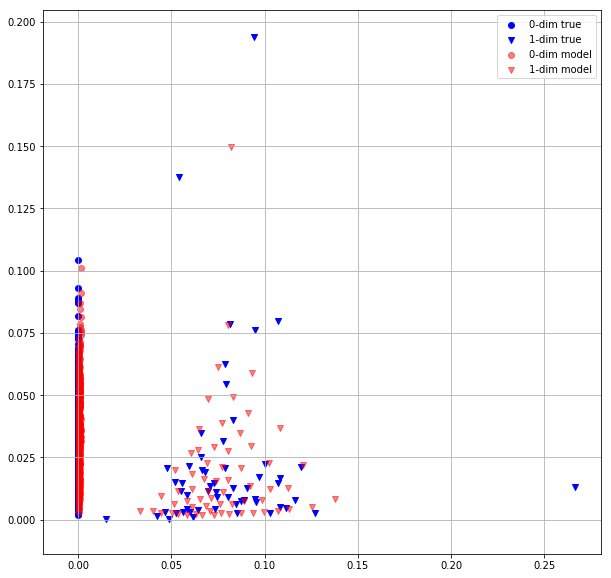

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  25 0.0166804530 0.0162924659


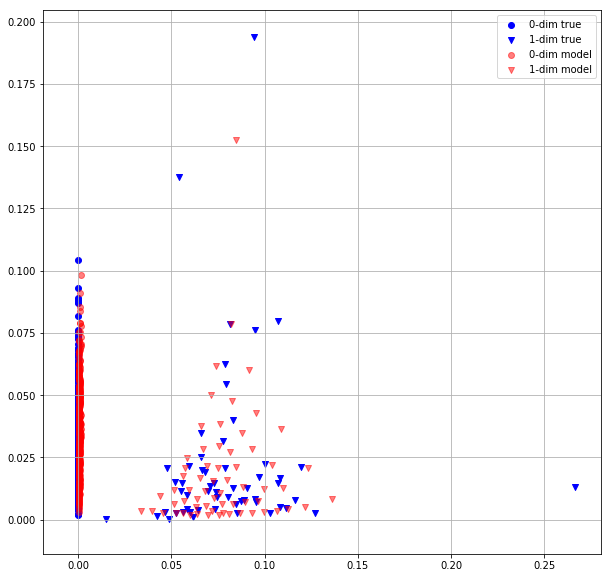

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  26 0.0162421633 0.0165075585


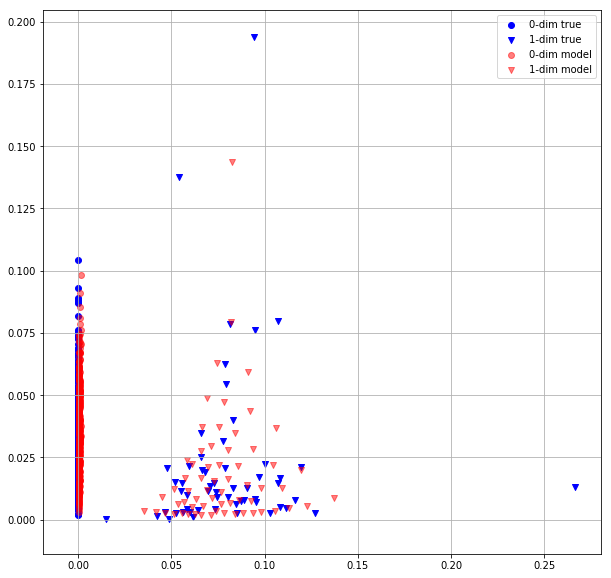

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  27 0.0162183028 0.0163391698


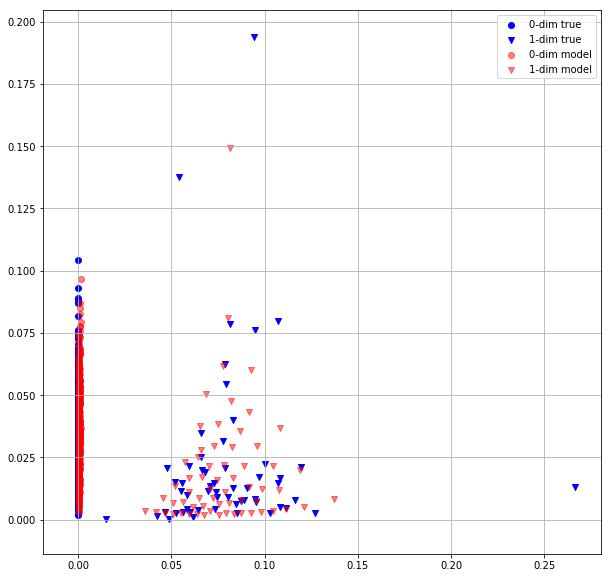

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  28 0.0161343217 0.0161477979


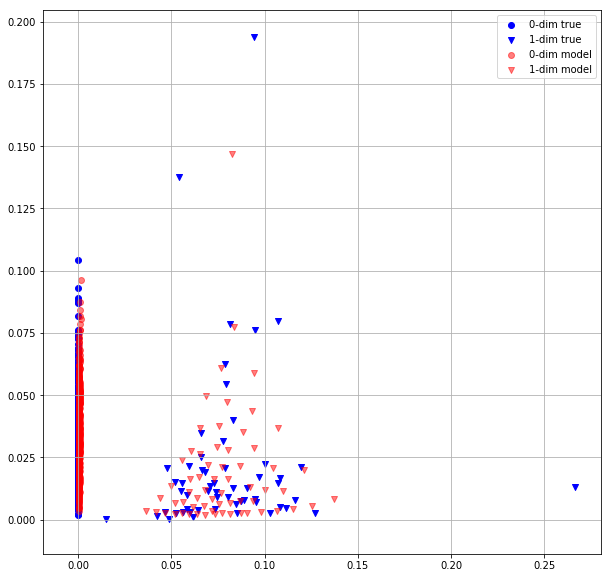

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  29 0.0161146279 0.0162274037


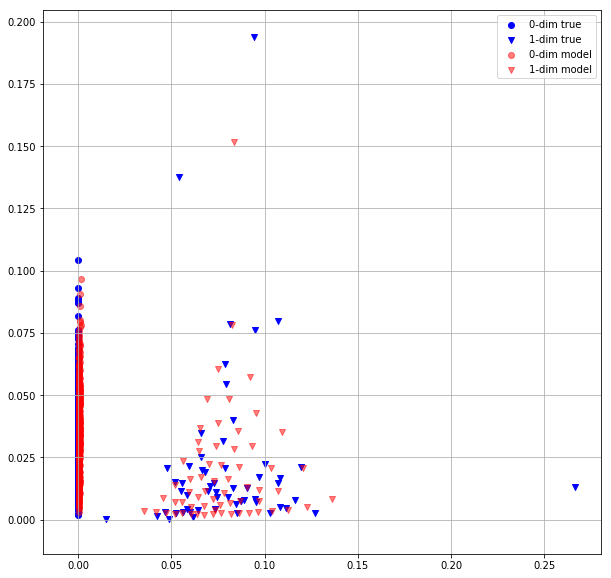

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  30 0.0161741674 0.0163010880


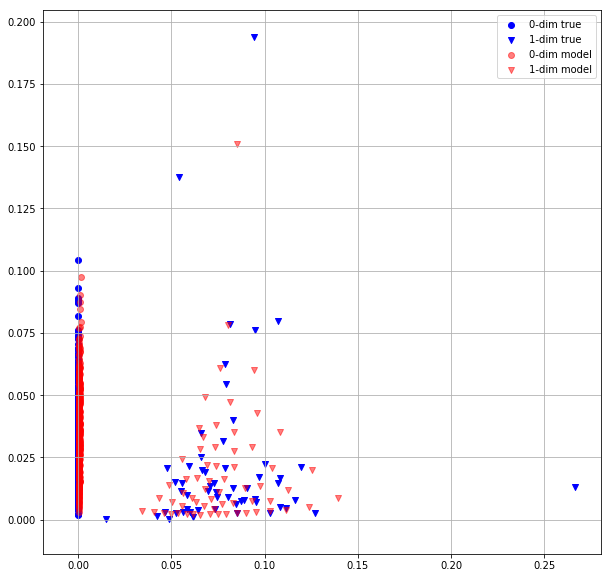

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  31 0.0160040185 0.0163134914


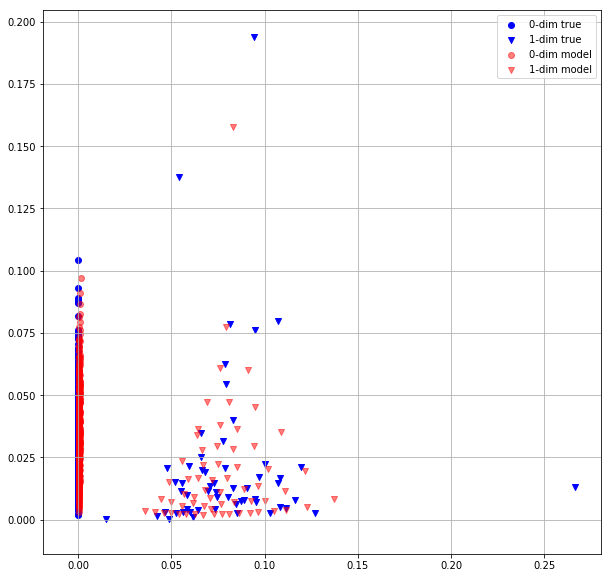

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  32 0.0160571989 0.0162524283


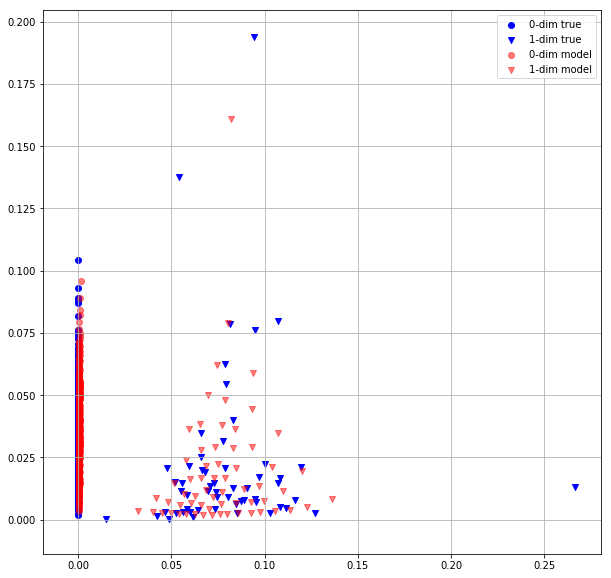

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  33 0.0160443597 0.0161665976


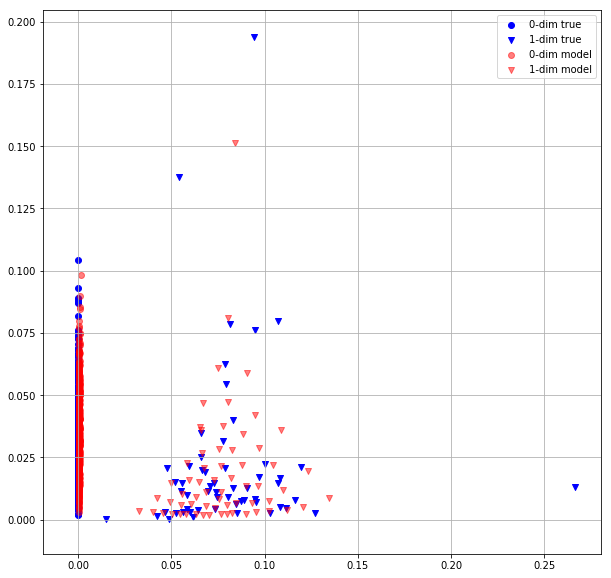

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  34 0.0159441959 0.0161117036


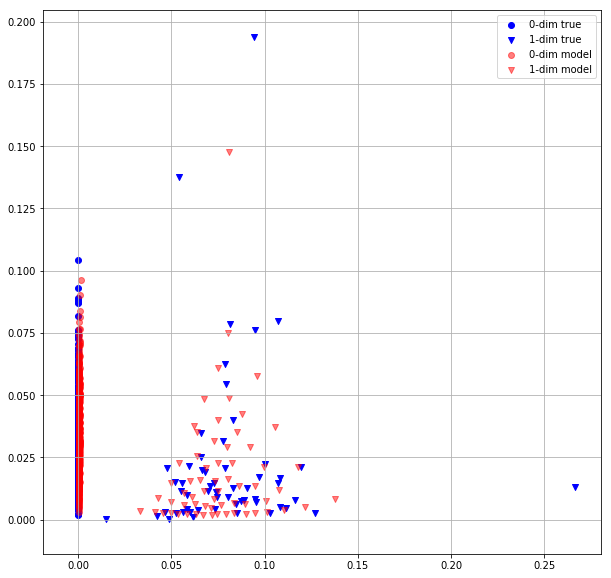

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  35 0.0160133485 0.0162286945


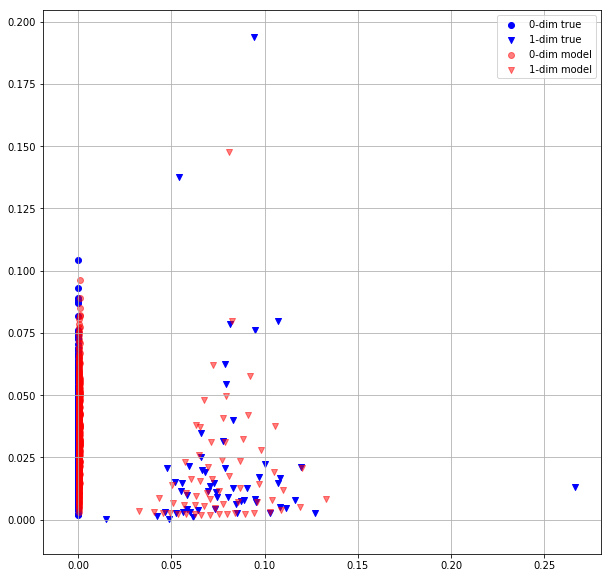

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Epoch:  36 0.0159627534 0.0160772484


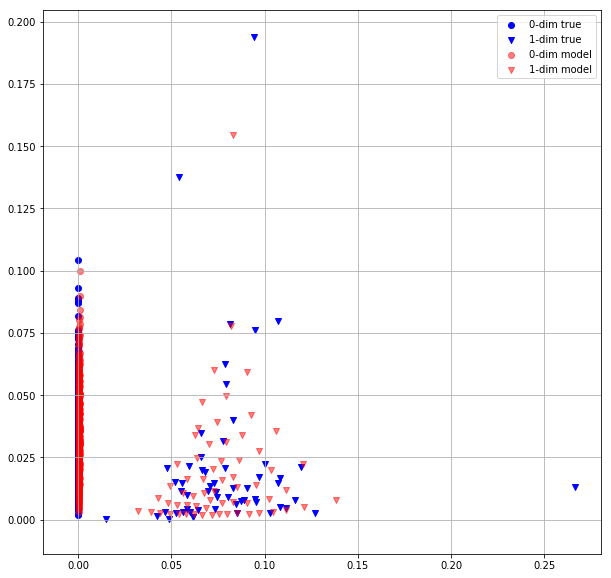

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

In [ ]:
# MLP + non-neg pred
#torch.autograd.set_detect_anomaly(True)
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        
        #weights = batch[0].detach().clone()
        #weights[:, :, :2] *= (weights[:, :, 1]**2).unsqueeze(2)
        
        #full_mask = mask.unsqueeze(2).repeat(1, 1, 3)
        #weights = weights * full_mask + (-1) * (1 - full_mask)
        #kek = weights.detach().clone()
        
        loss_batch = criterion_hungarian(src.to(torch.float).to(device), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            #weights = batch[0]
            #weights[:, :, :2] *= (weights[:, :, 1]**2).unsqueeze(2)

            #full_mask = mask.unsqueeze(2).repeat(1, 1, 3)
            
            #weights = weights * full_mask + (-1) * (1 - full_mask)

            loss_batch = criterion_hungarian(src.to(torch.float).to(device), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

In [7]:
torch.save(model.state_dict(), "linear_baseline_ae.pt")

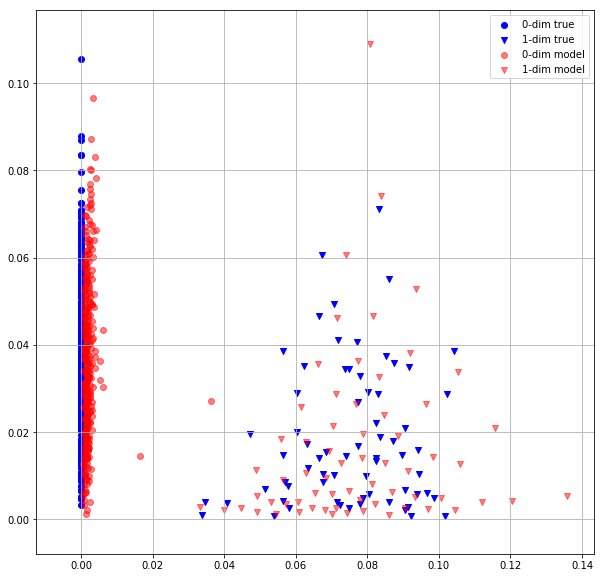

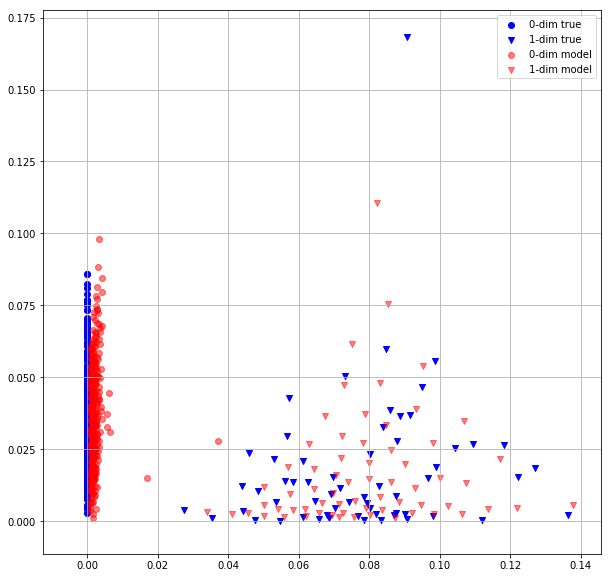

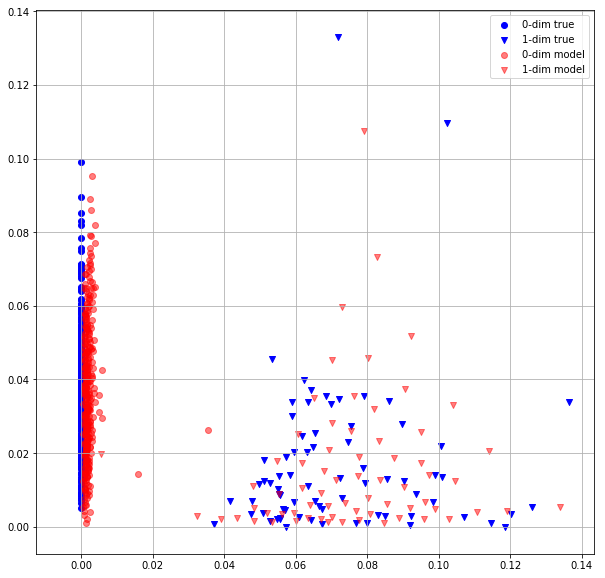

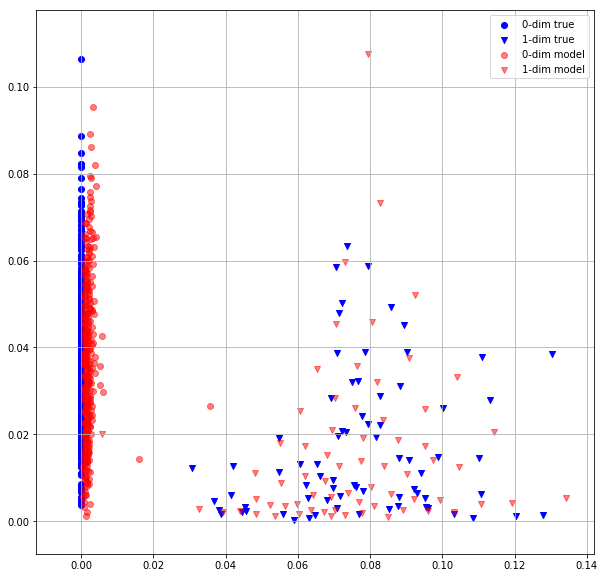

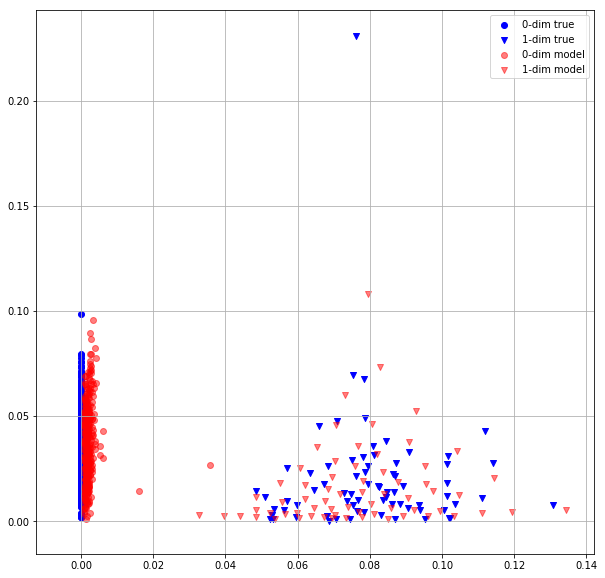

...

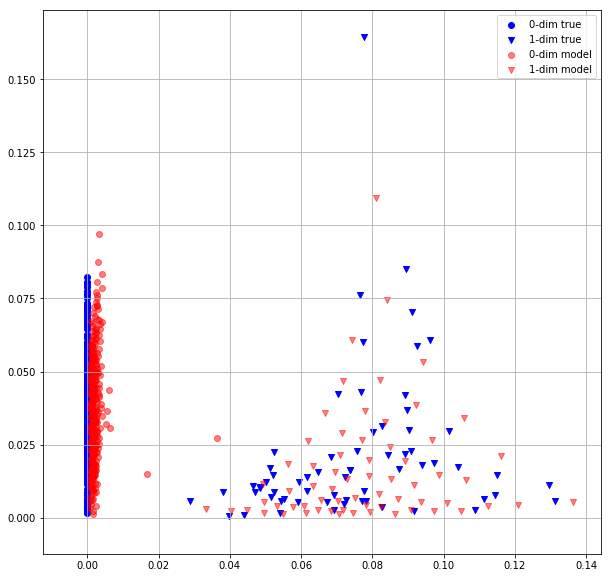

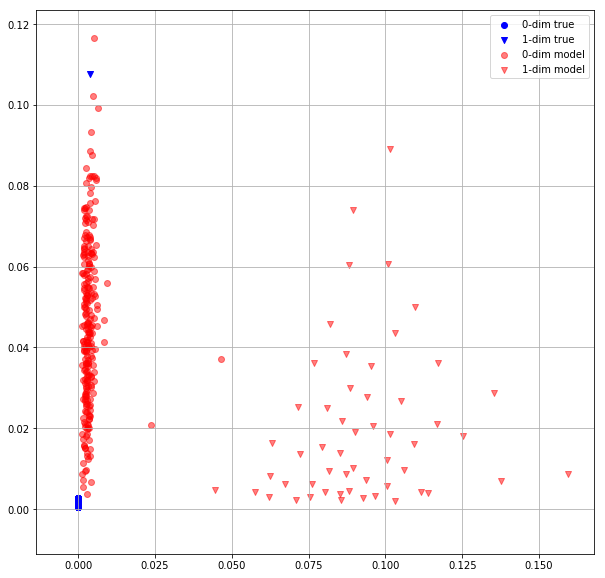

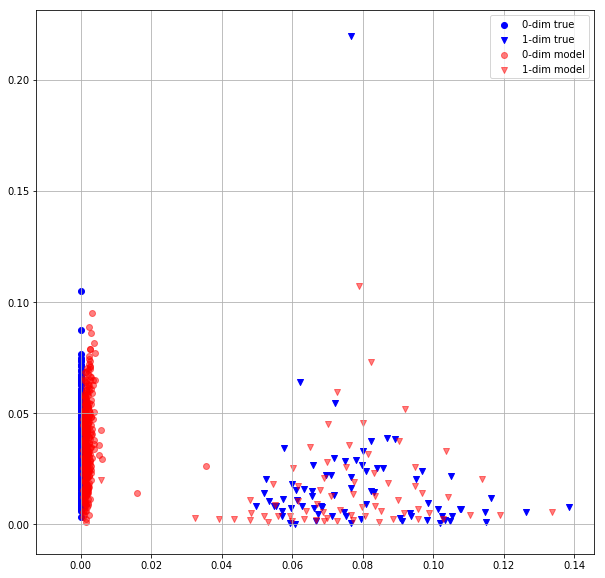

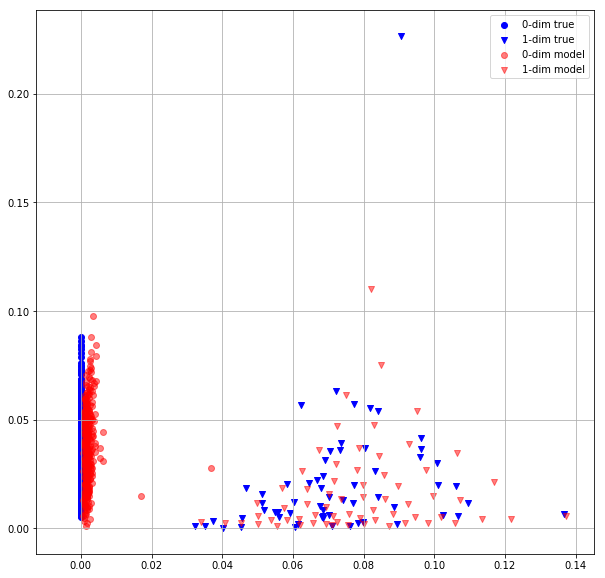

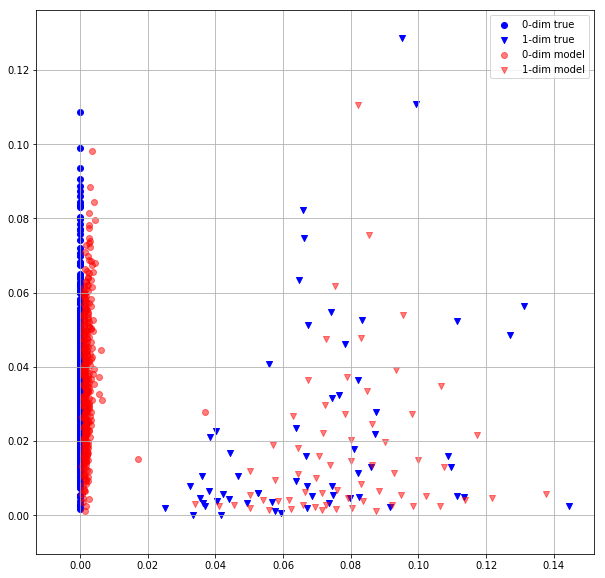

In [5]:
for i in range(15):
    item = dataset_test[i].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

In [6]:
# DeepSets + TSPN + 60 epochs + MLP_last
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    mask0 = (m == 0)
    mask1 = (m == 1)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    #mask0 = (m == 0)
    #mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

IndexError: Target 1 is out of bounds.

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0272303037 0.0265117399


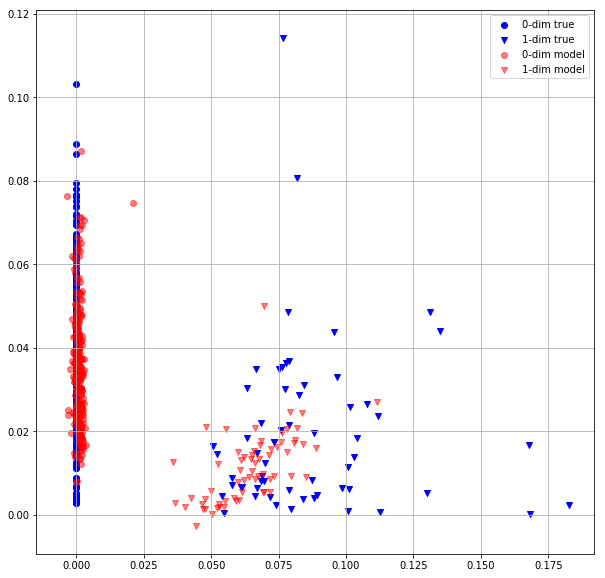

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0265147444 0.0262956098


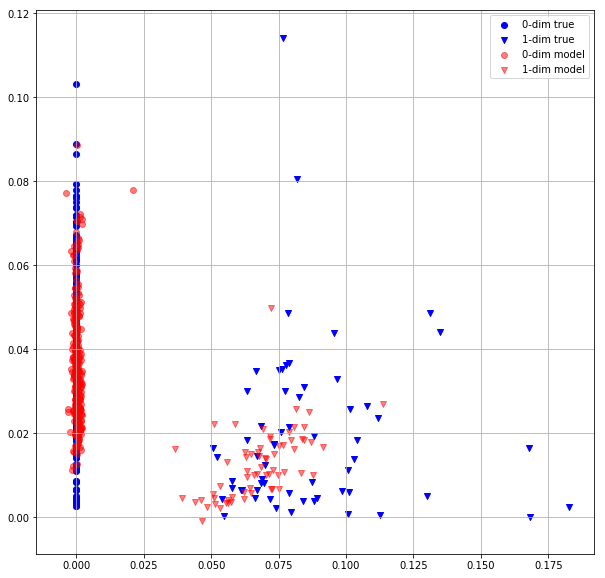

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0259270668 0.0262892079


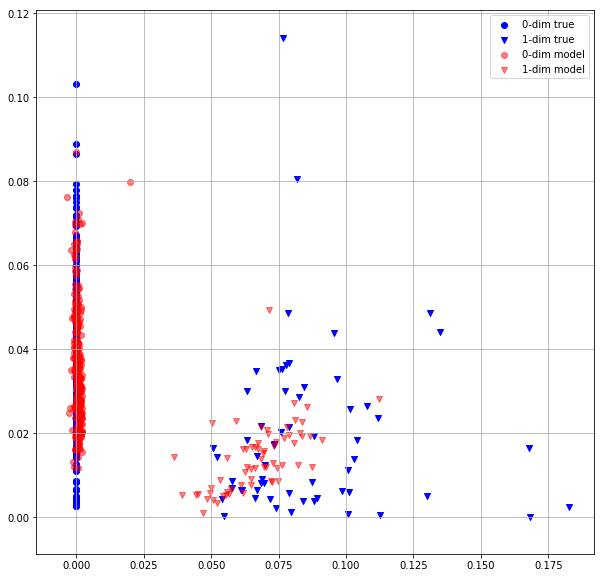

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0253900122 0.0267597716


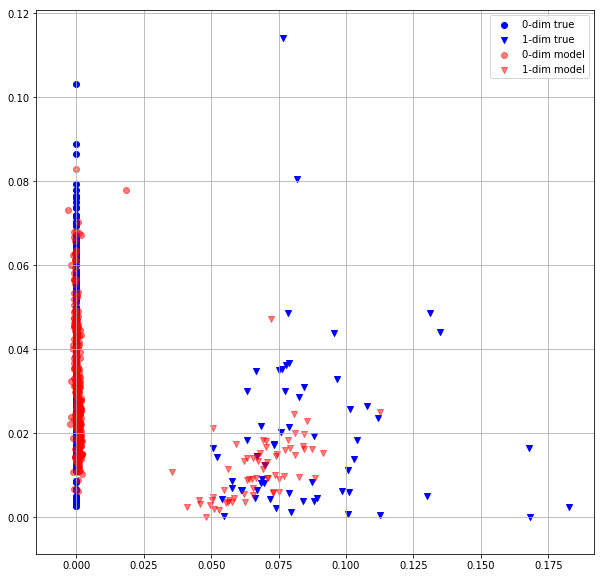

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0251651891 0.0270135514


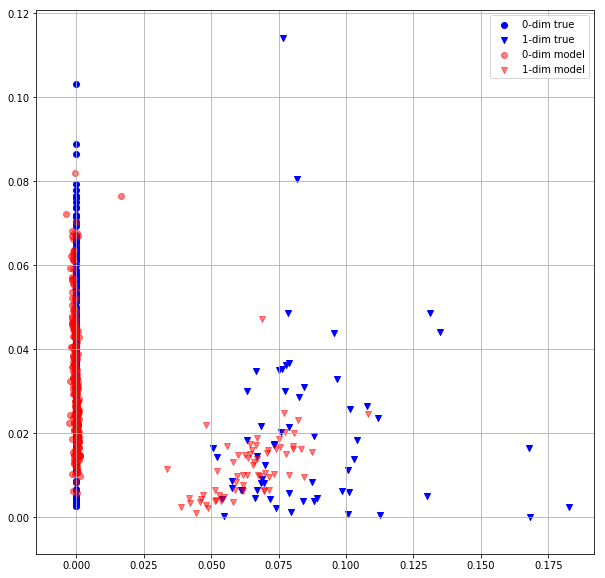

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0248643812 0.0256945156


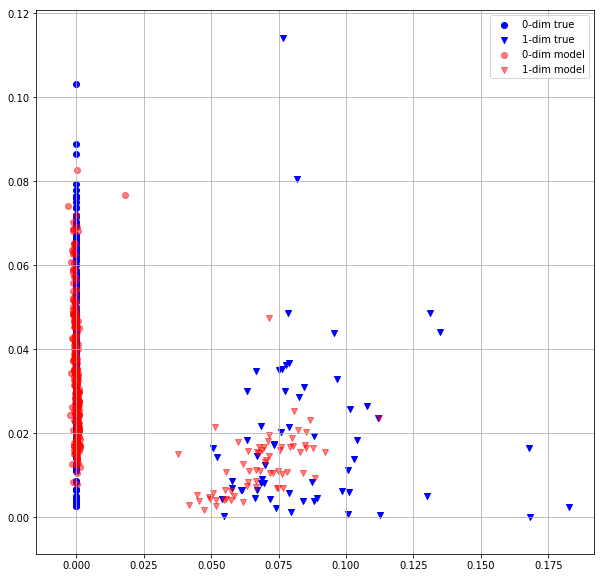

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0243902691 0.0256042238


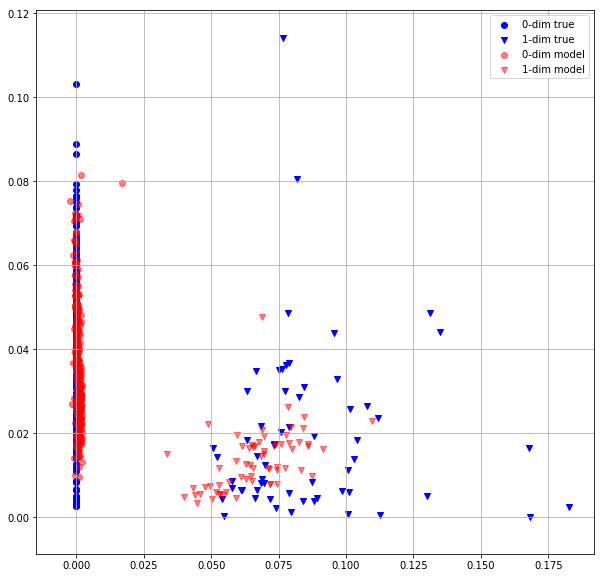

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0241051763 0.0253873318


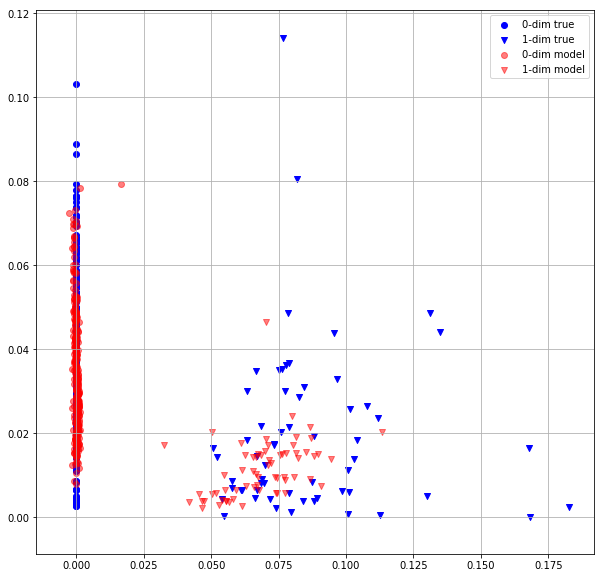

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0238534324 0.0260345582


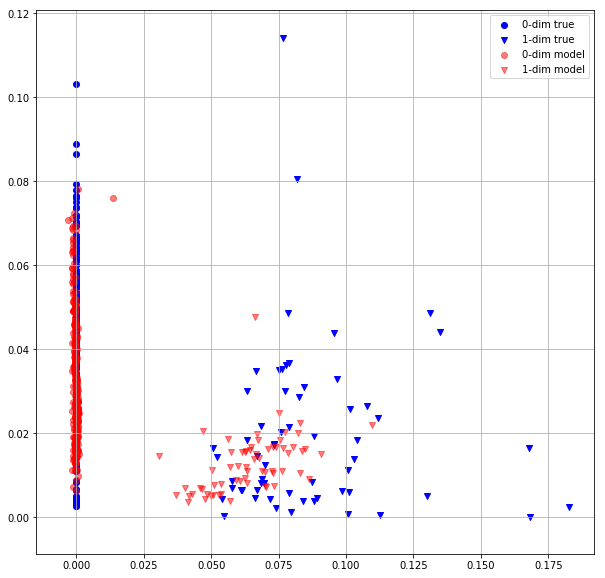

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0236333832 0.0252043959


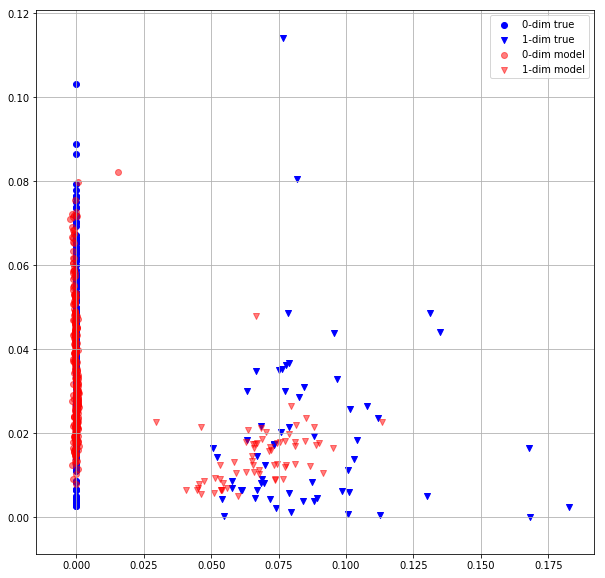

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0233995486 0.0252907611


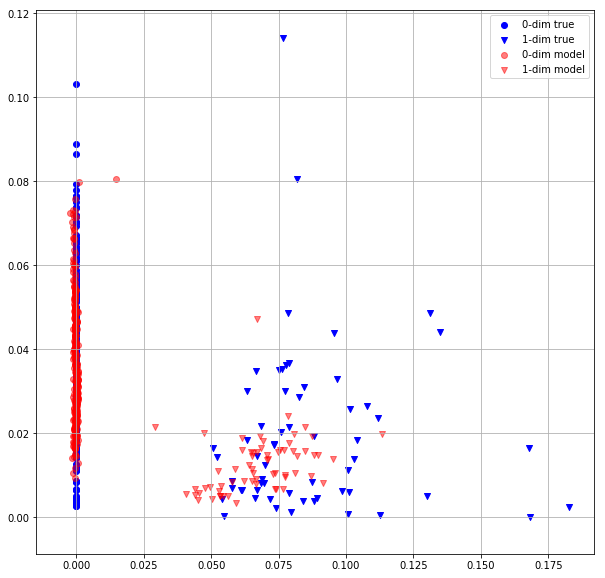

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0232805256 0.0252060816


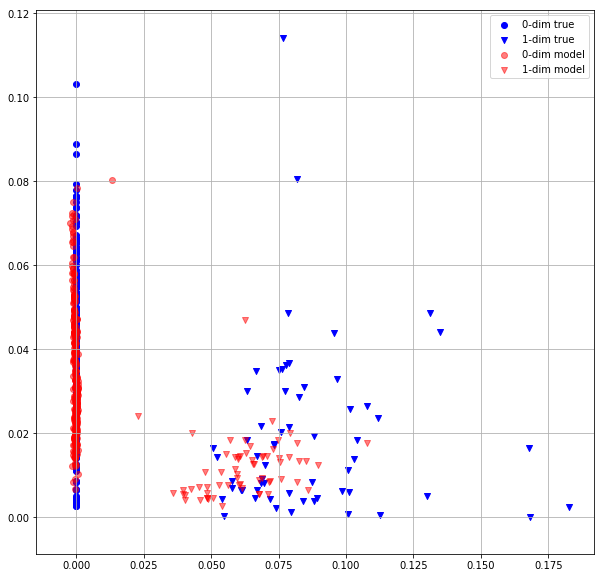

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0230799653 0.0250016730


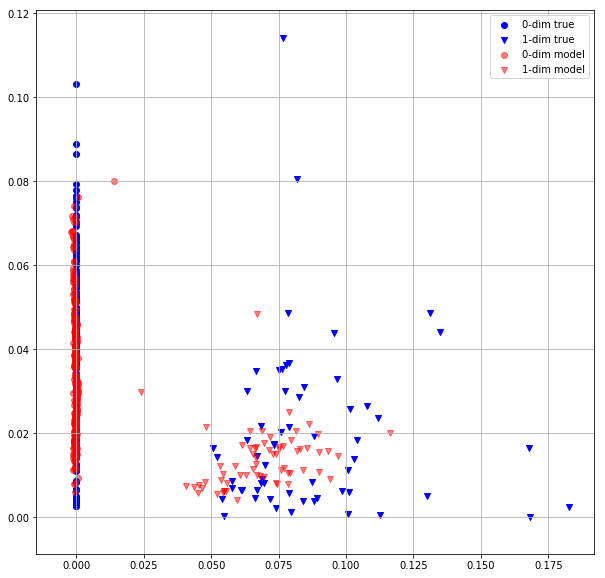

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0231398344 0.0251725838


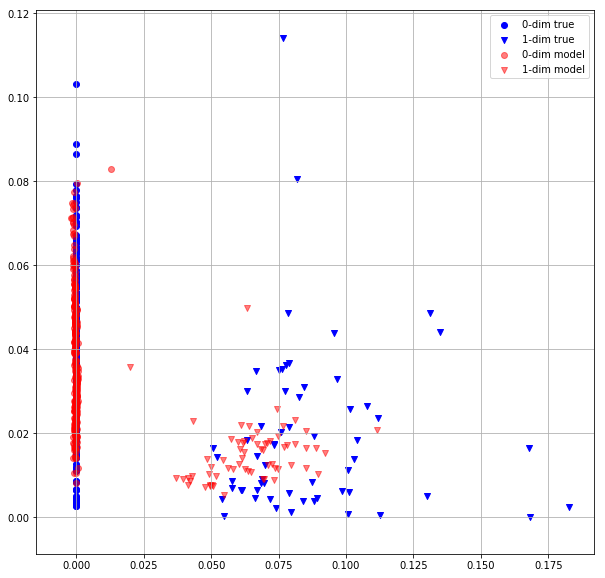

  0%|          | 0/13 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [5]:
# MLP + TSPN + 60 epochs + MLP_last
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    mask0 = (m == 0)
    mask1 = (m == 1)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    #mask0 = (m == 0)
    #mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0165743865 0.0150058232


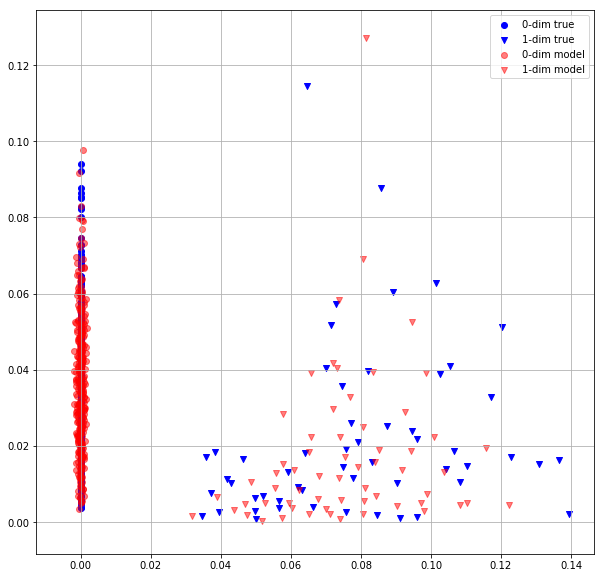

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0165552646 0.0149929868


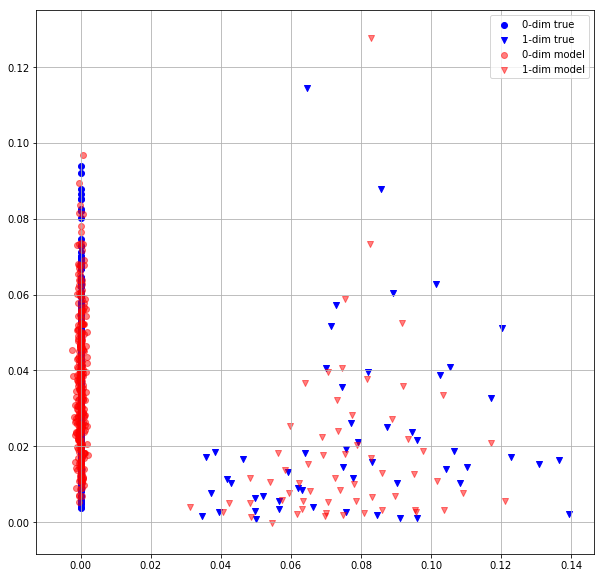

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0165201053 0.0149828158


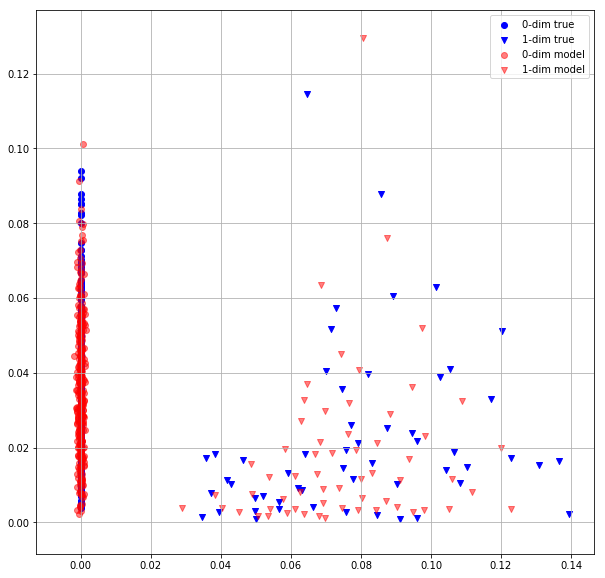

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0164836403 0.0149181411


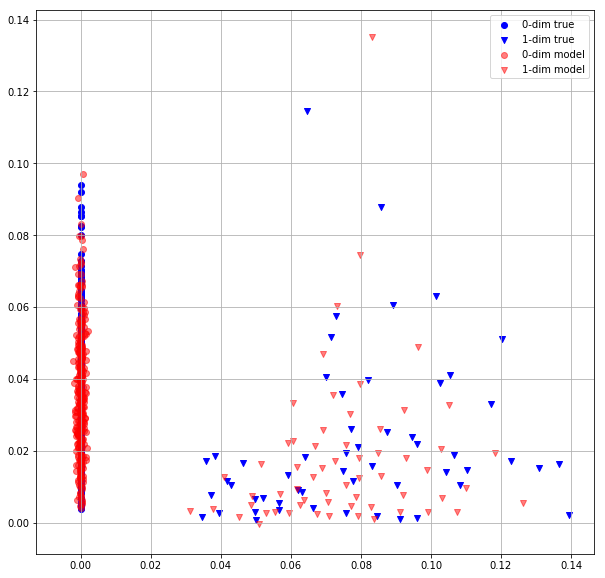

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0164457578 0.0149215376


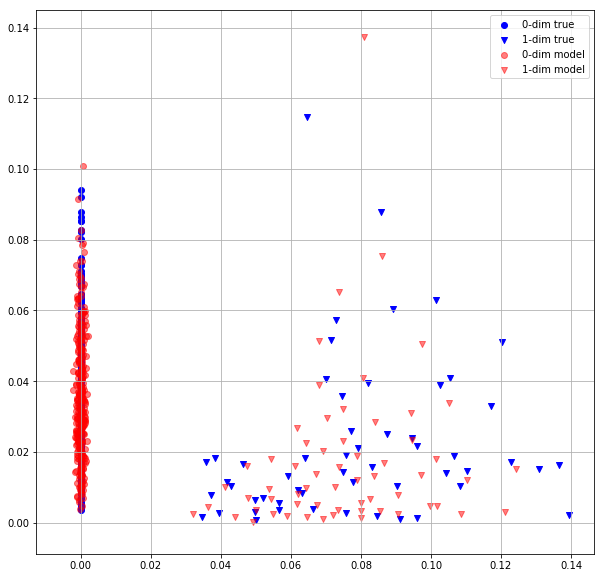

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0164712090 0.0149378302


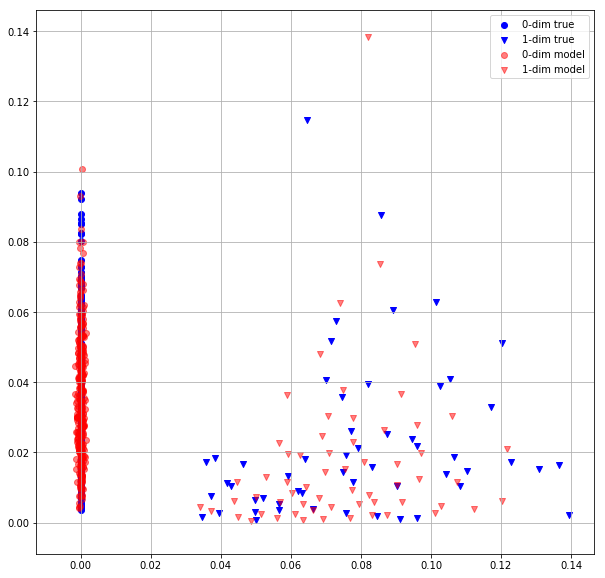

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0164558571 0.0149372220


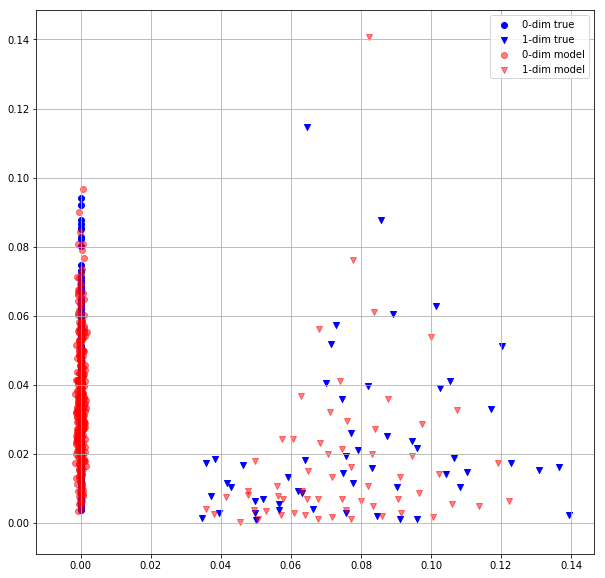

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0164558105 0.0149061987


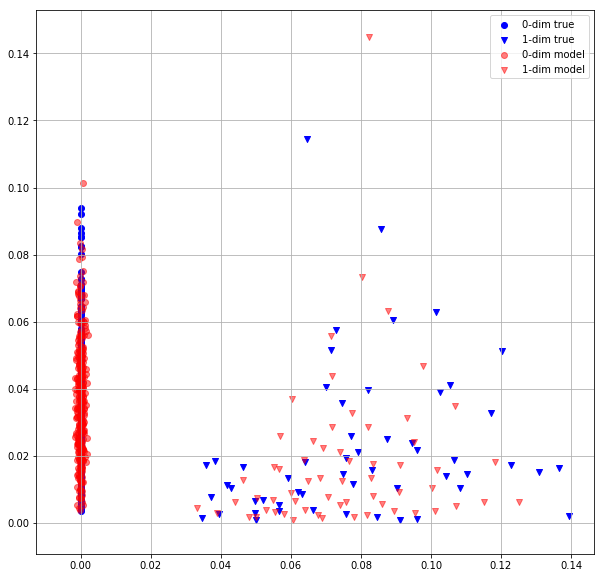

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0164700150 0.0148986550


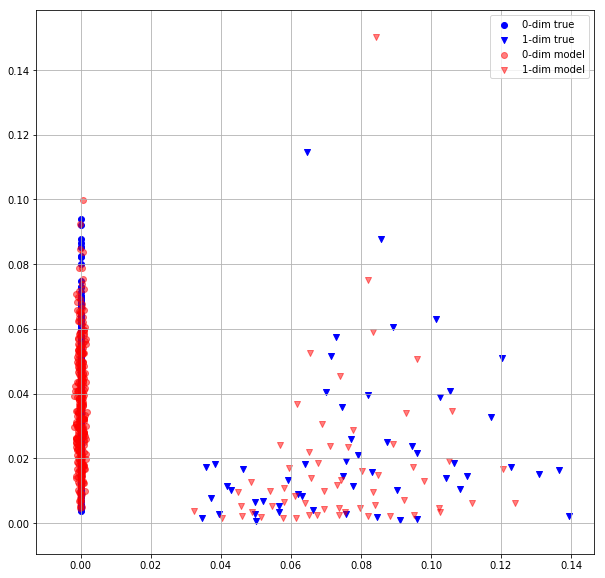

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0164464805 0.0149287852


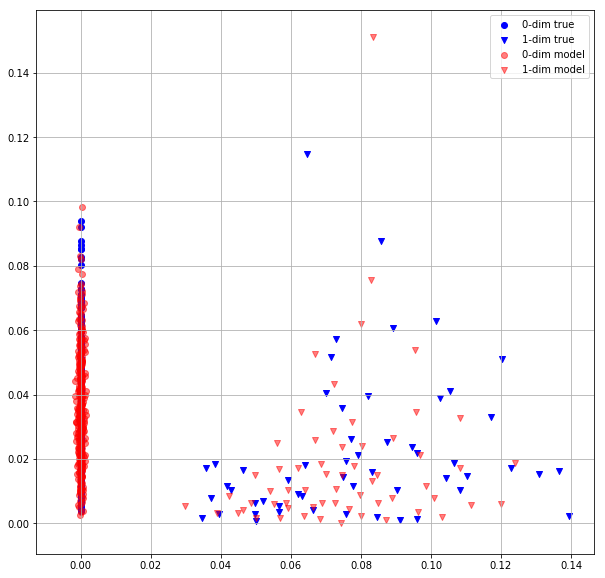

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0164842773 0.0149386041


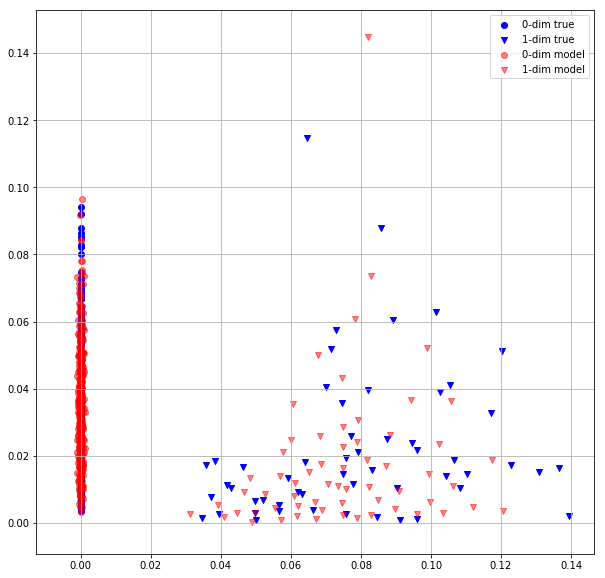

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0164704472 0.0148617458


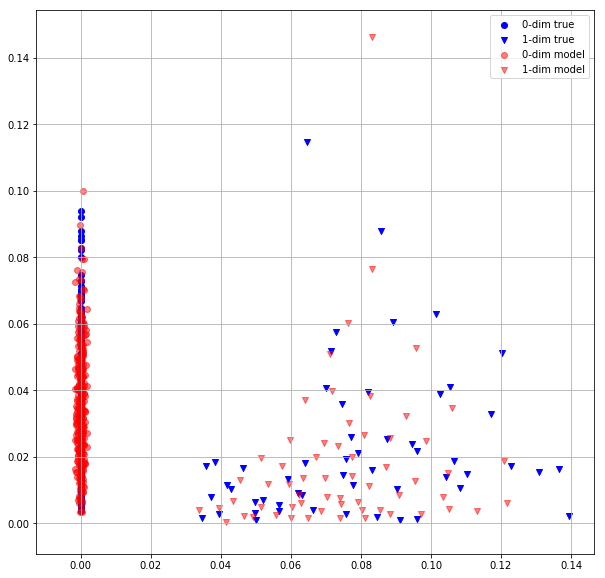

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0164199397 0.0148659274


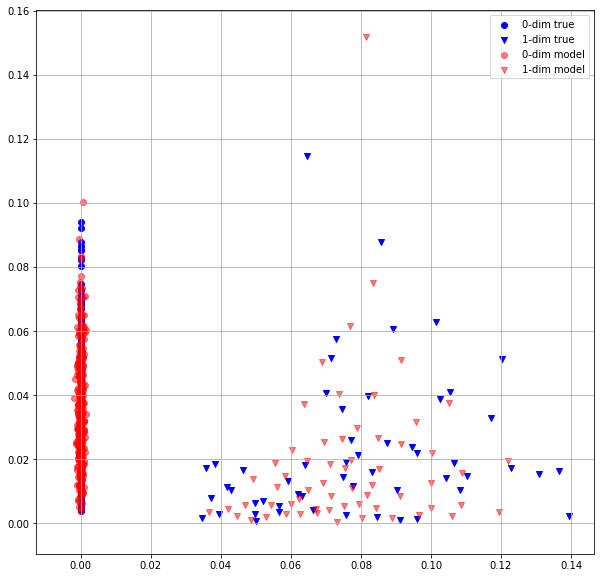

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0164571218 0.0148804439


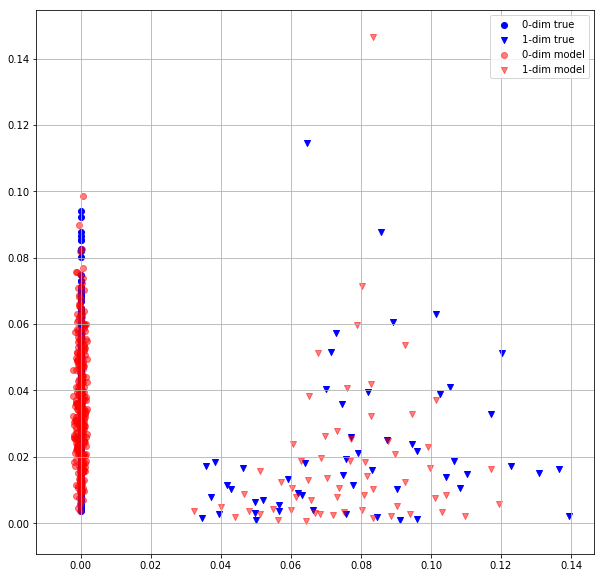

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0164532345 0.0148386098


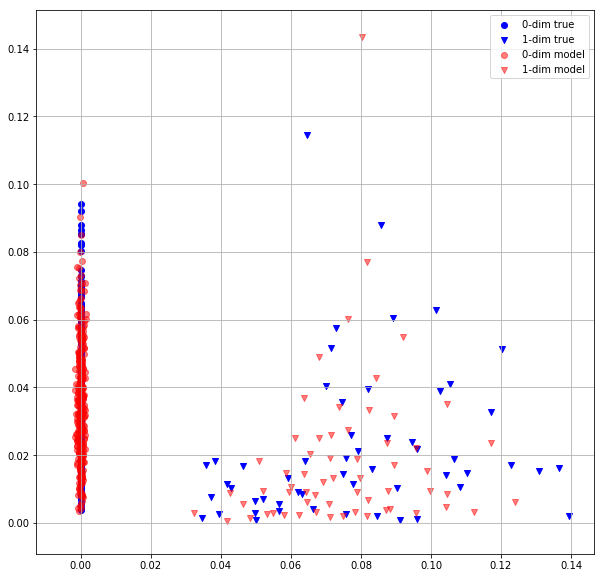

In [12]:
# linear baseline
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    mask0 = (m == 0)
    mask1 = (m == 1)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    #mask0 = (m == 0)
    #mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0358816162 0.0256848913


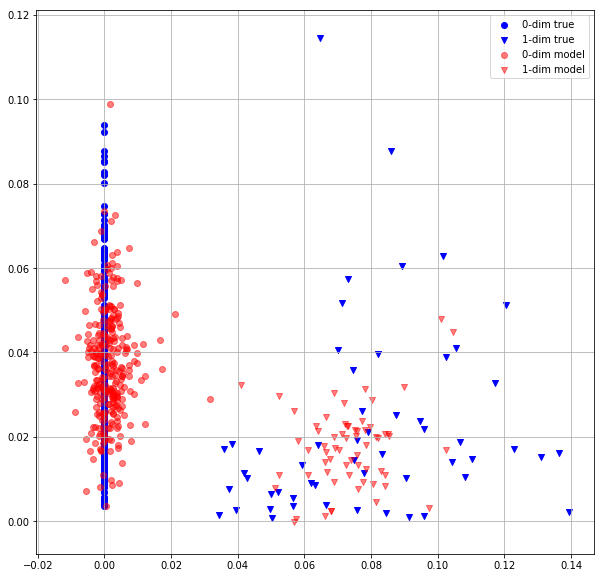

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0349563695 0.0243332330


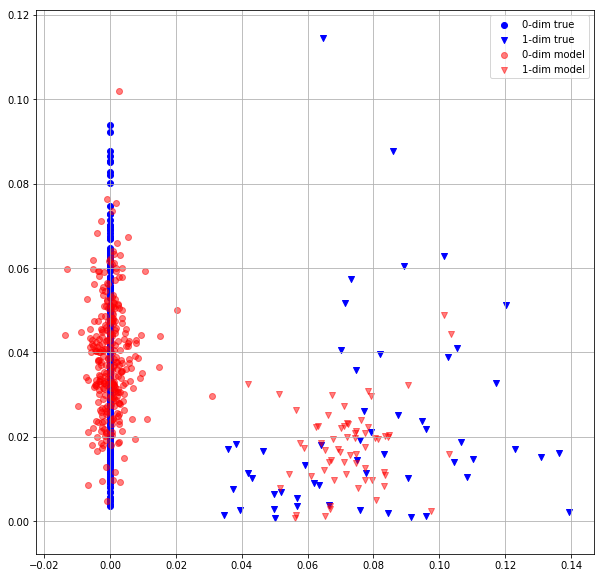

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0341725312 0.0240384284


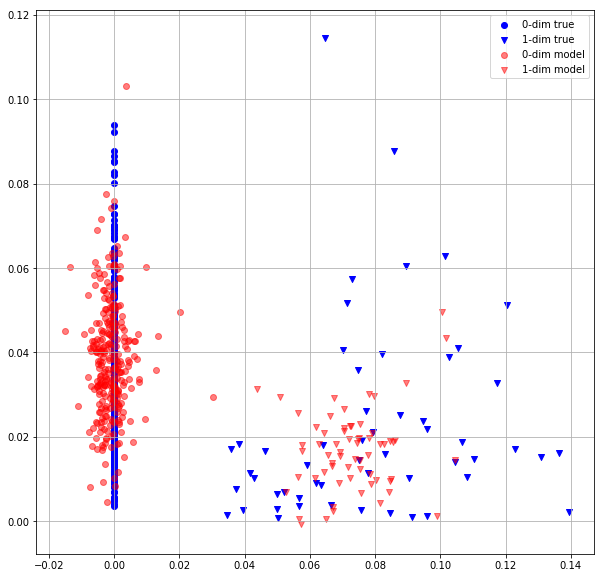

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0336291231 0.0249733068


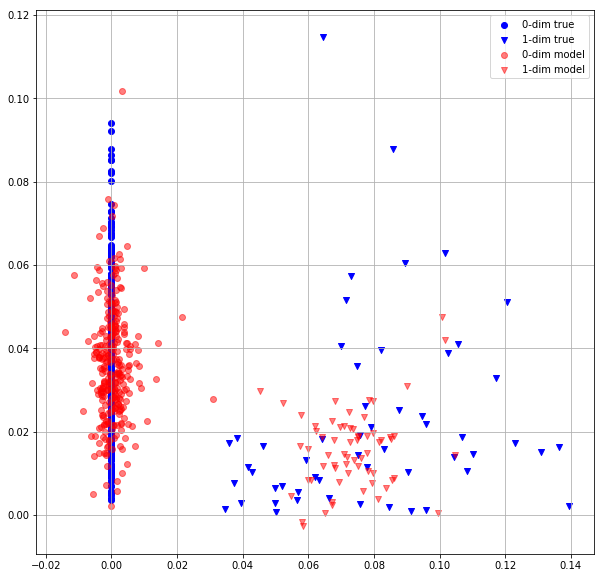

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0331159569 0.0244910885


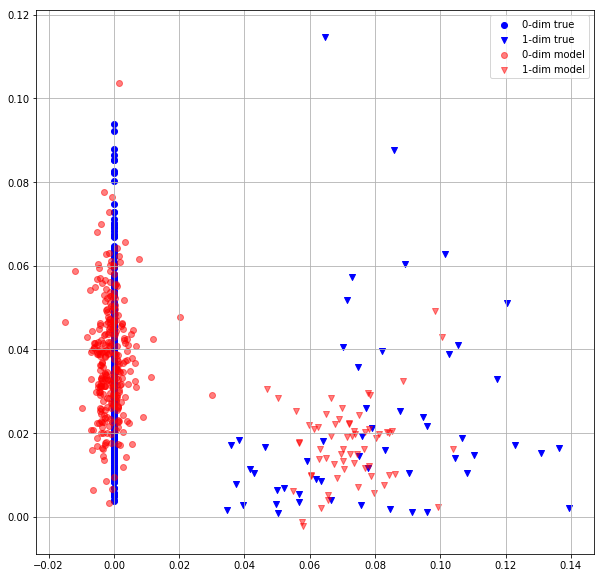

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0324978046 0.0235446878


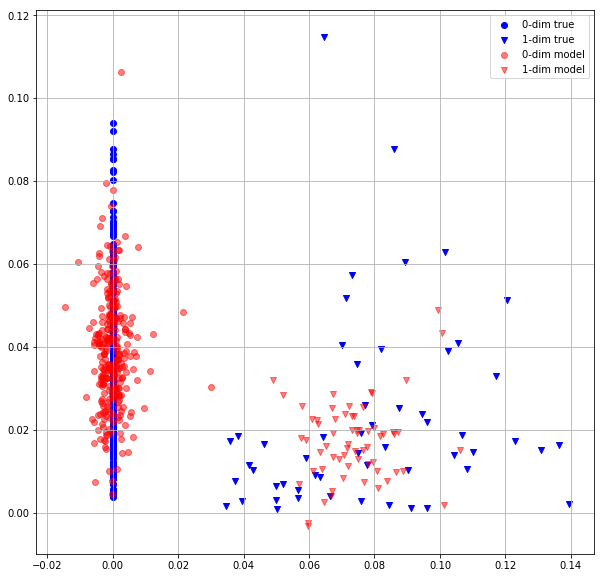

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0321288332 0.0237392560


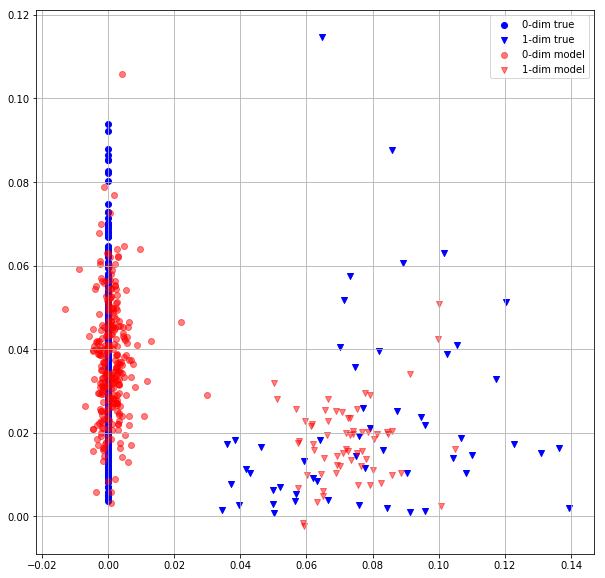

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0314111821 0.0230700430


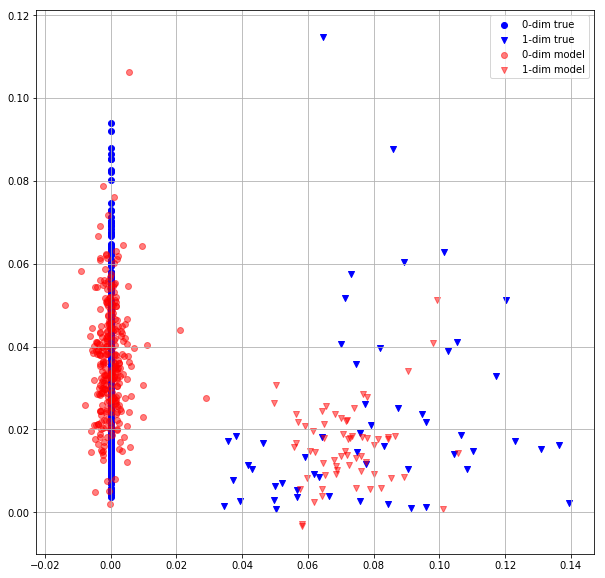

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0310021117 0.0233690087


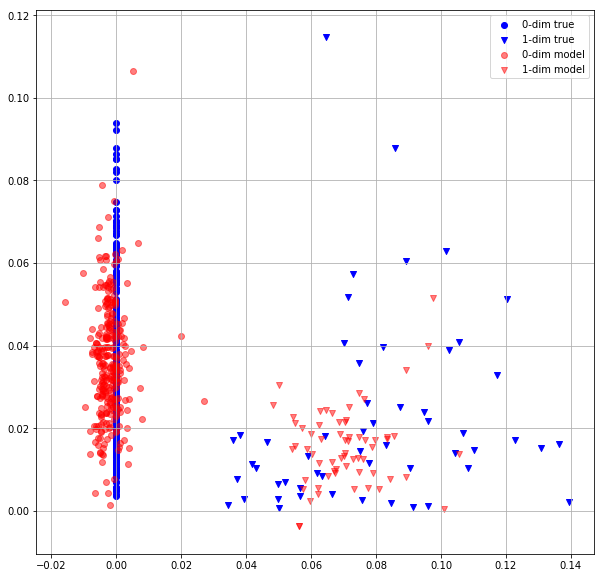

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0307441764 0.0235854909


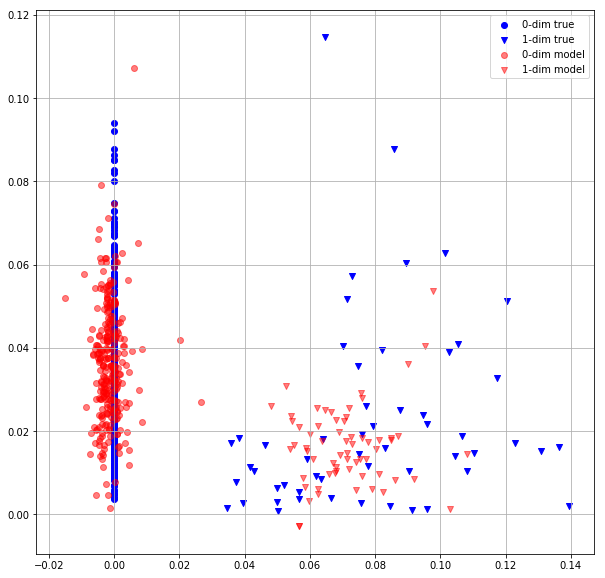

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0305584334 0.0226302836


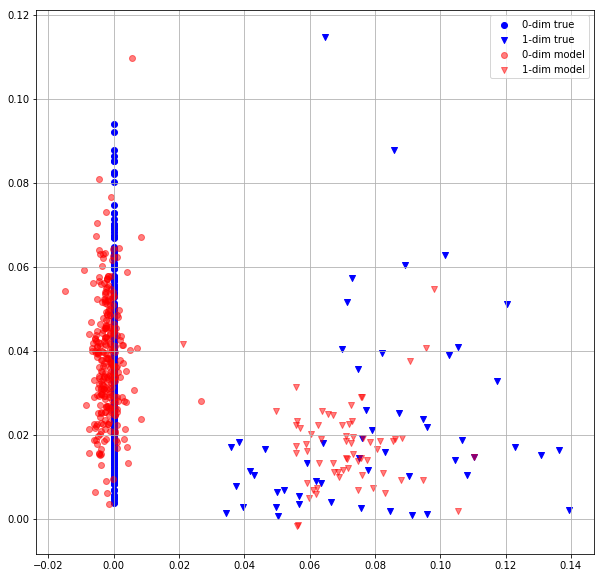

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0305708367 0.0240534488


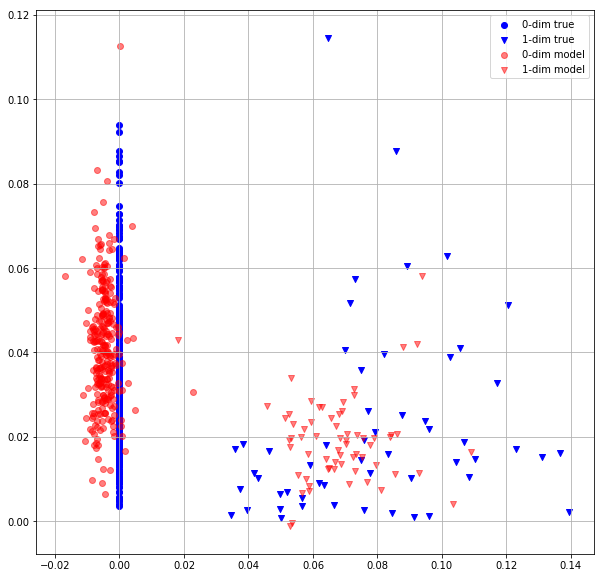

  0%|          | 0/13 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [5]:
# TSPN_new + Conv1d
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    mask0 = (m == 0)
    mask1 = (m == 1)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    #mask0 = (m == 0)
    #mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.6664509773 0.5939534903


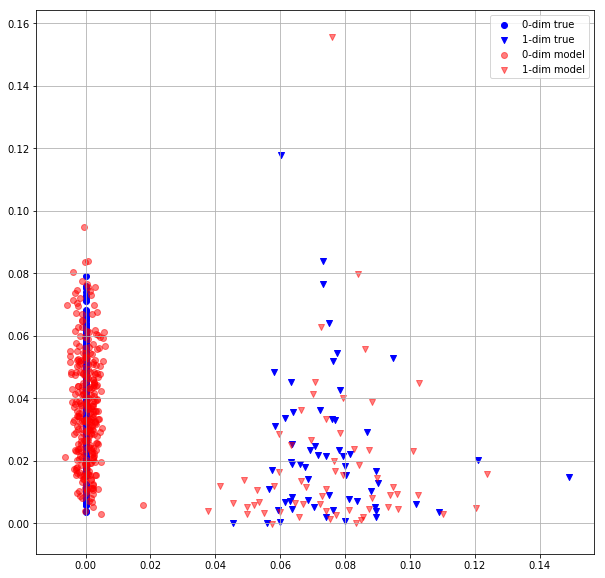

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.6467582583 0.5512588024


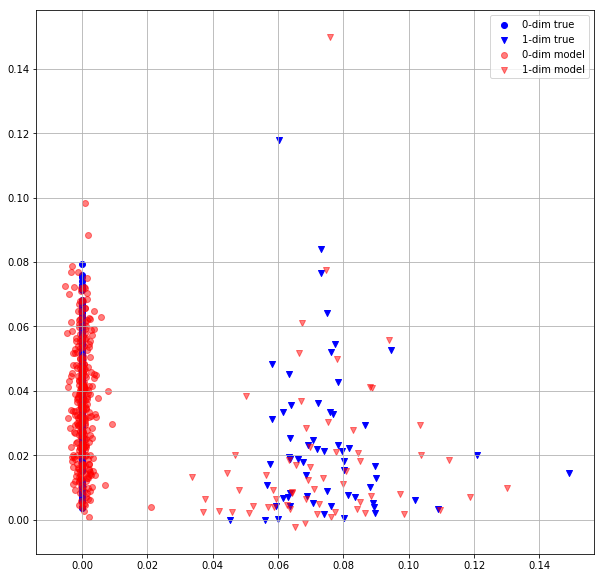

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.6026138067 0.4897106290


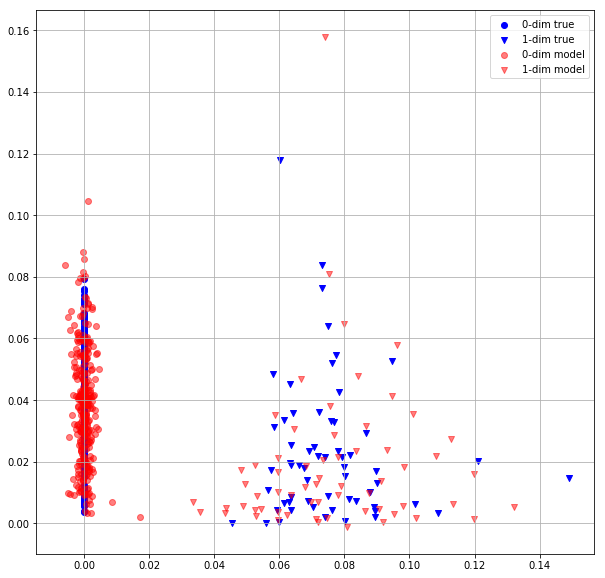

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.5769614577 0.4770133197


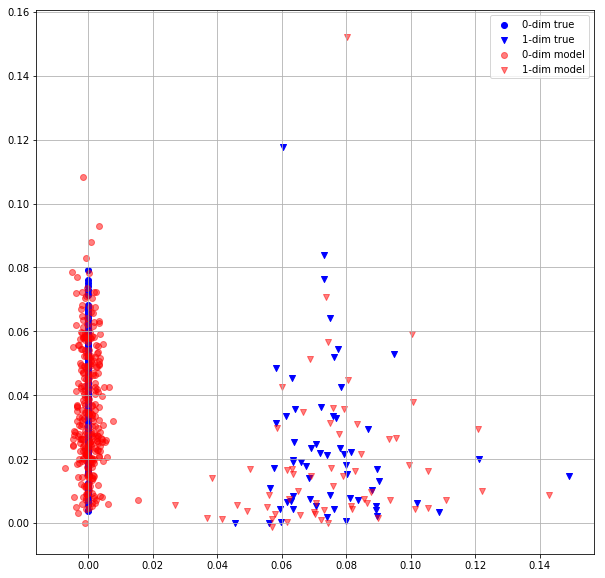

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.5476754904 0.4564357102


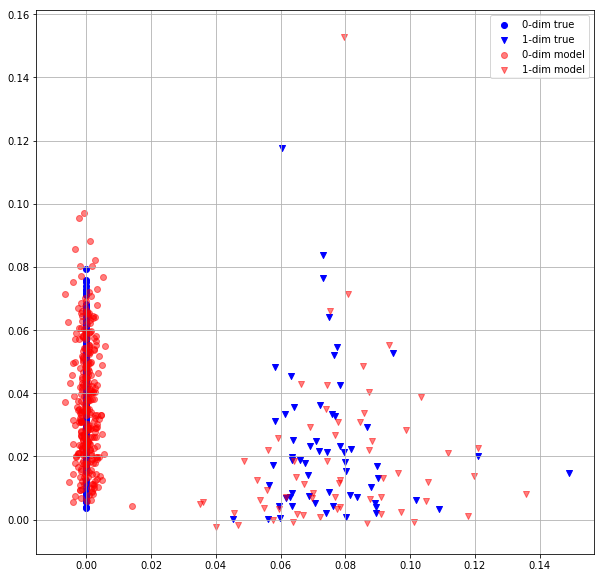

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.5279886723 0.4376513362


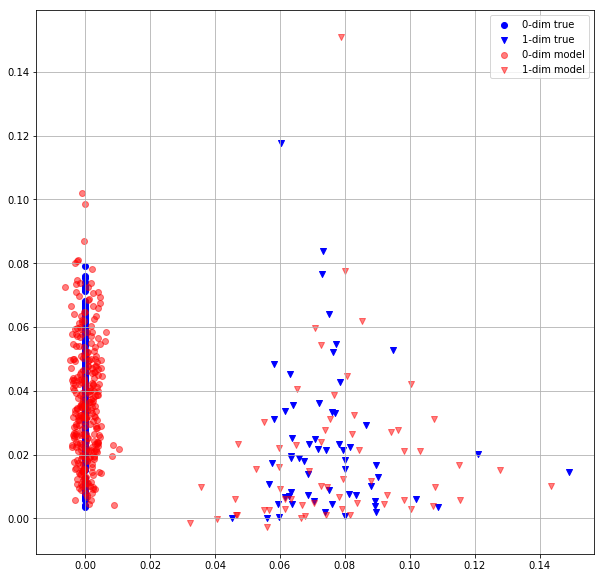

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.5475848913 0.4755875468


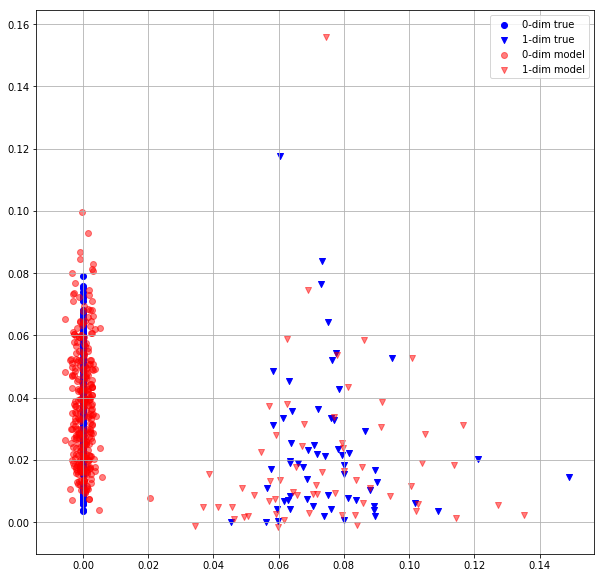

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.5614190698 0.4927764535


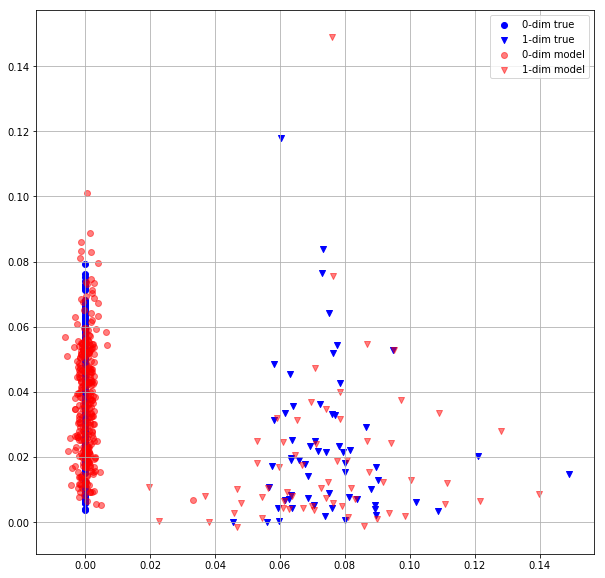

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.5472761393 0.4604049623


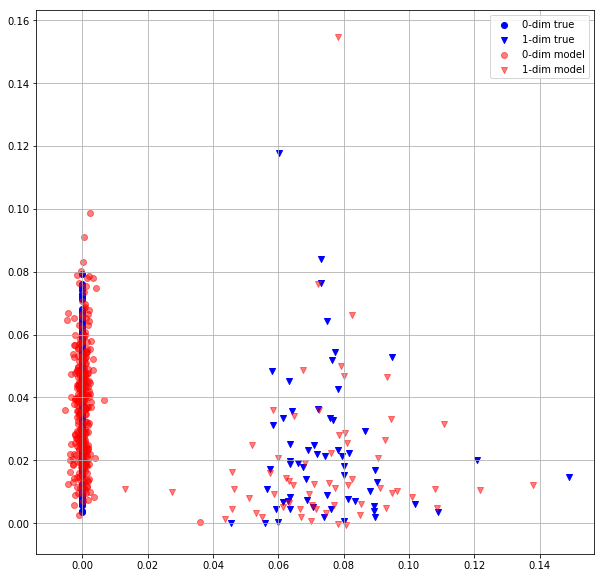

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.5350675583 0.4676076174


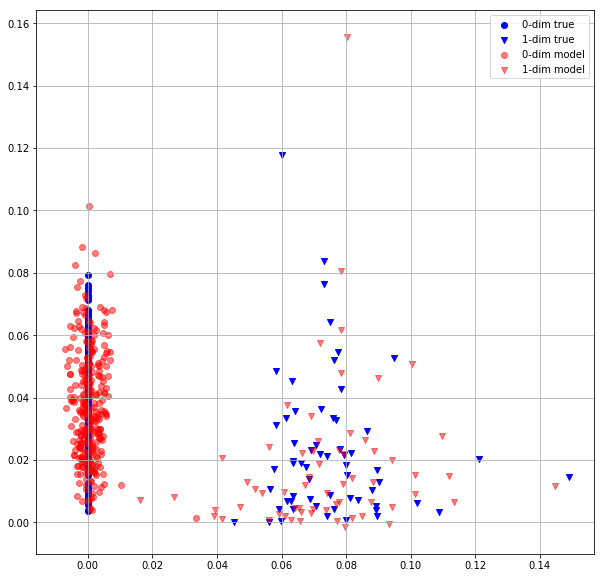

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.5398655534 0.4683077931


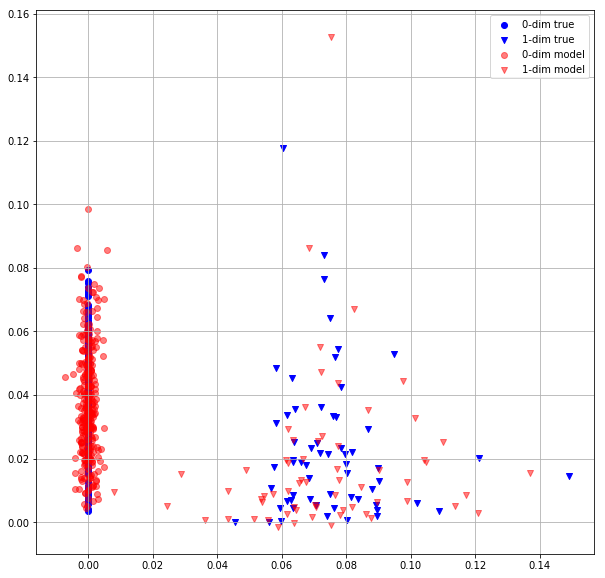

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.5530951023 0.4967935085


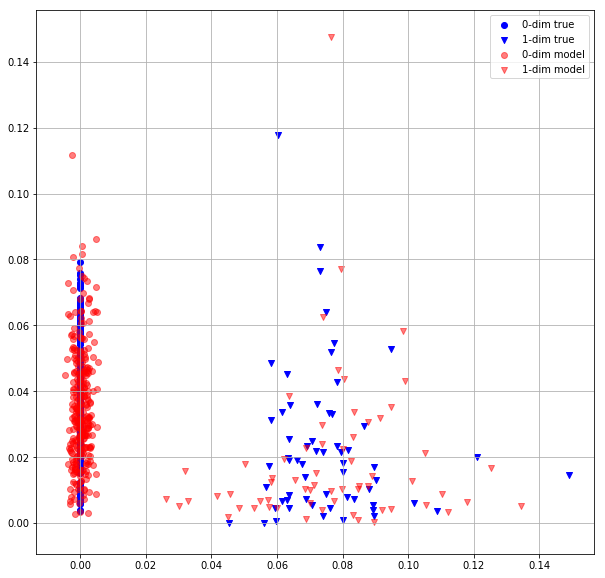

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.5749887228 0.4670205414


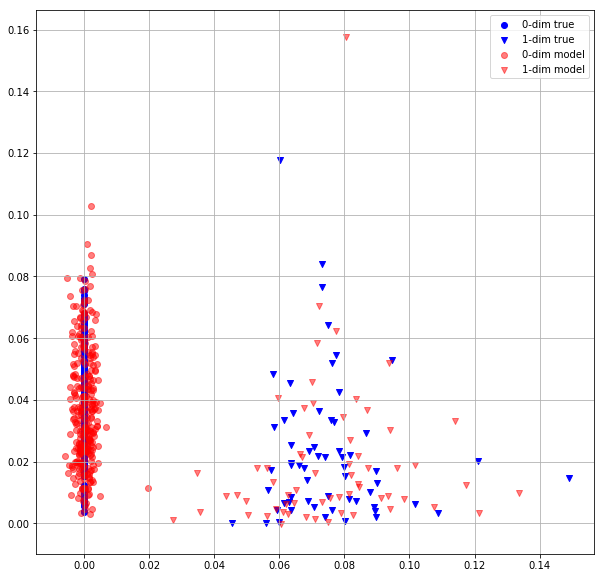

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.5250489712 0.4123868048


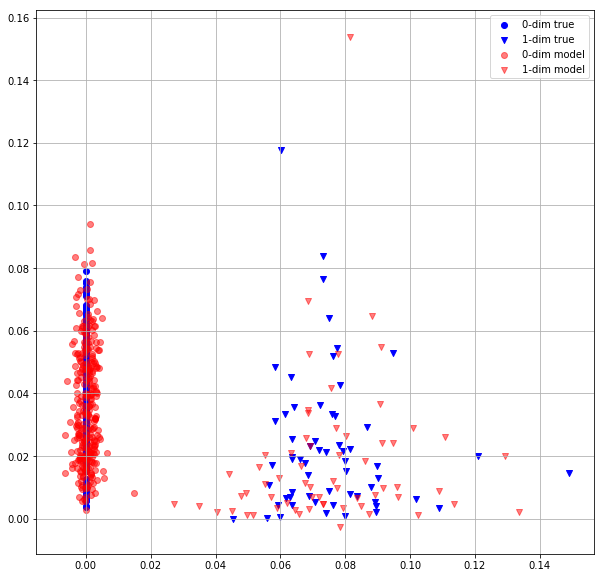

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.5073882937 0.3886916339


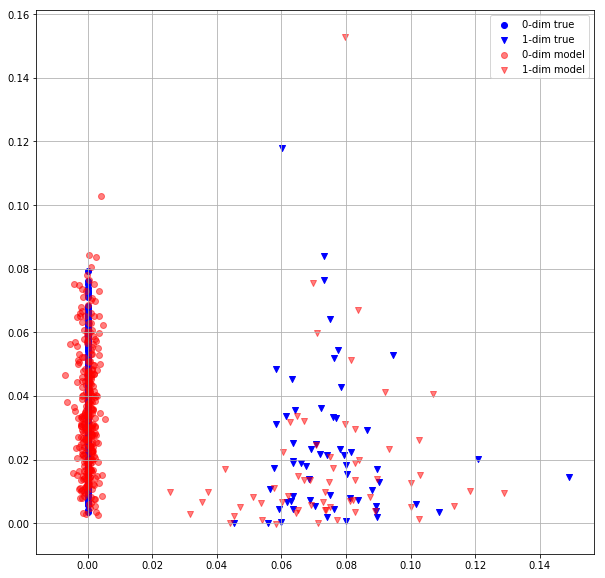

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.4919864535 0.4034193456


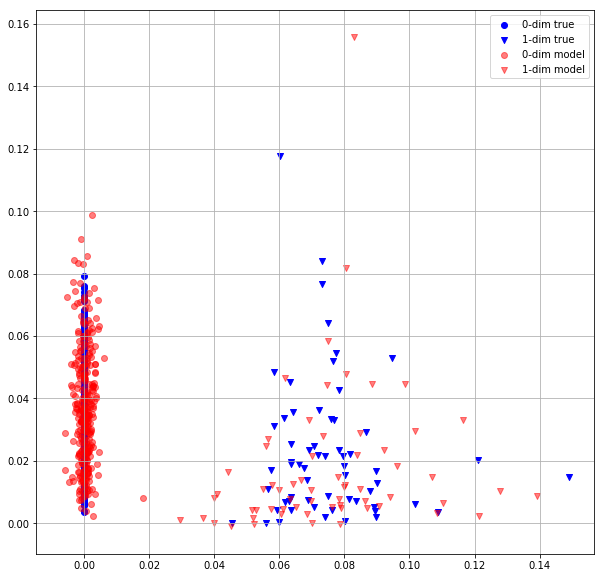

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.4826646149 0.4194571972


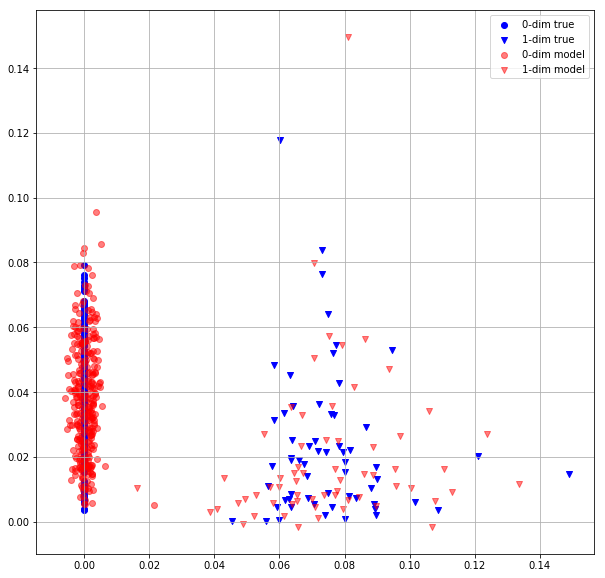

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.5350172520 0.4426896572


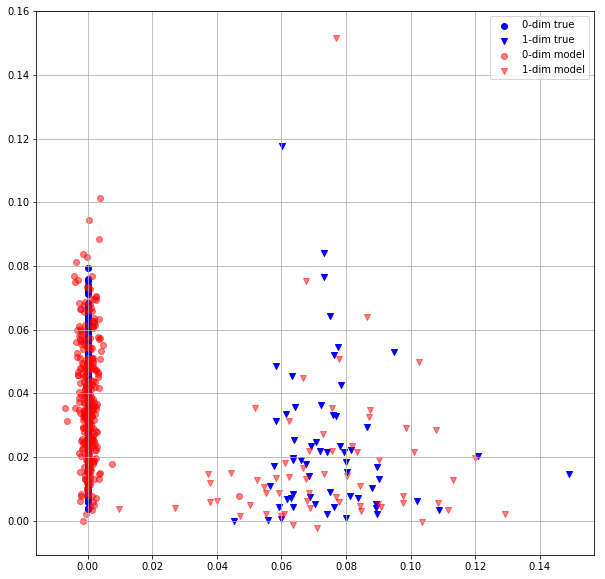

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.5135776401 0.4105750620


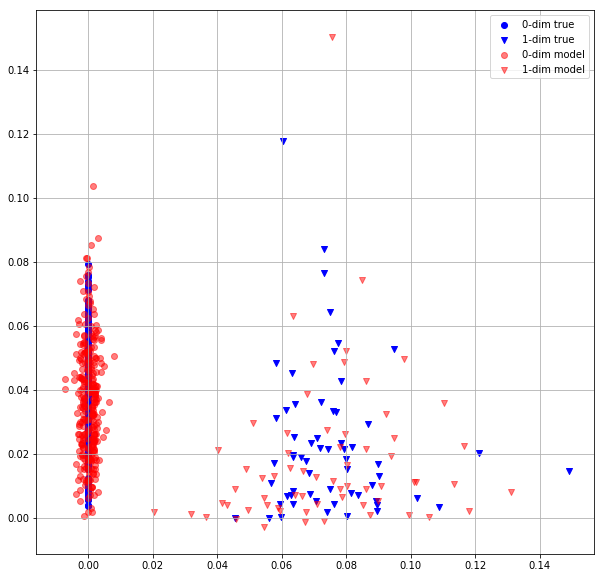

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.4759995937 0.3955135345


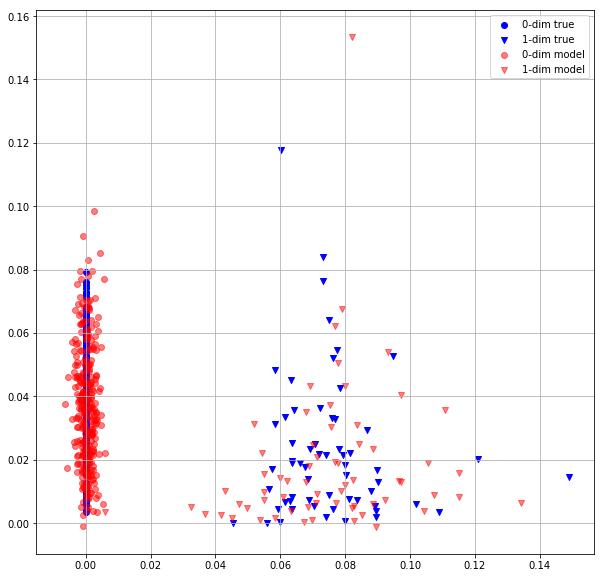

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.4914304316 0.3999338448


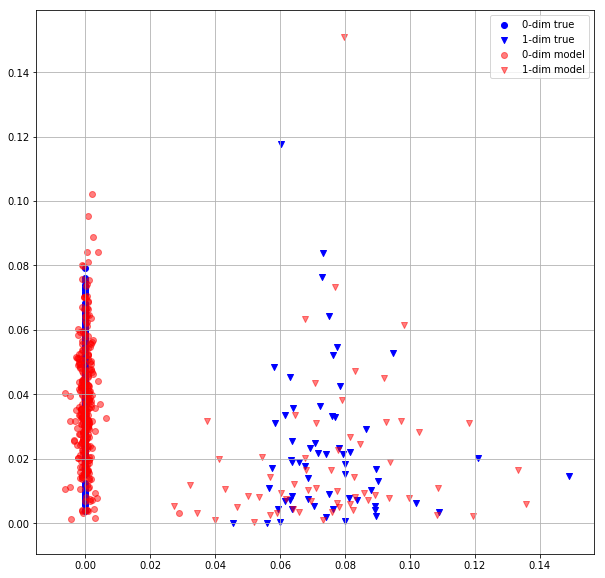

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.4927001894 0.4000869393


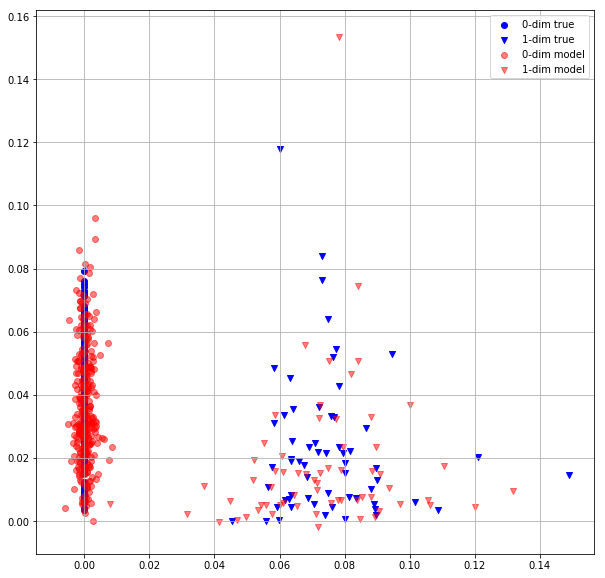

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.5173833370 0.4327930212


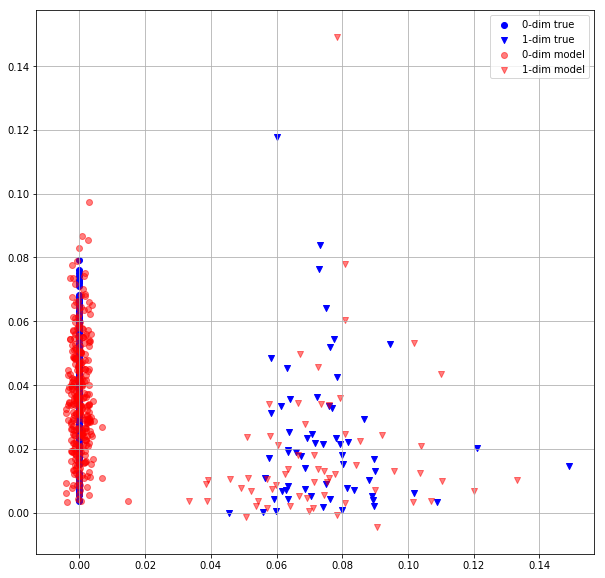

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.5058147907 0.4145531058


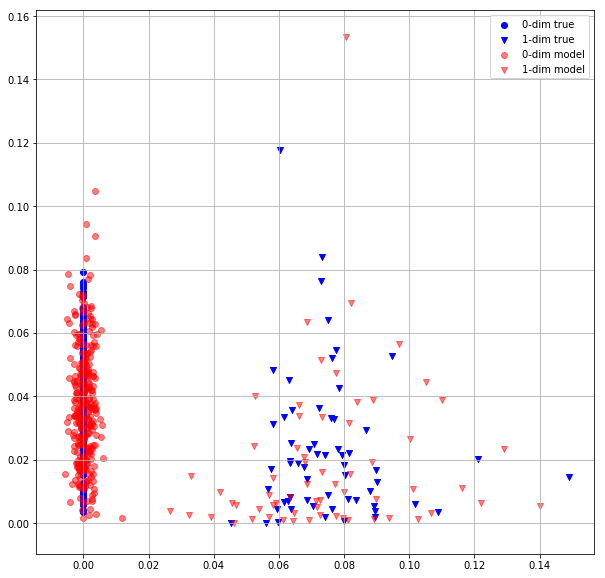

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.4965009391 0.4309901297


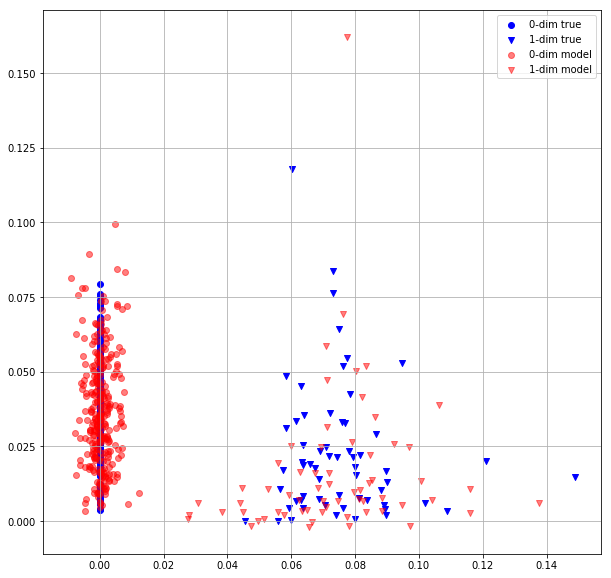

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.5276472569 0.4693246186


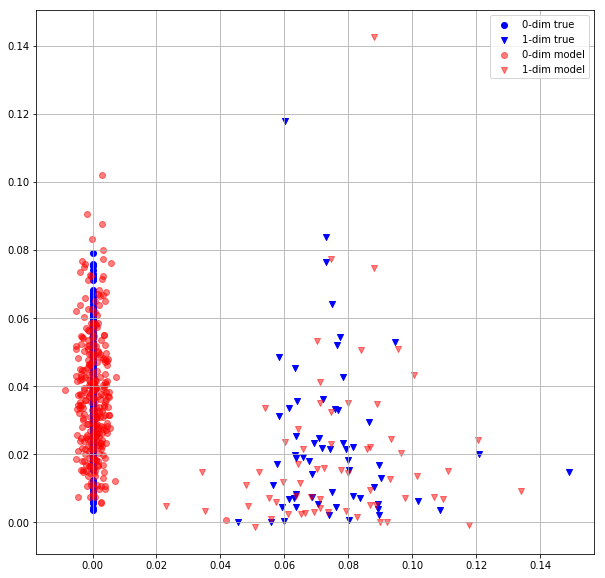

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.5367816687 0.4865224361


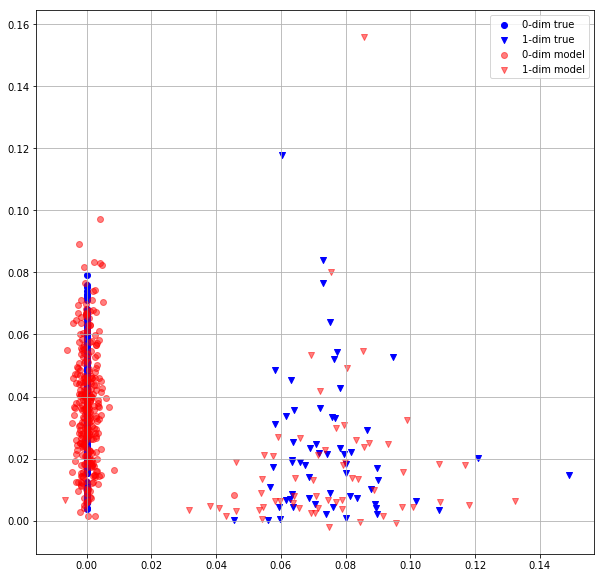

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.5097474456 0.4031035900


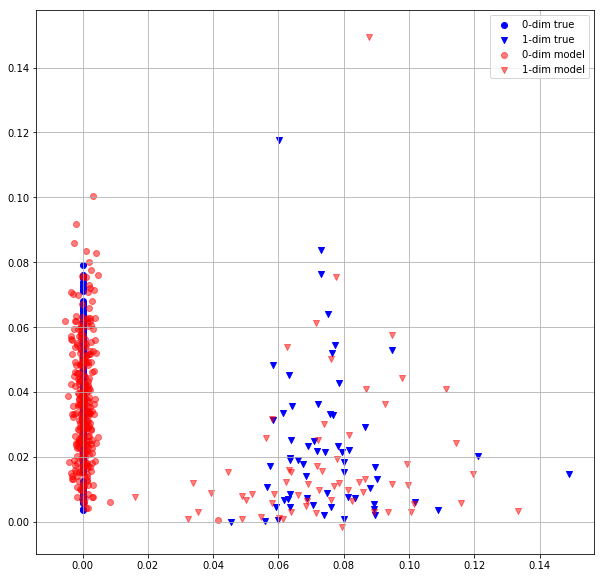

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.4937735498 0.4006532729


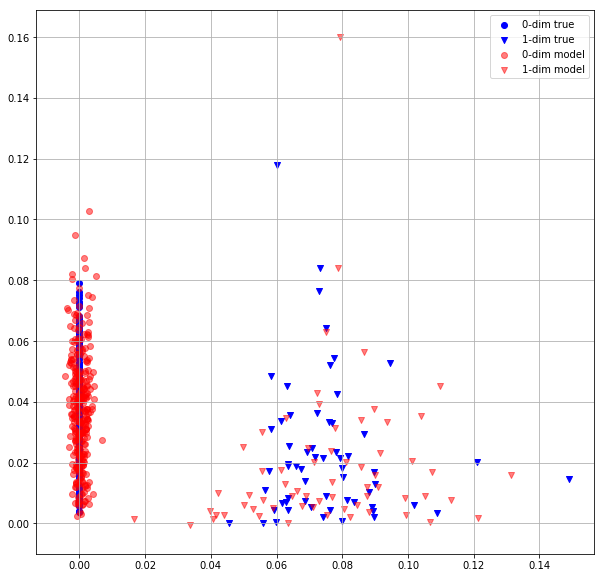

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.4763743579 0.3856259286


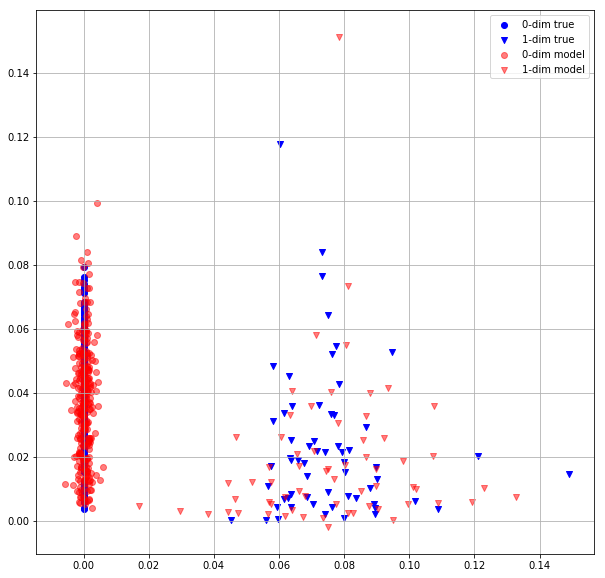

In [5]:
#MLP enc + MLP dec + 60 epochs + custom loss
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    #m = (pred[0, :, 2] > 0.5)
    #mask0 = (m == 0)
    #mask1 = (m == 1)
    m = np.argmax(pred[0, :, 2:], axis = 1)
    mask0 = (m == 0)
    mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0666962862 0.0387450382


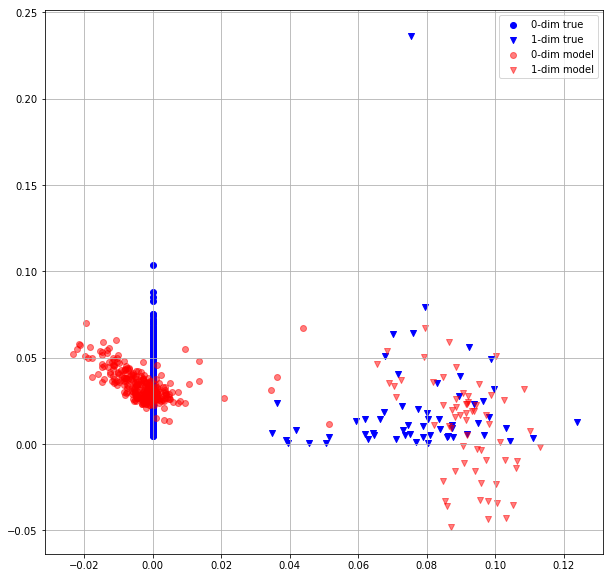

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0638857782 0.0372791924


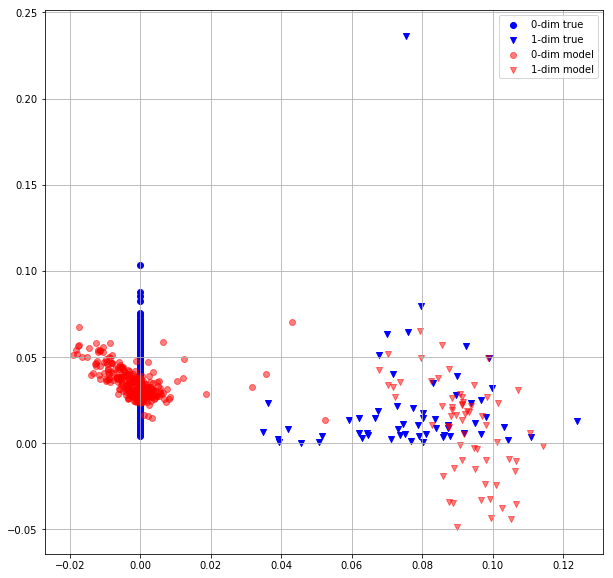

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0609084405 0.0359138027


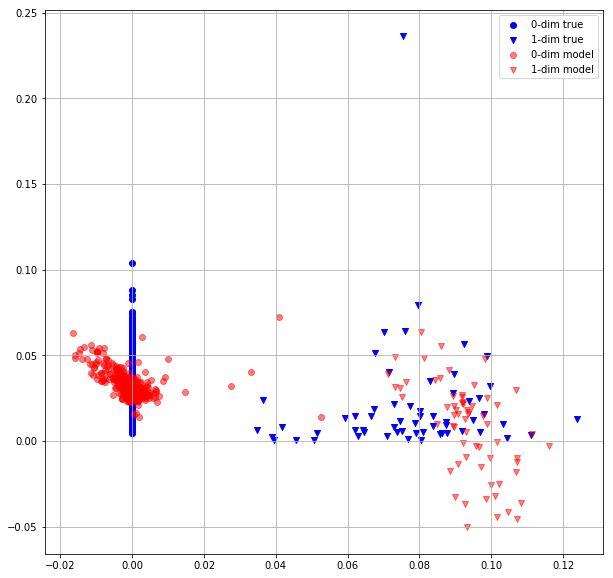

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0586430989 0.0348337218


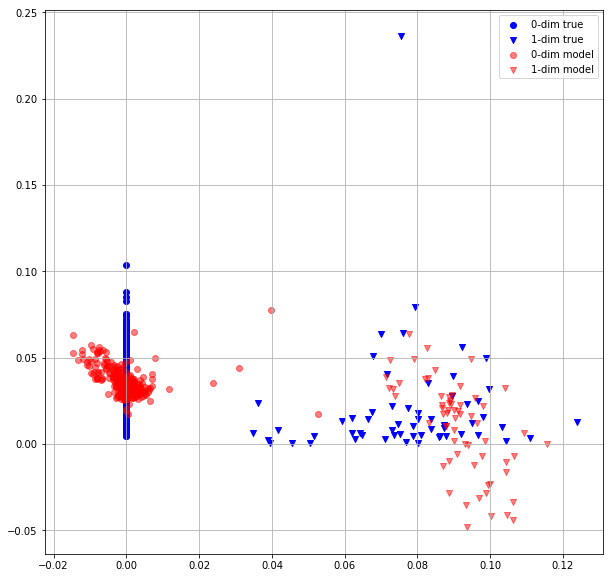

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0562543198 0.0340393707


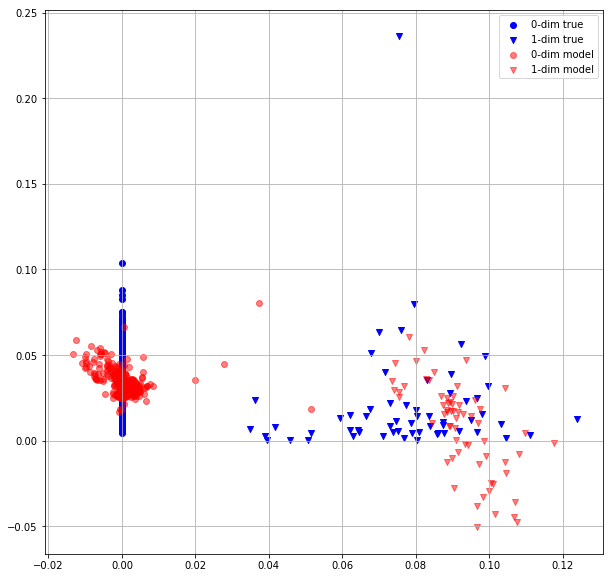

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0544868670 0.0338474922


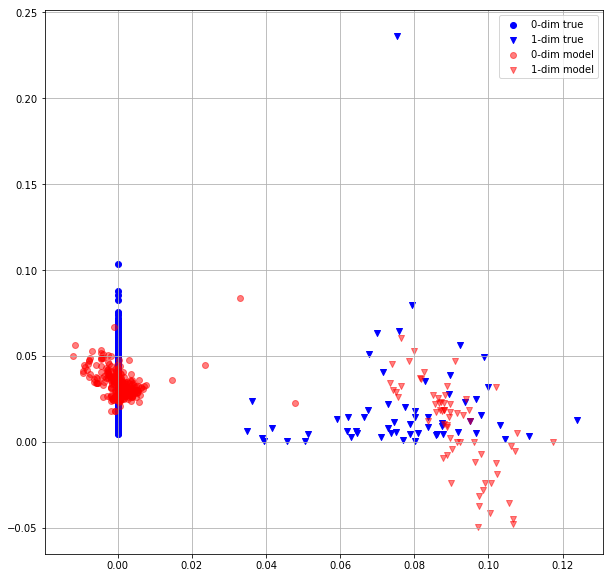

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0530098565 0.0332533307


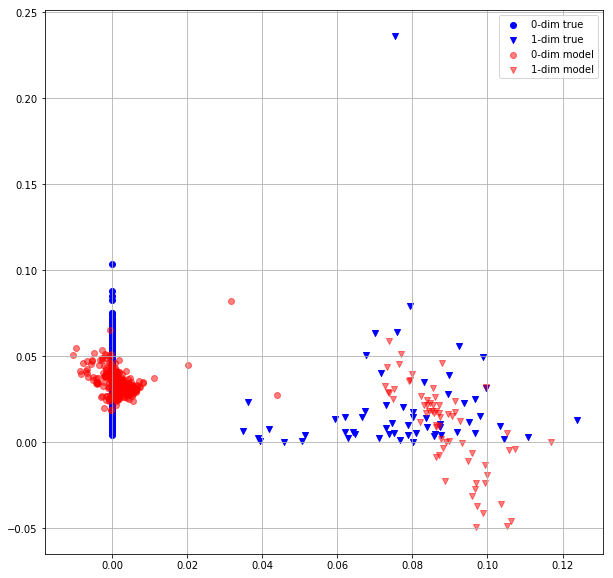

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0510819294 0.0327962302


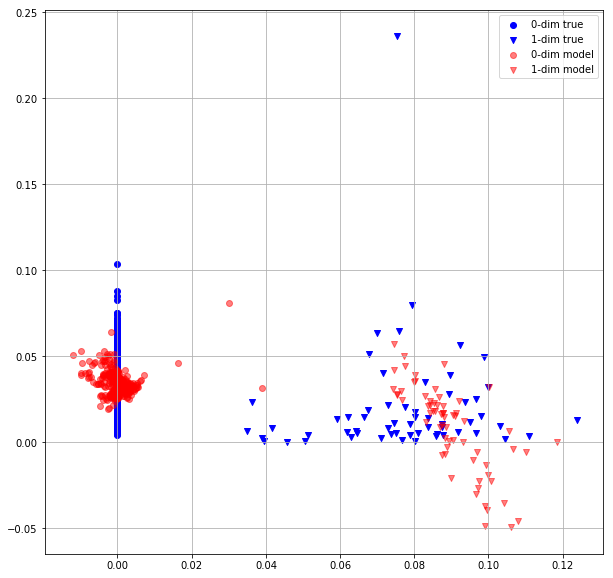

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0495296381 0.0323458090


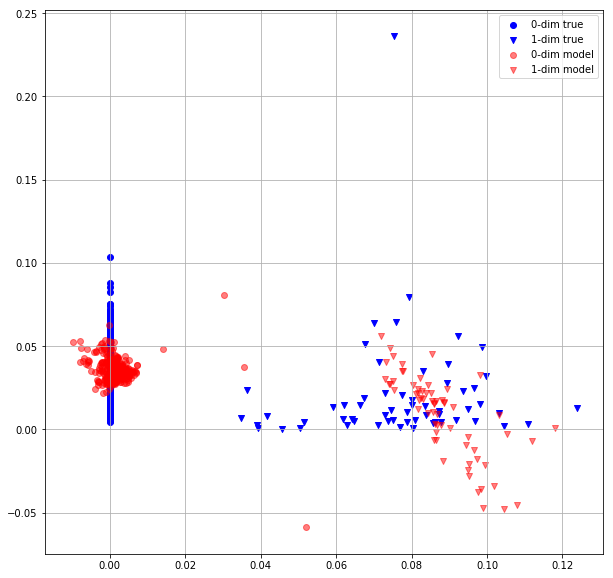

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0478954799 0.0315287896


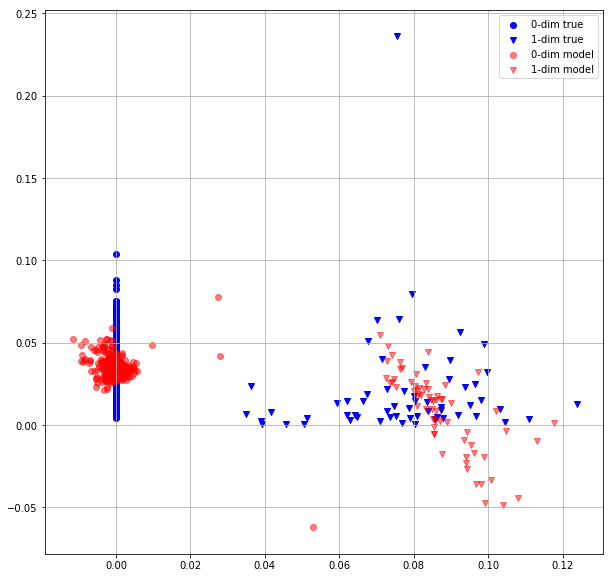

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0461862199 0.0309280306


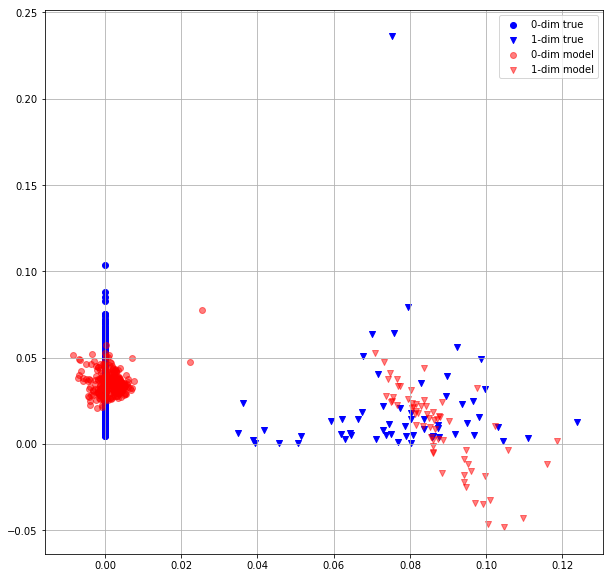

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0449872166 0.0308966208


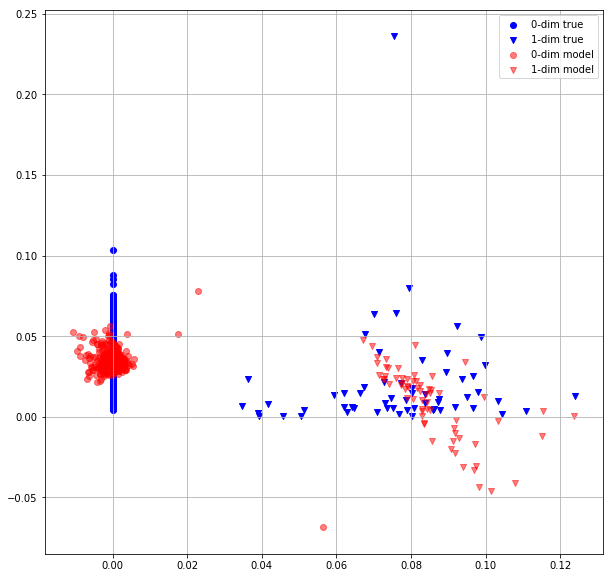

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [8]:
# Linear + TSPN_old
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    mask0 = (m == 0)
    mask1 = (m == 1)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    #mask0 = (m == 0)
    #mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   0 0.0512576848 0.0495103933


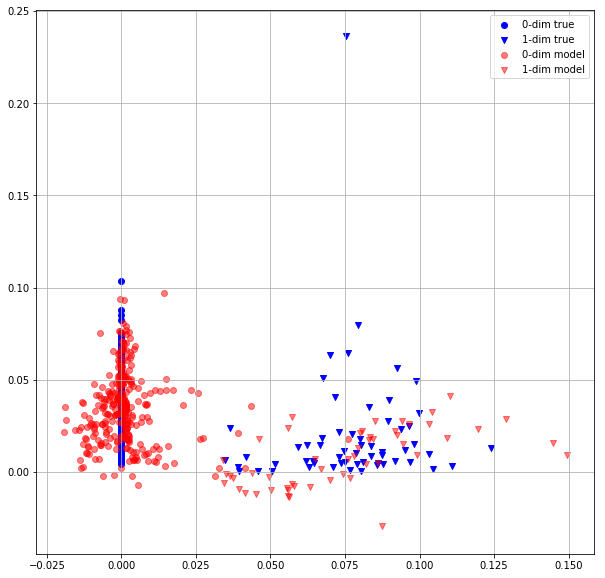

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   1 0.0480120368 0.0460354947


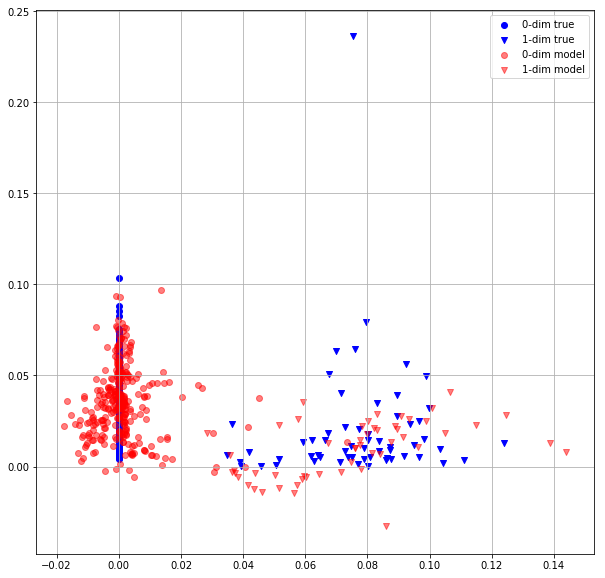

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   2 0.0446759090 0.0437252633


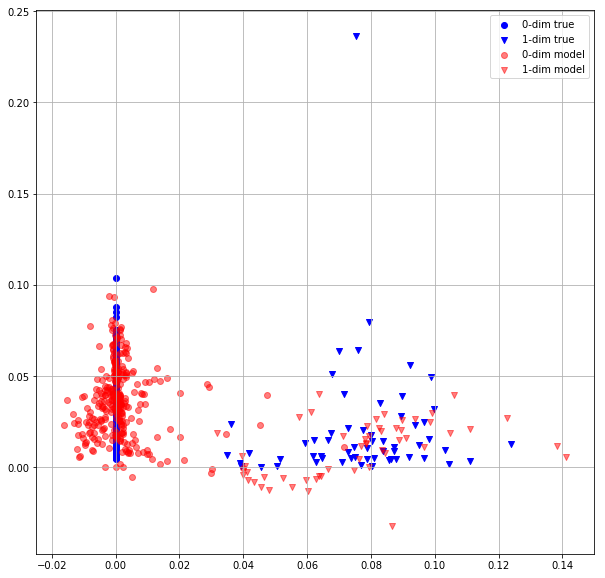

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   3 0.0420639217 0.0408054143


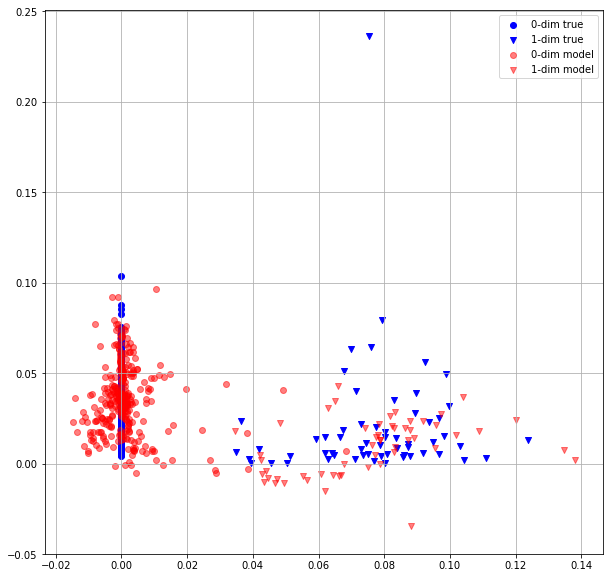

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   4 0.0396623313 0.0383979641


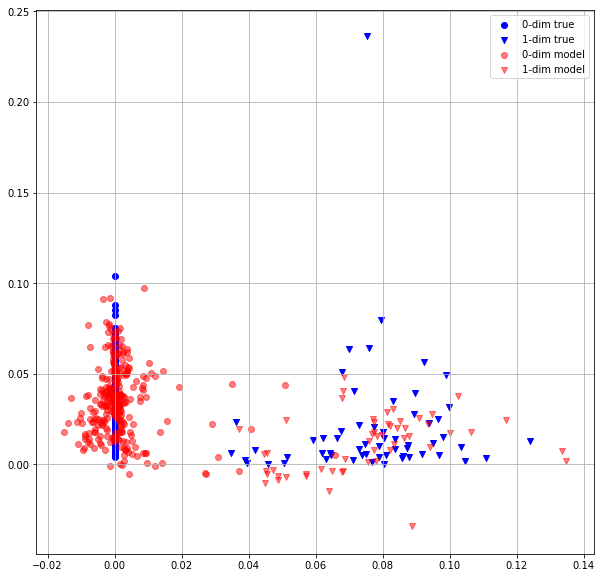

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   5 0.0374155007 0.0371080115


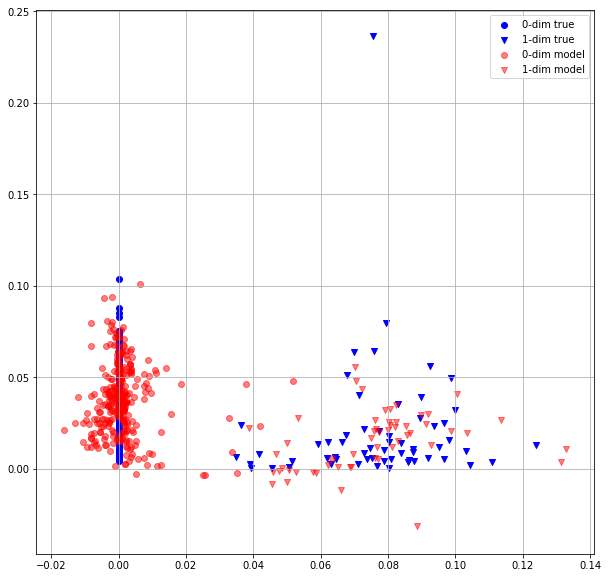

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   6 0.0355277881 0.0348566137


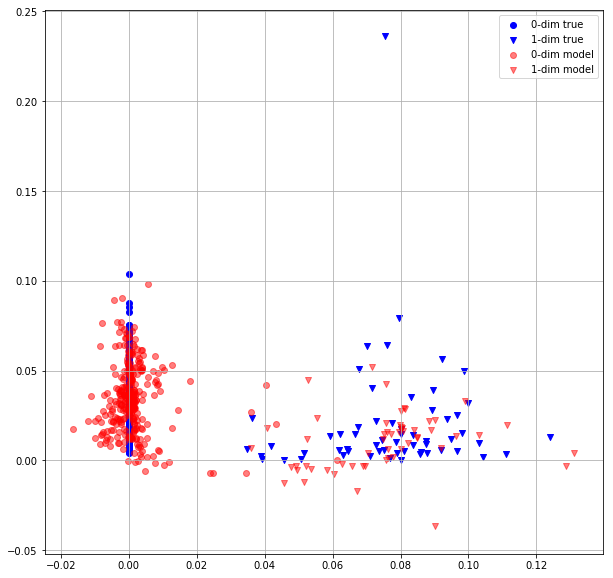

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   7 0.0332786143 0.0328484438


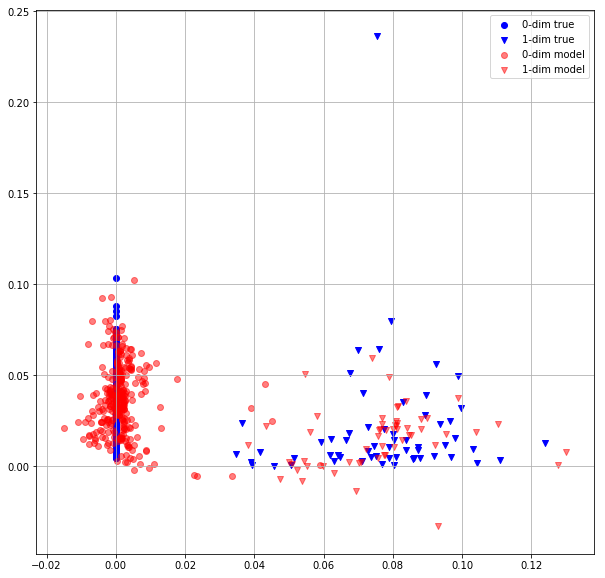

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   8 0.0309277773 0.0305168461


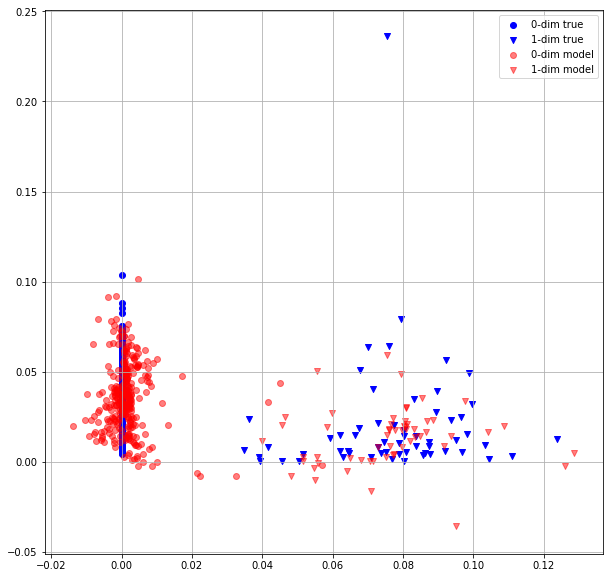

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:   9 0.0288267415 0.0274199527


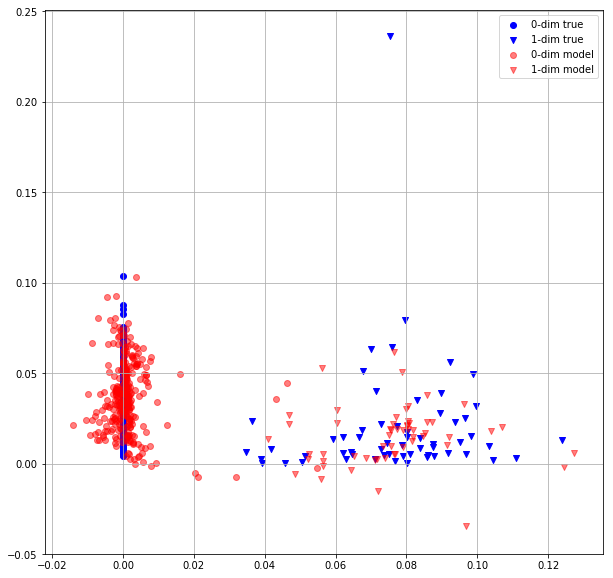

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  10 0.0271733981 0.0259352438


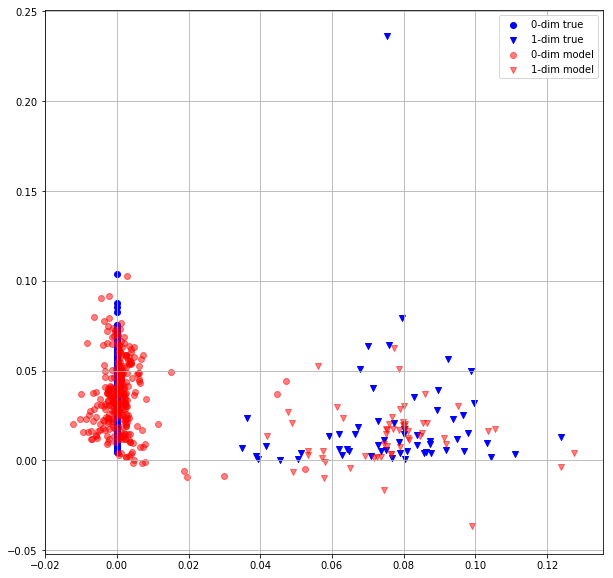

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  11 0.0256004781 0.0246218331


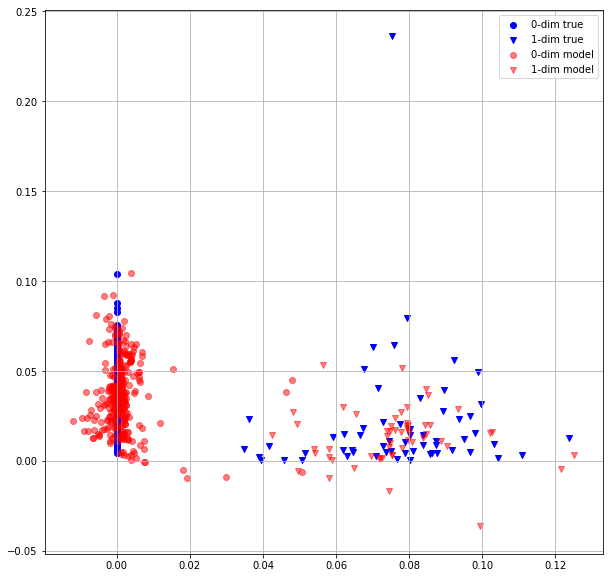

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  12 0.0238697343 0.0227811746


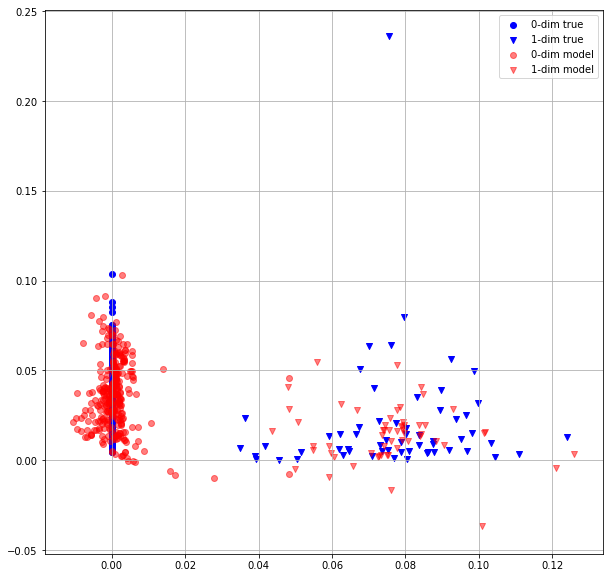

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  13 0.0219390914 0.0211554058


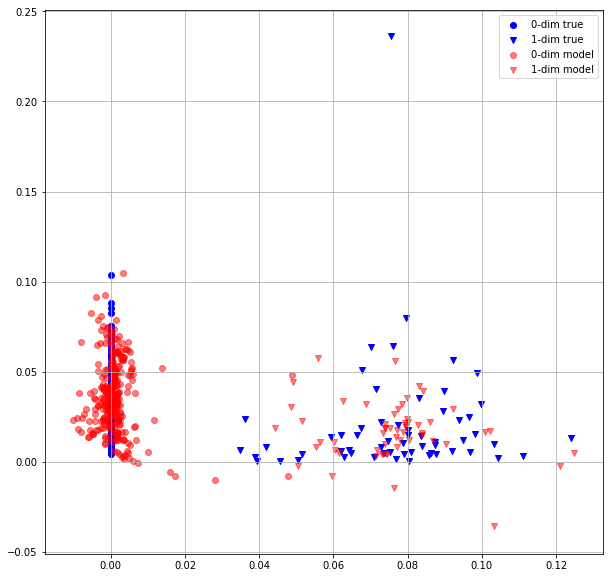

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  14 0.0206910428 0.0197991021


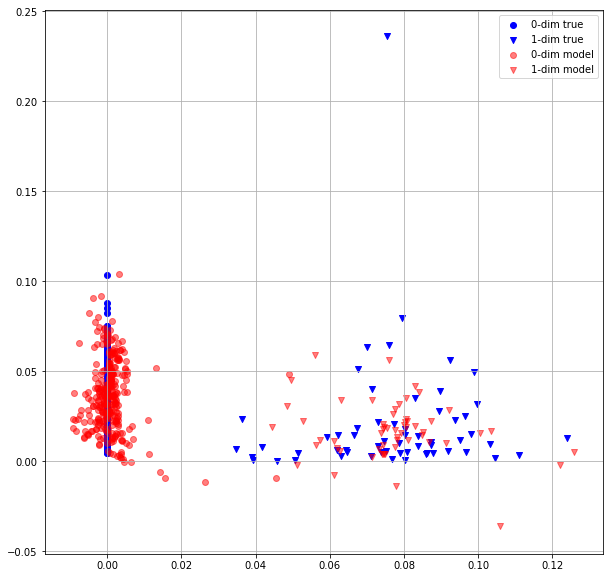

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  15 0.0193528235 0.0189931244


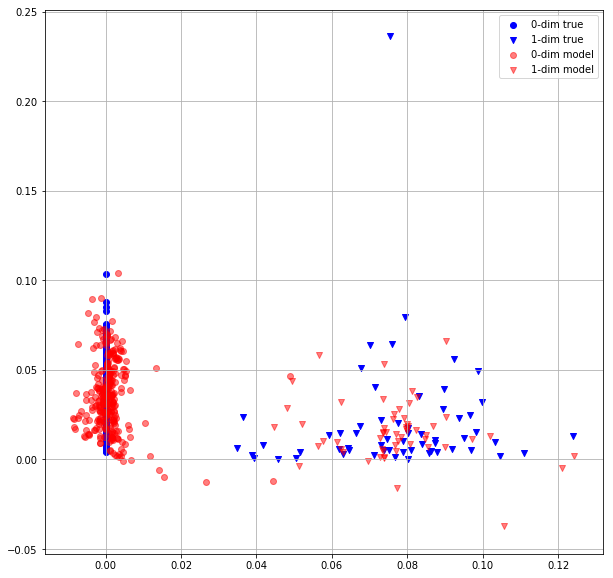

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  16 0.0184759013 0.0175077058


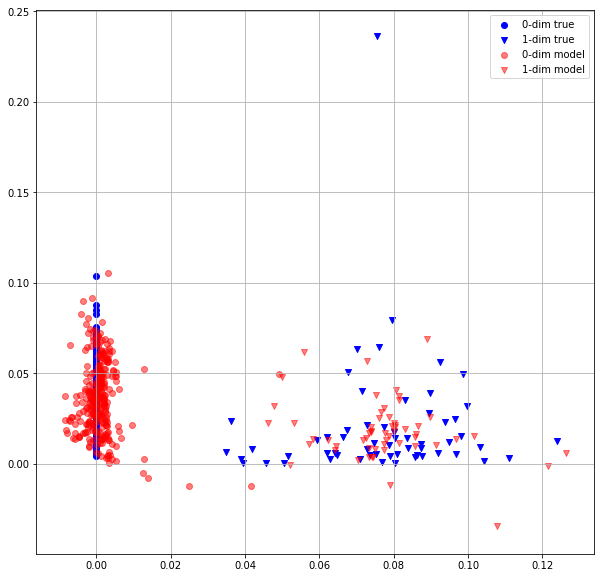

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  17 0.0169104692 0.0160562471


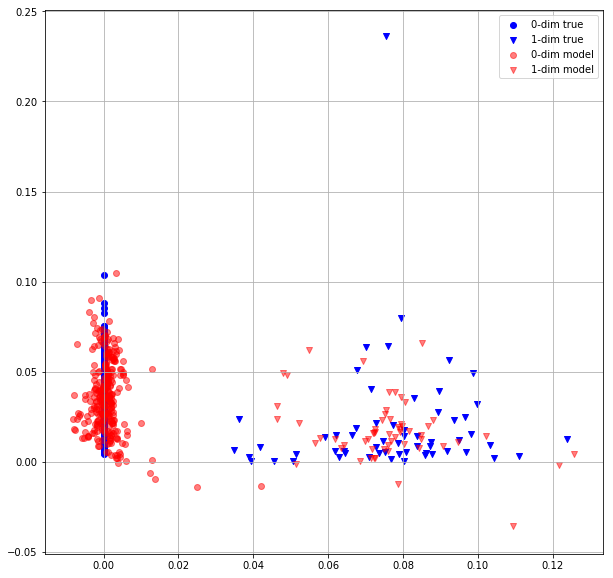

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  18 0.0159345511 0.0151256733


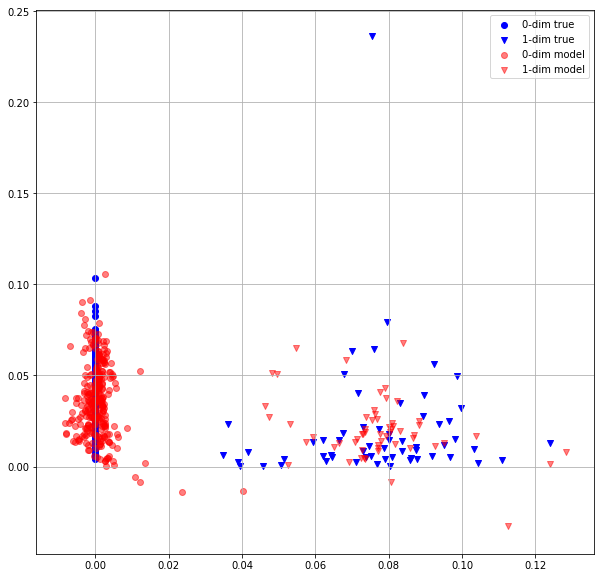

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  19 0.0147860171 0.0141844628


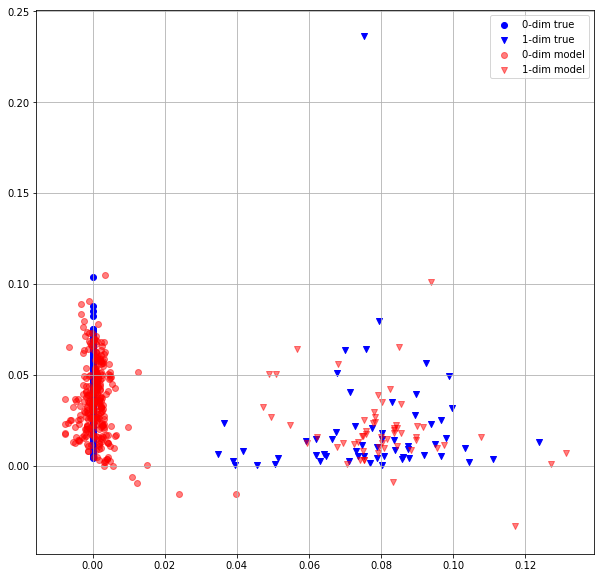

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  20 0.0141382487 0.0138260126


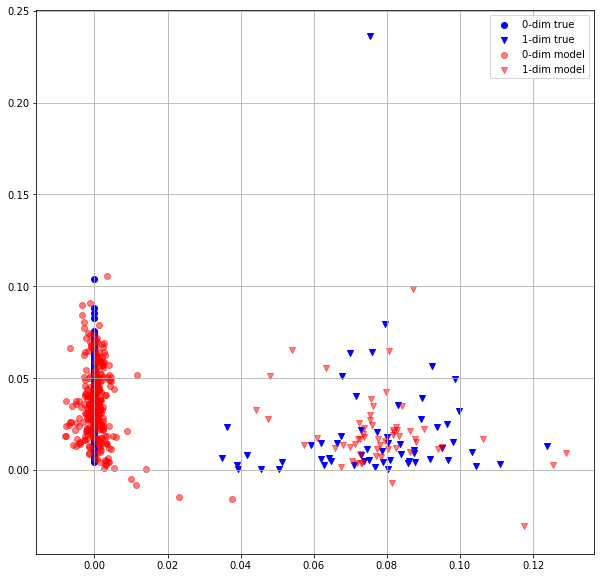

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  21 0.0133126043 0.0127594592


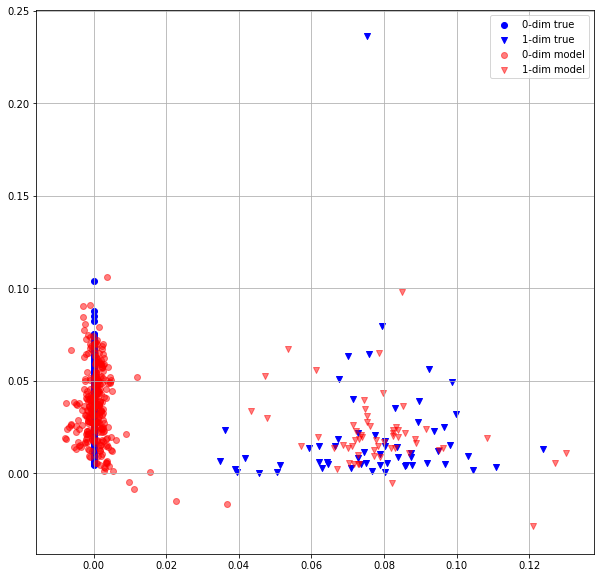

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  22 0.0123746945 0.0118768187


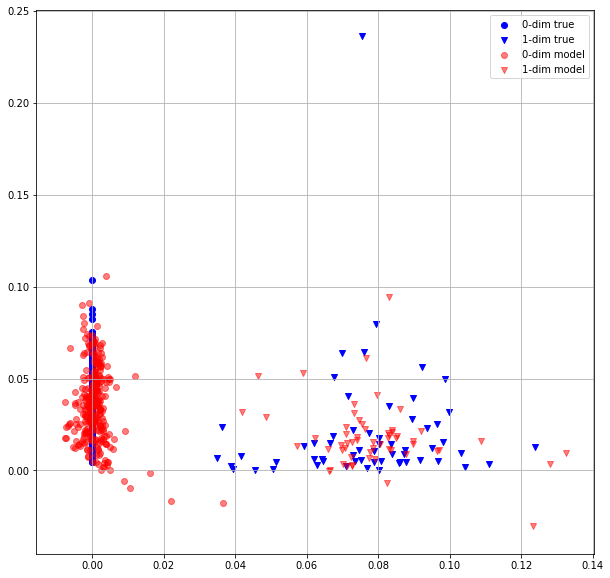

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  23 0.0116520934 0.0111118201


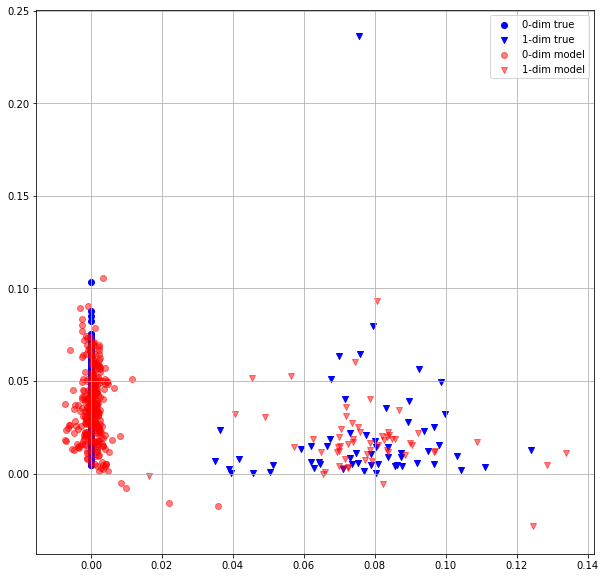

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  24 0.0110350670 0.0107251024


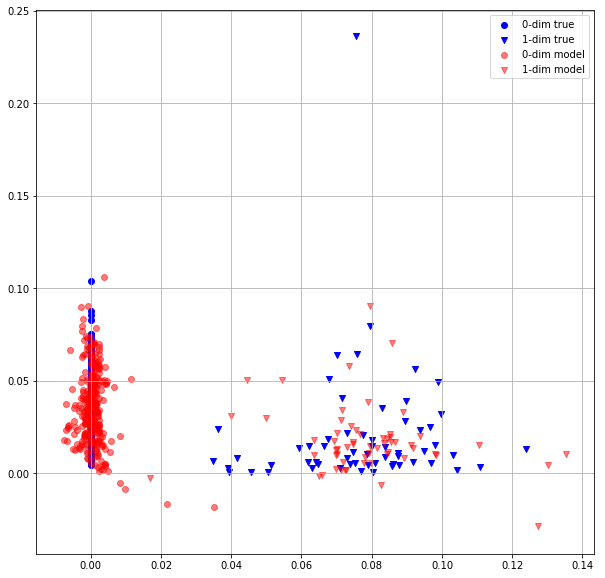

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  25 0.0105542373 0.0103312302


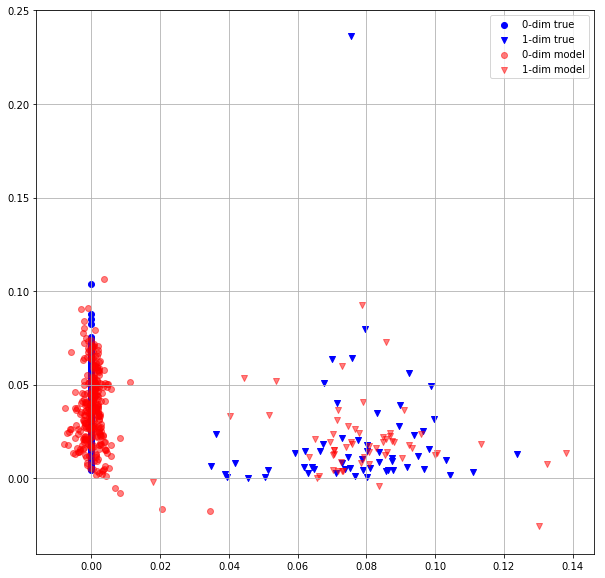

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  26 0.0102574648 0.0097856335


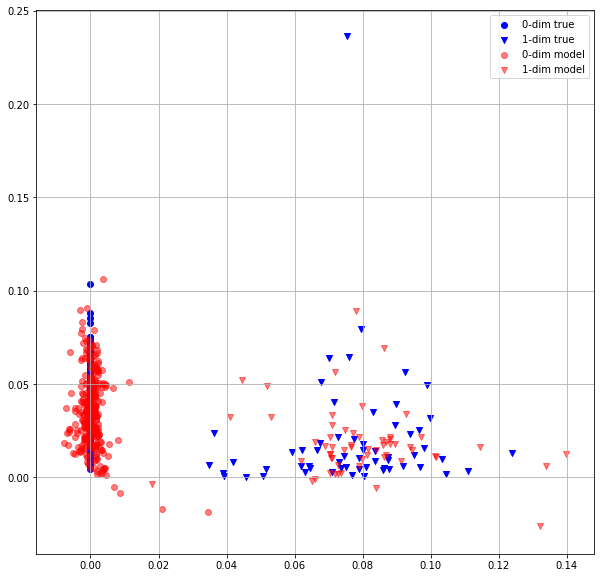

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  27 0.0098369261 0.0098909521


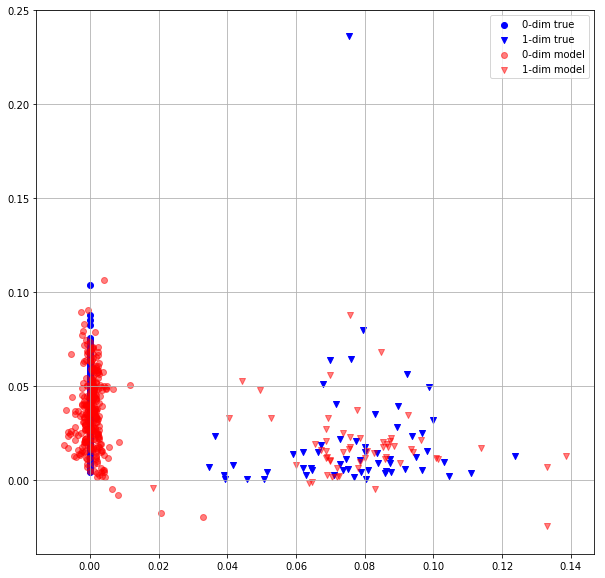

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  28 0.0099126045 0.0092772553


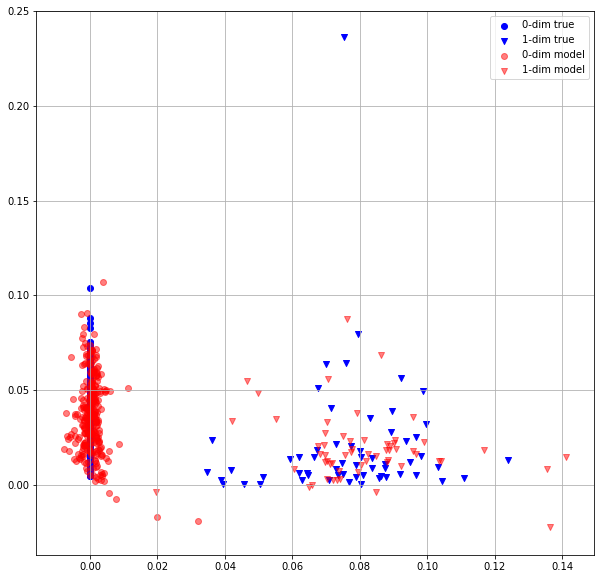

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch:  29 0.0097049130 0.0091965571


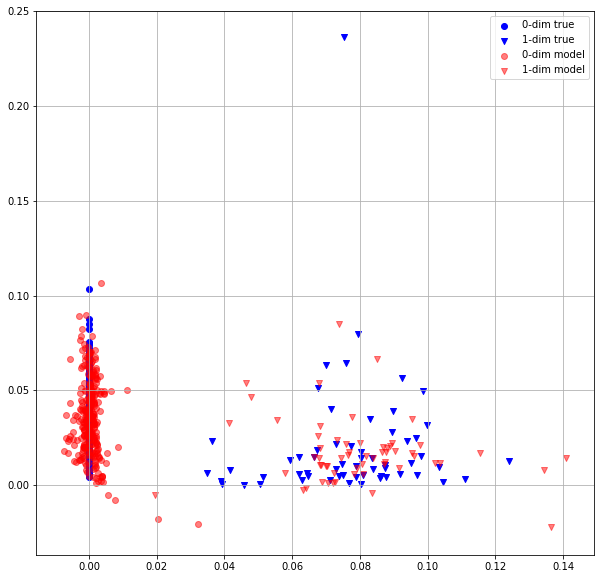

In [5]:
#60 epochs DeepSets + MLPGen w/ Top-N on default hungarian
for epoch_idx in range(n_epochs):
        
    # train
    model.train()
        
    loss = 0
    for batch in tqdm(dataloader_train):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        tgt = model(src, mask)
        loss_batch = criterion_hungarian(src.to(torch.float), tgt)
        loss_batch.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss += loss_batch.detach().cpu()
        
    loss_train = loss / len(dataloader_train.dataset)
        
    # test
    model.eval()
    loss = 0
    for batch in tqdm(dataloader_test):
        src = batch[0].to(device)
        mask = batch[1].to(device)
        
        with torch.no_grad():
            tgt = model(src, mask)
            loss_batch = criterion_hungarian(src.to(torch.float), tgt)
            loss += loss_batch
            
            
    loss_test = loss / len(dataloader_test.dataset)
        
    print("Epoch: {:3} {:.10f} {:.10f}".format(epoch_idx, loss_train, loss_test))
    item = dataset_test[0].reshape(1, -1, 3)
    mask = np.ones((1, item.shape[1]))

    d_mask0 = (item[0, :, 2] == 0)
    d_mask1 = (item[0, :, 2] == 1)

    pred = model(torch.tensor(item, dtype=torch.float).to(device), torch.tensor(mask).long().to(device)).detach().cpu().numpy()
    
    m = (pred[0, :, 2] > 0.5)
    mask0 = (m == 0)
    mask1 = (m == 1)
    #m = np.argmax(pred[0, :, 2:], axis = 1)
    #mask0 = (m == 0)
    #mask1 = (m == 1)

    plt.figure(figsize=(10, 10))

    plt.scatter(item[0, d_mask0, 0], item[0, d_mask0, 1], label = '0-dim true', marker = "o", c = "b")
    plt.scatter(item[0, d_mask1, 0], item[0, d_mask1, 1], label = '1-dim true', marker = "v", c = "b")


    plt.scatter(pred[0, mask0, 0], pred[0, mask0, 1], label = '0-dim model', alpha = 0.5, marker = "o", c = "r")
    plt.scatter(pred[0, mask1, 0], pred[0, mask1, 1], label = '1-dim model', alpha = 0.5, marker = "v", c = "r")
    plt.grid()
    plt.legend()
    plt.show()